## Germany Offshore Wind Cut Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\20240405_20nodes\\elec_s_20_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_20_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [3]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [4]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 20 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 27 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 28 entries
Component 'Load' has 20 entries
Component 'Generator' has 261 entries
Component 'StorageUnit' has 65 entries


In [5]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.startswith('DE') & n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [6]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [7]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]
INFO:linopy.io: Writing time: 39.98s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hcit5ntf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hcit5ntf.lp


Reading time = 11.91 seconds


INFO:gurobipy:Reading time = 11.91 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0x61697209


INFO:gurobipy:Model fingerprint: 0x61697209


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


Presolve removed 2121745 rows and 372364 columns


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns


Presolve time: 7.72s


INFO:gurobipy:Presolve time: 7.72s


Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 16.81s


INFO:gurobipy:Ordering time: 16.81s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 181


INFO:gurobipy: Dense cols : 181


 AA' NZ     : 4.035e+06


INFO:gurobipy: AA' NZ     : 4.035e+06


 Factor NZ  : 2.941e+07 (roughly 1.2 GB of memory)


INFO:gurobipy: Factor NZ  : 2.941e+07 (roughly 1.2 GB of memory)


 Factor Ops : 6.354e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.354e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.31157124e+17 -8.63354864e+18  2.85e+10 9.06e+04  8.83e+13    30s


INFO:gurobipy:   0   6.31157124e+17 -8.63354864e+18  2.85e+10 9.06e+04  8.83e+13    30s


   1   5.51458664e+17 -3.71126918e+18  1.77e+10 3.08e+04  5.63e+13    32s


INFO:gurobipy:   1   5.51458664e+17 -3.71126918e+18  1.77e+10 3.08e+04  5.63e+13    32s


   2   4.54011429e+17 -1.88917555e+18  1.41e+10 1.23e+04  3.89e+13    36s


INFO:gurobipy:   2   4.54011429e+17 -1.88917555e+18  1.41e+10 1.23e+04  3.89e+13    36s


   3   3.43180565e+17 -1.41946105e+18  9.28e+09 7.90e+03  2.50e+13    39s


INFO:gurobipy:   3   3.43180565e+17 -1.41946105e+18  9.28e+09 7.90e+03  2.50e+13    39s


   4   2.83738437e+17 -7.56568029e+17  4.86e+09 2.98e+03  1.25e+13    42s


INFO:gurobipy:   4   2.83738437e+17 -7.56568029e+17  4.86e+09 2.98e+03  1.25e+13    42s


   5   2.26118710e+17 -2.64872401e+17  1.84e+09 7.83e+02  4.50e+12    44s


INFO:gurobipy:   5   2.26118710e+17 -2.64872401e+17  1.84e+09 7.83e+02  4.50e+12    44s


   6   1.35222323e+17 -5.53237846e+16  4.83e+08 1.16e+02  1.15e+12    47s


INFO:gurobipy:   6   1.35222323e+17 -5.53237846e+16  4.83e+08 1.16e+02  1.15e+12    47s


   7   2.28256107e+16 -8.54538102e+15  6.64e+06 2.19e+00  2.73e+10    51s


INFO:gurobipy:   7   2.28256107e+16 -8.54538102e+15  6.64e+06 2.19e+00  2.73e+10    51s


   8   2.91979562e+15 -1.32124122e+15  7.02e+05 1.29e-01  3.12e+09    53s


INFO:gurobipy:   8   2.91979562e+15 -1.32124122e+15  7.02e+05 1.29e-01  3.12e+09    53s


   9   1.61348842e+15 -8.30010086e+14  3.60e+05 6.04e-02  1.66e+09    55s


INFO:gurobipy:   9   1.61348842e+15 -8.30010086e+14  3.60e+05 6.04e-02  1.66e+09    55s


  10   1.35911604e+15 -5.59390786e+14  2.97e+05 3.24e-02  1.29e+09    58s


INFO:gurobipy:  10   1.35911604e+15 -5.59390786e+14  2.97e+05 3.24e-02  1.29e+09    58s


  11   7.75630251e+14 -3.53498737e+14  1.61e+05 1.54e-02  7.18e+08    61s


INFO:gurobipy:  11   7.75630251e+14 -3.53498737e+14  1.61e+05 1.54e-02  7.18e+08    61s


  12   6.10073702e+14 -1.38289402e+14  1.22e+05 1.48e-03  4.67e+08    63s


INFO:gurobipy:  12   6.10073702e+14 -1.38289402e+14  1.22e+05 1.48e-03  4.67e+08    63s


  13   3.97725550e+14 -6.93846975e+13  7.53e+04 6.60e-05  2.74e+08    66s


INFO:gurobipy:  13   3.97725550e+14 -6.93846975e+13  7.53e+04 6.60e-05  2.74e+08    66s


  14   1.81848850e+14 -2.93036011e+13  2.78e+04 1.28e-04  1.14e+08    69s


INFO:gurobipy:  14   1.81848850e+14 -2.93036011e+13  2.78e+04 1.28e-04  1.14e+08    69s


  15   4.63160681e+13 -1.13997956e+13  2.09e+03 2.81e-05  2.84e+07    72s


INFO:gurobipy:  15   4.63160681e+13 -1.13997956e+13  2.09e+03 2.81e-05  2.84e+07    72s


  16   1.82917956e+13 -8.31382949e+12  8.01e+02 1.94e-05  1.24e+07    74s


INFO:gurobipy:  16   1.82917956e+13 -8.31382949e+12  8.01e+02 1.94e-05  1.24e+07    74s


  17   1.10627860e+13 -6.91851544e+12  4.81e+02 1.47e-05  8.16e+06    77s


INFO:gurobipy:  17   1.10627860e+13 -6.91851544e+12  4.81e+02 1.47e-05  8.16e+06    77s


  18   7.96947901e+12 -6.30291485e+12  3.50e+02 1.20e-05  6.37e+06    80s


INFO:gurobipy:  18   7.96947901e+12 -6.30291485e+12  3.50e+02 1.20e-05  6.37e+06    80s


  19   4.58792449e+12 -4.72300730e+12  1.95e+02 8.55e-06  4.03e+06    83s


INFO:gurobipy:  19   4.58792449e+12 -4.72300730e+12  1.95e+02 8.55e-06  4.03e+06    83s


  20   2.74552537e+12 -4.49619093e+12  1.16e+02 8.15e-06  3.07e+06    86s


INFO:gurobipy:  20   2.74552537e+12 -4.49619093e+12  1.16e+02 8.15e-06  3.07e+06    86s


  21   1.62406758e+12 -3.03273530e+12  5.93e+01 5.46e-06  1.93e+06    89s


INFO:gurobipy:  21   1.62406758e+12 -3.03273530e+12  5.93e+01 5.46e-06  1.93e+06    89s


  22   1.04086591e+12 -2.06170517e+12  3.52e+01 3.76e-06  1.27e+06    93s


INFO:gurobipy:  22   1.04086591e+12 -2.06170517e+12  3.52e+01 3.76e-06  1.27e+06    93s


  23   6.41931981e+11 -1.52095841e+12  1.90e+01 2.84e-06  8.77e+05    96s


INFO:gurobipy:  23   6.41931981e+11 -1.52095841e+12  1.90e+01 2.84e-06  8.77e+05    96s


  24   4.38837530e+11 -1.01386303e+12  1.10e+01 2.00e-06  5.86e+05    99s


INFO:gurobipy:  24   4.38837530e+11 -1.01386303e+12  1.10e+01 2.00e-06  5.86e+05    99s


  25   4.29500145e+11 -9.40410895e+11  1.07e+01 1.87e-06  5.52e+05   101s


INFO:gurobipy:  25   4.29500145e+11 -9.40410895e+11  1.07e+01 1.87e-06  5.52e+05   101s


  26   3.15933489e+11 -5.91600951e+11  6.96e+00 1.20e-06  3.65e+05   104s


INFO:gurobipy:  26   3.15933489e+11 -5.91600951e+11  6.96e+00 1.20e-06  3.65e+05   104s


  27   2.43461664e+11 -3.06974439e+11  4.73e+00 6.56e-07  2.21e+05   107s


INFO:gurobipy:  27   2.43461664e+11 -3.06974439e+11  4.73e+00 6.56e-07  2.21e+05   107s


  28   1.81568049e+11 -2.01432424e+11  2.97e+00 4.63e-07  1.53e+05   110s


INFO:gurobipy:  28   1.81568049e+11 -2.01432424e+11  2.97e+00 4.63e-07  1.53e+05   110s


  29   1.47688052e+11 -3.25756298e+10  2.07e+00 1.49e-07  7.22e+04   114s


INFO:gurobipy:  29   1.47688052e+11 -3.25756298e+10  2.07e+00 1.49e-07  7.22e+04   114s


  30   1.16305615e+11  3.78568294e+09  1.33e+00 8.45e-08  4.50e+04   117s


INFO:gurobipy:  30   1.16305615e+11  3.78568294e+09  1.33e+00 8.45e-08  4.50e+04   117s


  31   1.06934615e+11  1.53041595e+10  1.12e+00 6.31e-08  3.67e+04   122s


INFO:gurobipy:  31   1.06934615e+11  1.53041595e+10  1.12e+00 6.31e-08  3.67e+04   122s


  32   1.04032349e+11  2.16699393e+10  1.06e+00 5.23e-08  3.29e+04   125s


INFO:gurobipy:  32   1.04032349e+11  2.16699393e+10  1.06e+00 5.23e-08  3.29e+04   125s


  33   9.69853961e+10  2.64807408e+10  9.03e-01 4.35e-08  2.82e+04   128s


INFO:gurobipy:  33   9.69853961e+10  2.64807408e+10  9.03e-01 4.35e-08  2.82e+04   128s


  34   8.79203368e+10  2.99054913e+10  7.18e-01 3.95e-08  2.32e+04   132s


INFO:gurobipy:  34   8.79203368e+10  2.99054913e+10  7.18e-01 3.95e-08  2.32e+04   132s


  35   8.20614197e+10  3.44994763e+10  5.99e-01 3.01e-08  1.90e+04   136s


INFO:gurobipy:  35   8.20614197e+10  3.44994763e+10  5.99e-01 3.01e-08  1.90e+04   136s


  36   7.75405160e+10  3.89908811e+10  5.05e-01 2.22e-08  1.54e+04   142s


INFO:gurobipy:  36   7.75405160e+10  3.89908811e+10  5.05e-01 2.22e-08  1.54e+04   142s


  37   7.23921699e+10  4.17940448e+10  3.99e-01 1.96e-08  1.22e+04   147s


INFO:gurobipy:  37   7.23921699e+10  4.17940448e+10  3.99e-01 1.96e-08  1.22e+04   147s


  38   6.77117200e+10  4.44347006e+10  2.98e-01 1.52e-08  9.31e+03   151s


INFO:gurobipy:  38   6.77117200e+10  4.44347006e+10  2.98e-01 1.52e-08  9.31e+03   151s


  39   6.49658757e+10  4.63008898e+10  2.39e-01 1.03e-08  7.46e+03   155s


INFO:gurobipy:  39   6.49658757e+10  4.63008898e+10  2.39e-01 1.03e-08  7.46e+03   155s


  40   6.24770146e+10  4.83234493e+10  1.85e-01 9.42e-09  5.66e+03   159s


INFO:gurobipy:  40   6.24770146e+10  4.83234493e+10  1.85e-01 9.42e-09  5.66e+03   159s


  41   6.15383370e+10  4.94934328e+10  1.66e-01 6.34e-09  4.82e+03   163s


INFO:gurobipy:  41   6.15383370e+10  4.94934328e+10  1.66e-01 6.34e-09  4.82e+03   163s


  42   5.98720565e+10  5.04034990e+10  1.32e-01 4.55e-09  3.79e+03   166s


INFO:gurobipy:  42   5.98720565e+10  5.04034990e+10  1.32e-01 4.55e-09  3.79e+03   166s


  43   5.88434754e+10  5.10195734e+10  1.10e-01 3.97e-09  3.13e+03   170s


INFO:gurobipy:  43   5.88434754e+10  5.10195734e+10  1.10e-01 3.97e-09  3.13e+03   170s


  44   5.77190189e+10  5.15753594e+10  8.67e-02 3.23e-09  2.46e+03   174s


INFO:gurobipy:  44   5.77190189e+10  5.15753594e+10  8.67e-02 3.23e-09  2.46e+03   174s


  45   5.67929840e+10  5.19043347e+10  6.71e-02 3.19e-09  1.95e+03   178s


INFO:gurobipy:  45   5.67929840e+10  5.19043347e+10  6.71e-02 3.19e-09  1.95e+03   178s


  46   5.63532644e+10  5.20774182e+10  5.81e-02 8.54e-09  1.71e+03   182s


INFO:gurobipy:  46   5.63532644e+10  5.20774182e+10  5.81e-02 8.54e-09  1.71e+03   182s


  47   5.58355045e+10  5.23522070e+10  4.72e-02 3.12e-08  1.39e+03   186s


INFO:gurobipy:  47   5.58355045e+10  5.23522070e+10  4.72e-02 3.12e-08  1.39e+03   186s


  48   5.56260213e+10  5.25602548e+10  4.31e-02 5.61e-08  1.23e+03   191s


INFO:gurobipy:  48   5.56260213e+10  5.25602548e+10  4.31e-02 5.61e-08  1.23e+03   191s


  49   5.54710674e+10  5.26135160e+10  4.00e-02 6.41e-08  1.14e+03   195s


INFO:gurobipy:  49   5.54710674e+10  5.26135160e+10  4.00e-02 6.41e-08  1.14e+03   195s


  50   5.53559062e+10  5.27013815e+10  3.76e-02 7.14e-08  1.06e+03   199s


INFO:gurobipy:  50   5.53559062e+10  5.27013815e+10  3.76e-02 7.14e-08  1.06e+03   199s


  51   5.51806220e+10  5.27552818e+10  3.37e-02 7.59e-08  9.70e+02   203s


INFO:gurobipy:  51   5.51806220e+10  5.27552818e+10  3.37e-02 7.59e-08  9.70e+02   203s


  52   5.49807490e+10  5.28632526e+10  2.97e-02 9.08e-08  8.47e+02   208s


INFO:gurobipy:  52   5.49807490e+10  5.28632526e+10  2.97e-02 9.08e-08  8.47e+02   208s


  53   5.48689410e+10  5.29293571e+10  2.73e-02 9.87e-08  7.76e+02   212s


INFO:gurobipy:  53   5.48689410e+10  5.29293571e+10  2.73e-02 9.87e-08  7.76e+02   212s


  54   5.47269476e+10  5.30280365e+10  2.43e-02 1.12e-07  6.79e+02   216s


INFO:gurobipy:  54   5.47269476e+10  5.30280365e+10  2.43e-02 1.12e-07  6.79e+02   216s


  55   5.45884440e+10  5.31069918e+10  2.15e-02 1.20e-07  5.92e+02   220s


INFO:gurobipy:  55   5.45884440e+10  5.31069918e+10  2.15e-02 1.20e-07  5.92e+02   220s


  56   5.44171176e+10  5.31676257e+10  1.79e-02 1.30e-07  5.00e+02   225s


INFO:gurobipy:  56   5.44171176e+10  5.31676257e+10  1.79e-02 1.30e-07  5.00e+02   225s


  57   5.42802549e+10  5.32359772e+10  1.50e-02 1.35e-07  4.18e+02   229s


INFO:gurobipy:  57   5.42802549e+10  5.32359772e+10  1.50e-02 1.35e-07  4.18e+02   229s


  58   5.41063097e+10  5.32603856e+10  1.15e-02 1.34e-07  3.38e+02   233s


INFO:gurobipy:  58   5.41063097e+10  5.32603856e+10  1.15e-02 1.34e-07  3.38e+02   233s


  59   5.39932143e+10  5.33052204e+10  9.18e-03 1.34e-07  2.75e+02   237s


INFO:gurobipy:  59   5.39932143e+10  5.33052204e+10  9.18e-03 1.34e-07  2.75e+02   237s


  60   5.39091711e+10  5.33312836e+10  7.47e-03 1.33e-07  2.31e+02   241s


INFO:gurobipy:  60   5.39091711e+10  5.33312836e+10  7.47e-03 1.33e-07  2.31e+02   241s


  61   5.38574914e+10  5.33410201e+10  6.42e-03 1.31e-07  2.07e+02   246s


INFO:gurobipy:  61   5.38574914e+10  5.33410201e+10  6.42e-03 1.31e-07  2.07e+02   246s


  62   5.38264688e+10  5.33653237e+10  5.78e-03 1.25e-07  1.84e+02   250s


INFO:gurobipy:  62   5.38264688e+10  5.33653237e+10  5.78e-03 1.25e-07  1.84e+02   250s


  63   5.37630379e+10  5.34016462e+10  4.49e-03 1.23e-07  1.45e+02   256s


INFO:gurobipy:  63   5.37630379e+10  5.34016462e+10  4.49e-03 1.23e-07  1.45e+02   256s


  64   5.37322524e+10  5.34193020e+10  3.87e-03 1.18e-07  1.25e+02   262s


INFO:gurobipy:  64   5.37322524e+10  5.34193020e+10  3.87e-03 1.18e-07  1.25e+02   262s


  65   5.37186713e+10  5.34322797e+10  3.59e-03 1.14e-07  1.15e+02   266s


INFO:gurobipy:  65   5.37186713e+10  5.34322797e+10  3.59e-03 1.14e-07  1.15e+02   266s


  66   5.37104631e+10  5.34393334e+10  3.43e-03 1.12e-07  1.08e+02   269s


INFO:gurobipy:  66   5.37104631e+10  5.34393334e+10  3.43e-03 1.12e-07  1.08e+02   269s


  67   5.36751064e+10  5.34568664e+10  2.73e-03 1.07e-07  8.73e+01   273s


INFO:gurobipy:  67   5.36751064e+10  5.34568664e+10  2.73e-03 1.07e-07  8.73e+01   273s


  68   5.36626366e+10  5.34678003e+10  2.48e-03 1.01e-07  7.79e+01   277s


INFO:gurobipy:  68   5.36626366e+10  5.34678003e+10  2.48e-03 1.01e-07  7.79e+01   277s


  69   5.36439509e+10  5.34785249e+10  2.11e-03 9.61e-08  6.61e+01   280s


INFO:gurobipy:  69   5.36439509e+10  5.34785249e+10  2.11e-03 9.61e-08  6.61e+01   280s


  70   5.36278603e+10  5.34831749e+10  1.80e-03 9.29e-08  5.79e+01   285s


INFO:gurobipy:  70   5.36278603e+10  5.34831749e+10  1.80e-03 9.29e-08  5.79e+01   285s


  71   5.36104318e+10  5.34926503e+10  1.46e-03 8.39e-08  4.71e+01   289s


INFO:gurobipy:  71   5.36104318e+10  5.34926503e+10  1.46e-03 8.39e-08  4.71e+01   289s


  72   5.36049844e+10  5.35038623e+10  1.35e-03 6.88e-08  4.04e+01   293s


INFO:gurobipy:  72   5.36049844e+10  5.35038623e+10  1.35e-03 6.88e-08  4.04e+01   293s


  73   5.35961792e+10  5.35067579e+10  1.18e-03 6.61e-08  3.58e+01   298s


INFO:gurobipy:  73   5.35961792e+10  5.35067579e+10  1.18e-03 6.61e-08  3.58e+01   298s


  74   5.35824492e+10  5.35108135e+10  9.19e-04 5.97e-08  2.86e+01   302s


INFO:gurobipy:  74   5.35824492e+10  5.35108135e+10  9.19e-04 5.97e-08  2.86e+01   302s


  75   5.35747358e+10  5.35144237e+10  7.71e-04 5.24e-08  2.41e+01   306s


INFO:gurobipy:  75   5.35747358e+10  5.35144237e+10  7.71e-04 5.24e-08  2.41e+01   306s


  76   5.35691941e+10  5.35177526e+10  6.65e-04 4.47e-08  2.06e+01   310s


INFO:gurobipy:  76   5.35691941e+10  5.35177526e+10  6.65e-04 4.47e-08  2.06e+01   310s


  77   5.35626827e+10  5.35209379e+10  5.40e-04 3.87e-08  1.67e+01   318s


INFO:gurobipy:  77   5.35626827e+10  5.35209379e+10  5.40e-04 3.87e-08  1.67e+01   318s


  78   5.35570911e+10  5.35231066e+10  4.34e-04 3.61e-08  1.36e+01   323s


INFO:gurobipy:  78   5.35570911e+10  5.35231066e+10  4.34e-04 3.61e-08  1.36e+01   323s


  79   5.35542979e+10  5.35241419e+10  3.89e-04 3.44e-08  1.21e+01   327s


INFO:gurobipy:  79   5.35542979e+10  5.35241419e+10  3.89e-04 3.44e-08  1.21e+01   327s


  80   5.35509802e+10  5.35257093e+10  3.85e-04 3.15e-08  1.01e+01   331s


INFO:gurobipy:  80   5.35509802e+10  5.35257093e+10  3.85e-04 3.15e-08  1.01e+01   331s


  81   5.35471903e+10  5.35271543e+10  2.50e-04 2.78e-08  8.01e+00   336s


INFO:gurobipy:  81   5.35471903e+10  5.35271543e+10  2.50e-04 2.78e-08  8.01e+00   336s


  82   5.35455600e+10  5.35287158e+10  2.19e-04 2.43e-08  6.74e+00   340s


INFO:gurobipy:  82   5.35455600e+10  5.35287158e+10  2.19e-04 2.43e-08  6.74e+00   340s


  83   5.35430624e+10  5.35299004e+10  1.74e-04 2.15e-08  5.26e+00   344s


INFO:gurobipy:  83   5.35430624e+10  5.35299004e+10  1.74e-04 2.15e-08  5.26e+00   344s


  84   5.35408063e+10  5.35306991e+10  1.34e-04 1.92e-08  4.04e+00   348s


INFO:gurobipy:  84   5.35408063e+10  5.35306991e+10  1.34e-04 1.92e-08  4.04e+00   348s


  85   5.35388751e+10  5.35314543e+10  1.43e-04 1.68e-08  2.97e+00   352s


INFO:gurobipy:  85   5.35388751e+10  5.35314543e+10  1.43e-04 1.68e-08  2.97e+00   352s


  86   5.35376069e+10  5.35321339e+10  1.89e-04 1.52e-08  2.19e+00   356s


INFO:gurobipy:  86   5.35376069e+10  5.35321339e+10  1.89e-04 1.52e-08  2.19e+00   356s


  87   5.35363642e+10  5.35324977e+10  1.34e-04 1.43e-08  1.55e+00   360s


INFO:gurobipy:  87   5.35363642e+10  5.35324977e+10  1.34e-04 1.43e-08  1.55e+00   360s


  88   5.35355949e+10  5.35328659e+10  1.77e-04 1.29e-08  1.09e+00   364s


INFO:gurobipy:  88   5.35355949e+10  5.35328659e+10  1.77e-04 1.29e-08  1.09e+00   364s


  89   5.35350122e+10  5.35330886e+10  1.11e-04 1.03e-08  7.69e-01   369s


INFO:gurobipy:  89   5.35350122e+10  5.35330886e+10  1.11e-04 1.03e-08  7.69e-01   369s


  90   5.35344997e+10  5.35331733e+10  1.51e-04 1.08e-08  5.30e-01   373s


INFO:gurobipy:  90   5.35344997e+10  5.35331733e+10  1.51e-04 1.08e-08  5.30e-01   373s


  91   5.35343985e+10  5.35333935e+10  1.35e-04 1.16e-08  4.02e-01   378s


INFO:gurobipy:  91   5.35343985e+10  5.35333935e+10  1.35e-04 1.16e-08  4.02e-01   378s


  92   5.35342500e+10  5.35334851e+10  9.55e-05 1.31e-08  3.06e-01   382s


INFO:gurobipy:  92   5.35342500e+10  5.35334851e+10  9.55e-05 1.31e-08  3.06e-01   382s


  93   5.35339605e+10  5.35335730e+10  3.64e-05 7.63e-09  1.55e-01   387s


INFO:gurobipy:  93   5.35339605e+10  5.35335730e+10  3.64e-05 7.63e-09  1.55e-01   387s


  94   5.35338792e+10  5.35336410e+10  2.26e-05 5.16e-09  9.52e-02   392s


INFO:gurobipy:  94   5.35338792e+10  5.35336410e+10  2.26e-05 5.16e-09  9.52e-02   392s


  95   5.35338569e+10  5.35336962e+10  1.89e-05 3.19e-09  6.42e-02   397s


INFO:gurobipy:  95   5.35338569e+10  5.35336962e+10  1.89e-05 3.19e-09  6.42e-02   397s


  96   5.35338125e+10  5.35337044e+10  1.15e-05 2.86e-09  4.32e-02   401s


INFO:gurobipy:  96   5.35338125e+10  5.35337044e+10  1.15e-05 2.86e-09  4.32e-02   401s


  97   5.35338104e+10  5.35337065e+10  1.12e-05 2.76e-09  4.16e-02   404s


INFO:gurobipy:  97   5.35338104e+10  5.35337065e+10  1.12e-05 2.76e-09  4.16e-02   404s


  98   5.35338011e+10  5.35337099e+10  9.63e-06 2.59e-09  3.65e-02   407s


INFO:gurobipy:  98   5.35338011e+10  5.35337099e+10  9.63e-06 2.59e-09  3.65e-02   407s


  99   5.35337951e+10  5.35337139e+10  8.68e-06 2.36e-09  3.25e-02   411s


INFO:gurobipy:  99   5.35337951e+10  5.35337139e+10  8.68e-06 2.36e-09  3.25e-02   411s


 100   5.35337853e+10  5.35337193e+10  7.06e-06 2.04e-09  2.64e-02   414s


INFO:gurobipy: 100   5.35337853e+10  5.35337193e+10  7.06e-06 2.04e-09  2.64e-02   414s


 101   5.35337804e+10  5.35337306e+10  6.30e-06 1.58e-09  1.99e-02   417s


INFO:gurobipy: 101   5.35337804e+10  5.35337306e+10  6.30e-06 1.58e-09  1.99e-02   417s


 102   5.35337627e+10  5.35337336e+10  3.48e-06 1.72e-09  1.17e-02   421s


INFO:gurobipy: 102   5.35337627e+10  5.35337336e+10  3.48e-06 1.72e-09  1.17e-02   421s


 103   5.35337597e+10  5.35337343e+10  3.00e-06 1.22e-09  1.02e-02   425s


INFO:gurobipy: 103   5.35337597e+10  5.35337343e+10  3.00e-06 1.22e-09  1.02e-02   425s


 104   5.35337572e+10  5.35337369e+10  2.59e-06 2.33e-09  8.12e-03   429s


INFO:gurobipy: 104   5.35337572e+10  5.35337369e+10  2.59e-06 2.33e-09  8.12e-03   429s


 105   5.35337495e+10  5.35337379e+10  1.42e-06 1.24e-09  4.66e-03   433s


INFO:gurobipy: 105   5.35337495e+10  5.35337379e+10  1.42e-06 1.24e-09  4.66e-03   433s


 106   5.35337475e+10  5.35337388e+10  1.10e-06 2.71e-09  3.48e-03   438s


INFO:gurobipy: 106   5.35337475e+10  5.35337388e+10  1.10e-06 2.71e-09  3.48e-03   438s


 107   5.35337437e+10  5.35337395e+10  1.86e-04 1.70e-09  1.68e-03   441s


INFO:gurobipy: 107   5.35337437e+10  5.35337395e+10  1.86e-04 1.70e-09  1.68e-03   441s


 108   5.35337422e+10  5.35337398e+10  1.08e-04 1.85e-09  9.59e-04   444s


INFO:gurobipy: 108   5.35337422e+10  5.35337398e+10  1.08e-04 1.85e-09  9.59e-04   444s


 109   5.35337417e+10  5.35337400e+10  7.86e-05 7.15e-09  6.65e-04   448s


INFO:gurobipy: 109   5.35337417e+10  5.35337400e+10  7.86e-05 7.15e-09  6.65e-04   448s


 110   5.35337405e+10  5.35337401e+10  1.80e-05 3.02e-09  1.64e-04   451s


INFO:gurobipy: 110   5.35337405e+10  5.35337401e+10  1.80e-05 3.02e-09  1.64e-04   451s


 111   5.35337402e+10  5.35337401e+10  1.35e-05 1.88e-09  5.15e-05   455s


INFO:gurobipy: 111   5.35337402e+10  5.35337401e+10  1.35e-05 1.88e-09  5.15e-05   455s


 112   5.35337402e+10  5.35337401e+10  6.87e-06 3.46e-09  1.07e-05   457s


INFO:gurobipy: 112   5.35337402e+10  5.35337401e+10  6.87e-06 3.46e-09  1.07e-05   457s


 113   5.35337401e+10  5.35337401e+10  2.17e-06 2.66e-09  1.68e-06   460s


INFO:gurobipy: 113   5.35337401e+10  5.35337401e+10  2.17e-06 2.66e-09  1.68e-06   460s


 114   5.35337401e+10  5.35337401e+10  8.82e-07 3.18e-09  5.97e-07   463s


INFO:gurobipy: 114   5.35337401e+10  5.35337401e+10  8.82e-07 3.18e-09  5.97e-07   463s


 115   5.35337401e+10  5.35337401e+10  5.19e-07 2.19e-08  3.95e-08   466s


INFO:gurobipy: 115   5.35337401e+10  5.35337401e+10  5.19e-07 2.19e-08  3.95e-08   466s


 116   5.35337401e+10  5.35337401e+10  5.49e-09 2.19e-08  6.53e-11   468s


INFO:gurobipy: 116   5.35337401e+10  5.35337401e+10  5.49e-09 2.19e-08  6.53e-11   468s


INFO:gurobipy:


Barrier solved model in 116 iterations and 468.04 seconds (111.79 work units)


INFO:gurobipy:Barrier solved model in 116 iterations and 468.04 seconds (111.79 work units)


Optimal objective 5.35337401e+10


INFO:gurobipy:Optimal objective 5.35337401e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  458079 variables added to crossover basis                      473s


INFO:gurobipy:  458079 variables added to crossover basis                      473s


  559906 variables added to crossover basis                      475s


INFO:gurobipy:  559906 variables added to crossover basis                      475s


  563083 variables added to crossover basis                      480s


INFO:gurobipy:  563083 variables added to crossover basis                      480s


  566102 variables added to crossover basis                      485s


INFO:gurobipy:  566102 variables added to crossover basis                      485s


  567806 variables added to crossover basis                      490s


INFO:gurobipy:  567806 variables added to crossover basis                      490s


  569303 variables added to crossover basis                      495s


INFO:gurobipy:  569303 variables added to crossover basis                      495s


  570713 variables added to crossover basis                      500s


INFO:gurobipy:  570713 variables added to crossover basis                      500s


  572015 variables added to crossover basis                      505s


INFO:gurobipy:  572015 variables added to crossover basis                      505s


  572942 variables added to crossover basis                      510s


INFO:gurobipy:  572942 variables added to crossover basis                      510s


  573961 variables added to crossover basis                      515s


INFO:gurobipy:  573961 variables added to crossover basis                      515s


  574914 variables added to crossover basis                      520s


INFO:gurobipy:  574914 variables added to crossover basis                      520s


  575723 variables added to crossover basis                      525s


INFO:gurobipy:  575723 variables added to crossover basis                      525s


  576592 variables added to crossover basis                      530s


INFO:gurobipy:  576592 variables added to crossover basis                      530s


  577400 variables added to crossover basis                      535s


INFO:gurobipy:  577400 variables added to crossover basis                      535s


  578024 variables added to crossover basis                      540s


INFO:gurobipy:  578024 variables added to crossover basis                      540s


  578710 variables added to crossover basis                      545s


INFO:gurobipy:  578710 variables added to crossover basis                      545s


  579457 variables added to crossover basis                      550s


INFO:gurobipy:  579457 variables added to crossover basis                      550s


  580203 variables added to crossover basis                      555s


INFO:gurobipy:  580203 variables added to crossover basis                      555s


  580859 variables added to crossover basis                      560s


INFO:gurobipy:  580859 variables added to crossover basis                      560s


  581578 variables added to crossover basis                      565s


INFO:gurobipy:  581578 variables added to crossover basis                      565s


  582289 variables added to crossover basis                      570s


INFO:gurobipy:  582289 variables added to crossover basis                      570s


INFO:gurobipy:


  560354 DPushes remaining with DInf 0.0000000e+00               575s


INFO:gurobipy:  560354 DPushes remaining with DInf 0.0000000e+00               575s


   93302 DPushes remaining with DInf 0.0000000e+00               696s


INFO:gurobipy:   93302 DPushes remaining with DInf 0.0000000e+00               696s


   12132 DPushes remaining with DInf 0.0000000e+00               726s


INFO:gurobipy:   12132 DPushes remaining with DInf 0.0000000e+00               726s


    1486 DPushes remaining with DInf 0.0000000e+00               740s


INFO:gurobipy:    1486 DPushes remaining with DInf 0.0000000e+00               740s


     519 DPushes remaining with DInf 0.0000000e+00               743s


INFO:gurobipy:     519 DPushes remaining with DInf 0.0000000e+00               743s


     130 DPushes remaining with DInf 0.0000000e+00               754s


INFO:gurobipy:     130 DPushes remaining with DInf 0.0000000e+00               754s


       0 DPushes remaining with DInf 0.0000000e+00               758s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               758s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


    5624 PPushes remaining with PInf 0.0000000e+00               759s


INFO:gurobipy:    5624 PPushes remaining with PInf 0.0000000e+00               759s


    3969 PPushes remaining with PInf 0.0000000e+00               772s


INFO:gurobipy:    3969 PPushes remaining with PInf 0.0000000e+00               772s


    3567 PPushes remaining with PInf 0.0000000e+00               780s


INFO:gurobipy:    3567 PPushes remaining with PInf 0.0000000e+00               780s


       0 PPushes remaining with PInf 0.0000000e+00               785s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               785s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5288307e-06    785s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5288307e-06    785s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  313088    5.3533740e+10   0.000000e+00   2.514331e-06    786s


INFO:gurobipy:  313088    5.3533740e+10   0.000000e+00   2.514331e-06    786s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  313090    5.3533740e+10   0.000000e+00   6.362884e-06    793s


INFO:gurobipy:  313090    5.3533740e+10   0.000000e+00   6.362884e-06    793s


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  313095    5.3533740e+10   0.000000e+00   0.000000e+00    799s


INFO:gurobipy:  313095    5.3533740e+10   0.000000e+00   0.000000e+00    799s


INFO:gurobipy:


Solved in 313095 iterations and 799.16 seconds (314.18 work units)


INFO:gurobipy:Solved in 313095 iterations and 799.16 seconds (314.18 work units)


Optimal objective  5.353374014e+10


INFO:gurobipy:Optimal objective  5.353374014e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 5.35e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [8]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [9]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


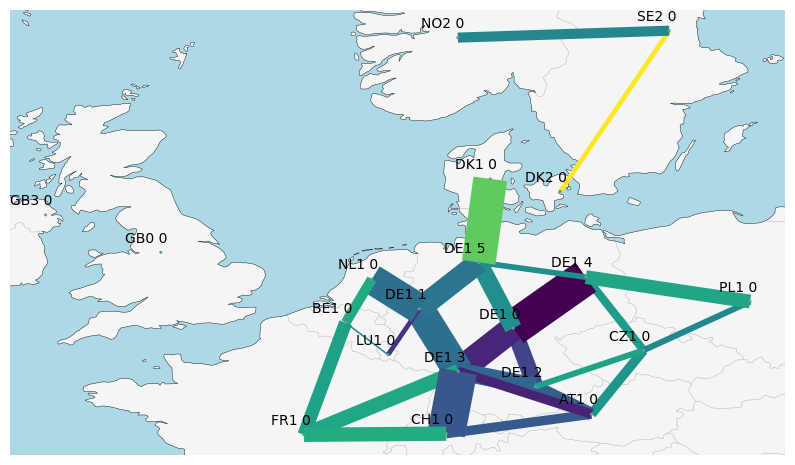

In [10]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [11]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


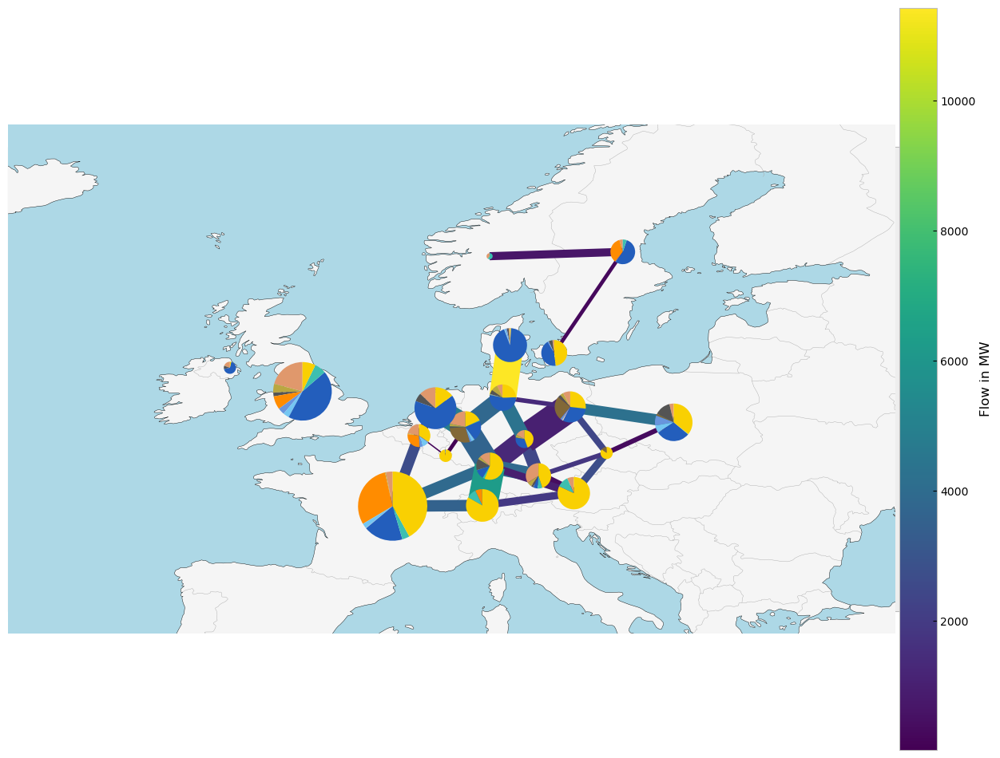

In [12]:
fig, ax = plt.subplots(
    figsize=(15,15),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [13]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


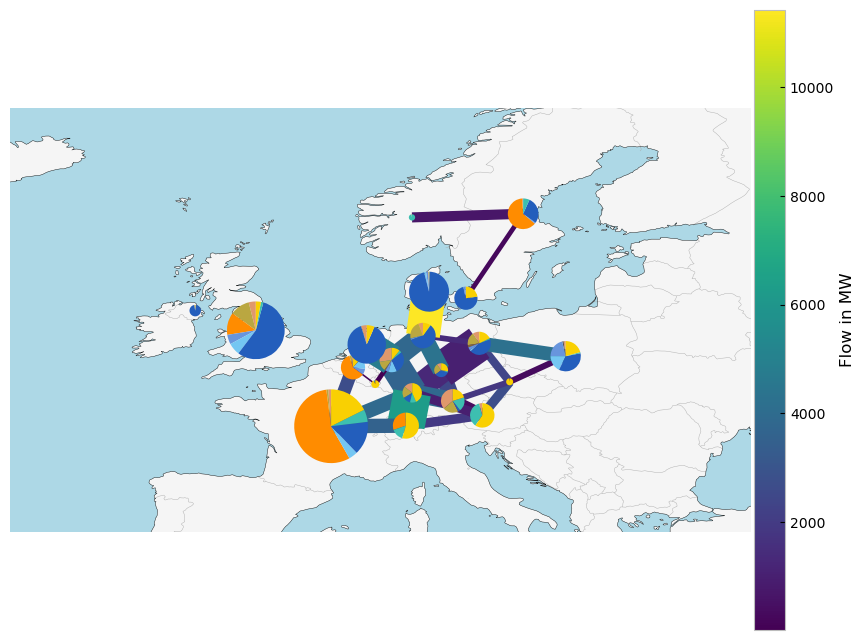

In [14]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

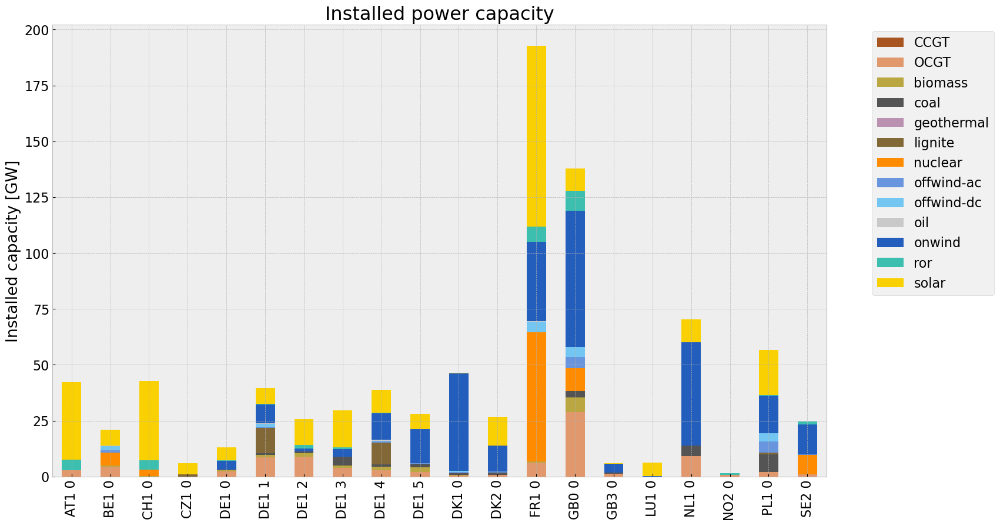

In [15]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

<Figure size 640x480 with 0 Axes>

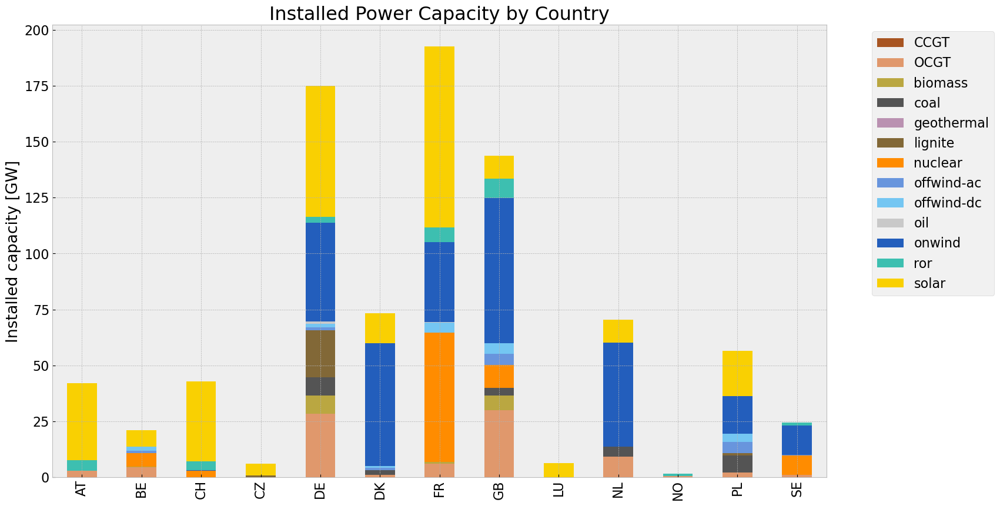

In [16]:
#aggregate installed capacities by country
def inst_cap_table_country(n,colors):

    capacities = n.generators
    capacities['country'] = capacities['bus'].str[:2]
    capacities = capacities.groupby(['country', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed Power Capacity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

cap_base_country= inst_cap_table_country(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

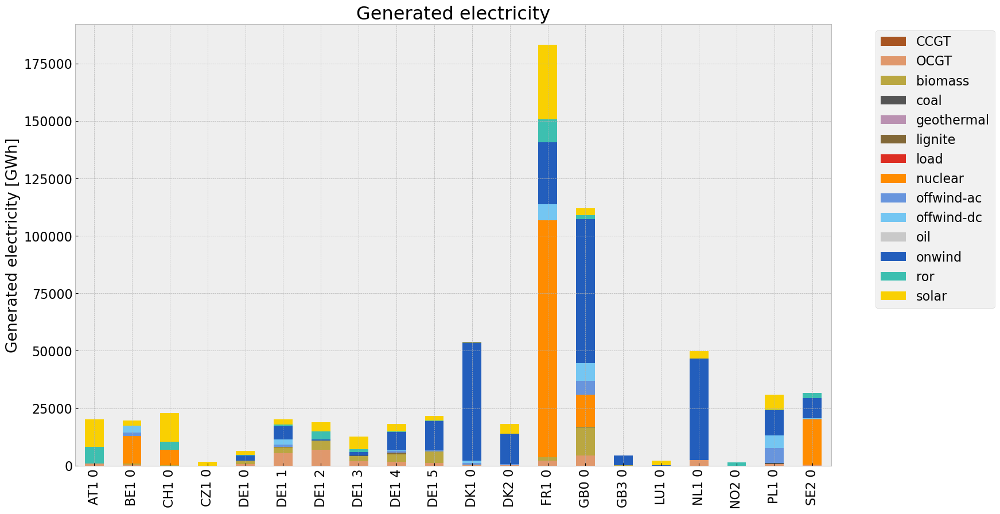

In [17]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

<Figure size 640x480 with 0 Axes>

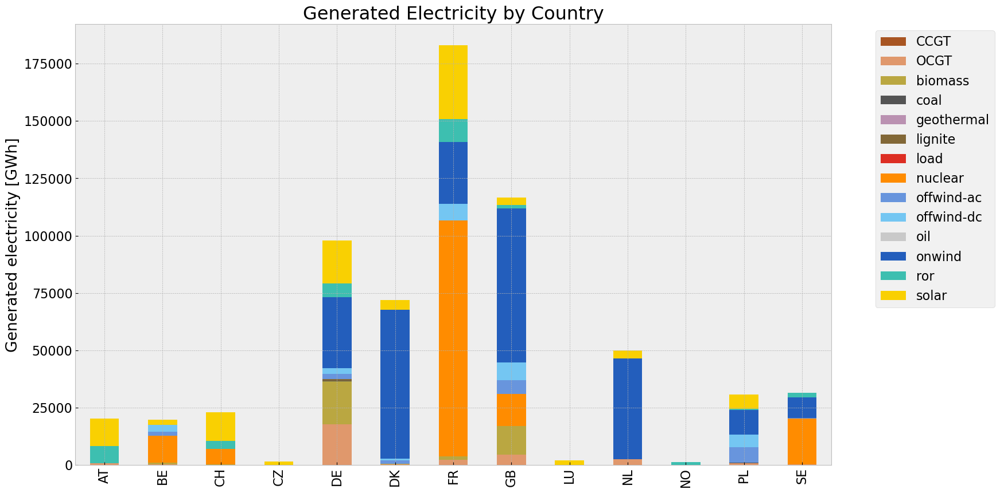

In [18]:
def gen_power_table_country(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    #generations = n.generators
    #generations['country'] = generations['bus'].str[:2]
    #generations = pd.Series(index = n.generators.groupby(['country', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    generations['country'] = generations.index.str[:2]
    generations = generations.groupby(['country']).sum()   
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated Electricity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base_country = gen_power_table_country(n,colors_gen_table)

## Snapshot

In [19]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()

#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\318663498.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\318663498.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [20]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\4040974225.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [21]:
def gen_curve(n, start, end, colors,ctr):

    plt.rcParams.update({'font.size': 16})

    #import export 
    lines_ctr_bus0 = n.lines[n.lines['bus0'].str.startswith(ctr) & ~n.lines['bus1'].str.startswith(ctr)].index
    lines_ctr_bus1 = n.lines[n.lines['bus1'].str.startswith(ctr) & ~n.lines['bus0'].str.startswith(ctr)].index
    links_ctr_bus0 = n.links[n.links['bus0'].str.startswith(ctr) & ~n.links['bus1'].str.startswith(ctr)].index
    links_ctr_bus1 = n.links[n.links['bus1'].str.startswith(ctr) & ~n.links['bus0'].str.startswith(ctr)].index


    df_lines_ctr_bus0 = n.lines_t.p0[lines_ctr_bus0]
    df_lines_ctr_bus1 = n.lines_t.p1[lines_ctr_bus1]
    df_links_ctr_bus0 = n.links_t.p0[links_ctr_bus0]
    df_links_ctr_bus1 = n.links_t.p1[links_ctr_bus1]


    import_export = pd.concat([df_lines_ctr_bus0, df_lines_ctr_bus1, df_links_ctr_bus0, df_links_ctr_bus1], axis=1).sum(axis=1)*-1 #MW

    columns_gen = [col for col in  n.generators_t.p.columns if col.startswith(ctr)]
    p_country = n.generators_t.p[columns_gen]

    p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
    

    #add import color
    colors.append('#133337') #for Import

    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        col_sto = [col for col in  n.storage_units_t.p.columns if col.startswith(ctr)]
        sto_ctr = n.storage_units_t.p[col_sto]
        sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier['Import'] = import_export 
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    col_load = [col for col in  n.loads_t.p_set.columns if col.startswith(ctr)]
    loads_ctr = n.loads_t.p_set[col_load]
    loads = loads_ctr.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [22]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [23]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [24]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [25]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


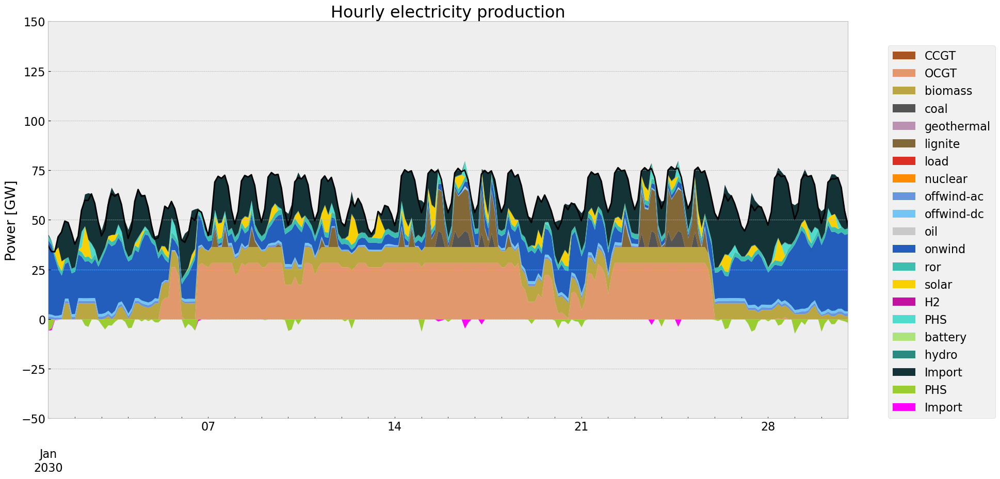

In [26]:
# winter
gen_curve(n, '2030-01-01', '2030-01-31', colors_gen,'DE')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

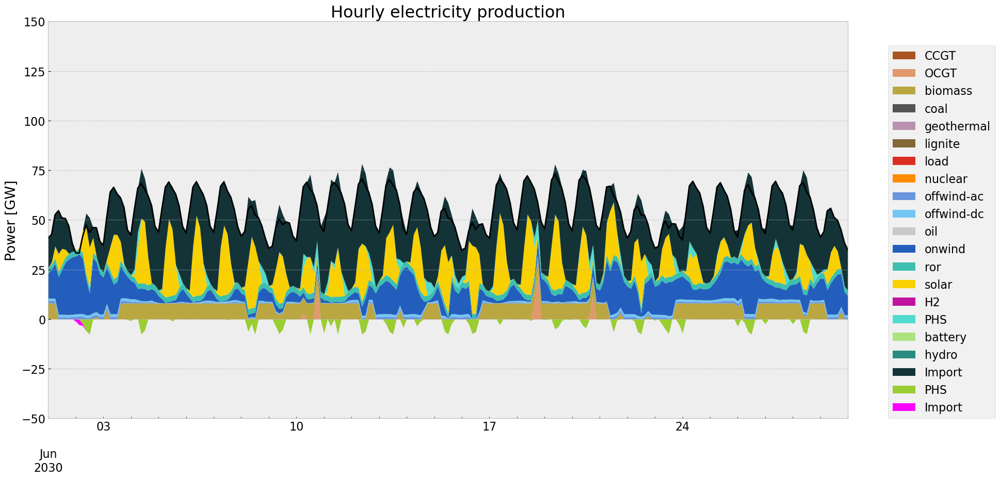

In [27]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen,'DE')

In [28]:
def gen_curve_tot(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
    
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,370)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

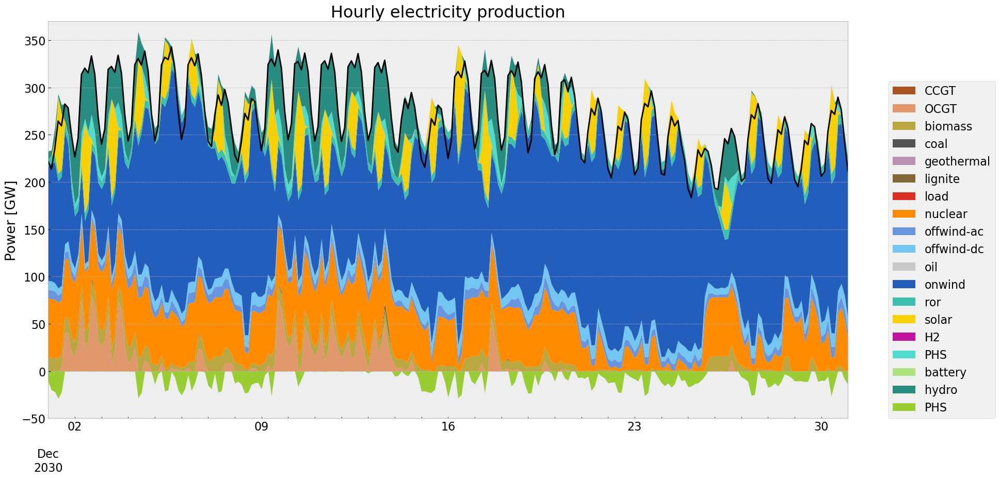

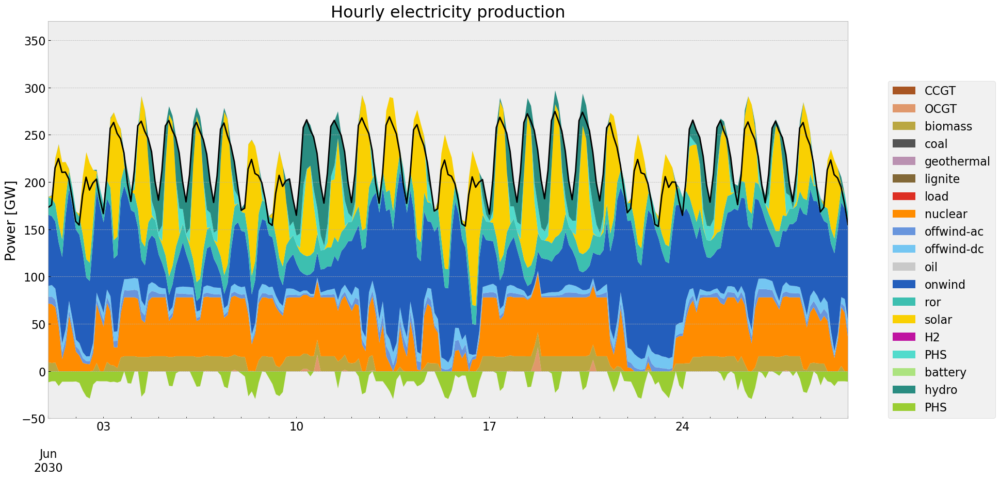

In [29]:
#generation curve all countries
#winter
gen_curve_tot(n, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [30]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})
    storage = n.storage_units
    storage['country'] = storage['bus'].str[:2]

    (storage.groupby(['country','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacities of storage systems By Country",
                                #ylim=[0,20]
    )
    store = storage.groupby(['country','carrier']).p_nom_opt.sum()/1000 #GW
    store.fillna(0, inplace=True)
    return store

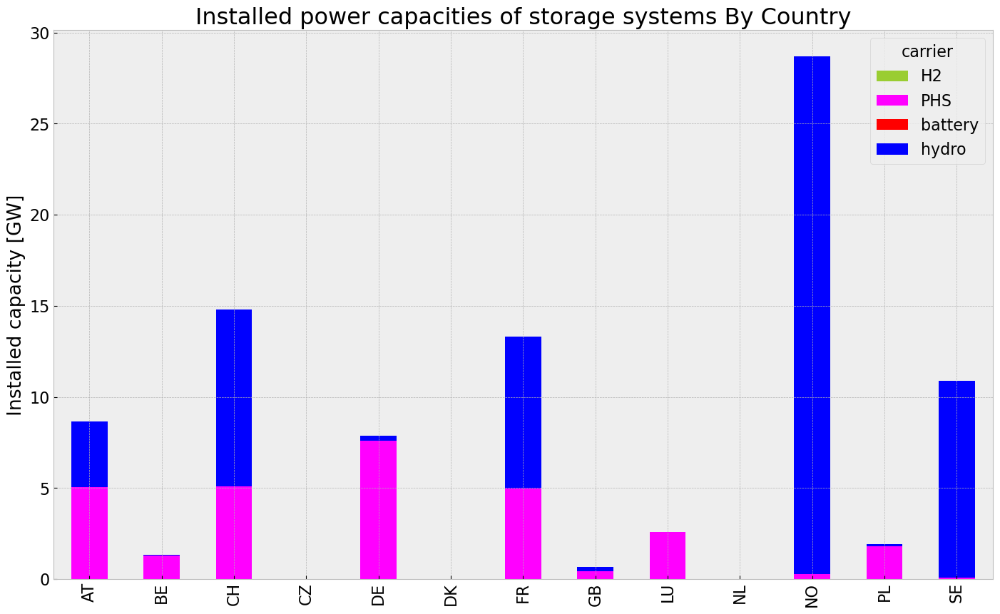

In [31]:
store_base = inst_store_table(n)

In [32]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        title=f"State of charge of aggregated storage systems",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5176\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


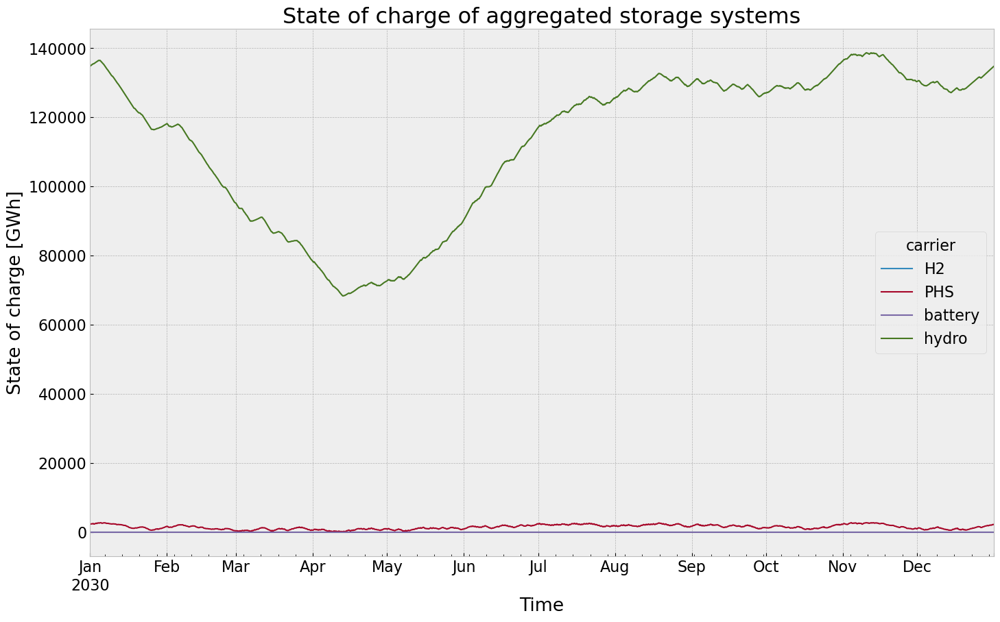

In [33]:
state_of_charge_plot(n)

## Electricity Price

In [34]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [35]:
#columns_to_keep =[]

#for i in n.buses_t.marginal_price.columns.tolist():
    #if not i.endswith('H2'):
        #columns_to_keep.append(i)

#buses without store
#columns_to_keep =[]

#price_dur_curve = pd.DataFrame()
#for region in columns_to_keep:
    #price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


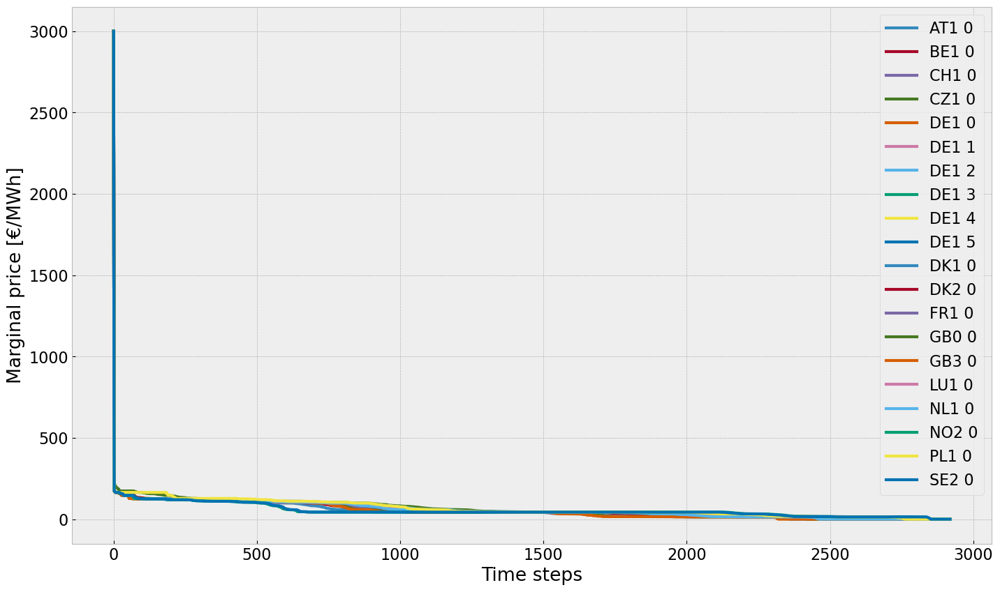

In [36]:
price_dur_curve_plot(n)

In [37]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

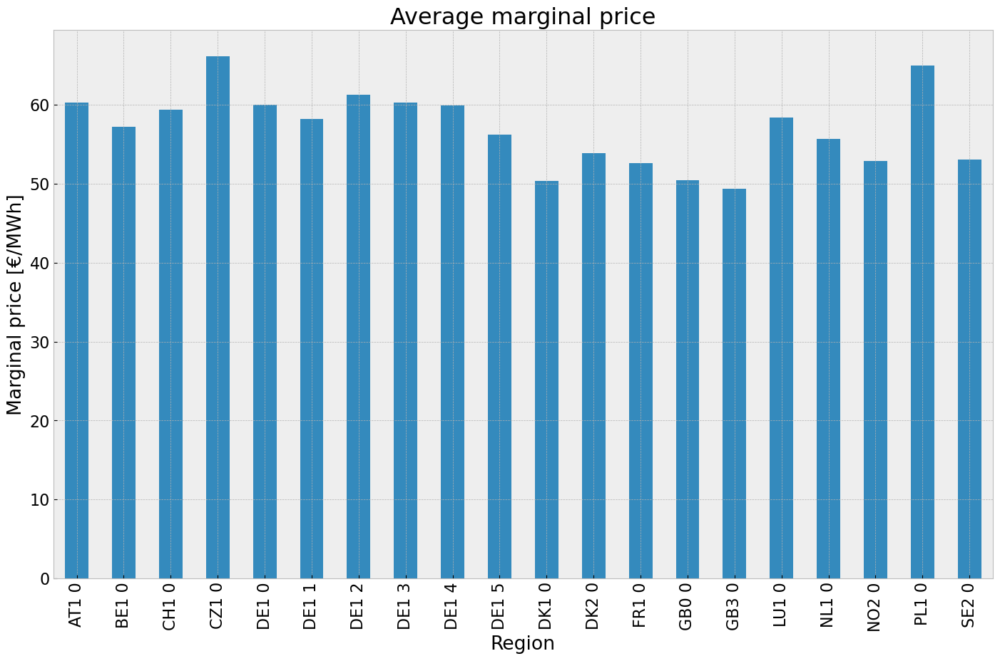

In [38]:
price_regions_table(n)

In [39]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


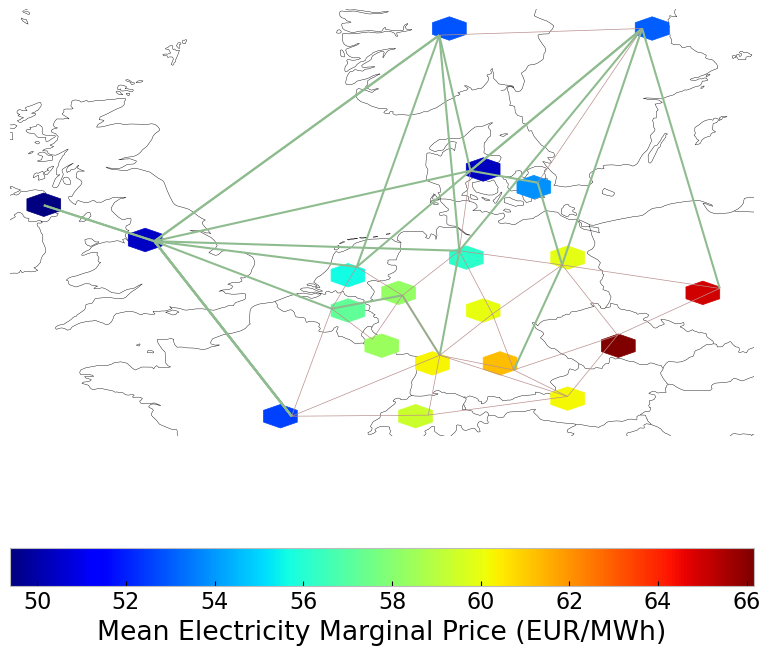

In [40]:
price_regions(n)

## Emission

In [41]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.950103e+07,0.451621,0.1980,1.293387e+07
biomass,3.377481e+07,0.468000,0.0000,0.000000e+00
coal,7.117319e+05,0.329908,0.3361,7.250902e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,9.211707e+05,0.337285,0.4069,1.111300e+06
load,3.775349e+03,1.000000,0.0000,0.000000e+00
nuclear,1.554148e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.794435e+07,1.000000,0.0000,0.000000e+00


# Offshore Wind Cut Scenario



In [42]:
#copy network
n1=n.copy()

#p_max_pu of offwind generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-06-01 00:00:00')
cut_end = pd.to_datetime('2013-12-31 21:00:00')
reduction = 0.1

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * reduction #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

#set the optimal capacity of links from the base scenario as the new minimum capacity 
for index, value in n1.links.p_nom_extendable.items():
    if value:  
        n1.links.at[index, 'p_nom_min'] = n.links.at[index, 'p_nom_opt']
                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [43]:
n1.optimize.create_model()


Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [44]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')


Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:06<00:00,  2.00it/s]
INFO:linopy.io: Writing time: 46.73s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u7e52kx0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u7e52kx0.lp


Reading time = 12.52 seconds


INFO:gurobipy:Reading time = 12.52 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0x98c45a61


INFO:gurobipy:Model fingerprint: 0x98c45a61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 1e+03]


INFO:gurobipy:  Matrix range     [1e-03, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2150043 rows and 372373 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2150043 rows and 372373 columns (presolve time = 5s) ...


Presolve removed 2150043 rows and 372373 columns


INFO:gurobipy:Presolve removed 2150043 rows and 372373 columns


Presolve time: 10.06s


INFO:gurobipy:Presolve time: 10.06s


Presolved: 1114820 rows, 1149129 columns, 3737809 nonzeros


INFO:gurobipy:Presolved: 1114820 rows, 1149129 columns, 3737809 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 16.78s


INFO:gurobipy:Ordering time: 16.78s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 172


INFO:gurobipy: Dense cols : 172


 AA' NZ     : 3.970e+06


INFO:gurobipy: AA' NZ     : 3.970e+06


 Factor NZ  : 2.876e+07 (roughly 1.1 GB of memory)


INFO:gurobipy: Factor NZ  : 2.876e+07 (roughly 1.1 GB of memory)


 Factor Ops : 5.991e+09 (roughly 1 second per iteration)


INFO:gurobipy: Factor Ops : 5.991e+09 (roughly 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.29075012e+17 -9.02197094e+18  3.01e+10 9.53e+04  1.12e+14    33s


INFO:gurobipy:   0   7.29075012e+17 -9.02197094e+18  3.01e+10 9.53e+04  1.12e+14    33s


   1   6.20435786e+17 -4.34675019e+18  2.36e+10 3.31e+04  6.92e+13    37s


INFO:gurobipy:   1   6.20435786e+17 -4.34675019e+18  2.36e+10 3.31e+04  6.92e+13    37s


   2   5.20010012e+17 -2.46124291e+18  1.91e+10 1.38e+04  5.00e+13    43s


INFO:gurobipy:   2   5.20010012e+17 -2.46124291e+18  1.91e+10 1.38e+04  5.00e+13    43s


   3   3.68433459e+17 -1.61163306e+18  8.83e+09 7.25e+03  2.49e+13    47s


INFO:gurobipy:   3   3.68433459e+17 -1.61163306e+18  8.83e+09 7.25e+03  2.49e+13    47s


   4   2.99174392e+17 -7.58045218e+17  3.85e+09 2.43e+03  1.05e+13    50s


INFO:gurobipy:   4   2.99174392e+17 -7.58045218e+17  3.85e+09 2.43e+03  1.05e+13    50s


   5   2.43262310e+17 -2.06924966e+17  1.59e+09 4.97e+02  3.97e+12    55s


INFO:gurobipy:   5   2.43262310e+17 -2.06924966e+17  1.59e+09 4.97e+02  3.97e+12    55s


   6   1.14284605e+17 -6.42618630e+16  3.95e+08 1.12e+02  1.01e+12    59s


INFO:gurobipy:   6   1.14284605e+17 -6.42618630e+16  3.95e+08 1.12e+02  1.01e+12    59s


   7   2.64659303e+16 -1.30374070e+16  8.01e+06 1.22e+01  4.02e+10    61s


INFO:gurobipy:   7   2.64659303e+16 -1.30374070e+16  8.01e+06 1.22e+01  4.02e+10    61s


   8   6.48075481e+15 -2.50776363e+15  1.02e+06 1.51e+00  6.04e+09    65s


INFO:gurobipy:   8   6.48075481e+15 -2.50776363e+15  1.02e+06 1.51e+00  6.04e+09    65s


   9   3.15408165e+15 -1.30381758e+15  4.69e+05 6.40e-01  2.78e+09    69s


INFO:gurobipy:   9   3.15408165e+15 -1.30381758e+15  4.69e+05 6.40e-01  2.78e+09    69s


  10   2.27281821e+15 -8.13527307e+14  3.29e+05 3.30e-01  1.87e+09    73s


INFO:gurobipy:  10   2.27281821e+15 -8.13527307e+14  3.29e+05 3.30e-01  1.87e+09    73s


  11   1.81590939e+15 -4.81233610e+14  2.58e+05 1.48e-01  1.37e+09    76s


INFO:gurobipy:  11   1.81590939e+15 -4.81233610e+14  2.58e+05 1.48e-01  1.37e+09    76s


  12   1.42187846e+15 -2.81247743e+14  1.99e+05 5.69e-02  9.99e+08    81s


INFO:gurobipy:  12   1.42187846e+15 -2.81247743e+14  1.99e+05 5.69e-02  9.99e+08    81s


  13   1.00324030e+15 -1.14838182e+14  1.38e+05 5.67e-04  6.37e+08    84s


INFO:gurobipy:  13   1.00324030e+15 -1.14838182e+14  1.38e+05 5.67e-04  6.37e+08    84s


  14   5.04274830e+14 -6.71698562e+13  6.69e+04 6.68e-05  3.08e+08    88s


INFO:gurobipy:  14   5.04274830e+14 -6.71698562e+13  6.69e+04 6.68e-05  3.08e+08    88s


  15   2.55739592e+14 -3.38801104e+13  3.35e+04 1.98e-05  1.48e+08    91s


INFO:gurobipy:  15   2.55739592e+14 -3.38801104e+13  3.35e+04 1.98e-05  1.48e+08    91s


  16   1.38373264e+14 -1.57458533e+13  1.72e+04 2.15e-05  7.47e+07    93s


INFO:gurobipy:  16   1.38373264e+14 -1.57458533e+13  1.72e+04 2.15e-05  7.47e+07    93s


  17   2.06818795e+13 -8.05217746e+12  1.50e+03 6.87e-06  1.29e+07    96s


INFO:gurobipy:  17   2.06818795e+13 -8.05217746e+12  1.50e+03 6.87e-06  1.29e+07    96s


  18   1.23044952e+13 -7.83250981e+12  5.32e+02 6.65e-06  8.88e+06    99s


INFO:gurobipy:  18   1.23044952e+13 -7.83250981e+12  5.32e+02 6.65e-06  8.88e+06    99s


  19   8.86174073e+12 -6.31135258e+12  2.02e+02 6.23e-06  6.59e+06   103s


INFO:gurobipy:  19   8.86174073e+12 -6.31135258e+12  2.02e+02 6.23e-06  6.59e+06   103s


  20   6.66095508e+12 -4.81056326e+12  1.48e+02 4.94e-06  4.91e+06   108s


INFO:gurobipy:  20   6.66095508e+12 -4.81056326e+12  1.48e+02 4.94e-06  4.91e+06   108s


  21   5.58318432e+12 -4.57406991e+12  1.23e+02 4.65e-06  4.33e+06   111s


INFO:gurobipy:  21   5.58318432e+12 -4.57406991e+12  1.23e+02 4.65e-06  4.33e+06   111s


  22   4.48442364e+12 -4.28023233e+12  9.81e+01 4.35e-06  3.71e+06   114s


INFO:gurobipy:  22   4.48442364e+12 -4.28023233e+12  9.81e+01 4.35e-06  3.71e+06   114s


  23   3.08143838e+12 -3.17057927e+12  6.51e+01 3.39e-06  2.61e+06   118s


INFO:gurobipy:  23   3.08143838e+12 -3.17057927e+12  6.51e+01 3.39e-06  2.61e+06   118s


  24   1.54436526e+12 -2.47343339e+12  2.78e+01 2.59e-06  1.65e+06   124s


INFO:gurobipy:  24   1.54436526e+12 -2.47343339e+12  2.78e+01 2.59e-06  1.65e+06   124s


  25   1.03725342e+12 -1.88683719e+12  1.73e+01 1.96e-06  1.20e+06   128s


INFO:gurobipy:  25   1.03725342e+12 -1.88683719e+12  1.73e+01 1.96e-06  1.20e+06   128s


  26   6.96476321e+11 -1.13472312e+12  1.06e+01 1.23e-06  7.45e+05   132s


INFO:gurobipy:  26   6.96476321e+11 -1.13472312e+12  1.06e+01 1.23e-06  7.45e+05   132s


  27   5.79348664e+11 -6.42508051e+11  8.52e+00 7.00e-07  4.96e+05   136s


INFO:gurobipy:  27   5.79348664e+11 -6.42508051e+11  8.52e+00 7.00e-07  4.96e+05   136s


  28   4.30764782e+11 -3.71237674e+11  5.87e+00 4.33e-07  3.25e+05   139s


INFO:gurobipy:  28   4.30764782e+11 -3.71237674e+11  5.87e+00 4.33e-07  3.25e+05   139s


  29   3.70812826e+11 -2.58738217e+11  4.85e+00 3.19e-07  2.55e+05   141s


INFO:gurobipy:  29   3.70812826e+11 -2.58738217e+11  4.85e+00 3.19e-07  2.55e+05   141s


  30   3.24191588e+11 -2.10185440e+11  4.07e+00 2.71e-07  2.16e+05   143s


INFO:gurobipy:  30   3.24191588e+11 -2.10185440e+11  4.07e+00 2.71e-07  2.16e+05   143s


  31   3.01476668e+11 -1.23743786e+11  3.71e+00 1.82e-07  1.72e+05   147s


INFO:gurobipy:  31   3.01476668e+11 -1.23743786e+11  3.71e+00 1.82e-07  1.72e+05   147s


  32   2.28880997e+11 -4.10268235e+10  2.56e+00 9.63e-08  1.09e+05   150s


INFO:gurobipy:  32   2.28880997e+11 -4.10268235e+10  2.56e+00 9.63e-08  1.09e+05   150s


  33   1.79741588e+11 -1.96787039e+09  1.82e+00 5.50e-08  7.34e+04   154s


INFO:gurobipy:  33   1.79741588e+11 -1.96787039e+09  1.82e+00 5.50e-08  7.34e+04   154s


  34   1.43160727e+11  2.02365369e+10  1.27e+00 3.57e-08  4.96e+04   159s


INFO:gurobipy:  34   1.43160727e+11  2.02365369e+10  1.27e+00 3.57e-08  4.96e+04   159s


  35   1.20423731e+11  3.32662154e+10  9.43e-01 2.14e-08  3.52e+04   162s


INFO:gurobipy:  35   1.20423731e+11  3.32662154e+10  9.43e-01 2.14e-08  3.52e+04   162s


  36   1.10124843e+11  3.71562924e+10  8.03e-01 1.48e-08  2.95e+04   165s


INFO:gurobipy:  36   1.10124843e+11  3.71562924e+10  8.03e-01 1.48e-08  2.95e+04   165s


  37   1.08241683e+11  3.75792963e+10  7.75e-01 1.84e-08  2.85e+04   167s


INFO:gurobipy:  37   1.08241683e+11  3.75792963e+10  7.75e-01 1.84e-08  2.85e+04   167s


  38   1.00392287e+11  3.92696868e+10  6.63e-01 1.50e-08  2.47e+04   170s


INFO:gurobipy:  38   1.00392287e+11  3.92696868e+10  6.63e-01 1.50e-08  2.47e+04   170s


  39   9.42328136e+10  4.35023861e+10  5.78e-01 9.63e-09  2.05e+04   174s


INFO:gurobipy:  39   9.42328136e+10  4.35023861e+10  5.78e-01 9.63e-09  2.05e+04   174s


  40   8.54879130e+10  4.60717389e+10  4.52e-01 8.19e-09  1.59e+04   178s


INFO:gurobipy:  40   8.54879130e+10  4.60717389e+10  4.52e-01 8.19e-09  1.59e+04   178s


  41   8.06219031e+10  4.78485515e+10  3.81e-01 5.49e-09  1.32e+04   181s


INFO:gurobipy:  41   8.06219031e+10  4.78485515e+10  3.81e-01 5.49e-09  1.32e+04   181s


  42   7.76926080e+10  4.95787668e+10  3.38e-01 4.28e-09  1.13e+04   185s


INFO:gurobipy:  42   7.76926080e+10  4.95787668e+10  3.38e-01 4.28e-09  1.13e+04   185s


  43   7.54195833e+10  5.10960408e+10  3.06e-01 2.88e-09  9.82e+03   189s


INFO:gurobipy:  43   7.54195833e+10  5.10960408e+10  3.06e-01 2.88e-09  9.82e+03   189s


  44   7.20875850e+10  5.25265655e+10  2.55e-01 2.20e-09  7.89e+03   193s


INFO:gurobipy:  44   7.20875850e+10  5.25265655e+10  2.55e-01 2.20e-09  7.89e+03   193s


  45   6.97120204e+10  5.34047855e+10  2.19e-01 2.12e-09  6.58e+03   198s


INFO:gurobipy:  45   6.97120204e+10  5.34047855e+10  2.19e-01 2.12e-09  6.58e+03   198s


  46   6.66628069e+10  5.39381674e+10  1.71e-01 2.99e-09  5.13e+03   202s


INFO:gurobipy:  46   6.66628069e+10  5.39381674e+10  1.71e-01 2.99e-09  5.13e+03   202s


  47   6.45342506e+10  5.45128049e+10  1.36e-01 2.34e-09  4.04e+03   206s


INFO:gurobipy:  47   6.45342506e+10  5.45128049e+10  1.36e-01 2.34e-09  4.04e+03   206s


  48   6.31099968e+10  5.48982002e+10  1.12e-01 3.49e-08  3.31e+03   210s


INFO:gurobipy:  48   6.31099968e+10  5.48982002e+10  1.12e-01 3.49e-08  3.31e+03   210s


  49   6.14678457e+10  5.51423045e+10  8.61e-02 9.20e-08  2.55e+03   214s


INFO:gurobipy:  49   6.14678457e+10  5.51423045e+10  8.61e-02 9.20e-08  2.55e+03   214s


  50   6.06647899e+10  5.53769912e+10  7.20e-02 1.50e-07  2.13e+03   219s


INFO:gurobipy:  50   6.06647899e+10  5.53769912e+10  7.20e-02 1.50e-07  2.13e+03   219s


  51   5.99399614e+10  5.55862046e+10  5.95e-02 2.14e-07  1.76e+03   225s


INFO:gurobipy:  51   5.99399614e+10  5.55862046e+10  5.95e-02 2.14e-07  1.76e+03   225s


  52   5.92578776e+10  5.57482535e+10  4.80e-02 2.61e-07  1.42e+03   229s


INFO:gurobipy:  52   5.92578776e+10  5.57482535e+10  4.80e-02 2.61e-07  1.42e+03   229s


  53   5.87076792e+10  5.58482795e+10  3.92e-02 2.83e-07  1.15e+03   233s


INFO:gurobipy:  53   5.87076792e+10  5.58482795e+10  3.92e-02 2.83e-07  1.15e+03   233s


  54   5.84007032e+10  5.60000290e+10  3.38e-02 3.17e-07  9.69e+02   237s


INFO:gurobipy:  54   5.84007032e+10  5.60000290e+10  3.38e-02 3.17e-07  9.69e+02   237s


  55   5.80312904e+10  5.60730674e+10  2.76e-02 3.38e-07  7.90e+02   241s


INFO:gurobipy:  55   5.80312904e+10  5.60730674e+10  2.76e-02 3.38e-07  7.90e+02   241s


  56   5.77860140e+10  5.61590960e+10  2.33e-02 3.49e-07  6.56e+02   245s


INFO:gurobipy:  56   5.77860140e+10  5.61590960e+10  2.33e-02 3.49e-07  6.56e+02   245s


  57   5.76166114e+10  5.62172257e+10  2.03e-02 3.52e-07  5.65e+02   248s


INFO:gurobipy:  57   5.76166114e+10  5.62172257e+10  2.03e-02 3.52e-07  5.65e+02   248s


  58   5.74784442e+10  5.62507203e+10  1.78e-02 3.49e-07  4.95e+02   252s


INFO:gurobipy:  58   5.74784442e+10  5.62507203e+10  1.78e-02 3.49e-07  4.95e+02   252s


  59   5.72469367e+10  5.62748089e+10  1.38e-02 3.47e-07  3.92e+02   256s


INFO:gurobipy:  59   5.72469367e+10  5.62748089e+10  1.38e-02 3.47e-07  3.92e+02   256s


  60   5.71260943e+10  5.62968105e+10  1.16e-02 3.42e-07  3.35e+02   260s


INFO:gurobipy:  60   5.71260943e+10  5.62968105e+10  1.16e-02 3.42e-07  3.35e+02   260s


  61   5.70187458e+10  5.63235349e+10  9.67e-03 3.28e-07  2.81e+02   263s


INFO:gurobipy:  61   5.70187458e+10  5.63235349e+10  9.67e-03 3.28e-07  2.81e+02   263s


  62   5.69302170e+10  5.63474738e+10  8.07e-03 3.12e-07  2.35e+02   267s


INFO:gurobipy:  62   5.69302170e+10  5.63474738e+10  8.07e-03 3.12e-07  2.35e+02   267s


  63   5.68628917e+10  5.63525334e+10  6.90e-03 3.08e-07  2.06e+02   272s


INFO:gurobipy:  63   5.68628917e+10  5.63525334e+10  6.90e-03 3.08e-07  2.06e+02   272s


  64   5.68421276e+10  5.63793213e+10  6.56e-03 2.84e-07  1.87e+02   276s


INFO:gurobipy:  64   5.68421276e+10  5.63793213e+10  6.56e-03 2.84e-07  1.87e+02   276s


  65   5.67841933e+10  5.63879529e+10  5.54e-03 2.76e-07  1.60e+02   280s


INFO:gurobipy:  65   5.67841933e+10  5.63879529e+10  5.54e-03 2.76e-07  1.60e+02   280s


  66   5.67496730e+10  5.63947590e+10  4.94e-03 2.65e-07  1.43e+02   284s


INFO:gurobipy:  66   5.67496730e+10  5.63947590e+10  4.94e-03 2.65e-07  1.43e+02   284s


  67   5.67131762e+10  5.64015983e+10  4.29e-03 2.55e-07  1.26e+02   288s


INFO:gurobipy:  67   5.67131762e+10  5.64015983e+10  4.29e-03 2.55e-07  1.26e+02   288s


  68   5.66953101e+10  5.64079510e+10  3.98e-03 2.43e-07  1.16e+02   292s


INFO:gurobipy:  68   5.66953101e+10  5.64079510e+10  3.98e-03 2.43e-07  1.16e+02   292s


  69   5.66901009e+10  5.64097528e+10  3.89e-03 2.39e-07  1.13e+02   295s


INFO:gurobipy:  69   5.66901009e+10  5.64097528e+10  3.89e-03 2.39e-07  1.13e+02   295s


  70   5.66693351e+10  5.64159202e+10  3.52e-03 2.29e-07  1.02e+02   299s


INFO:gurobipy:  70   5.66693351e+10  5.64159202e+10  3.52e-03 2.29e-07  1.02e+02   299s


  71   5.66570162e+10  5.64260804e+10  3.31e-03 2.08e-07  9.32e+01   303s


INFO:gurobipy:  71   5.66570162e+10  5.64260804e+10  3.31e-03 2.08e-07  9.32e+01   303s


  72   5.66458324e+10  5.64281426e+10  3.11e-03 2.03e-07  8.78e+01   307s


INFO:gurobipy:  72   5.66458324e+10  5.64281426e+10  3.11e-03 2.03e-07  8.78e+01   307s


  73   5.66285373e+10  5.64363271e+10  2.81e-03 1.85e-07  7.76e+01   311s


INFO:gurobipy:  73   5.66285373e+10  5.64363271e+10  2.81e-03 1.85e-07  7.76e+01   311s


  74   5.66211588e+10  5.64395379e+10  2.68e-03 1.78e-07  7.33e+01   314s


INFO:gurobipy:  74   5.66211588e+10  5.64395379e+10  2.68e-03 1.78e-07  7.33e+01   314s


  75   5.66098048e+10  5.64416822e+10  2.46e-03 1.75e-07  6.78e+01   318s


INFO:gurobipy:  75   5.66098048e+10  5.64416822e+10  2.46e-03 1.75e-07  6.78e+01   318s


  76   5.66066733e+10  5.64427296e+10  2.40e-03 1.73e-07  6.62e+01   322s


INFO:gurobipy:  76   5.66066733e+10  5.64427296e+10  2.40e-03 1.73e-07  6.62e+01   322s


  77   5.65985757e+10  5.64441514e+10  2.33e-03 1.69e-07  6.23e+01   326s


INFO:gurobipy:  77   5.65985757e+10  5.64441514e+10  2.33e-03 1.69e-07  6.23e+01   326s


  78   5.65920905e+10  5.64462543e+10  2.27e-03 1.64e-07  5.88e+01   330s


INFO:gurobipy:  78   5.65920905e+10  5.64462543e+10  2.27e-03 1.64e-07  5.88e+01   330s


  79   5.65869511e+10  5.64481710e+10  2.05e-03 1.61e-07  5.60e+01   334s


INFO:gurobipy:  79   5.65869511e+10  5.64481710e+10  2.05e-03 1.61e-07  5.60e+01   334s


  80   5.65832622e+10  5.64500913e+10  1.98e-03 1.56e-07  5.37e+01   338s


INFO:gurobipy:  80   5.65832622e+10  5.64500913e+10  1.98e-03 1.56e-07  5.37e+01   338s


  81   5.65799540e+10  5.64514022e+10  1.89e-03 1.52e-07  5.19e+01   342s


INFO:gurobipy:  81   5.65799540e+10  5.64514022e+10  1.89e-03 1.52e-07  5.19e+01   342s


  82   5.65784590e+10  5.64530496e+10  1.93e-03 1.47e-07  5.06e+01   347s


INFO:gurobipy:  82   5.65784590e+10  5.64530496e+10  1.93e-03 1.47e-07  5.06e+01   347s


  83   5.65737869e+10  5.64543699e+10  1.74e-03 1.43e-07  4.82e+01   351s


INFO:gurobipy:  83   5.65737869e+10  5.64543699e+10  1.74e-03 1.43e-07  4.82e+01   351s


  84   5.65706420e+10  5.64563681e+10  1.72e-03 1.39e-07  4.61e+01   355s


INFO:gurobipy:  84   5.65706420e+10  5.64563681e+10  1.72e-03 1.39e-07  4.61e+01   355s


  85   5.65641171e+10  5.64574144e+10  1.66e-03 1.36e-07  4.31e+01   358s


INFO:gurobipy:  85   5.65641171e+10  5.64574144e+10  1.66e-03 1.36e-07  4.31e+01   358s


  86   5.65606134e+10  5.64587413e+10  1.54e-03 1.32e-07  4.11e+01   363s


INFO:gurobipy:  86   5.65606134e+10  5.64587413e+10  1.54e-03 1.32e-07  4.11e+01   363s


  87   5.65579523e+10  5.64604675e+10  1.43e-03 1.27e-07  3.93e+01   366s


INFO:gurobipy:  87   5.65579523e+10  5.64604675e+10  1.43e-03 1.27e-07  3.93e+01   366s


  88   5.65539249e+10  5.64613745e+10  1.36e-03 1.24e-07  3.73e+01   372s


INFO:gurobipy:  88   5.65539249e+10  5.64613745e+10  1.36e-03 1.24e-07  3.73e+01   372s


  89   5.65521136e+10  5.64624353e+10  1.37e-03 1.21e-07  3.62e+01   376s


INFO:gurobipy:  89   5.65521136e+10  5.64624353e+10  1.37e-03 1.21e-07  3.62e+01   376s


  90   5.65473974e+10  5.64640824e+10  1.34e-03 1.16e-07  3.36e+01   380s


INFO:gurobipy:  90   5.65473974e+10  5.64640824e+10  1.34e-03 1.16e-07  3.36e+01   380s


  91   5.65411104e+10  5.64651574e+10  1.24e-03 1.12e-07  3.06e+01   386s


INFO:gurobipy:  91   5.65411104e+10  5.64651574e+10  1.24e-03 1.12e-07  3.06e+01   386s


  92   5.65368030e+10  5.64661650e+10  1.15e-03 1.06e-07  2.85e+01   389s


INFO:gurobipy:  92   5.65368030e+10  5.64661650e+10  1.15e-03 1.06e-07  2.85e+01   389s


  93   5.65277649e+10  5.64670868e+10  1.03e-03 9.89e-08  2.45e+01   393s


INFO:gurobipy:  93   5.65277649e+10  5.64670868e+10  1.03e-03 9.89e-08  2.45e+01   393s


  94   5.65222983e+10  5.64679729e+10  9.16e-04 9.53e-08  2.19e+01   397s


INFO:gurobipy:  94   5.65222983e+10  5.64679729e+10  9.16e-04 9.53e-08  2.19e+01   397s


  95   5.65193986e+10  5.64685126e+10  8.60e-04 9.23e-08  2.05e+01   400s


INFO:gurobipy:  95   5.65193986e+10  5.64685126e+10  8.60e-04 9.23e-08  2.05e+01   400s


  96   5.65143422e+10  5.64695171e+10  7.67e-04 8.65e-08  1.81e+01   404s


INFO:gurobipy:  96   5.65143422e+10  5.64695171e+10  7.67e-04 8.65e-08  1.81e+01   404s


  97   5.65082538e+10  5.64706582e+10  6.29e-04 7.93e-08  1.52e+01   408s


INFO:gurobipy:  97   5.65082538e+10  5.64706582e+10  6.29e-04 7.93e-08  1.52e+01   408s


  98   5.65046331e+10  5.64710493e+10  5.51e-04 7.81e-08  1.36e+01   412s


INFO:gurobipy:  98   5.65046331e+10  5.64710493e+10  5.51e-04 7.81e-08  1.36e+01   412s


  99   5.65031356e+10  5.64718515e+10  5.16e-04 7.33e-08  1.26e+01   416s


INFO:gurobipy:  99   5.65031356e+10  5.64718515e+10  5.16e-04 7.33e-08  1.26e+01   416s


 100   5.64992798e+10  5.64726053e+10  4.35e-04 6.90e-08  1.08e+01   420s


INFO:gurobipy: 100   5.64992798e+10  5.64726053e+10  4.35e-04 6.90e-08  1.08e+01   420s


 101   5.64974045e+10  5.64730100e+10  3.92e-04 6.68e-08  9.84e+00   424s


INFO:gurobipy: 101   5.64974045e+10  5.64730100e+10  3.92e-04 6.68e-08  9.84e+00   424s


 102   5.64955111e+10  5.64741259e+10  3.48e-04 6.00e-08  8.63e+00   427s


INFO:gurobipy: 102   5.64955111e+10  5.64741259e+10  3.48e-04 6.00e-08  8.63e+00   427s


 103   5.64946698e+10  5.64748948e+10  3.31e-04 5.48e-08  7.98e+00   431s


INFO:gurobipy: 103   5.64946698e+10  5.64748948e+10  3.31e-04 5.48e-08  7.98e+00   431s


 104   5.64935649e+10  5.64755641e+10  3.06e-04 5.04e-08  7.26e+00   435s


INFO:gurobipy: 104   5.64935649e+10  5.64755641e+10  3.06e-04 5.04e-08  7.26e+00   435s


 105   5.64916976e+10  5.64760635e+10  2.65e-04 4.67e-08  6.31e+00   439s


INFO:gurobipy: 105   5.64916976e+10  5.64760635e+10  2.65e-04 4.67e-08  6.31e+00   439s


 106   5.64902745e+10  5.64762780e+10  2.28e-04 4.52e-08  5.65e+00   443s


INFO:gurobipy: 106   5.64902745e+10  5.64762780e+10  2.28e-04 4.52e-08  5.65e+00   443s


 107   5.64891166e+10  5.64765843e+10  2.04e-04 4.26e-08  5.06e+00   447s


INFO:gurobipy: 107   5.64891166e+10  5.64765843e+10  2.04e-04 4.26e-08  5.06e+00   447s


 108   5.64882983e+10  5.64769528e+10  1.86e-04 3.99e-08  4.58e+00   451s


INFO:gurobipy: 108   5.64882983e+10  5.64769528e+10  1.86e-04 3.99e-08  4.58e+00   451s


 109   5.64874647e+10  5.64773088e+10  1.72e-04 3.69e-08  4.10e+00   455s


INFO:gurobipy: 109   5.64874647e+10  5.64773088e+10  1.72e-04 3.69e-08  4.10e+00   455s


 110   5.64864615e+10  5.64774371e+10  1.49e-04 3.58e-08  3.64e+00   459s


INFO:gurobipy: 110   5.64864615e+10  5.64774371e+10  1.49e-04 3.58e-08  3.64e+00   459s


 111   5.64854666e+10  5.64776718e+10  1.28e-04 3.47e-08  3.15e+00   463s


INFO:gurobipy: 111   5.64854666e+10  5.64776718e+10  1.28e-04 3.47e-08  3.15e+00   463s


 112   5.64851416e+10  5.64780080e+10  1.22e-04 3.36e-08  2.88e+00   467s


INFO:gurobipy: 112   5.64851416e+10  5.64780080e+10  1.22e-04 3.36e-08  2.88e+00   467s


 113   5.64849200e+10  5.64782269e+10  1.17e-04 3.30e-08  2.70e+00   471s


INFO:gurobipy: 113   5.64849200e+10  5.64782269e+10  1.17e-04 3.30e-08  2.70e+00   471s


 114   5.64842987e+10  5.64784851e+10  1.01e-04 3.22e-08  2.35e+00   475s


INFO:gurobipy: 114   5.64842987e+10  5.64784851e+10  1.01e-04 3.22e-08  2.35e+00   475s


 115   5.64837711e+10  5.64786195e+10  8.84e-05 3.18e-08  2.08e+00   479s


INFO:gurobipy: 115   5.64837711e+10  5.64786195e+10  8.84e-05 3.18e-08  2.08e+00   479s


 116   5.64833417e+10  5.64788013e+10  7.72e-05 3.09e-08  1.83e+00   483s


INFO:gurobipy: 116   5.64833417e+10  5.64788013e+10  7.72e-05 3.09e-08  1.83e+00   483s


 117   5.64829406e+10  5.64788366e+10  6.85e-05 3.06e-08  1.66e+00   487s


INFO:gurobipy: 117   5.64829406e+10  5.64788366e+10  6.85e-05 3.06e-08  1.66e+00   487s


 118   5.64826629e+10  5.64789761e+10  8.52e-05 2.94e-08  1.49e+00   491s


INFO:gurobipy: 118   5.64826629e+10  5.64789761e+10  8.52e-05 2.94e-08  1.49e+00   491s


 119   5.64824469e+10  5.64790537e+10  7.38e-05 2.85e-08  1.37e+00   496s


INFO:gurobipy: 119   5.64824469e+10  5.64790537e+10  7.38e-05 2.85e-08  1.37e+00   496s


 120   5.64821239e+10  5.64791396e+10  8.81e-05 2.75e-08  1.20e+00   500s


INFO:gurobipy: 120   5.64821239e+10  5.64791396e+10  8.81e-05 2.75e-08  1.20e+00   500s


 121   5.64818744e+10  5.64791798e+10  7.87e-05 2.62e-08  1.09e+00   504s


INFO:gurobipy: 121   5.64818744e+10  5.64791798e+10  7.87e-05 2.62e-08  1.09e+00   504s


 122   5.64816980e+10  5.64792918e+10  7.73e-05 2.46e-08  9.71e-01   509s


INFO:gurobipy: 122   5.64816980e+10  5.64792918e+10  7.73e-05 2.46e-08  9.71e-01   509s


 123   5.64814904e+10  5.64793549e+10  6.81e-05 2.24e-08  8.62e-01   513s


INFO:gurobipy: 123   5.64814904e+10  5.64793549e+10  6.81e-05 2.24e-08  8.62e-01   513s


 124   5.64813578e+10  5.64794234e+10  6.49e-05 2.01e-08  7.80e-01   518s


INFO:gurobipy: 124   5.64813578e+10  5.64794234e+10  6.49e-05 2.01e-08  7.80e-01   518s


 125   5.64813203e+10  5.64794531e+10  6.31e-05 1.91e-08  7.53e-01   522s


INFO:gurobipy: 125   5.64813203e+10  5.64794531e+10  6.31e-05 1.91e-08  7.53e-01   522s


 126   5.64812965e+10  5.64794710e+10  6.20e-05 1.85e-08  7.37e-01   526s


INFO:gurobipy: 126   5.64812965e+10  5.64794710e+10  6.20e-05 1.85e-08  7.37e-01   526s


 127   5.64810366e+10  5.64795216e+10  5.04e-05 1.67e-08  6.11e-01   530s


INFO:gurobipy: 127   5.64810366e+10  5.64795216e+10  5.04e-05 1.67e-08  6.11e-01   530s


 128   5.64808274e+10  5.64795781e+10  4.09e-05 1.47e-08  5.04e-01   535s


INFO:gurobipy: 128   5.64808274e+10  5.64795781e+10  4.09e-05 1.47e-08  5.04e-01   535s


 129   5.64806853e+10  5.64796248e+10  3.45e-05 1.31e-08  4.28e-01   540s


INFO:gurobipy: 129   5.64806853e+10  5.64796248e+10  3.45e-05 1.31e-08  4.28e-01   540s


 130   5.64806175e+10  5.64796396e+10  3.15e-05 1.26e-08  3.95e-01   545s


INFO:gurobipy: 130   5.64806175e+10  5.64796396e+10  3.15e-05 1.26e-08  3.95e-01   545s


 131   5.64804969e+10  5.64796616e+10  2.60e-05 1.19e-08  3.37e-01   551s


INFO:gurobipy: 131   5.64804969e+10  5.64796616e+10  2.60e-05 1.19e-08  3.37e-01   551s


 132   5.64804791e+10  5.64796865e+10  2.52e-05 1.10e-08  3.20e-01   557s


INFO:gurobipy: 132   5.64804791e+10  5.64796865e+10  2.52e-05 1.10e-08  3.20e-01   557s


 133   5.64804269e+10  5.64797082e+10  2.28e-05 1.02e-08  2.90e-01   563s


INFO:gurobipy: 133   5.64804269e+10  5.64797082e+10  2.28e-05 1.02e-08  2.90e-01   563s


 134   5.64803351e+10  5.64797338e+10  1.87e-05 9.36e-09  2.43e-01   568s


INFO:gurobipy: 134   5.64803351e+10  5.64797338e+10  1.87e-05 9.36e-09  2.43e-01   568s


 135   5.64802874e+10  5.64797425e+10  1.66e-05 9.05e-09  2.20e-01   574s


INFO:gurobipy: 135   5.64802874e+10  5.64797425e+10  1.66e-05 9.05e-09  2.20e-01   574s


 136   5.64802498e+10  5.64797541e+10  1.49e-05 8.64e-09  2.00e-01   580s


INFO:gurobipy: 136   5.64802498e+10  5.64797541e+10  1.49e-05 8.64e-09  2.00e-01   580s


 137   5.64802259e+10  5.64797639e+10  1.38e-05 8.29e-09  1.86e-01   585s


INFO:gurobipy: 137   5.64802259e+10  5.64797639e+10  1.38e-05 8.29e-09  1.86e-01   585s


 138   5.64801959e+10  5.64797806e+10  1.24e-05 7.66e-09  1.68e-01   589s


INFO:gurobipy: 138   5.64801959e+10  5.64797806e+10  1.24e-05 7.66e-09  1.68e-01   589s


 139   5.64801692e+10  5.64797859e+10  1.12e-05 7.46e-09  1.55e-01   594s


INFO:gurobipy: 139   5.64801692e+10  5.64797859e+10  1.12e-05 7.46e-09  1.55e-01   594s


 140   5.64801278e+10  5.64798113e+10  9.36e-06 6.50e-09  1.28e-01   600s


INFO:gurobipy: 140   5.64801278e+10  5.64798113e+10  9.36e-06 6.50e-09  1.28e-01   600s


 141   5.64800933e+10  5.64798255e+10  7.79e-06 5.91e-09  1.08e-01   605s


INFO:gurobipy: 141   5.64800933e+10  5.64798255e+10  7.79e-06 5.91e-09  1.08e-01   605s


 142   5.64800699e+10  5.64798305e+10  6.76e-06 5.70e-09  9.66e-02   610s


INFO:gurobipy: 142   5.64800699e+10  5.64798305e+10  6.76e-06 5.70e-09  9.66e-02   610s


 143   5.64800502e+10  5.64798441e+10  5.87e-06 5.09e-09  8.31e-02   615s


INFO:gurobipy: 143   5.64800502e+10  5.64798441e+10  5.87e-06 5.09e-09  8.31e-02   615s


 144   5.64800267e+10  5.64798570e+10  4.82e-06 4.46e-09  6.85e-02   619s


INFO:gurobipy: 144   5.64800267e+10  5.64798570e+10  4.82e-06 4.46e-09  6.85e-02   619s


 145   5.64800088e+10  5.64798720e+10  4.04e-06 3.71e-09  5.52e-02   625s


INFO:gurobipy: 145   5.64800088e+10  5.64798720e+10  4.04e-06 3.71e-09  5.52e-02   625s


 146   5.64800053e+10  5.64798762e+10  3.88e-06 3.47e-09  5.21e-02   630s


INFO:gurobipy: 146   5.64800053e+10  5.64798762e+10  3.88e-06 3.47e-09  5.21e-02   630s


 147   5.64799918e+10  5.64798842e+10  3.27e-06 2.99e-09  4.34e-02   635s


INFO:gurobipy: 147   5.64799918e+10  5.64798842e+10  3.27e-06 2.99e-09  4.34e-02   635s


 148   5.64799817e+10  5.64798867e+10  2.83e-06 2.82e-09  3.83e-02   638s


INFO:gurobipy: 148   5.64799817e+10  5.64798867e+10  2.83e-06 2.82e-09  3.83e-02   638s


 149   5.64799654e+10  5.64798980e+10  2.11e-06 2.06e-09  2.72e-02   644s


INFO:gurobipy: 149   5.64799654e+10  5.64798980e+10  2.11e-06 2.06e-09  2.72e-02   644s


 150   5.64799584e+10  5.64798997e+10  1.82e-06 1.87e-09  2.37e-02   649s


INFO:gurobipy: 150   5.64799584e+10  5.64798997e+10  1.82e-06 1.87e-09  2.37e-02   649s


 151   5.64799515e+10  5.64799057e+10  1.50e-06 1.33e-09  1.85e-02   656s


INFO:gurobipy: 151   5.64799515e+10  5.64799057e+10  1.50e-06 1.33e-09  1.85e-02   656s


 152   5.64799474e+10  5.64799068e+10  1.33e-06 1.22e-09  1.64e-02   662s


INFO:gurobipy: 152   5.64799474e+10  5.64799068e+10  1.33e-06 1.22e-09  1.64e-02   662s


 153   5.64799441e+10  5.64799074e+10  1.19e-06 1.52e-09  1.48e-02   669s


INFO:gurobipy: 153   5.64799441e+10  5.64799074e+10  1.19e-06 1.52e-09  1.48e-02   669s


 154   5.64799398e+10  5.64799095e+10  1.00e-06 1.63e-09  1.22e-02   676s


INFO:gurobipy: 154   5.64799398e+10  5.64799095e+10  1.00e-06 1.63e-09  1.22e-02   676s


 155   5.64799363e+10  5.64799133e+10  8.51e-07 1.77e-09  9.27e-03   683s


INFO:gurobipy: 155   5.64799363e+10  5.64799133e+10  8.51e-07 1.77e-09  9.27e-03   683s


 156   5.64799338e+10  5.64799135e+10  7.49e-07 2.67e-09  8.18e-03   691s


INFO:gurobipy: 156   5.64799338e+10  5.64799135e+10  7.49e-07 2.67e-09  8.18e-03   691s


 157   5.64799323e+10  5.64799137e+10  6.88e-07 2.37e-09  7.50e-03   700s


INFO:gurobipy: 157   5.64799323e+10  5.64799137e+10  6.88e-07 2.37e-09  7.50e-03   700s


 158   5.64799308e+10  5.64799139e+10  6.24e-07 6.53e-10  6.85e-03   708s


INFO:gurobipy: 158   5.64799308e+10  5.64799139e+10  6.24e-07 6.53e-10  6.85e-03   708s


 159   5.64799294e+10  5.64799143e+10  5.64e-07 1.57e-09  6.12e-03   717s


INFO:gurobipy: 159   5.64799294e+10  5.64799143e+10  5.64e-07 1.57e-09  6.12e-03   717s


 160   5.64799291e+10  5.64799143e+10  9.43e-05 3.14e-09  5.95e-03   721s


INFO:gurobipy: 160   5.64799291e+10  5.64799143e+10  9.43e-05 3.14e-09  5.95e-03   721s


 161   5.64799285e+10  5.64799144e+10  2.62e-04 7.04e-09  5.72e-03   727s


INFO:gurobipy: 161   5.64799285e+10  5.64799144e+10  2.62e-04 7.04e-09  5.72e-03   727s


 162   5.64799258e+10  5.64799148e+10  5.92e-04 8.37e-09  4.43e-03   732s


INFO:gurobipy: 162   5.64799258e+10  5.64799148e+10  5.92e-04 8.37e-09  4.43e-03   732s


 163   5.64799230e+10  5.64799152e+10  4.21e-04 5.66e-09  3.17e-03   740s


INFO:gurobipy: 163   5.64799230e+10  5.64799152e+10  4.21e-04 5.66e-09  3.17e-03   740s


 164   5.64799208e+10  5.64799156e+10  2.88e-04 8.00e-09  2.10e-03   745s


INFO:gurobipy: 164   5.64799208e+10  5.64799156e+10  2.88e-04 8.00e-09  2.10e-03   745s


 165   5.64799183e+10  5.64799158e+10  1.33e-04 8.55e-09  9.96e-04   750s


INFO:gurobipy: 165   5.64799183e+10  5.64799158e+10  1.33e-04 8.55e-09  9.96e-04   750s


 166   5.64799182e+10  5.64799158e+10  1.21e-04 7.27e-08  9.44e-04   755s


INFO:gurobipy: 166   5.64799182e+10  5.64799158e+10  1.21e-04 7.27e-08  9.44e-04   755s


 167   5.64799177e+10  5.64799159e+10  9.37e-05 1.29e-07  7.26e-04   760s


INFO:gurobipy: 167   5.64799177e+10  5.64799159e+10  9.37e-05 1.29e-07  7.26e-04   760s


 168   5.64799175e+10  5.64799159e+10  4.03e-04 9.84e-08  6.28e-04   763s


INFO:gurobipy: 168   5.64799175e+10  5.64799159e+10  4.03e-04 9.84e-08  6.28e-04   763s


 169   5.64799174e+10  5.64799159e+10  3.85e-04 9.09e-08  6.01e-04   767s


INFO:gurobipy: 169   5.64799174e+10  5.64799159e+10  3.85e-04 9.09e-08  6.01e-04   767s


 170   5.64799169e+10  5.64799159e+10  2.50e-04 8.90e-08  4.01e-04   772s


INFO:gurobipy: 170   5.64799169e+10  5.64799159e+10  2.50e-04 8.90e-08  4.01e-04   772s


 171   5.64799168e+10  5.64799160e+10  2.29e-04 3.36e-08  3.55e-04   775s


INFO:gurobipy: 171   5.64799168e+10  5.64799160e+10  2.29e-04 3.36e-08  3.55e-04   775s


 172   5.64799168e+10  5.64799160e+10  2.21e-04 3.16e-08  3.44e-04   779s


INFO:gurobipy: 172   5.64799168e+10  5.64799160e+10  2.21e-04 3.16e-08  3.44e-04   779s


 173   5.64799164e+10  5.64799160e+10  9.65e-05 1.68e-08  1.55e-04   782s


INFO:gurobipy: 173   5.64799164e+10  5.64799160e+10  9.65e-05 1.68e-08  1.55e-04   782s


 174   5.64799162e+10  5.64799160e+10  5.14e-05 6.05e-09  8.24e-05   785s


INFO:gurobipy: 174   5.64799162e+10  5.64799160e+10  5.14e-05 6.05e-09  8.24e-05   785s


INFO:gurobipy:


Barrier solved model in 174 iterations and 785.38 seconds (195.80 work units)


INFO:gurobipy:Barrier solved model in 174 iterations and 785.38 seconds (195.80 work units)


Optimal objective 5.64799162e+10


INFO:gurobipy:Optimal objective 5.64799162e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  548284 variables added to crossover basis                      790s


INFO:gurobipy:  548284 variables added to crossover basis                      790s


  554908 variables added to crossover basis                      795s


INFO:gurobipy:  554908 variables added to crossover basis                      795s


  559297 variables added to crossover basis                      800s


INFO:gurobipy:  559297 variables added to crossover basis                      800s


  562895 variables added to crossover basis                      805s


INFO:gurobipy:  562895 variables added to crossover basis                      805s


INFO:gurobipy:


  550978 DPushes remaining with DInf 0.0000000e+00               808s


INFO:gurobipy:  550978 DPushes remaining with DInf 0.0000000e+00               808s


  126386 DPushes remaining with DInf 0.0000000e+00               821s


INFO:gurobipy:  126386 DPushes remaining with DInf 0.0000000e+00               821s


   59201 DPushes remaining with DInf 0.0000000e+00               829s


INFO:gurobipy:   59201 DPushes remaining with DInf 0.0000000e+00               829s


   25650 DPushes remaining with DInf 0.0000000e+00               834s


INFO:gurobipy:   25650 DPushes remaining with DInf 0.0000000e+00               834s


   21573 DPushes remaining with DInf 0.0000000e+00               835s


INFO:gurobipy:   21573 DPushes remaining with DInf 0.0000000e+00               835s


   20787 DPushes remaining with DInf 0.0000000e+00               841s


INFO:gurobipy:   20787 DPushes remaining with DInf 0.0000000e+00               841s


   19733 DPushes remaining with DInf 0.0000000e+00               846s


INFO:gurobipy:   19733 DPushes remaining with DInf 0.0000000e+00               846s


   18679 DPushes remaining with DInf 0.0000000e+00               851s


INFO:gurobipy:   18679 DPushes remaining with DInf 0.0000000e+00               851s


   17601 DPushes remaining with DInf 0.0000000e+00               856s


INFO:gurobipy:   17601 DPushes remaining with DInf 0.0000000e+00               856s


   16520 DPushes remaining with DInf 0.0000000e+00               861s


INFO:gurobipy:   16520 DPushes remaining with DInf 0.0000000e+00               861s


   15440 DPushes remaining with DInf 0.0000000e+00               867s


INFO:gurobipy:   15440 DPushes remaining with DInf 0.0000000e+00               867s


   14367 DPushes remaining with DInf 0.0000000e+00               872s


INFO:gurobipy:   14367 DPushes remaining with DInf 0.0000000e+00               872s


   13258 DPushes remaining with DInf 0.0000000e+00               876s


INFO:gurobipy:   13258 DPushes remaining with DInf 0.0000000e+00               876s


   12204 DPushes remaining with DInf 0.0000000e+00               882s


INFO:gurobipy:   12204 DPushes remaining with DInf 0.0000000e+00               882s


   11677 DPushes remaining with DInf 0.0000000e+00               885s


INFO:gurobipy:   11677 DPushes remaining with DInf 0.0000000e+00               885s


   10623 DPushes remaining with DInf 0.0000000e+00               890s


INFO:gurobipy:   10623 DPushes remaining with DInf 0.0000000e+00               890s


    9402 DPushes remaining with DInf 0.0000000e+00               896s


INFO:gurobipy:    9402 DPushes remaining with DInf 0.0000000e+00               896s


    8207 DPushes remaining with DInf 0.0000000e+00               901s


INFO:gurobipy:    8207 DPushes remaining with DInf 0.0000000e+00               901s


    7135 DPushes remaining with DInf 0.0000000e+00               906s


INFO:gurobipy:    7135 DPushes remaining with DInf 0.0000000e+00               906s


    6062 DPushes remaining with DInf 0.0000000e+00               910s


INFO:gurobipy:    6062 DPushes remaining with DInf 0.0000000e+00               910s


    4463 DPushes remaining with DInf 0.0000000e+00               916s


INFO:gurobipy:    4463 DPushes remaining with DInf 0.0000000e+00               916s


    2176 DPushes remaining with DInf 0.0000000e+00               921s


INFO:gurobipy:    2176 DPushes remaining with DInf 0.0000000e+00               921s


     576 DPushes remaining with DInf 0.0000000e+00               928s


INFO:gurobipy:     576 DPushes remaining with DInf 0.0000000e+00               928s


      43 DPushes remaining with DInf 0.0000000e+00               936s


INFO:gurobipy:      43 DPushes remaining with DInf 0.0000000e+00               936s


       0 DPushes remaining with DInf 0.0000000e+00               939s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               939s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  584785 PPushes remaining with PInf 8.5868300e-01               939s


INFO:gurobipy:  584785 PPushes remaining with PInf 8.5868300e-01               939s


In [ ]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

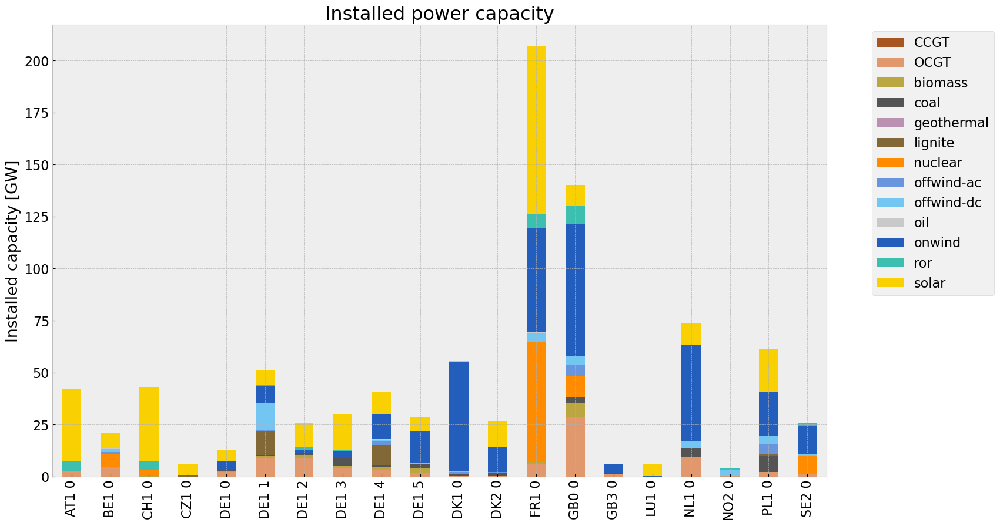

<Figure size 640x480 with 0 Axes>

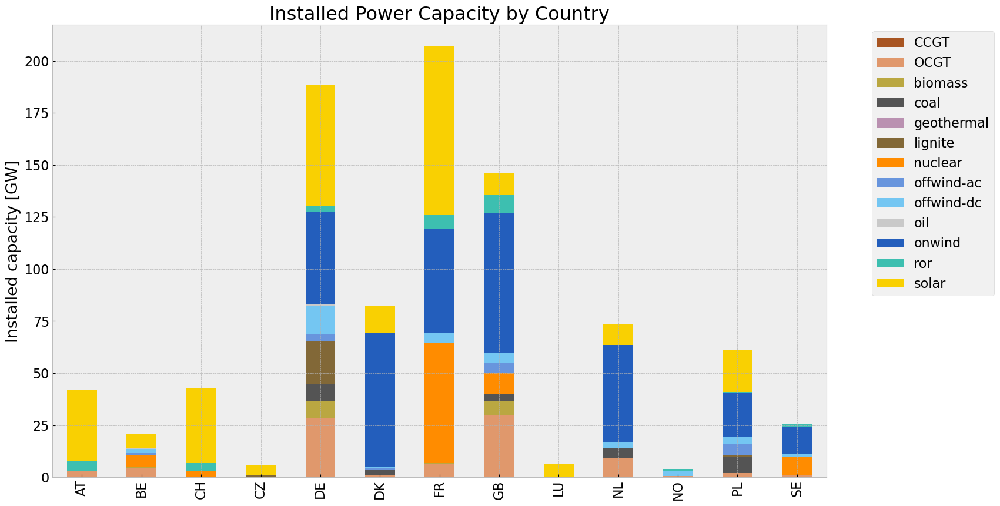

In [ ]:
# consolidated istalled cap without load_shedding

#capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_inv.fillna(0, inplace=True)
#gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_inv = inst_cap_table(n1, color_cap)
cap_inv_country= inst_cap_table_country(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

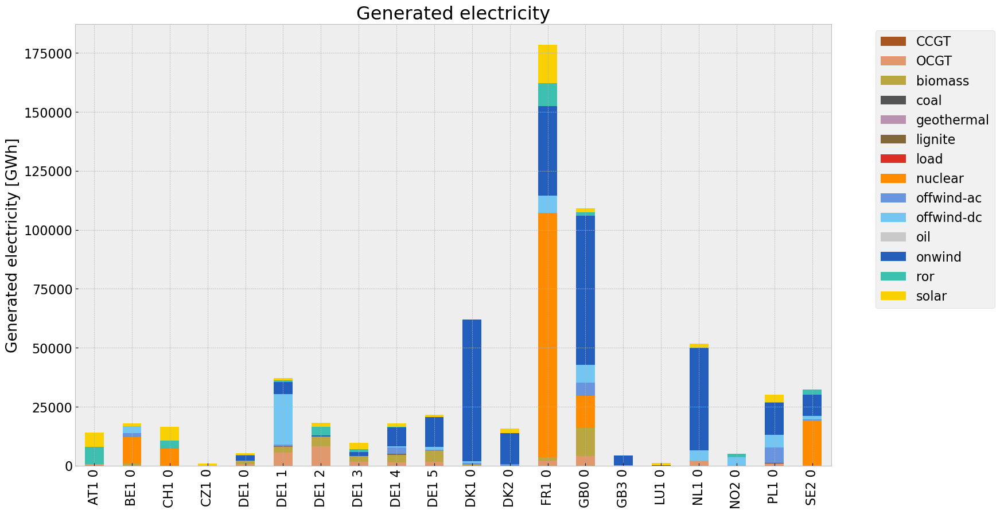

<Figure size 640x480 with 0 Axes>

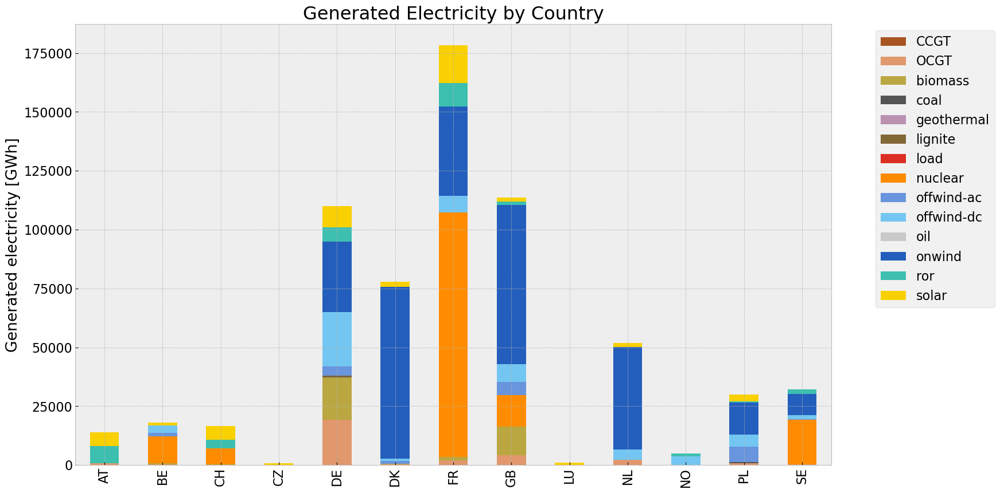

In [ ]:
# consolidated generation table
#carrier = n1.generators.carrier.unique()
#df_tot_generation = n1.generators_t.p.sum()

#generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
           # except KeyError:
               # print('error')
                
#generations.fillna(0, inplace=True)
#gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)
gen_inv_country = gen_power_table_country(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\

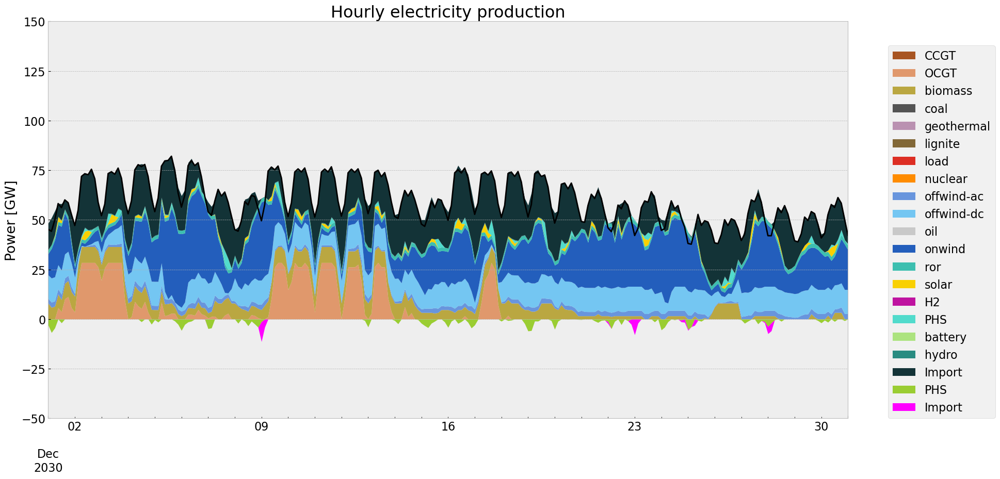

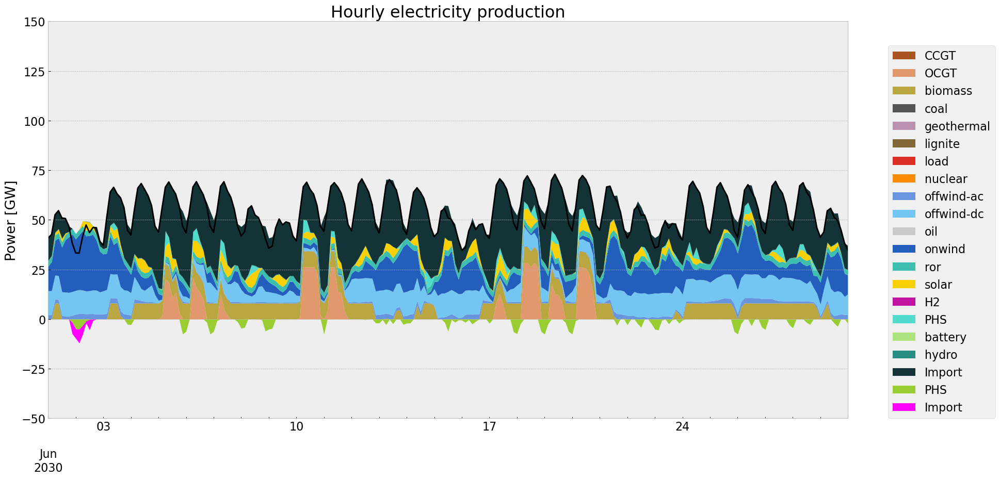

In [ ]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, fr

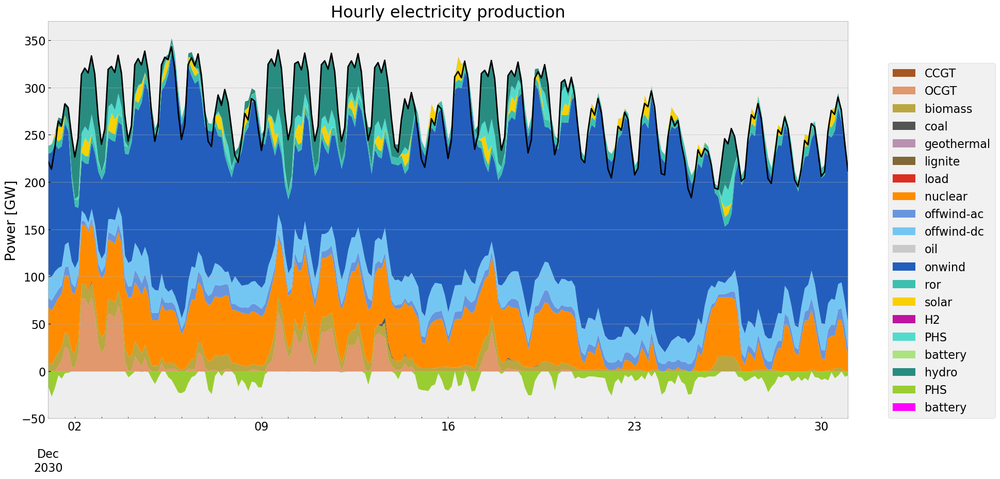

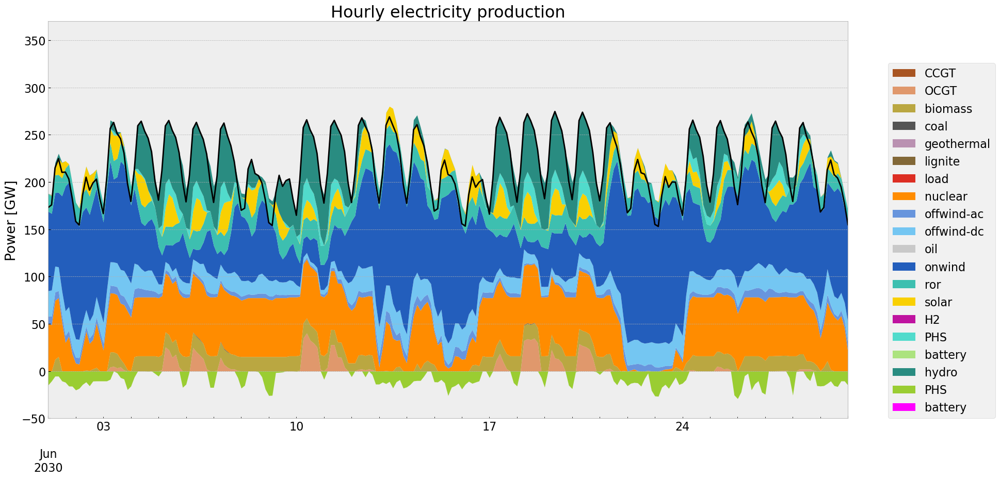

In [ ]:
#generation curve all countries
#winter
gen_curve_tot(n1, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n1, '2030-06-01', '2030-06-30', colors_gen)

## Storage

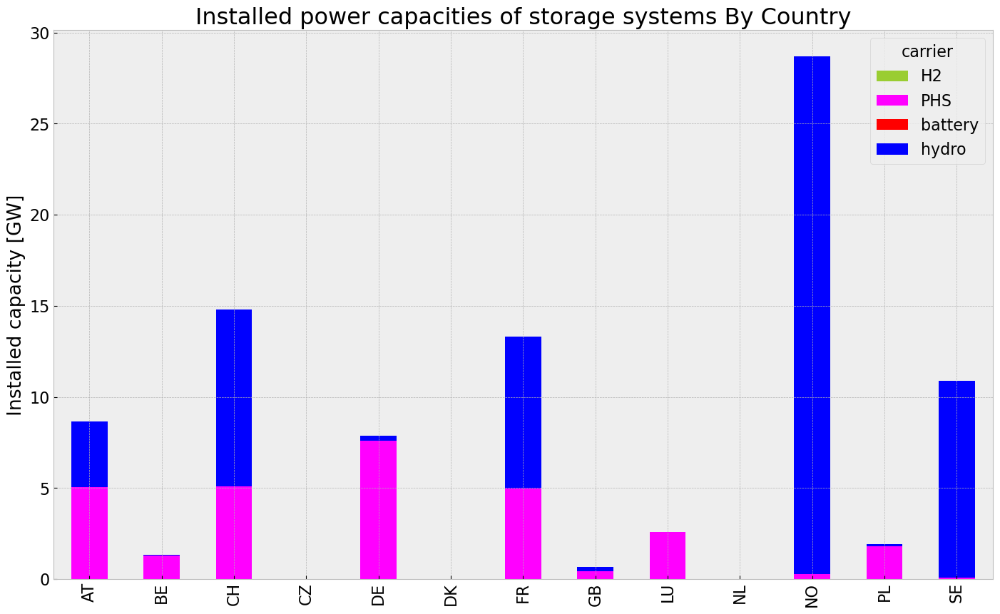

In [ ]:
store_inv = inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


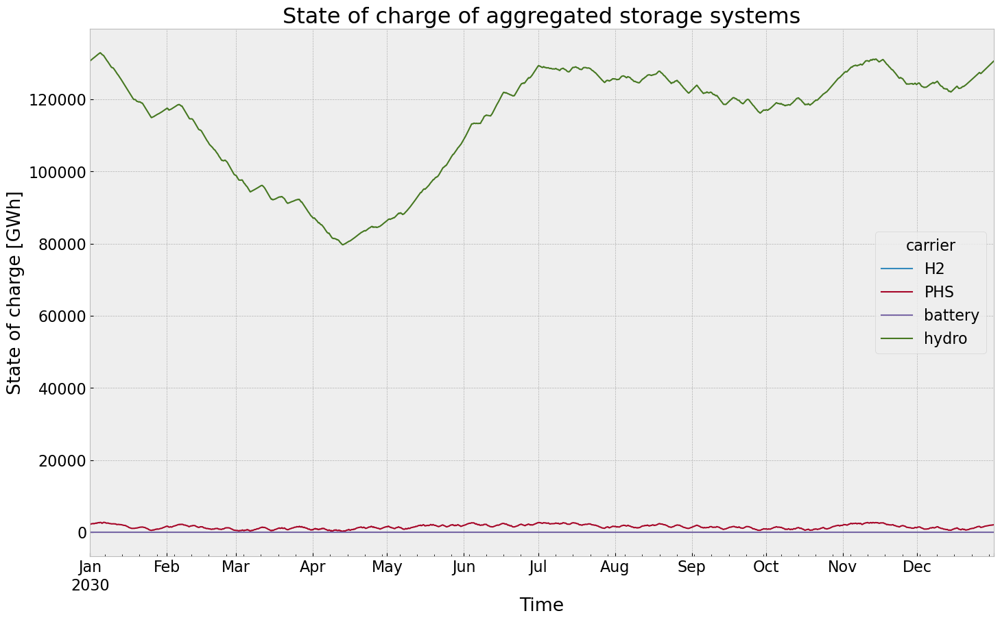

In [ ]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


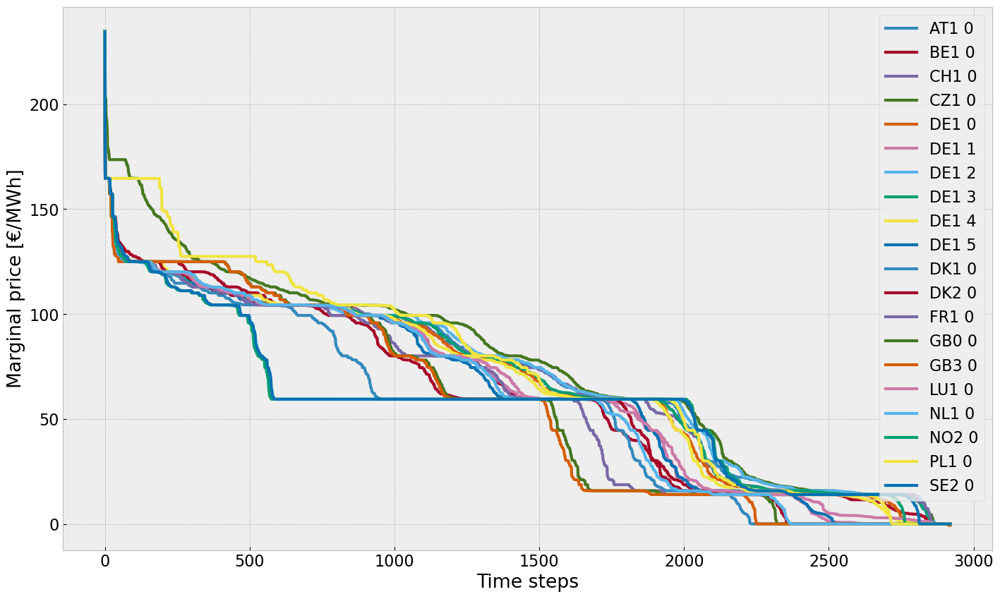

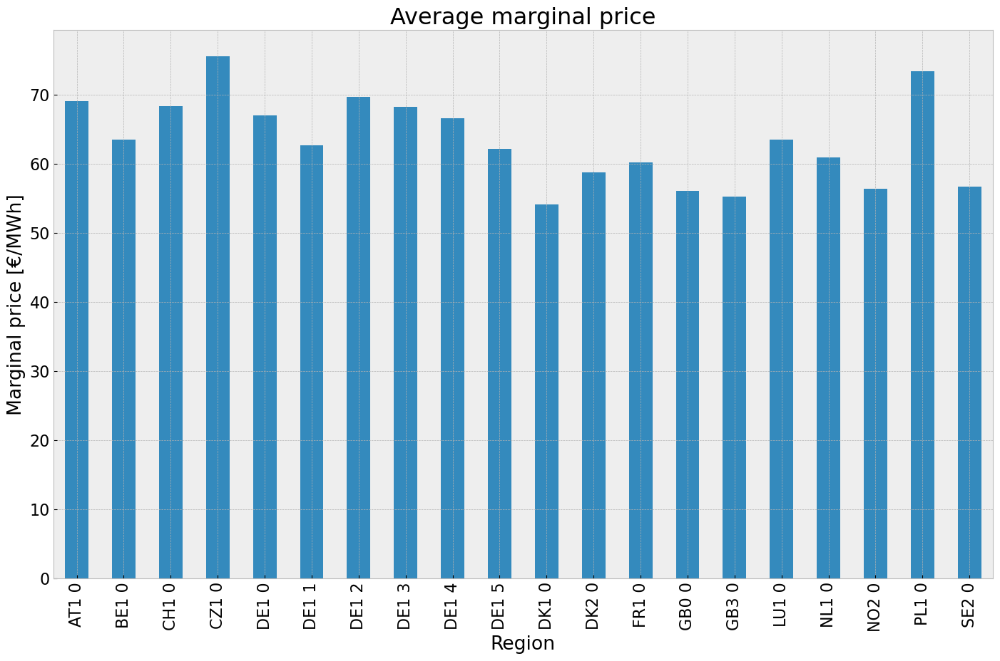

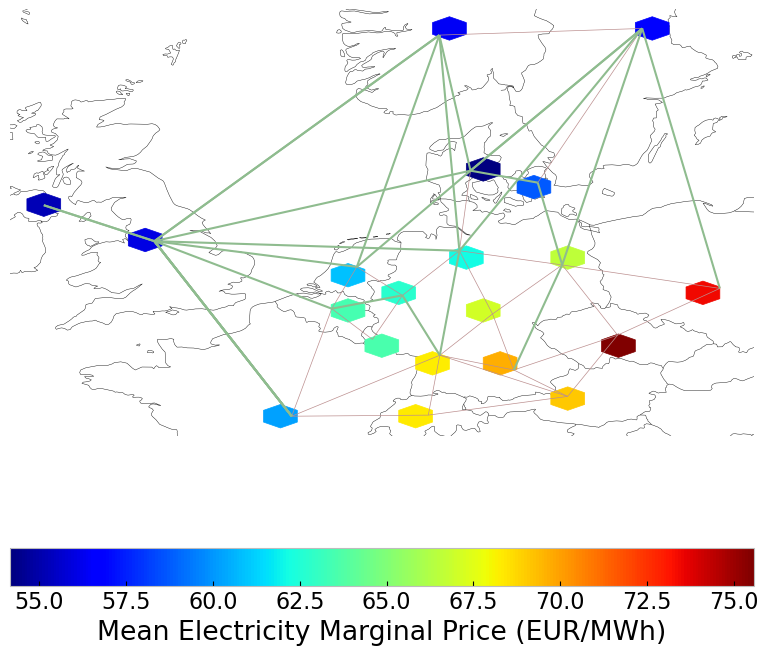

In [ ]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [ ]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.990579e+07,0.451621,0.1980,1.311132e+07
biomass,3.269107e+07,0.468000,0.0000,0.000000e+00
coal,5.413601e+05,0.329908,0.3361,5.515207e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,5.729070e+05,0.337285,0.4069,6.911544e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,1.545067e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.939927e+07,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [ ]:
#copy network
n2=n.copy()

#offwind cut
for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * reduction #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.links.p_nom_extendable.items():
    if value:  
        n2.links.at[index, 's_nom'] = n.links.at[index, 'p_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.links.at[index, 'p_nom_extendable'] =False


In [ ]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [ ]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
INFO:linopy.io: Writing time: 37.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u3c0isrp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u3c0isrp.lp


Reading time = 11.18 seconds


INFO:gurobipy:Reading time = 11.18 seconds


obj: 3264617 rows, 1521349 columns, 5513044 nonzeros


INFO:gurobipy:obj: 3264617 rows, 1521349 columns, 5513044 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264617 rows, 1521349 columns and 5513044 nonzeros


INFO:gurobipy:Optimize a model with 3264617 rows, 1521349 columns and 5513044 nonzeros


Model fingerprint: 0x96813bc9


INFO:gurobipy:Model fingerprint: 0x96813bc9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 2943640 rows and 747808 columns


INFO:gurobipy:Presolve removed 2943640 rows and 747808 columns


Presolve time: 4.22s


INFO:gurobipy:Presolve time: 4.22s


Presolved: 320977 rows, 773541 columns, 1619133 nonzeros


INFO:gurobipy:Presolved: 320977 rows, 773541 columns, 1619133 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.59s


INFO:gurobipy:Ordering time: 0.59s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 28


INFO:gurobipy: Dense cols : 28


 AA' NZ     : 1.055e+06


INFO:gurobipy: AA' NZ     : 1.055e+06


 Factor NZ  : 8.364e+06 (roughly 500 MB of memory)


INFO:gurobipy: Factor NZ  : 8.364e+06 (roughly 500 MB of memory)


 Factor Ops : 7.238e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.238e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.82733070e+13 -4.34536959e+15  1.51e+06 1.90e+04  5.67e+09     7s


INFO:gurobipy:   0   7.82733070e+13 -4.34536959e+15  1.51e+06 1.90e+04  5.67e+09     7s


   1   7.44484369e+13 -8.42088901e+14  1.49e+06 2.99e+03  2.93e+09     7s


INFO:gurobipy:   1   7.44484369e+13 -8.42088901e+14  1.49e+06 2.99e+03  2.93e+09     7s


   2   3.10404431e+13 -1.55542845e+14  5.16e+05 2.53e+01  9.72e+08     8s


INFO:gurobipy:   2   3.10404431e+13 -1.55542845e+14  5.16e+05 2.53e+01  9.72e+08     8s


   3   4.47570523e+12 -7.64650570e+13  4.02e+04 2.06e-01  1.11e+08     9s


INFO:gurobipy:   3   4.47570523e+12 -7.64650570e+13  4.02e+04 2.06e-01  1.11e+08     9s


   4   1.79280389e+12 -2.54696049e+13  2.52e+03 2.57e-02  2.02e+07    10s


INFO:gurobipy:   4   1.79280389e+12 -2.54696049e+13  2.52e+03 2.57e-02  2.02e+07    10s


   5   1.05426731e+12 -9.56353748e+12  9.20e+02 8.96e-03  7.37e+06    10s


INFO:gurobipy:   5   1.05426731e+12 -9.56353748e+12  9.20e+02 8.96e-03  7.37e+06    10s


   6   4.17405449e+11 -4.92989301e+12  3.28e+02 4.37e-03  3.57e+06    11s


INFO:gurobipy:   6   4.17405449e+11 -4.92989301e+12  3.28e+02 4.37e-03  3.57e+06    11s


   7   2.62603819e+11 -1.58222613e+12  1.69e+02 1.30e-03  1.22e+06    11s


INFO:gurobipy:   7   2.62603819e+11 -1.58222613e+12  1.69e+02 1.30e-03  1.22e+06    11s


   8   1.38668214e+11 -3.26813304e+11  4.76e+01 2.75e-04  3.03e+05    12s


INFO:gurobipy:   8   1.38668214e+11 -3.26813304e+11  4.76e+01 2.75e-04  3.03e+05    12s


   9   6.61615281e+10 -1.28725635e+11  4.72e+00 1.19e-04  1.25e+05    13s


INFO:gurobipy:   9   6.61615281e+10 -1.28725635e+11  4.72e+00 1.19e-04  1.25e+05    13s


  10   5.70850960e+10 -2.69887799e+10  2.67e+00 4.31e-05  5.41e+04    13s


INFO:gurobipy:  10   5.70850960e+10 -2.69887799e+10  2.67e+00 4.31e-05  5.41e+04    13s


  11   5.00226620e+10 -1.49322884e+10  1.84e+00 3.41e-05  4.18e+04    14s


INFO:gurobipy:  11   5.00226620e+10 -1.49322884e+10  1.84e+00 3.41e-05  4.18e+04    14s


  12   4.74214391e+10 -9.16666751e+09  1.55e+00 3.01e-05  3.64e+04    14s


INFO:gurobipy:  12   4.74214391e+10 -9.16666751e+09  1.55e+00 3.01e-05  3.64e+04    14s


  13   4.42734626e+10 -2.43382408e+09  1.20e+00 2.51e-05  3.00e+04    15s


INFO:gurobipy:  13   4.42734626e+10 -2.43382408e+09  1.20e+00 2.51e-05  3.00e+04    15s


  14   4.12523216e+10  5.66903890e+09  8.81e-01 1.94e-05  2.29e+04    15s


INFO:gurobipy:  14   4.12523216e+10  5.66903890e+09  8.81e-01 1.94e-05  2.29e+04    15s


  15   3.88205970e+10  1.41974182e+10  6.29e-01 1.31e-05  1.58e+04    16s


INFO:gurobipy:  15   3.88205970e+10  1.41974182e+10  6.29e-01 1.31e-05  1.58e+04    16s


  16   3.70594749e+10  1.73976171e+10  4.61e-01 1.06e-05  1.26e+04    17s


INFO:gurobipy:  16   3.70594749e+10  1.73976171e+10  4.61e-01 1.06e-05  1.26e+04    17s


  17   3.55385903e+10  2.01280174e+10  3.17e-01 8.60e-06  9.90e+03    18s


INFO:gurobipy:  17   3.55385903e+10  2.01280174e+10  3.17e-01 8.60e-06  9.90e+03    18s


  18   3.46838657e+10  2.46814145e+10  2.41e-01 5.30e-06  6.43e+03    19s


INFO:gurobipy:  18   3.46838657e+10  2.46814145e+10  2.41e-01 5.30e-06  6.43e+03    19s


  19   3.39551089e+10  2.60684239e+10  1.79e-01 4.24e-06  5.07e+03    19s


INFO:gurobipy:  19   3.39551089e+10  2.60684239e+10  1.79e-01 4.24e-06  5.07e+03    19s


  20   3.35202152e+10  2.70868257e+10  1.42e-01 3.48e-06  4.13e+03    20s


INFO:gurobipy:  20   3.35202152e+10  2.70868257e+10  1.42e-01 3.48e-06  4.13e+03    20s


  21   3.30038851e+10  2.81404916e+10  9.86e-02 2.67e-06  3.13e+03    21s


INFO:gurobipy:  21   3.30038851e+10  2.81404916e+10  9.86e-02 2.67e-06  3.13e+03    21s


  22   3.26856111e+10  2.87293420e+10  7.28e-02 2.23e-06  2.54e+03    22s


INFO:gurobipy:  22   3.26856111e+10  2.87293420e+10  7.28e-02 2.23e-06  2.54e+03    22s


  23   3.24385170e+10  2.96237996e+10  5.34e-02 1.57e-06  1.81e+03    23s


INFO:gurobipy:  23   3.24385170e+10  2.96237996e+10  5.34e-02 1.57e-06  1.81e+03    23s


  24   3.23236025e+10  2.99542670e+10  4.49e-02 1.31e-06  1.52e+03    24s


INFO:gurobipy:  24   3.23236025e+10  2.99542670e+10  4.49e-02 1.31e-06  1.52e+03    24s


  25   3.21755721e+10  3.02058540e+10  3.38e-02 1.12e-06  1.27e+03    24s


INFO:gurobipy:  25   3.21755721e+10  3.02058540e+10  3.38e-02 1.12e-06  1.27e+03    24s


  26   3.20716134e+10  3.03553498e+10  2.61e-02 1.01e-06  1.10e+03    25s


INFO:gurobipy:  26   3.20716134e+10  3.03553498e+10  2.61e-02 1.01e-06  1.10e+03    25s


  27   3.20065219e+10  3.06673380e+10  2.14e-02 7.77e-07  8.61e+02    26s


INFO:gurobipy:  27   3.20065219e+10  3.06673380e+10  2.14e-02 7.77e-07  8.61e+02    26s


  28   3.19551987e+10  3.10422853e+10  1.78e-02 5.00e-07  5.87e+02    27s


INFO:gurobipy:  28   3.19551987e+10  3.10422853e+10  1.78e-02 5.00e-07  5.87e+02    27s


  29   3.19110658e+10  3.11476051e+10  1.47e-02 4.19e-07  4.91e+02    28s


INFO:gurobipy:  29   3.19110658e+10  3.11476051e+10  1.47e-02 4.19e-07  4.91e+02    28s


  30   3.18347492e+10  3.12263518e+10  9.69e-03 3.56e-07  3.91e+02    29s


INFO:gurobipy:  30   3.18347492e+10  3.12263518e+10  9.69e-03 3.56e-07  3.91e+02    29s


  31   3.18076799e+10  3.13551335e+10  7.86e-03 2.54e-07  2.91e+02    29s


INFO:gurobipy:  31   3.18076799e+10  3.13551335e+10  7.86e-03 2.54e-07  2.91e+02    29s


  32   3.17669615e+10  3.14173974e+10  5.24e-03 2.05e-07  2.25e+02    30s


INFO:gurobipy:  32   3.17669615e+10  3.14173974e+10  5.24e-03 2.05e-07  2.25e+02    30s


  33   3.17514342e+10  3.14887667e+10  4.21e-03 1.48e-07  1.69e+02    31s


INFO:gurobipy:  33   3.17514342e+10  3.14887667e+10  4.21e-03 1.48e-07  1.69e+02    31s


  34   3.17333489e+10  3.15178986e+10  3.09e-03 1.26e-07  1.38e+02    32s


INFO:gurobipy:  34   3.17333489e+10  3.15178986e+10  3.09e-03 1.26e-07  1.38e+02    32s


  35   3.17322086e+10  3.15532976e+10  3.01e-03 9.81e-08  1.15e+02    33s


INFO:gurobipy:  35   3.17322086e+10  3.15532976e+10  3.01e-03 9.81e-08  1.15e+02    33s


  36   3.17180447e+10  3.15850510e+10  2.14e-03 7.39e-08  8.55e+01    33s


INFO:gurobipy:  36   3.17180447e+10  3.15850510e+10  2.14e-03 7.39e-08  8.55e+01    33s


  37   3.17168085e+10  3.16092325e+10  2.06e-03 5.58e-08  6.91e+01    34s


INFO:gurobipy:  37   3.17168085e+10  3.16092325e+10  2.06e-03 5.58e-08  6.91e+01    34s


  38   3.17041979e+10  3.16204235e+10  1.29e-03 4.71e-08  5.38e+01    35s


INFO:gurobipy:  38   3.17041979e+10  3.16204235e+10  1.29e-03 4.71e-08  5.38e+01    35s


  39   3.17014343e+10  3.16344248e+10  1.12e-03 3.62e-08  4.31e+01    36s


INFO:gurobipy:  39   3.17014343e+10  3.16344248e+10  1.12e-03 3.62e-08  4.31e+01    36s


  40   3.16960903e+10  3.16425745e+10  7.99e-04 2.99e-08  3.44e+01    37s


INFO:gurobipy:  40   3.16960903e+10  3.16425745e+10  7.99e-04 2.99e-08  3.44e+01    37s


  41   3.16921065e+10  3.16588045e+10  5.63e-04 2.25e-08  2.14e+01    37s


INFO:gurobipy:  41   3.16921065e+10  3.16588045e+10  5.63e-04 2.25e-08  2.14e+01    37s


  42   3.16892400e+10  3.16660765e+10  3.96e-04 3.83e-08  1.49e+01    38s


INFO:gurobipy:  42   3.16892400e+10  3.16660765e+10  3.96e-04 3.83e-08  1.49e+01    38s


  43   3.16873222e+10  3.16713238e+10  2.85e-04 5.93e-08  1.03e+01    39s


INFO:gurobipy:  43   3.16873222e+10  3.16713238e+10  2.85e-04 5.93e-08  1.03e+01    39s


  44   3.16862775e+10  3.16723444e+10  2.26e-04 6.54e-08  8.95e+00    40s


INFO:gurobipy:  44   3.16862775e+10  3.16723444e+10  2.26e-04 6.54e-08  8.95e+00    40s


  45   3.16857322e+10  3.16740141e+10  1.95e-04 7.41e-08  7.53e+00    41s


INFO:gurobipy:  45   3.16857322e+10  3.16740141e+10  1.95e-04 7.41e-08  7.53e+00    41s


  46   3.16853179e+10  3.16748793e+10  1.72e-04 7.80e-08  6.71e+00    41s


INFO:gurobipy:  46   3.16853179e+10  3.16748793e+10  1.72e-04 7.80e-08  6.71e+00    41s


  47   3.16847901e+10  3.16766765e+10  1.40e-04 8.36e-08  5.21e+00    42s


INFO:gurobipy:  47   3.16847901e+10  3.16766765e+10  1.40e-04 8.36e-08  5.21e+00    42s


  48   3.16843751e+10  3.16781793e+10  1.16e-04 8.61e-08  3.98e+00    43s


INFO:gurobipy:  48   3.16843751e+10  3.16781793e+10  1.16e-04 8.61e-08  3.98e+00    43s


  49   3.16833653e+10  3.16791842e+10  6.06e-05 8.31e-08  2.69e+00    43s


INFO:gurobipy:  49   3.16833653e+10  3.16791842e+10  6.06e-05 8.31e-08  2.69e+00    43s


  50   3.16831083e+10  3.16799096e+10  4.60e-05 7.36e-08  2.06e+00    44s


INFO:gurobipy:  50   3.16831083e+10  3.16799096e+10  4.60e-05 7.36e-08  2.06e+00    44s


  51   3.16828888e+10  3.16806588e+10  3.38e-05 6.17e-08  1.43e+00    45s


INFO:gurobipy:  51   3.16828888e+10  3.16806588e+10  3.38e-05 6.17e-08  1.43e+00    45s


  52   3.16826816e+10  3.16807506e+10  2.32e-05 5.98e-08  1.24e+00    45s


INFO:gurobipy:  52   3.16826816e+10  3.16807506e+10  2.32e-05 5.98e-08  1.24e+00    45s


  53   3.16825950e+10  3.16812204e+10  1.85e-05 4.95e-08  8.83e-01    46s


INFO:gurobipy:  53   3.16825950e+10  3.16812204e+10  1.85e-05 4.95e-08  8.83e-01    46s


  54   3.16825361e+10  3.16814573e+10  1.58e-05 4.29e-08  6.93e-01    47s


INFO:gurobipy:  54   3.16825361e+10  3.16814573e+10  1.58e-05 4.29e-08  6.93e-01    47s


  55   3.16824293e+10  3.16816526e+10  1.09e-05 3.62e-08  4.99e-01    47s


INFO:gurobipy:  55   3.16824293e+10  3.16816526e+10  1.09e-05 3.62e-08  4.99e-01    47s


  56   3.16823740e+10  3.16818620e+10  9.31e-06 2.60e-08  3.29e-01    48s


INFO:gurobipy:  56   3.16823740e+10  3.16818620e+10  9.31e-06 2.60e-08  3.29e-01    48s


  57   3.16823163e+10  3.16819606e+10  1.47e-05 2.07e-08  2.29e-01    49s


INFO:gurobipy:  57   3.16823163e+10  3.16819606e+10  1.47e-05 2.07e-08  2.29e-01    49s


  58   3.16822961e+10  3.16820508e+10  1.14e-05 1.28e-08  1.58e-01    50s


INFO:gurobipy:  58   3.16822961e+10  3.16820508e+10  1.14e-05 1.28e-08  1.58e-01    50s


  59   3.16822820e+10  3.16820939e+10  9.07e-06 9.49e-09  1.21e-01    52s


INFO:gurobipy:  59   3.16822820e+10  3.16820939e+10  9.07e-06 9.49e-09  1.21e-01    52s


  60   3.16822706e+10  3.16821346e+10  7.32e-06 6.43e-09  8.74e-02    53s


INFO:gurobipy:  60   3.16822706e+10  3.16821346e+10  7.32e-06 6.43e-09  8.74e-02    53s


  61   3.16822584e+10  3.16821618e+10  5.46e-06 4.51e-09  6.21e-02    55s


INFO:gurobipy:  61   3.16822584e+10  3.16821618e+10  5.46e-06 4.51e-09  6.21e-02    55s


  62   3.16822497e+10  3.16821741e+10  4.13e-06 3.77e-09  4.86e-02    56s


INFO:gurobipy:  62   3.16822497e+10  3.16821741e+10  4.13e-06 3.77e-09  4.86e-02    56s


  63   3.16822412e+10  3.16821880e+10  2.79e-06 2.87e-09  3.42e-02    58s


INFO:gurobipy:  63   3.16822412e+10  3.16821880e+10  2.79e-06 2.87e-09  3.42e-02    58s


  64   3.16822386e+10  3.16821925e+10  2.60e-06 2.56e-09  2.96e-02    58s


INFO:gurobipy:  64   3.16822386e+10  3.16821925e+10  2.60e-06 2.56e-09  2.96e-02    58s


  65   3.16822361e+10  3.16822078e+10  2.52e-06 1.44e-09  1.82e-02    59s


INFO:gurobipy:  65   3.16822361e+10  3.16822078e+10  2.52e-06 1.44e-09  1.82e-02    59s


  66   3.16822339e+10  3.16822098e+10  2.14e-06 1.29e-09  1.54e-02    61s


INFO:gurobipy:  66   3.16822339e+10  3.16822098e+10  2.14e-06 1.29e-09  1.54e-02    61s


  67   3.16822320e+10  3.16822114e+10  1.84e-06 1.17e-09  1.32e-02    62s


INFO:gurobipy:  67   3.16822320e+10  3.16822114e+10  1.84e-06 1.17e-09  1.32e-02    62s


  68   3.16822289e+10  3.16822164e+10  1.30e-06 7.73e-10  8.02e-03    65s


INFO:gurobipy:  68   3.16822289e+10  3.16822164e+10  1.30e-06 7.73e-10  8.02e-03    65s


  69   3.16822287e+10  3.16822185e+10  1.27e-06 5.35e-10  6.52e-03    67s


INFO:gurobipy:  69   3.16822287e+10  3.16822185e+10  1.27e-06 5.35e-10  6.52e-03    67s


  70   3.16822240e+10  3.16822205e+10  4.54e-07 3.04e-10  2.28e-03    69s


INFO:gurobipy:  70   3.16822240e+10  3.16822205e+10  4.54e-07 3.04e-10  2.28e-03    69s


  71   3.16822233e+10  3.16822218e+10  1.03e-06 1.10e-10  9.22e-04    71s


INFO:gurobipy:  71   3.16822233e+10  3.16822218e+10  1.03e-06 1.10e-10  9.22e-04    71s


  72   3.16822227e+10  3.16822222e+10  5.33e-06 4.86e-10  3.50e-04    72s


INFO:gurobipy:  72   3.16822227e+10  3.16822222e+10  5.33e-06 4.86e-10  3.50e-04    72s


  73   3.16822226e+10  3.16822223e+10  2.65e-05 2.12e-10  1.45e-04    73s


INFO:gurobipy:  73   3.16822226e+10  3.16822223e+10  2.65e-05 2.12e-10  1.45e-04    73s


  74   3.16822225e+10  3.16822224e+10  7.58e-06 5.62e-10  4.57e-05    74s


INFO:gurobipy:  74   3.16822225e+10  3.16822224e+10  7.58e-06 5.62e-10  4.57e-05    74s


  75   3.16822224e+10  3.16822224e+10  6.69e-06 7.22e-10  2.60e-05    75s


INFO:gurobipy:  75   3.16822224e+10  3.16822224e+10  6.69e-06 7.22e-10  2.60e-05    75s


INFO:gurobipy:


Barrier solved model in 75 iterations and 74.71 seconds (27.00 work units)


INFO:gurobipy:Barrier solved model in 75 iterations and 74.71 seconds (27.00 work units)


Optimal objective 3.16822224e+10


INFO:gurobipy:Optimal objective 3.16822224e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  171968 variables added to crossover basis                       75s


INFO:gurobipy:  171968 variables added to crossover basis                       75s


INFO:gurobipy:


   40690 DPushes remaining with DInf 0.0000000e+00                75s


INFO:gurobipy:   40690 DPushes remaining with DInf 0.0000000e+00                75s


       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                80s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  191145 PPushes remaining with PInf 6.3208661e-04                80s


INFO:gurobipy:  191145 PPushes remaining with PInf 6.3208661e-04                80s


   15195 PPushes remaining with PInf 6.7126855e-04                94s


INFO:gurobipy:   15195 PPushes remaining with PInf 6.7126855e-04                94s


   11099 PPushes remaining with PInf 5.3623864e-04                95s


INFO:gurobipy:   11099 PPushes remaining with PInf 5.3623864e-04                95s


    4566 PPushes remaining with PInf 0.0000000e+00               104s


INFO:gurobipy:    4566 PPushes remaining with PInf 0.0000000e+00               104s


       0 PPushes remaining with PInf 0.0000000e+00               108s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               108s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.8328094e+00    108s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.8328094e+00    108s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  223587    3.1682222e+10   0.000000e+00   3.832809e+00    108s


INFO:gurobipy:  223587    3.1682222e+10   0.000000e+00   3.832809e+00    108s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  223619    3.1682222e+10   0.000000e+00   0.000000e+00    111s


INFO:gurobipy:  223619    3.1682222e+10   0.000000e+00   0.000000e+00    111s


INFO:gurobipy:


Solved in 223619 iterations and 111.26 seconds (42.30 work units)


INFO:gurobipy:Solved in 223619 iterations and 111.26 seconds (42.30 work units)


Optimal objective  3.168222242e+10


INFO:gurobipy:Optimal objective  3.168222242e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521349 primals, 3264617 duals
Objective: 3.17e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [ ]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

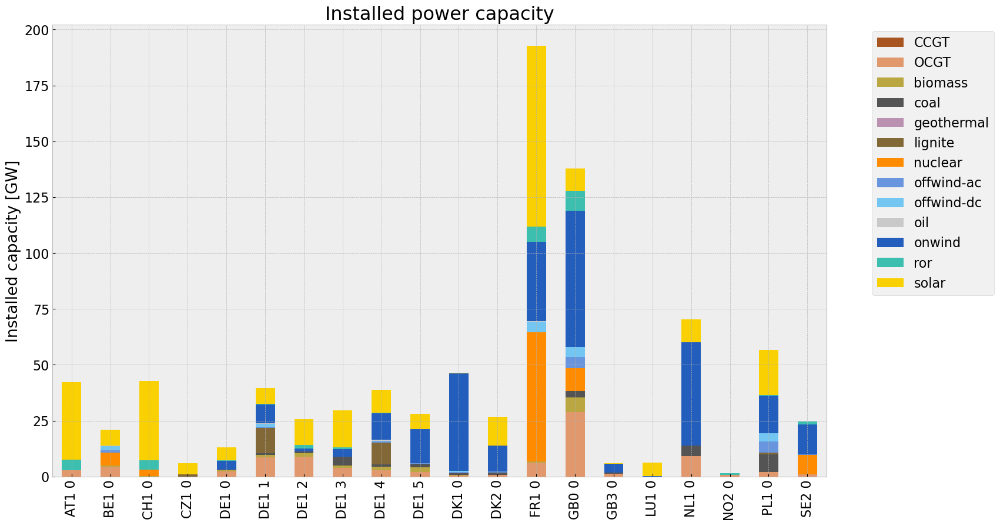

<Figure size 640x480 with 0 Axes>

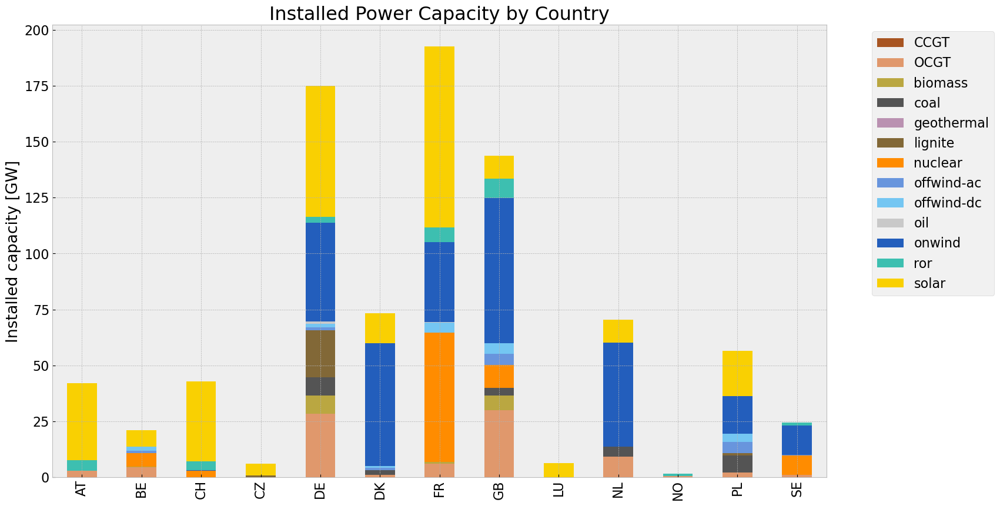

In [ ]:
# consolidated istalled cap without load_shedding

#capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv.fillna(0, inplace=True)
#gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv = inst_cap_table(n2, color_cap)
cap_noinv_country= inst_cap_table_country(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

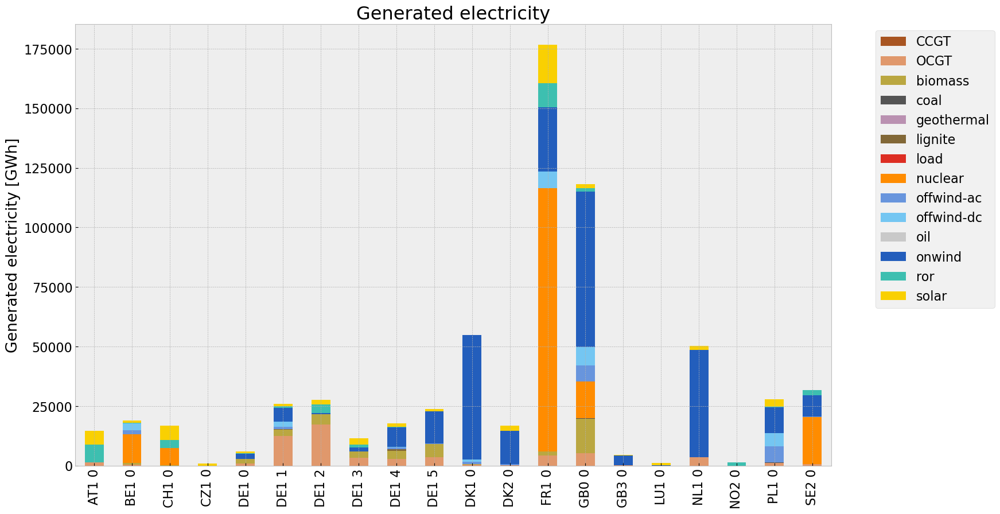

<Figure size 640x480 with 0 Axes>

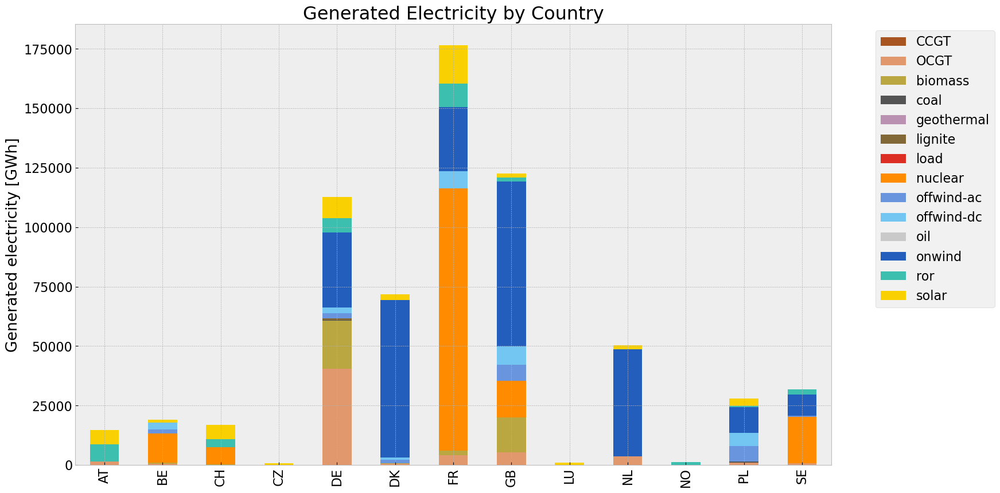

In [ ]:
# consolidated generation table
#carrier = n2.generators.carrier.unique()
#df_tot_generation = n2.generators_t.p.sum()

#generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
                #generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')

#generations.fillna(0, inplace=True)
#gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)
gen_noinv_country = gen_power_table_country(n2,colors_gen_table)


## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2796143640.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2796143640.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).

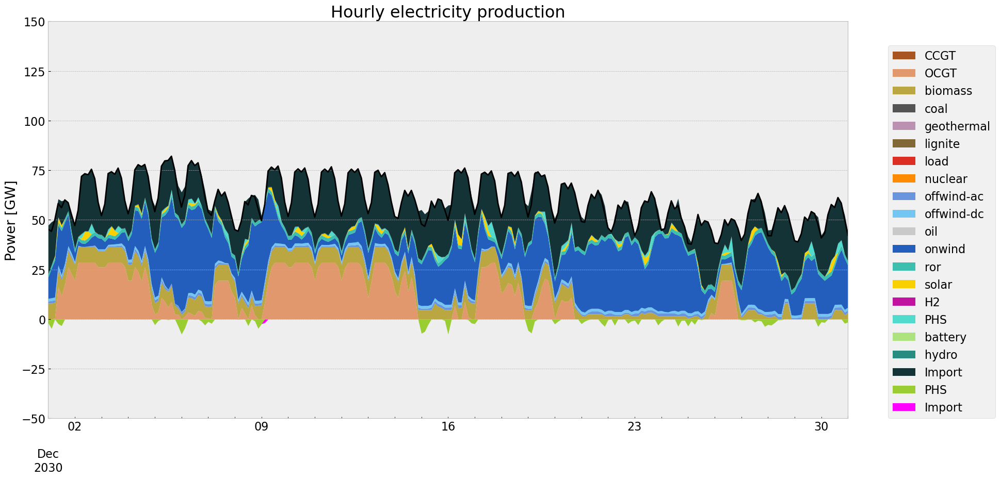

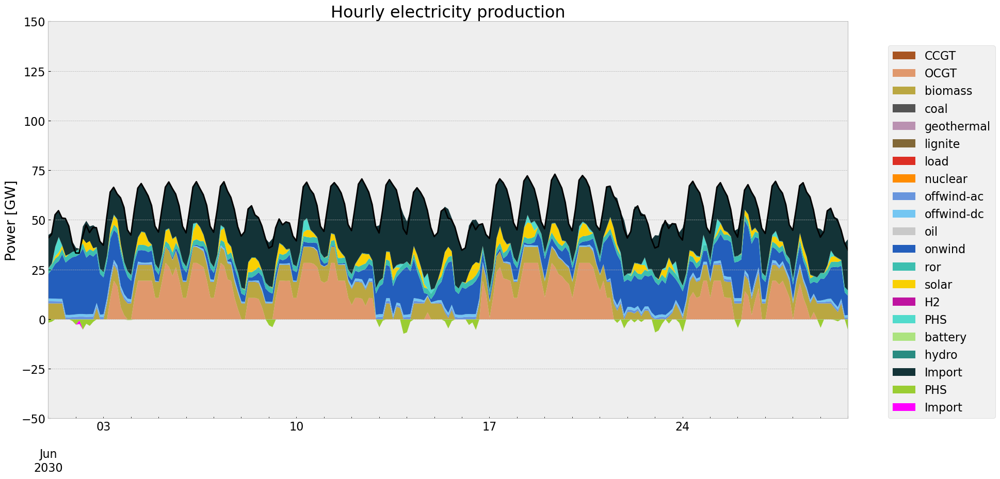

In [ ]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, fr

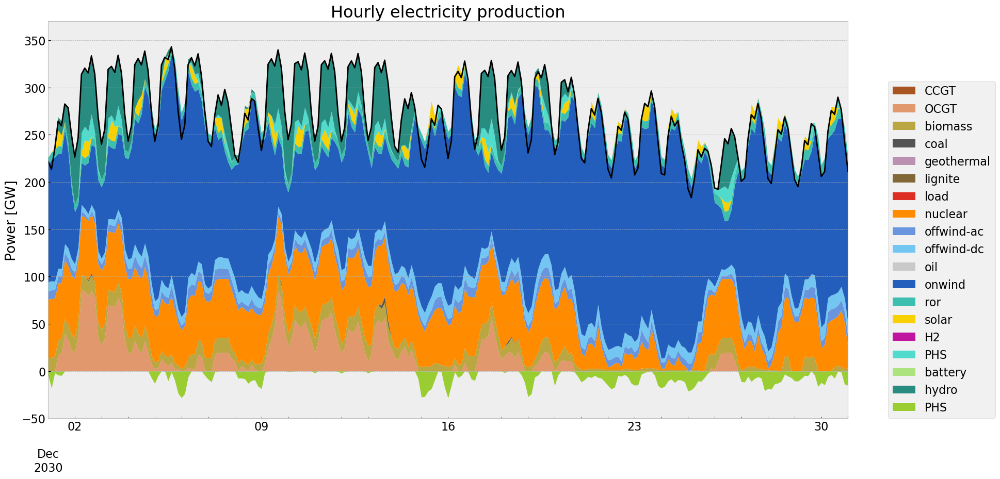

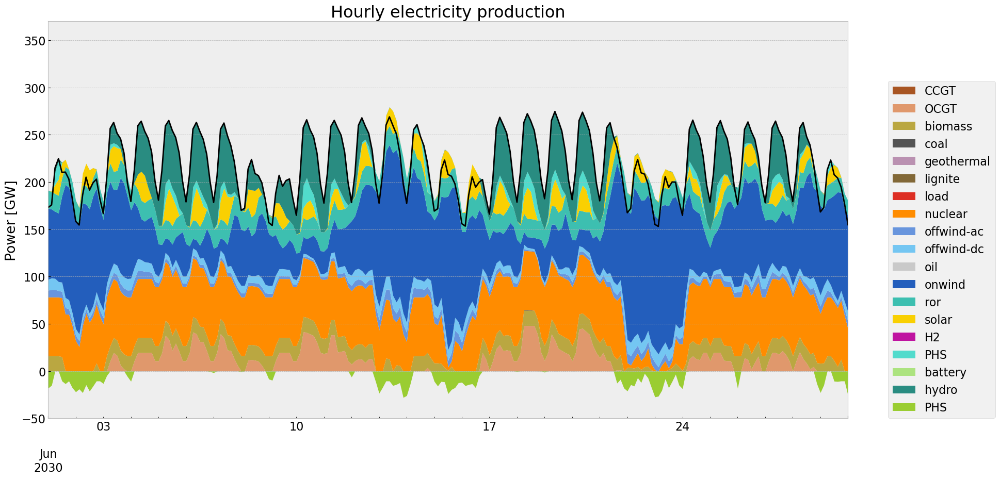

In [ ]:
#generation curve all countries
#winter
gen_curve_tot(n2, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n2, '2030-06-01', '2030-06-30', colors_gen)

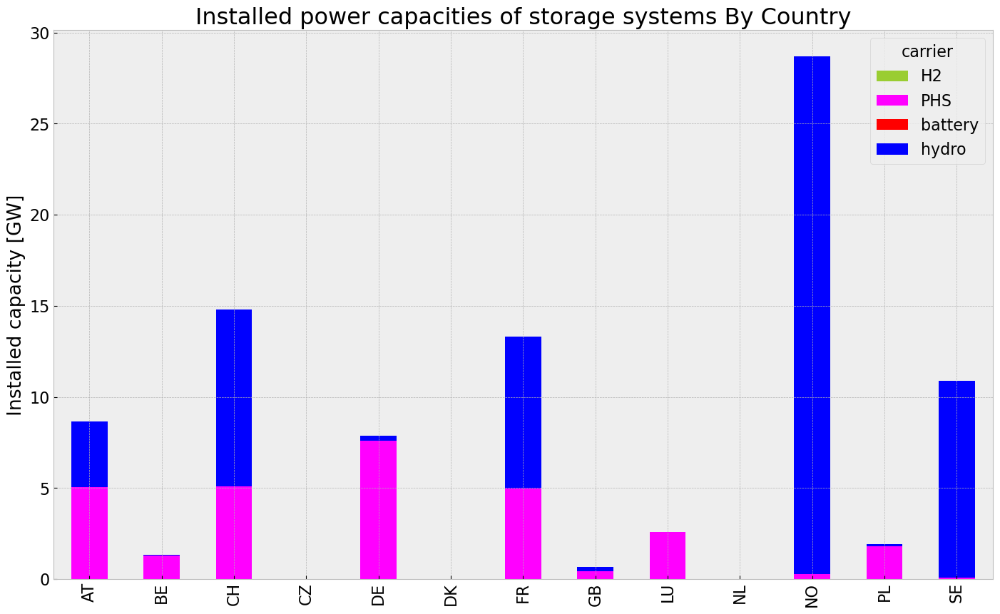

In [ ]:
#storage unit capacities
store_noinv = inst_store_table(n2)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1117423567.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1117423567.py:3: FutureWarning: 'H' is deprecated and will be removed in a futu

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.782973e+07,0.451621,0.1980,2.535376e+07
biomass,3.770160e+07,0.468000,0.0000,0.000000e+00
coal,7.100511e+05,0.329908,0.3361,7.233779e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.548882e+05,0.337285,0.4069,1.031336e+06
load,3.775349e+03,1.000000,0.0000,0.000000e+00
nuclear,1.650110e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.879682e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


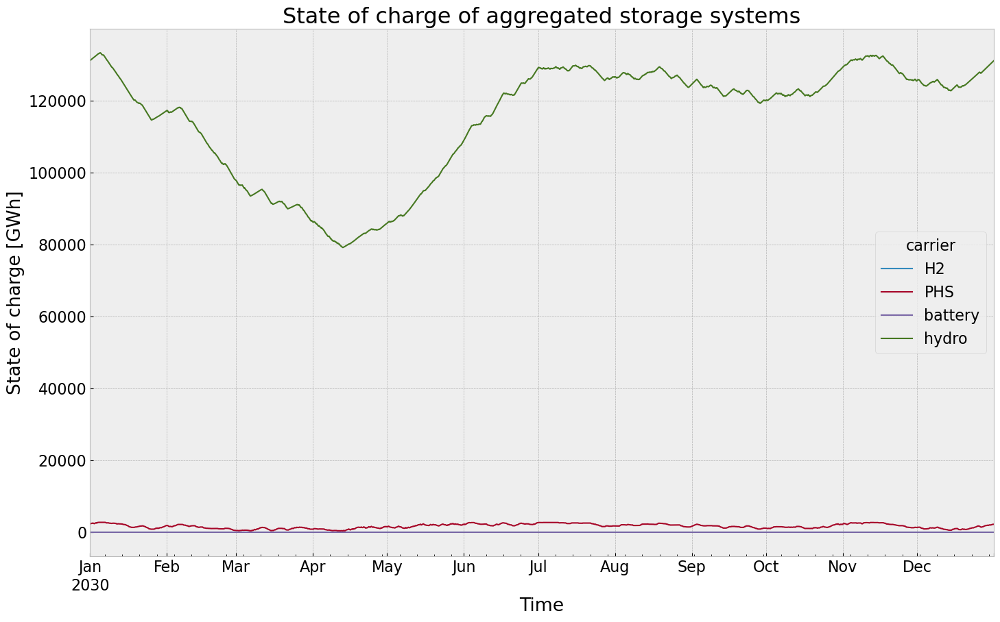

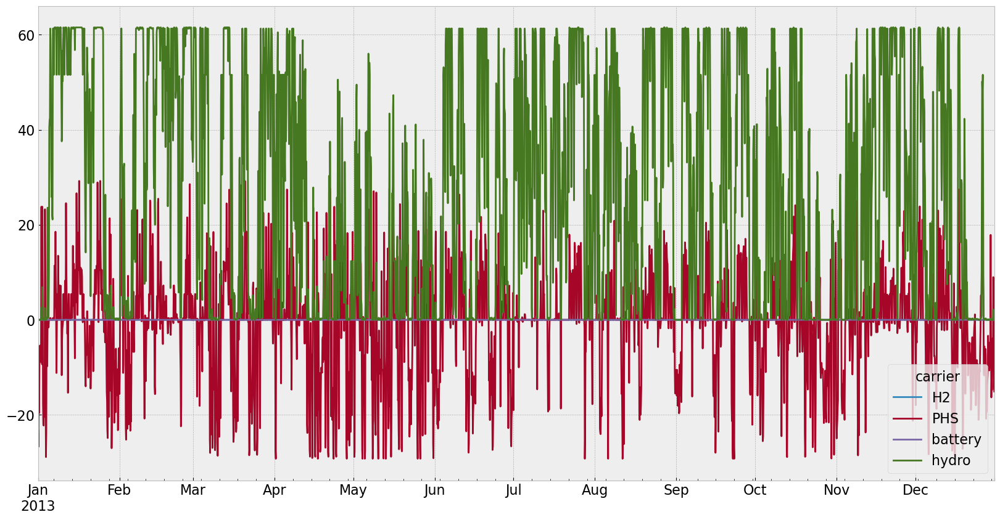

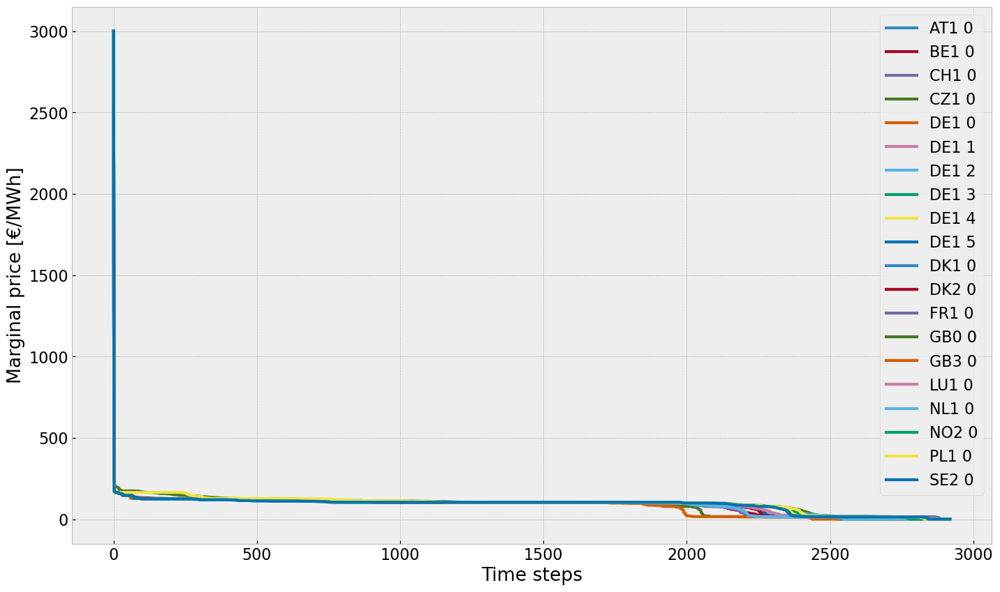

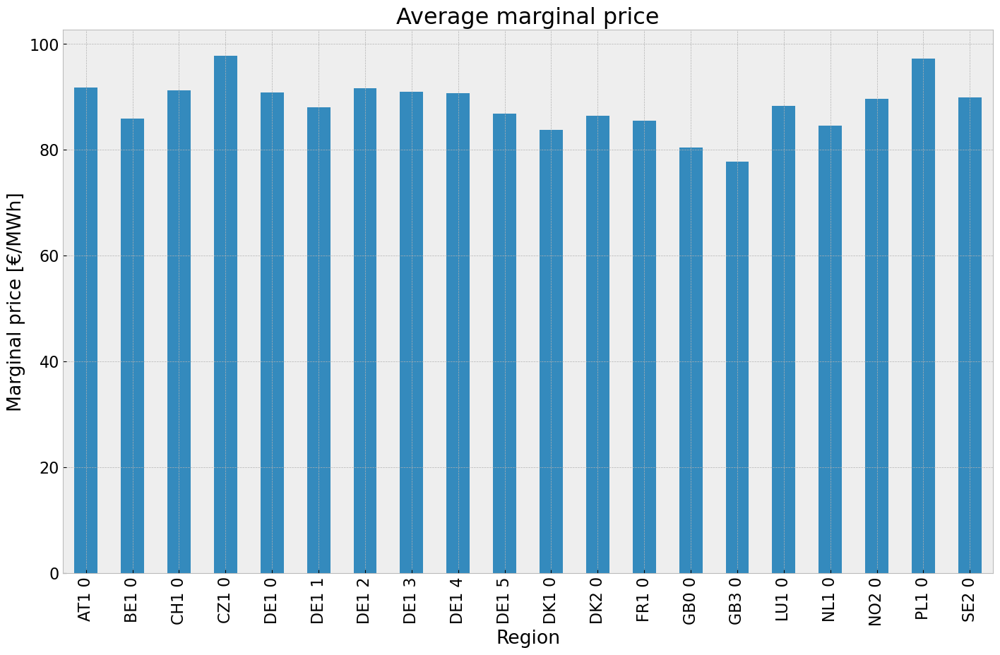

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


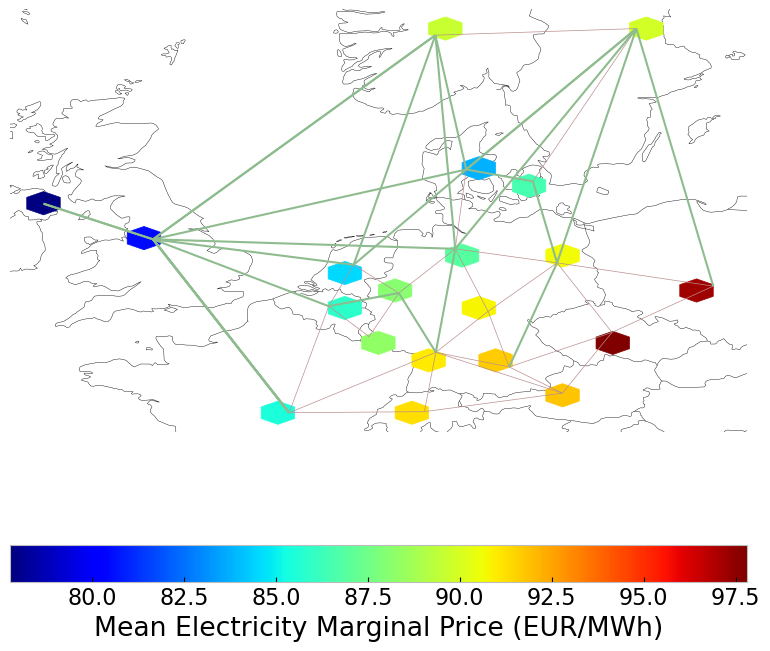

In [ ]:
#state of charge
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [ ]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xjkcd_ed.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xjkcd_ed.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3557f6b7


INFO:gurobipy:Model fingerprint: 0x3557f6b7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24248 rows and 6179 columns


INFO:gurobipy:Presolve removed 24248 rows and 6179 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6354 columns, 13278 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6354 columns, 13278 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22449913e+13 -1.68318489e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22449913e+13 -1.68318489e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04402813e+12 -3.78045218e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04402813e+12 -3.78045218e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46834770e+11 -1.60065174e+12  2.24e+04 2.55e-10  2.30e+08     0s


INFO:gurobipy:   2   1.46834770e+11 -1.60065174e+12  2.24e+04 2.55e-10  2.30e+08     0s


   3   3.04787446e+10 -3.30662789e+11  6.40e+02 8.73e-11  3.02e+07     0s


INFO:gurobipy:   3   3.04787446e+10 -3.30662789e+11  6.40e+02 8.73e-11  3.02e+07     0s


   4   1.34949511e+10 -6.67085870e+10  3.24e+01 2.62e-10  6.32e+06     0s


INFO:gurobipy:   4   1.34949511e+10 -6.67085870e+10  3.24e+01 2.62e-10  6.32e+06     0s


   5   9.39588261e+09 -2.51695748e+10  1.31e+01 1.16e-10  2.72e+06     0s


INFO:gurobipy:   5   9.39588261e+09 -2.51695748e+10  1.31e+01 1.16e-10  2.72e+06     0s


   6   4.14436382e+09 -1.00071977e+10  5.63e+00 5.82e-11  1.11e+06     0s


INFO:gurobipy:   6   4.14436382e+09 -1.00071977e+10  5.63e+00 5.82e-11  1.11e+06     0s


   7   1.98335547e+09 -1.81497825e+09  2.50e+00 3.83e-11  2.98e+05     0s


INFO:gurobipy:   7   1.98335547e+09 -1.81497825e+09  2.50e+00 3.83e-11  2.98e+05     0s


   8   5.20893596e+08 -7.25777266e+08  5.56e-01 2.91e-11  9.76e+04     0s


INFO:gurobipy:   8   5.20893596e+08 -7.25777266e+08  5.56e-01 2.91e-11  9.76e+04     0s


   9   3.51914885e+08 -2.30264551e+08  3.33e-01 3.10e-11  4.56e+04     0s


INFO:gurobipy:   9   3.51914885e+08 -2.30264551e+08  3.33e-01 3.10e-11  4.56e+04     0s


  10   2.79344625e+08 -8.09714875e+07  2.43e-01 3.02e-11  2.82e+04     0s


INFO:gurobipy:  10   2.79344625e+08 -8.09714875e+07  2.43e-01 3.02e-11  2.82e+04     0s


  11   2.21337645e+08 -6.86013089e+07  1.71e-01 3.00e-11  2.27e+04     0s


INFO:gurobipy:  11   2.21337645e+08 -6.86013089e+07  1.71e-01 3.00e-11  2.27e+04     0s


  12   1.54746691e+08  3.21211644e+07  8.99e-02 3.18e-11  9.60e+03     0s


INFO:gurobipy:  12   1.54746691e+08  3.21211644e+07  8.99e-02 3.18e-11  9.60e+03     0s


  13   1.27754658e+08  5.64000652e+07  5.44e-02 2.91e-11  5.58e+03     0s


INFO:gurobipy:  13   1.27754658e+08  5.64000652e+07  5.44e-02 2.91e-11  5.58e+03     0s


  14   1.02534780e+08  6.84820448e+07  2.33e-02 2.79e-11  2.66e+03     0s


INFO:gurobipy:  14   1.02534780e+08  6.84820448e+07  2.33e-02 2.79e-11  2.66e+03     0s


  15   8.95618780e+07  7.14261473e+07  7.53e-03 2.91e-11  1.42e+03     0s


INFO:gurobipy:  15   8.95618780e+07  7.14261473e+07  7.53e-03 2.91e-11  1.42e+03     0s


  16   8.73529527e+07  7.90249395e+07  4.84e-03 3.24e-11  6.52e+02     0s


INFO:gurobipy:  16   8.73529527e+07  7.90249395e+07  4.84e-03 3.24e-11  6.52e+02     0s


  17   8.51647788e+07  8.06085491e+07  2.39e-03 3.06e-11  3.57e+02     0s


INFO:gurobipy:  17   8.51647788e+07  8.06085491e+07  2.39e-03 3.06e-11  3.57e+02     0s


  18   8.40784017e+07  8.20840398e+07  1.20e-03 2.84e-11  1.56e+02     0s


INFO:gurobipy:  18   8.40784017e+07  8.20840398e+07  1.20e-03 2.84e-11  1.56e+02     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.23 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.23 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3414    8.2913491e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3414    8.2913491e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3414 iterations and 0.27 seconds (0.12 work units)


INFO:gurobipy:Solved in 3414 iterations and 0.27 seconds (0.12 work units)


Optimal objective  8.291349054e+07


INFO:gurobipy:Optimal objective  8.291349054e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.29e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cer42swm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cer42swm.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6d59a4a6


INFO:gurobipy:Model fingerprint: 0x6d59a4a6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24251 rows and 6194 columns


INFO:gurobipy:Presolve removed 24251 rows and 6194 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6339 columns, 13290 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6339 columns, 13290 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.462e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.462e+05 (roughly 5 MB of memory)


 Factor Ops : 1.271e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.271e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22434136e+13 -1.68093396e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22434136e+13 -1.68093396e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02845483e+12 -3.75636522e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02845483e+12 -3.75636522e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.47942150e+11 -1.58038590e+12  2.25e+04 2.04e-10  2.29e+08     0s


INFO:gurobipy:   2   1.47942150e+11 -1.58038590e+12  2.25e+04 2.04e-10  2.29e+08     0s


   3   3.25637878e+10 -3.19109109e+11  6.35e+02 8.73e-11  2.95e+07     0s


INFO:gurobipy:   3   3.25637878e+10 -3.19109109e+11  6.35e+02 8.73e-11  2.95e+07     0s


   4   1.30367619e+10 -7.07317527e+10  3.26e+01 2.04e-10  6.61e+06     0s


INFO:gurobipy:   4   1.30367619e+10 -7.07317527e+10  3.26e+01 2.04e-10  6.61e+06     0s


   5   9.53562576e+09 -2.52806246e+10  1.36e+01 8.73e-11  2.74e+06     0s


INFO:gurobipy:   5   9.53562576e+09 -2.52806246e+10  1.36e+01 8.73e-11  2.74e+06     0s


   6   4.38145368e+09 -1.28773620e+10  5.86e+00 4.37e-11  1.36e+06     0s


INFO:gurobipy:   6   4.38145368e+09 -1.28773620e+10  5.86e+00 4.37e-11  1.36e+06     0s


   7   2.30288272e+09 -1.51849119e+09  2.59e+00 1.46e-10  3.00e+05     0s


INFO:gurobipy:   7   2.30288272e+09 -1.51849119e+09  2.59e+00 1.46e-10  3.00e+05     0s


   8   8.64041236e+08 -2.89543605e+08  5.92e-01 5.82e-11  9.05e+04     0s


INFO:gurobipy:   8   8.64041236e+08 -2.89543605e+08  5.92e-01 5.82e-11  9.05e+04     0s


   9   6.21499730e+08 -1.20045499e+08  2.96e-01 2.91e-11  5.82e+04     0s


INFO:gurobipy:   9   6.21499730e+08 -1.20045499e+08  2.96e-01 2.91e-11  5.82e+04     0s


  10   5.70986499e+08  1.36983503e+08  2.33e-01 5.82e-11  3.40e+04     0s


INFO:gurobipy:  10   5.70986499e+08  1.36983503e+08  2.33e-01 5.82e-11  3.40e+04     0s


  11   4.46115732e+08  2.50484220e+08  8.48e-02 4.37e-11  1.53e+04     0s


INFO:gurobipy:  11   4.46115732e+08  2.50484220e+08  8.48e-02 4.37e-11  1.53e+04     0s


  12   4.14454048e+08  3.19465331e+08  4.89e-02 2.98e-11  7.45e+03     0s


INFO:gurobipy:  12   4.14454048e+08  3.19465331e+08  4.89e-02 2.98e-11  7.45e+03     0s


  13   3.82421604e+08  3.49790050e+08  1.36e-02 2.37e-11  2.56e+03     0s


INFO:gurobipy:  13   3.82421604e+08  3.49790050e+08  1.36e-02 2.37e-11  2.56e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.21 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.21 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3366    3.6854741e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3366    3.6854741e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3366 iterations and 0.24 seconds (0.10 work units)


INFO:gurobipy:Solved in 3366 iterations and 0.24 seconds (0.10 work units)


Optimal objective  3.685474094e+08


INFO:gurobipy:Optimal objective  3.685474094e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.69e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 157.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-46c7f2pk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-46c7f2pk.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8183cadb


INFO:gurobipy:Model fingerprint: 0x8183cadb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24251 rows and 6233 columns


INFO:gurobipy:Presolve removed 24251 rows and 6233 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6300 columns, 13257 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6300 columns, 13257 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.900e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.900e+05 (roughly 5 MB of memory)


 Factor Ops : 2.831e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.831e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22540934e+13 -1.68123350e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22540934e+13 -1.68123350e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04170821e+12 -3.75358240e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.04170821e+12 -3.75358240e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.52082904e+11 -1.57534886e+12  2.18e+04 2.91e-10  2.27e+08     0s


INFO:gurobipy:   2   1.52082904e+11 -1.57534886e+12  2.18e+04 2.91e-10  2.27e+08     0s


   3   3.78808422e+10 -3.01905908e+11  1.10e+03 1.60e-10  3.01e+07     0s


INFO:gurobipy:   3   3.78808422e+10 -3.01905908e+11  1.10e+03 1.60e-10  3.01e+07     0s


   4   1.86789600e+10 -8.37708839e+10  6.17e+01 6.11e-10  8.19e+06     0s


INFO:gurobipy:   4   1.86789600e+10 -8.37708839e+10  6.17e+01 6.11e-10  8.19e+06     0s


   5   1.17096466e+10 -2.67052267e+10  1.91e+01 2.18e-10  3.05e+06     0s


INFO:gurobipy:   5   1.17096466e+10 -2.67052267e+10  1.91e+01 2.18e-10  3.05e+06     0s


   6   5.95539298e+09 -8.84795584e+09  7.73e+00 8.73e-11  1.17e+06     0s


INFO:gurobipy:   6   5.95539298e+09 -8.84795584e+09  7.73e+00 8.73e-11  1.17e+06     0s


   7   3.49316601e+09 -5.56772753e+09  3.42e+00 5.82e-11  7.16e+05     0s


INFO:gurobipy:   7   3.49316601e+09 -5.56772753e+09  3.42e+00 5.82e-11  7.16e+05     0s


   8   2.25575081e+09 -1.04261591e+09  1.44e+00 5.82e-11  2.61e+05     0s


INFO:gurobipy:   8   2.25575081e+09 -1.04261591e+09  1.44e+00 5.82e-11  2.61e+05     0s


   9   1.73940880e+09 -1.43675028e+08  6.32e-01 5.82e-11  1.49e+05     0s


INFO:gurobipy:   9   1.73940880e+09 -1.43675028e+08  6.32e-01 5.82e-11  1.49e+05     0s


  10   1.48343883e+09  7.59175475e+08  2.42e-01 2.23e-11  5.72e+04     0s


INFO:gurobipy:  10   1.48343883e+09  7.59175475e+08  2.42e-01 2.23e-11  5.72e+04     0s


  11   1.39479249e+09  9.63161451e+08  1.30e-01 2.91e-11  3.41e+04     0s


INFO:gurobipy:  11   1.39479249e+09  9.63161451e+08  1.30e-01 2.91e-11  3.41e+04     0s


  12   1.37209003e+09  1.09286833e+09  1.02e-01 2.91e-11  2.20e+04     0s


INFO:gurobipy:  12   1.37209003e+09  1.09286833e+09  1.02e-01 2.91e-11  2.20e+04     0s


  13   1.35556546e+09  1.16978675e+09  8.19e-02 2.91e-11  1.47e+04     0s


INFO:gurobipy:  13   1.35556546e+09  1.16978675e+09  8.19e-02 2.91e-11  1.47e+04     0s


  14   1.29664080e+09  1.23302625e+09  1.19e-02 2.55e-11  5.02e+03     0s


INFO:gurobipy:  14   1.29664080e+09  1.23302625e+09  1.19e-02 2.55e-11  5.02e+03     0s


  15   1.28574546e+09  1.25444119e+09  4.23e-03 2.35e-11  2.47e+03     0s


INFO:gurobipy:  15   1.28574546e+09  1.25444119e+09  4.23e-03 2.35e-11  2.47e+03     0s


  16   1.28375980e+09  1.26337834e+09  3.10e-03 2.38e-11  1.61e+03     0s


INFO:gurobipy:  16   1.28375980e+09  1.26337834e+09  3.10e-03 2.38e-11  1.61e+03     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.26 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.26 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3559    1.2779774e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3559    1.2779774e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3559 iterations and 0.29 seconds (0.12 work units)


INFO:gurobipy:Solved in 3559 iterations and 0.29 seconds (0.12 work units)


Optimal objective  1.277977411e+09


INFO:gurobipy:Optimal objective  1.277977411e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.28e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 150.00it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-isu29y1t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-isu29y1t.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0ccd1412


INFO:gurobipy:Model fingerprint: 0x0ccd1412


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24250 rows and 6202 columns


INFO:gurobipy:Presolve removed 24250 rows and 6202 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6331 columns, 13279 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6331 columns, 13279 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


 Factor Ops : 1.287e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.287e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22537426e+13 -1.68100995e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22537426e+13 -1.68100995e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04640559e+12 -3.75705135e+12  2.82e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04640559e+12 -3.75705135e+12  2.82e+06 1.82e+02  1.12e+10     0s


   2   1.48275067e+11 -1.57605932e+12  2.41e+04 9.46e-11  2.22e+08     0s


INFO:gurobipy:   2   1.48275067e+11 -1.57605932e+12  2.41e+04 9.46e-11  2.22e+08     0s


   3   3.64189677e+10 -2.98599544e+11  1.10e+03 1.75e-10  2.91e+07     0s


INFO:gurobipy:   3   3.64189677e+10 -2.98599544e+11  1.10e+03 1.75e-10  2.91e+07     0s


   4   1.82740656e+10 -9.09519349e+10  6.35e+01 4.22e-10  8.67e+06     0s


INFO:gurobipy:   4   1.82740656e+10 -9.09519349e+10  6.35e+01 4.22e-10  8.67e+06     0s


   5   1.13274253e+10 -2.92996045e+10  1.96e+01 1.60e-10  3.21e+06     0s


INFO:gurobipy:   5   1.13274253e+10 -2.92996045e+10  1.96e+01 1.60e-10  3.21e+06     0s


   6   6.24581052e+09 -1.39625987e+10  9.79e+00 1.02e-10  1.59e+06     0s


INFO:gurobipy:   6   6.24581052e+09 -1.39625987e+10  9.79e+00 1.02e-10  1.59e+06     0s


   7   3.28643823e+09 -4.95983255e+09  3.66e+00 4.00e-11  6.49e+05     0s


INFO:gurobipy:   7   3.28643823e+09 -4.95983255e+09  3.66e+00 4.00e-11  6.49e+05     0s


   8   1.74769227e+09 -1.69737272e+09  8.17e-01 2.91e-11  2.71e+05     0s


INFO:gurobipy:   8   1.74769227e+09 -1.69737272e+09  8.17e-01 2.91e-11  2.71e+05     0s


   9   1.37596618e+09  5.81061961e+08  2.18e-01 3.64e-11  6.24e+04     0s


INFO:gurobipy:   9   1.37596618e+09  5.81061961e+08  2.18e-01 3.64e-11  6.24e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.20 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.20 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3053    1.1246652e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3053    1.1246652e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3053 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3053 iterations and 0.23 seconds (0.09 work units)


Optimal objective  1.124665211e+09


INFO:gurobipy:Optimal objective  1.124665211e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.12e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kc8h_8x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kc8h_8x.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xbed63b3e


INFO:gurobipy:Model fingerprint: 0xbed63b3e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6201 columns


INFO:gurobipy:Presolve removed 24249 rows and 6201 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6332 columns, 13269 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6332 columns, 13269 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


 Factor Ops : 1.682e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.682e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22529374e+13 -1.68028180e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22529374e+13 -1.68028180e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04801992e+12 -3.75156201e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04801992e+12 -3.75156201e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46409182e+11 -1.57258134e+12  1.94e+04 3.20e-10  2.16e+08     0s


INFO:gurobipy:   2   1.46409182e+11 -1.57258134e+12  1.94e+04 3.20e-10  2.16e+08     0s


   3   3.88905514e+10 -2.94134140e+11  1.01e+03 2.29e-10  2.91e+07     0s


INFO:gurobipy:   3   3.88905514e+10 -2.94134140e+11  1.01e+03 2.29e-10  2.91e+07     0s


   4   2.05073442e+10 -9.29582932e+10  7.09e+01 1.46e-10  9.04e+06     0s


INFO:gurobipy:   4   2.05073442e+10 -9.29582932e+10  7.09e+01 1.46e-10  9.04e+06     0s


   5   1.29158234e+10 -2.91329272e+10  1.90e+01 1.75e-10  3.32e+06     0s


INFO:gurobipy:   5   1.29158234e+10 -2.91329272e+10  1.90e+01 1.75e-10  3.32e+06     0s


   6   7.21632359e+09 -1.07263485e+10  8.41e+00 1.16e-10  1.42e+06     0s


INFO:gurobipy:   6   7.21632359e+09 -1.07263485e+10  8.41e+00 1.16e-10  1.42e+06     0s


   7   3.94274035e+09 -6.01337369e+09  2.77e+00 8.73e-11  7.83e+05     0s


INFO:gurobipy:   7   3.94274035e+09 -6.01337369e+09  2.77e+00 8.73e-11  7.83e+05     0s


   8   2.98903323e+09 -3.45207208e+09  1.33e+00 5.82e-11  5.06e+05     0s


INFO:gurobipy:   8   2.98903323e+09 -3.45207208e+09  1.33e+00 5.82e-11  5.06e+05     0s


   9   2.51100375e+09 -1.34843735e+09  7.00e-01 5.82e-11  3.03e+05     0s


INFO:gurobipy:   9   2.51100375e+09 -1.34843735e+09  7.00e-01 5.82e-11  3.03e+05     0s


  10   2.31866843e+09 -4.97992091e+08  4.77e-01 2.91e-11  2.21e+05     0s


INFO:gurobipy:  10   2.31866843e+09 -4.97992091e+08  4.77e-01 2.91e-11  2.21e+05     0s


  11   2.12067614e+09  3.53287970e+08  2.71e-01 2.91e-11  1.39e+05     0s


INFO:gurobipy:  11   2.12067614e+09  3.53287970e+08  2.71e-01 2.91e-11  1.39e+05     0s


  12   1.93515349e+09  1.32357800e+09  8.56e-02 2.91e-11  4.80e+04     0s


INFO:gurobipy:  12   1.93515349e+09  1.32357800e+09  8.56e-02 2.91e-11  4.80e+04     0s


  13   1.86950617e+09  1.52925641e+09  3.47e-02 1.94e-11  2.67e+04     0s


INFO:gurobipy:  13   1.86950617e+09  1.52925641e+09  3.47e-02 1.94e-11  2.67e+04     0s


  14   1.83613664e+09  1.71712675e+09  1.10e-02 2.21e-11  9.34e+03     0s


INFO:gurobipy:  14   1.83613664e+09  1.71712675e+09  1.10e-02 2.21e-11  9.34e+03     0s


  15   1.81791332e+09  1.78498330e+09  2.68e-04 3.03e-11  2.59e+03     0s


INFO:gurobipy:  15   1.81791332e+09  1.78498330e+09  2.68e-04 3.03e-11  2.59e+03     0s


  16   1.81722426e+09  1.80845357e+09  1.17e-04 2.91e-11  6.89e+02     0s


INFO:gurobipy:  16   1.81722426e+09  1.80845357e+09  1.17e-04 2.91e-11  6.89e+02     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.24 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.24 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3308    1.8162168e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3308    1.8162168e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3308 iterations and 0.27 seconds (0.12 work units)


INFO:gurobipy:Solved in 3308 iterations and 0.27 seconds (0.12 work units)


Optimal objective  1.816216798e+09


INFO:gurobipy:Optimal objective  1.816216798e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.82e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kor4zxit.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kor4zxit.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8d56a2da


INFO:gurobipy:Model fingerprint: 0x8d56a2da


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24251 rows and 6195 columns


INFO:gurobipy:Presolve removed 24251 rows and 6195 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6338 columns, 13295 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6338 columns, 13295 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 2.001e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 2.001e+05 (roughly 5 MB of memory)


 Factor Ops : 2.961e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.961e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22572217e+13 -1.68151728e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22572217e+13 -1.68151728e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04731448e+12 -3.75694105e+12  2.68e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.04731448e+12 -3.75694105e+12  2.68e+06 1.82e+02  1.11e+10     0s


   2   1.51870985e+11 -1.57636922e+12  2.28e+04 2.33e-10  2.21e+08     0s


INFO:gurobipy:   2   1.51870985e+11 -1.57636922e+12  2.28e+04 2.33e-10  2.21e+08     0s


   3   4.08459069e+10 -2.96253037e+11  1.11e+03 7.28e-11  2.94e+07     0s


INFO:gurobipy:   3   4.08459069e+10 -2.96253037e+11  1.11e+03 7.28e-11  2.94e+07     0s


   4   2.19632560e+10 -8.21609752e+10  6.80e+01 3.49e-10  8.28e+06     0s


INFO:gurobipy:   4   2.19632560e+10 -8.21609752e+10  6.80e+01 3.49e-10  8.28e+06     0s


   5   1.44694703e+10 -2.20412162e+10  1.86e+01 2.33e-10  2.88e+06     0s


INFO:gurobipy:   5   1.44694703e+10 -2.20412162e+10  1.86e+01 2.33e-10  2.88e+06     0s


   6   9.32741519e+09 -6.49252111e+09  8.72e+00 1.46e-10  1.25e+06     0s


INFO:gurobipy:   6   9.32741519e+09 -6.49252111e+09  8.72e+00 1.46e-10  1.25e+06     0s


   7   6.28305387e+09  4.19957302e+08  2.67e+00 8.73e-11  4.61e+05     0s


INFO:gurobipy:   7   6.28305387e+09  4.19957302e+08  2.67e+00 8.73e-11  4.61e+05     0s


   8   5.46650056e+09  1.98829387e+09  1.34e+00 5.82e-11  2.74e+05     0s


INFO:gurobipy:   8   5.46650056e+09  1.98829387e+09  1.34e+00 5.82e-11  2.74e+05     0s


   9   5.07972895e+09  3.02207940e+09  7.41e-01 2.91e-11  1.62e+05     0s


INFO:gurobipy:   9   5.07972895e+09  3.02207940e+09  7.41e-01 2.91e-11  1.62e+05     0s


  10   4.88909152e+09  3.58913783e+09  4.24e-01 2.91e-11  1.02e+05     0s


INFO:gurobipy:  10   4.88909152e+09  3.58913783e+09  4.24e-01 2.91e-11  1.02e+05     0s


  11   4.73871688e+09  3.95980807e+09  1.94e-01 2.91e-11  6.12e+04     0s


INFO:gurobipy:  11   4.73871688e+09  3.95980807e+09  1.94e-01 2.91e-11  6.12e+04     0s


  12   4.68889024e+09  4.27437004e+09  1.11e-01 2.91e-11  3.26e+04     0s


INFO:gurobipy:  12   4.68889024e+09  4.27437004e+09  1.11e-01 2.91e-11  3.26e+04     0s


  13   4.64188680e+09  4.39721886e+09  4.24e-02 2.91e-11  1.92e+04     0s


INFO:gurobipy:  13   4.64188680e+09  4.39721886e+09  4.24e-02 2.91e-11  1.92e+04     0s


  14   4.61943435e+09  4.55963757e+09  1.31e-02 2.91e-11  4.70e+03     0s


INFO:gurobipy:  14   4.61943435e+09  4.55963757e+09  1.31e-02 2.91e-11  4.70e+03     0s


  15   4.61341509e+09  4.59352430e+09  6.88e-03 3.02e-11  1.56e+03     0s


INFO:gurobipy:  15   4.61341509e+09  4.59352430e+09  6.88e-03 3.02e-11  1.56e+03     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.27 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.27 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3439    4.6057104e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3439    4.6057104e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3439 iterations and 0.30 seconds (0.14 work units)


INFO:gurobipy:Solved in 3439 iterations and 0.30 seconds (0.14 work units)


Optimal objective  4.605710406e+09


INFO:gurobipy:Optimal objective  4.605710406e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.61e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xka_ezcv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xka_ezcv.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x086d43c7


INFO:gurobipy:Model fingerprint: 0x086d43c7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6189 columns


INFO:gurobipy:Presolve removed 24248 rows and 6189 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6344 columns, 13270 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6344 columns, 13270 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22509416e+13 -1.68233496e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22509416e+13 -1.68233496e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04909339e+12 -3.77235370e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04909339e+12 -3.77235370e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50648534e+11 -1.59145811e+12  2.21e+04 4.95e-10  2.29e+08     0s


INFO:gurobipy:   2   1.50648534e+11 -1.59145811e+12  2.21e+04 4.95e-10  2.29e+08     0s


   3   3.50848446e+10 -3.14745571e+11  9.77e+02 1.13e-10  3.03e+07     0s


INFO:gurobipy:   3   3.50848446e+10 -3.14745571e+11  9.77e+02 1.13e-10  3.03e+07     0s


   4   1.39997912e+10 -7.37596181e+10  3.89e+01 2.91e-10  6.94e+06     0s


INFO:gurobipy:   4   1.39997912e+10 -7.37596181e+10  3.89e+01 2.91e-10  6.94e+06     0s


   5   1.00112111e+10 -2.63833653e+10  1.57e+01 1.16e-10  2.87e+06     0s


INFO:gurobipy:   5   1.00112111e+10 -2.63833653e+10  1.57e+01 1.16e-10  2.87e+06     0s


   6   5.33603416e+09 -1.30757072e+10  7.42e+00 5.82e-11  1.45e+06     0s


INFO:gurobipy:   6   5.33603416e+09 -1.30757072e+10  7.42e+00 5.82e-11  1.45e+06     0s


   7   2.40596996e+09 -2.55019638e+09  2.05e+00 8.73e-11  3.89e+05     0s


INFO:gurobipy:   7   2.40596996e+09 -2.55019638e+09  2.05e+00 8.73e-11  3.89e+05     0s


   8   1.32274002e+09  3.17279903e+08  4.38e-01 5.82e-11  7.89e+04     0s


INFO:gurobipy:   8   1.32274002e+09  3.17279903e+08  4.38e-01 5.82e-11  7.89e+04     0s


   9   1.02666221e+09  6.77751418e+08  1.10e-01 2.96e-11  2.74e+04     0s


INFO:gurobipy:   9   1.02666221e+09  6.77751418e+08  1.10e-01 2.96e-11  2.74e+04     0s


  10   9.54209659e+08  8.09919701e+08  4.46e-02 3.65e-11  1.13e+04     0s


INFO:gurobipy:  10   9.54209659e+08  8.09919701e+08  4.46e-02 3.65e-11  1.13e+04     0s


  11   9.25869847e+08  8.52377840e+08  2.09e-02 2.33e-11  5.76e+03     0s


INFO:gurobipy:  11   9.25869847e+08  8.52377840e+08  2.09e-02 2.33e-11  5.76e+03     0s


  12   9.05805420e+08  8.79561753e+08  4.64e-03 2.57e-11  2.06e+03     0s


INFO:gurobipy:  12   9.05805420e+08  8.79561753e+08  4.64e-03 2.57e-11  2.06e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3354    8.9875209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3354    8.9875209e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3354 iterations and 0.26 seconds (0.10 work units)


INFO:gurobipy:Solved in 3354 iterations and 0.26 seconds (0.10 work units)


Optimal objective  8.987520894e+08


INFO:gurobipy:Optimal objective  8.987520894e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tc6840ay.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tc6840ay.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcff8cdfe


INFO:gurobipy:Model fingerprint: 0xcff8cdfe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6222 columns


INFO:gurobipy:Presolve removed 24249 rows and 6222 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2640 rows, 6311 columns, 13250 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6311 columns, 13250 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


 Factor Ops : 1.280e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.280e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22589580e+13 -1.68120533e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22589580e+13 -1.68120533e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05601077e+12 -3.75632511e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05601077e+12 -3.75632511e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.53717960e+11 -1.57534298e+12  2.11e+04 1.78e-10  2.24e+08     0s


INFO:gurobipy:   2   1.53717960e+11 -1.57534298e+12  2.11e+04 1.78e-10  2.24e+08     0s


   3   4.20326007e+10 -2.92614280e+11  1.03e+03 1.46e-10  2.94e+07     0s


INFO:gurobipy:   3   4.20326007e+10 -2.92614280e+11  1.03e+03 1.46e-10  2.94e+07     0s


   4   2.36070302e+10 -8.88284653e+10  6.34e+01 2.33e-10  8.98e+06     0s


INFO:gurobipy:   4   2.36070302e+10 -8.88284653e+10  6.34e+01 2.33e-10  8.98e+06     0s


   5   1.59049016e+10 -2.33191022e+10  1.94e+01 2.04e-10  3.11e+06     0s


INFO:gurobipy:   5   1.59049016e+10 -2.33191022e+10  1.94e+01 2.04e-10  3.11e+06     0s


   6   1.05642522e+10 -6.10580017e+09  9.37e+00 1.16e-10  1.32e+06     0s


INFO:gurobipy:   6   1.05642522e+10 -6.10580017e+09  9.37e+00 1.16e-10  1.32e+06     0s


   7   8.16452271e+09  7.61618544e+08  4.50e+00 8.73e-11  5.87e+05     0s


INFO:gurobipy:   7   8.16452271e+09  7.61618544e+08  4.50e+00 8.73e-11  5.87e+05     0s


   8   6.96874086e+09  3.56087904e+09  1.97e+00 8.73e-11  2.70e+05     0s


INFO:gurobipy:   8   6.96874086e+09  3.56087904e+09  1.97e+00 8.73e-11  2.70e+05     0s


   9   6.59363233e+09  4.49409117e+09  1.21e+00 5.82e-11  1.66e+05     0s


INFO:gurobipy:   9   6.59363233e+09  4.49409117e+09  1.21e+00 5.82e-11  1.66e+05     0s


  10   6.38784296e+09  4.88920750e+09  7.95e-01 5.82e-11  1.19e+05     0s


INFO:gurobipy:  10   6.38784296e+09  4.88920750e+09  7.95e-01 5.82e-11  1.19e+05     0s


  11   6.28391045e+09  5.29928611e+09  6.05e-01 5.82e-11  7.80e+04     0s


INFO:gurobipy:  11   6.28391045e+09  5.29928611e+09  6.05e-01 5.82e-11  7.80e+04     0s


  12   6.20671128e+09  5.41046563e+09  4.59e-01 2.91e-11  6.30e+04     0s


INFO:gurobipy:  12   6.20671128e+09  5.41046563e+09  4.59e-01 2.91e-11  6.30e+04     0s


  13   6.10242906e+09  5.56619832e+09  2.57e-01 2.91e-11  4.24e+04     0s


INFO:gurobipy:  13   6.10242906e+09  5.56619832e+09  2.57e-01 2.91e-11  4.24e+04     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.26 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.26 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3414    5.9633342e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3414    5.9633342e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3414 iterations and 0.29 seconds (0.11 work units)


INFO:gurobipy:Solved in 3414 iterations and 0.29 seconds (0.11 work units)


Optimal objective  5.963334243e+09


INFO:gurobipy:Optimal objective  5.963334243e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.96e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ebvngi5n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ebvngi5n.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5a257fac


INFO:gurobipy:Model fingerprint: 0x5a257fac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24251 rows and 6195 columns


INFO:gurobipy:Presolve removed 24251 rows and 6195 columns


Presolve time: 0.11s


INFO:gurobipy:Presolve time: 0.11s


Presolved: 2638 rows, 6338 columns, 13287 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6338 columns, 13287 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.429e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.429e+05 (roughly 5 MB of memory)


 Factor Ops : 1.187e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.187e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22486425e+13 -1.68253290e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22486425e+13 -1.68253290e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03446914e+12 -3.77007628e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03446914e+12 -3.77007628e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.49689896e+11 -1.59176728e+12  2.20e+04 2.29e-10  2.28e+08     0s


INFO:gurobipy:   2   1.49689896e+11 -1.59176728e+12  2.20e+04 2.29e-10  2.28e+08     0s


   3   3.59656121e+10 -3.18095424e+11  7.12e+02 2.15e-10  2.99e+07     0s


INFO:gurobipy:   3   3.59656121e+10 -3.18095424e+11  7.12e+02 2.15e-10  2.99e+07     0s


   4   1.50579168e+10 -8.34905428e+10  3.95e+01 4.07e-10  7.79e+06     0s


INFO:gurobipy:   4   1.50579168e+10 -8.34905428e+10  3.95e+01 4.07e-10  7.79e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.28 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.28 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3220    1.0108431e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3220    1.0108431e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3220 iterations and 0.31 seconds (0.09 work units)


INFO:gurobipy:Solved in 3220 iterations and 0.31 seconds (0.09 work units)


Optimal objective  1.010843099e+09


INFO:gurobipy:Optimal objective  1.010843099e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.01e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-036rv1o3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-036rv1o3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc80e59d0


INFO:gurobipy:Model fingerprint: 0xc80e59d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24248 rows and 6141 columns


INFO:gurobipy:Presolve removed 24248 rows and 6141 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6392 columns, 13320 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6392 columns, 13320 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22496738e+13 -1.68547724e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22496738e+13 -1.68547724e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05248651e+12 -3.79944478e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05248651e+12 -3.79944478e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50129930e+11 -1.61688871e+12  2.25e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:   2   1.50129930e+11 -1.61688871e+12  2.25e+04 1.75e-10  2.31e+08     0s


   3   3.28336602e+10 -3.30531943e+11  6.44e+02 1.67e-10  3.02e+07     0s


INFO:gurobipy:   3   3.28336602e+10 -3.30531943e+11  6.44e+02 1.67e-10  3.02e+07     0s


   4   1.42935020e+10 -7.40925781e+10  3.23e+01 2.04e-10  6.92e+06     0s


INFO:gurobipy:   4   1.42935020e+10 -7.40925781e+10  3.23e+01 2.04e-10  6.92e+06     0s


   5   9.75897579e+09 -2.76700642e+10  1.25e+01 6.55e-11  2.92e+06     0s


INFO:gurobipy:   5   9.75897579e+09 -2.76700642e+10  1.25e+01 6.55e-11  2.92e+06     0s


   6   4.36121872e+09 -6.61535361e+09  5.25e+00 7.28e-11  8.56e+05     0s


INFO:gurobipy:   6   4.36121872e+09 -6.61535361e+09  5.25e+00 7.28e-11  8.56e+05     0s


   7   1.83494371e+09 -1.58313204e+09  1.79e+00 5.82e-11  2.66e+05     0s


INFO:gurobipy:   7   1.83494371e+09 -1.58313204e+09  1.79e+00 5.82e-11  2.66e+05     0s


   8   7.61045625e+08 -3.27697653e+08  5.05e-01 3.74e-11  8.47e+04     0s


INFO:gurobipy:   8   7.61045625e+08 -3.27697653e+08  5.05e-01 3.74e-11  8.47e+04     0s


   9   5.35129139e+08 -4.55623100e+07  2.58e-01 2.46e-11  4.52e+04     0s


INFO:gurobipy:   9   5.35129139e+08 -4.55623100e+07  2.58e-01 2.46e-11  4.52e+04     0s


  10   4.49092313e+08  6.31680470e+07  1.62e-01 2.91e-11  3.00e+04     0s


INFO:gurobipy:  10   4.49092313e+08  6.31680470e+07  1.62e-01 2.91e-11  3.00e+04     0s


  11   3.82598055e+08  1.29930432e+08  8.99e-02 2.18e-11  1.97e+04     0s


INFO:gurobipy:  11   3.82598055e+08  1.29930432e+08  8.99e-02 2.18e-11  1.97e+04     0s


  12   3.47402727e+08  2.44347799e+08  5.23e-02 2.67e-11  8.02e+03     0s


INFO:gurobipy:  12   3.47402727e+08  2.44347799e+08  5.23e-02 2.67e-11  8.02e+03     0s


  13   3.32525577e+08  2.63026083e+08  3.74e-02 2.91e-11  5.41e+03     0s


INFO:gurobipy:  13   3.32525577e+08  2.63026083e+08  3.74e-02 2.91e-11  5.41e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.22 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.22 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3323    2.9433714e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3323    2.9433714e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3323 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3323 iterations and 0.25 seconds (0.10 work units)


Optimal objective  2.943371397e+08


INFO:gurobipy:Optimal objective  2.943371397e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-edt3m3wh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-edt3m3wh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3f9d87bf


INFO:gurobipy:Model fingerprint: 0x3f9d87bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6135 columns


INFO:gurobipy:Presolve removed 24248 rows and 6135 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6398 columns, 13328 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6398 columns, 13328 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22466848e+13 -1.68302746e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22466848e+13 -1.68302746e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04684609e+12 -3.77814958e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04684609e+12 -3.77814958e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49114872e+11 -1.59801396e+12  2.22e+04 4.07e-10  2.29e+08     0s


INFO:gurobipy:   2   1.49114872e+11 -1.59801396e+12  2.22e+04 4.07e-10  2.29e+08     0s


   3   3.33809414e+10 -3.26101381e+11  6.32e+02 1.56e-10  2.98e+07     0s


INFO:gurobipy:   3   3.33809414e+10 -3.26101381e+11  6.32e+02 1.56e-10  2.98e+07     0s


   4   1.38887663e+10 -7.39576448e+10  3.27e+01 1.38e-10  6.88e+06     0s


INFO:gurobipy:   4   1.38887663e+10 -7.39576448e+10  3.27e+01 1.38e-10  6.88e+06     0s


   5   9.83120375e+09 -2.66761991e+10  1.34e+01 7.28e-11  2.85e+06     0s


INFO:gurobipy:   5   9.83120375e+09 -2.66761991e+10  1.34e+01 7.28e-11  2.85e+06     0s


   6   4.56471069e+09 -1.46154838e+10  5.62e+00 5.82e-11  1.49e+06     0s


INFO:gurobipy:   6   4.56471069e+09 -1.46154838e+10  5.62e+00 5.82e-11  1.49e+06     0s


   7   2.20311184e+09 -1.75852202e+09  1.99e+00 5.82e-11  3.08e+05     0s


INFO:gurobipy:   7   2.20311184e+09 -1.75852202e+09  1.99e+00 5.82e-11  3.08e+05     0s


   8   1.04073857e+09 -2.99852158e+08  4.54e-01 4.37e-11  1.04e+05     0s


INFO:gurobipy:   8   1.04073857e+09 -2.99852158e+08  4.54e-01 4.37e-11  1.04e+05     0s


   9   7.37101737e+08  1.93020603e+08  1.48e-01 2.91e-11  4.23e+04     0s


INFO:gurobipy:   9   7.37101737e+08  1.93020603e+08  1.48e-01 2.91e-11  4.23e+04     0s


  10   6.52404528e+08  3.89504649e+08  7.72e-02 2.18e-11  2.04e+04     0s


INFO:gurobipy:  10   6.52404528e+08  3.89504649e+08  7.72e-02 2.18e-11  2.04e+04     0s


  11   5.89890083e+08  4.87837680e+08  2.78e-02 3.16e-11  7.93e+03     0s


INFO:gurobipy:  11   5.89890083e+08  4.87837680e+08  2.78e-02 3.16e-11  7.93e+03     0s


  12   5.60088283e+08  5.21736761e+08  5.65e-03 2.91e-11  2.98e+03     0s


INFO:gurobipy:  12   5.60088283e+08  5.21736761e+08  5.65e-03 2.91e-11  2.98e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.21 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.21 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3275    5.5049523e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3275    5.5049523e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3275 iterations and 0.24 seconds (0.10 work units)


INFO:gurobipy:Solved in 3275 iterations and 0.24 seconds (0.10 work units)


Optimal objective  5.504952278e+08


INFO:gurobipy:Optimal objective  5.504952278e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x94kgw2b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x94kgw2b.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc915b0c4


INFO:gurobipy:Model fingerprint: 0xc915b0c4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24248 rows and 6122 columns


INFO:gurobipy:Presolve removed 24248 rows and 6122 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6411 columns, 13341 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6411 columns, 13341 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22456933e+13 -1.68426629e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22456933e+13 -1.68426629e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04647532e+12 -3.78975092e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04647532e+12 -3.78975092e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48851030e+11 -1.60876448e+12  2.25e+04 2.33e-10  2.30e+08     0s


INFO:gurobipy:   2   1.48851030e+11 -1.60876448e+12  2.25e+04 2.33e-10  2.30e+08     0s


   3   3.21868079e+10 -3.31899532e+11  6.40e+02 1.56e-10  3.01e+07     0s


INFO:gurobipy:   3   3.21868079e+10 -3.31899532e+11  6.40e+02 1.56e-10  3.01e+07     0s


   4   1.45220724e+10 -8.55684063e+10  3.83e+01 6.62e-10  7.82e+06     0s


INFO:gurobipy:   4   1.45220724e+10 -8.55684063e+10  3.83e+01 6.62e-10  7.82e+06     0s


   5   1.00778209e+10 -2.98271503e+10  1.41e+01 2.44e-10  3.11e+06     0s


INFO:gurobipy:   5   1.00778209e+10 -2.98271503e+10  1.41e+01 2.44e-10  3.11e+06     0s


   6   4.56891232e+09 -8.59902514e+09  5.94e+00 6.18e-11  1.02e+06     0s


INFO:gurobipy:   6   4.56891232e+09 -8.59902514e+09  5.94e+00 6.18e-11  1.02e+06     0s


   7   1.94987385e+09 -1.40310521e+09  1.94e+00 5.82e-11  2.60e+05     0s


INFO:gurobipy:   7   1.94987385e+09 -1.40310521e+09  1.94e+00 5.82e-11  2.60e+05     0s


   8   8.96825413e+08 -1.72237367e+08  5.00e-01 4.37e-11  8.30e+04     0s


INFO:gurobipy:   8   8.96825413e+08 -1.72237367e+08  5.00e-01 4.37e-11  8.30e+04     0s


   9   6.44155162e+08  1.64670460e+08  2.00e-01 2.91e-11  3.72e+04     0s


INFO:gurobipy:   9   6.44155162e+08  1.64670460e+08  2.00e-01 2.91e-11  3.72e+04     0s


  10   5.92094807e+08  3.04438383e+08  1.43e-01 2.20e-11  2.23e+04     0s


INFO:gurobipy:  10   5.92094807e+08  3.04438383e+08  1.43e-01 2.20e-11  2.23e+04     0s


  11   5.62435123e+08  3.59837456e+08  1.11e-01 2.19e-11  1.57e+04     0s


INFO:gurobipy:  11   5.62435123e+08  3.59837456e+08  1.11e-01 2.19e-11  1.57e+04     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3260    4.6095919e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3260    4.6095919e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3260 iterations and 0.24 seconds (0.11 work units)


INFO:gurobipy:Solved in 3260 iterations and 0.24 seconds (0.11 work units)


Optimal objective  4.609591897e+08


INFO:gurobipy:Optimal objective  4.609591897e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.16it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_39i01o2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_39i01o2.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x979af35c


INFO:gurobipy:Model fingerprint: 0x979af35c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6122 columns


INFO:gurobipy:Presolve removed 24248 rows and 6122 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6411 columns, 13341 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6411 columns, 13341 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22523973e+13 -1.68226210e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22523973e+13 -1.68226210e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05704696e+12 -3.76657358e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05704696e+12 -3.76657358e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48021051e+11 -1.58565608e+12  1.98e+04 2.62e-10  2.17e+08     0s


INFO:gurobipy:   2   1.48021051e+11 -1.58565608e+12  1.98e+04 2.62e-10  2.17e+08     0s


   3   3.72779270e+10 -3.02076253e+11  9.29e+02 1.49e-10  2.91e+07     0s


INFO:gurobipy:   3   3.72779270e+10 -3.02076253e+11  9.29e+02 1.49e-10  2.91e+07     0s


   4   1.86774140e+10 -9.33494886e+10  5.14e+01 6.98e-10  8.78e+06     0s


INFO:gurobipy:   4   1.86774140e+10 -9.33494886e+10  5.14e+01 6.98e-10  8.78e+06     0s


   5   1.18369651e+10 -2.83331740e+10  1.64e+01 1.75e-10  3.13e+06     0s


INFO:gurobipy:   5   1.18369651e+10 -2.83331740e+10  1.64e+01 1.75e-10  3.13e+06     0s


   6   5.71784938e+09 -1.43716811e+10  6.86e+00 1.46e-10  1.56e+06     0s


INFO:gurobipy:   6   5.71784938e+09 -1.43716811e+10  6.86e+00 1.46e-10  1.56e+06     0s


   7   3.29037633e+09 -5.45820085e+09  2.62e+00 5.82e-11  6.80e+05     0s


INFO:gurobipy:   7   3.29037633e+09 -5.45820085e+09  2.62e+00 5.82e-11  6.80e+05     0s


   8   2.31478177e+09 -2.03836355e+09  1.24e+00 5.82e-11  3.38e+05     0s


INFO:gurobipy:   8   2.31478177e+09 -2.03836355e+09  1.24e+00 5.82e-11  3.38e+05     0s


   9   1.93283887e+09 -4.86163986e+08  6.74e-01 5.82e-11  1.88e+05     0s


INFO:gurobipy:   9   1.93283887e+09 -4.86163986e+08  6.74e-01 5.82e-11  1.88e+05     0s


  10   1.87114243e+09  7.03154536e+07  5.82e-01 5.82e-11  1.40e+05     0s


INFO:gurobipy:  10   1.87114243e+09  7.03154536e+07  5.82e-01 5.82e-11  1.40e+05     0s


  11   1.71120012e+09  8.44876775e+08  3.50e-01 2.91e-11  6.72e+04     0s


INFO:gurobipy:  11   1.71120012e+09  8.44876775e+08  3.50e-01 2.91e-11  6.72e+04     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.20 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.20 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3147    1.4028670e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3147    1.4028670e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3147 iterations and 0.23 seconds (0.11 work units)


INFO:gurobipy:Solved in 3147 iterations and 0.23 seconds (0.11 work units)


Optimal objective  1.402866966e+09


INFO:gurobipy:Optimal objective  1.402866966e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.40e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yw7zigwp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yw7zigwp.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe0c2cb62


INFO:gurobipy:Model fingerprint: 0xe0c2cb62


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24252 rows and 6196 columns


INFO:gurobipy:Presolve removed 24252 rows and 6196 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2637 rows, 6337 columns, 13305 nonzeros


INFO:gurobipy:Presolved: 2637 rows, 6337 columns, 13305 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.611e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.611e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22465111e+13 -1.68063257e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22465111e+13 -1.68063257e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02798174e+12 -3.75126986e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02798174e+12 -3.75126986e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.44778907e+11 -1.57549981e+12  2.00e+04 9.55e-11  2.18e+08     0s


INFO:gurobipy:   2   1.44778907e+11 -1.57549981e+12  2.00e+04 9.55e-11  2.18e+08     0s


   3   3.53255316e+10 -3.06338187e+11  9.71e+02 2.15e-10  2.97e+07     0s


INFO:gurobipy:   3   3.53255316e+10 -3.06338187e+11  9.71e+02 2.15e-10  2.97e+07     0s


   4   1.67653648e+10 -8.55019000e+10  5.80e+01 1.31e-10  8.12e+06     0s


INFO:gurobipy:   4   1.67653648e+10 -8.55019000e+10  5.80e+01 1.31e-10  8.12e+06     0s


   5   1.09613690e+10 -2.79457668e+10  1.99e+01 1.02e-10  3.07e+06     0s


INFO:gurobipy:   5   1.09613690e+10 -2.79457668e+10  1.99e+01 1.02e-10  3.07e+06     0s


   6   5.30298125e+09 -1.29937040e+10  8.21e+00 5.82e-11  1.44e+06     0s


INFO:gurobipy:   6   5.30298125e+09 -1.29937040e+10  8.21e+00 5.82e-11  1.44e+06     0s


   7   3.07331992e+09 -6.15165336e+09  3.38e+00 4.37e-11  7.25e+05     0s


INFO:gurobipy:   7   3.07331992e+09 -6.15165336e+09  3.38e+00 4.37e-11  7.25e+05     0s


   8   1.91131489e+09 -1.35311429e+09  9.56e-01 8.73e-11  2.56e+05     0s


INFO:gurobipy:   8   1.91131489e+09 -1.35311429e+09  9.56e-01 8.73e-11  2.56e+05     0s


   9   1.59728715e+09 -4.70503513e+08  4.36e-01 5.82e-11  1.62e+05     0s


INFO:gurobipy:   9   1.59728715e+09 -4.70503513e+08  4.36e-01 5.82e-11  1.62e+05     0s


  10   1.45390279e+09  5.56252897e+08  2.27e-01 2.91e-11  7.04e+04     0s


INFO:gurobipy:  10   1.45390279e+09  5.56252897e+08  2.27e-01 2.91e-11  7.04e+04     0s


  11   1.38314833e+09  9.18000072e+08  1.42e-01 3.01e-11  3.65e+04     0s


INFO:gurobipy:  11   1.38314833e+09  9.18000072e+08  1.42e-01 3.01e-11  3.65e+04     0s


  12   1.27652701e+09  1.09769187e+09  3.29e-02 2.91e-11  1.40e+04     0s


INFO:gurobipy:  12   1.27652701e+09  1.09769187e+09  3.29e-02 2.91e-11  1.40e+04     0s


  13   1.25441150e+09  1.17112078e+09  1.44e-02 2.45e-11  6.53e+03     0s


INFO:gurobipy:  13   1.25441150e+09  1.17112078e+09  1.44e-02 2.45e-11  6.53e+03     0s


  14   1.24503025e+09  1.21296987e+09  7.03e-03 2.83e-11  2.51e+03     0s


INFO:gurobipy:  14   1.24503025e+09  1.21296987e+09  7.03e-03 2.83e-11  2.51e+03     0s


  15   1.23605843e+09  1.23112708e+09  1.06e-03 2.65e-11  3.87e+02     0s


INFO:gurobipy:  15   1.23605843e+09  1.23112708e+09  1.06e-03 2.65e-11  3.87e+02     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.23 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.23 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3507    1.2339968e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3507    1.2339968e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3507 iterations and 0.26 seconds (0.13 work units)


INFO:gurobipy:Solved in 3507 iterations and 0.26 seconds (0.13 work units)


Optimal objective  1.233996809e+09


INFO:gurobipy:Optimal objective  1.233996809e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.23e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9em6ob3n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9em6ob3n.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x23827e19


INFO:gurobipy:Model fingerprint: 0x23827e19


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24253 rows and 6192 columns


INFO:gurobipy:Presolve removed 24253 rows and 6192 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6341 columns, 13312 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6341 columns, 13312 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


 Factor Ops : 1.616e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.616e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22527845e+13 -1.68173003e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22527845e+13 -1.68173003e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03416755e+12 -3.75473388e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03416755e+12 -3.75473388e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.51884009e+11 -1.57800922e+12  2.12e+04 1.86e-10  2.24e+08     0s


INFO:gurobipy:   2   1.51884009e+11 -1.57800922e+12  2.12e+04 1.86e-10  2.24e+08     0s


   3   3.90702519e+10 -2.97597179e+11  1.03e+03 2.26e-10  2.95e+07     0s


INFO:gurobipy:   3   3.90702519e+10 -2.97597179e+11  1.03e+03 2.26e-10  2.95e+07     0s


   4   1.93250331e+10 -8.63200152e+10  6.47e+01 1.16e-09  8.40e+06     0s


INFO:gurobipy:   4   1.93250331e+10 -8.63200152e+10  6.47e+01 1.16e-09  8.40e+06     0s


   5   1.24715847e+10 -2.39673820e+10  1.95e+01 3.78e-10  2.88e+06     0s


INFO:gurobipy:   5   1.24715847e+10 -2.39673820e+10  1.95e+01 3.78e-10  2.88e+06     0s


   6   7.78646585e+09 -1.34551134e+10  1.01e+01 2.33e-10  1.67e+06     0s


INFO:gurobipy:   6   7.78646585e+09 -1.34551134e+10  1.01e+01 2.33e-10  1.67e+06     0s


   7   4.76016188e+09 -6.95751869e+09  3.75e+00 1.46e-10  9.21e+05     0s


INFO:gurobipy:   7   4.76016188e+09 -6.95751869e+09  3.75e+00 1.46e-10  9.21e+05     0s


   8   3.76611101e+09 -1.46630109e+09  2.06e+00 5.82e-11  4.11e+05     0s


INFO:gurobipy:   8   3.76611101e+09 -1.46630109e+09  2.06e+00 5.82e-11  4.11e+05     0s


   9   2.95127310e+09  1.74607893e+08  7.53e-01 5.82e-11  2.18e+05     0s


INFO:gurobipy:   9   2.95127310e+09  1.74607893e+08  7.53e-01 5.82e-11  2.18e+05     0s


  10   2.65789966e+09  6.58320223e+08  3.86e-01 2.91e-11  1.57e+05     0s


INFO:gurobipy:  10   2.65789966e+09  6.58320223e+08  3.86e-01 2.91e-11  1.57e+05     0s


  11   2.49695562e+09  1.12768357e+09  1.82e-01 2.91e-11  1.07e+05     0s


INFO:gurobipy:  11   2.49695562e+09  1.12768357e+09  1.82e-01 2.91e-11  1.07e+05     0s


  12   2.38375050e+09  1.60073903e+09  5.14e-02 2.91e-11  6.14e+04     0s


INFO:gurobipy:  12   2.38375050e+09  1.60073903e+09  5.14e-02 2.91e-11  6.14e+04     0s


  13   2.35467379e+09  2.00229449e+09  2.97e-02 2.91e-11  2.76e+04     0s


INFO:gurobipy:  13   2.35467379e+09  2.00229449e+09  2.97e-02 2.91e-11  2.76e+04     0s


  14   2.33340192e+09  2.13062362e+09  1.48e-02 2.18e-11  1.59e+04     0s


INFO:gurobipy:  14   2.33340192e+09  2.13062362e+09  1.48e-02 2.18e-11  1.59e+04     0s


  15   2.31931735e+09  2.27096169e+09  4.99e-03 2.38e-11  3.79e+03     0s


INFO:gurobipy:  15   2.31931735e+09  2.27096169e+09  4.99e-03 2.38e-11  3.79e+03     0s


  16   2.31317285e+09  2.29607501e+09  1.53e-03 2.60e-11  1.34e+03     0s


INFO:gurobipy:  16   2.31317285e+09  2.29607501e+09  1.53e-03 2.60e-11  1.34e+03     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.28 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.28 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3433    2.3097123e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3433    2.3097123e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3433 iterations and 0.35 seconds (0.14 work units)


INFO:gurobipy:Solved in 3433 iterations and 0.35 seconds (0.14 work units)


Optimal objective  2.309712289e+09


INFO:gurobipy:Optimal objective  2.309712289e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.31e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ph3d44fv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ph3d44fv.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3e549f59


INFO:gurobipy:Model fingerprint: 0x3e549f59


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24253 rows and 6269 columns


INFO:gurobipy:Presolve removed 24253 rows and 6269 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6264 columns, 13237 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6264 columns, 13237 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


 Factor Ops : 1.287e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.287e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22482533e+13 -1.67901946e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22482533e+13 -1.67901946e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.02198826e+12 -3.73635360e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02198826e+12 -3.73635360e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.44408791e+11 -1.56244200e+12  1.98e+04 1.75e-10  2.18e+08     0s


INFO:gurobipy:   2   1.44408791e+11 -1.56244200e+12  1.98e+04 1.75e-10  2.18e+08     0s


   3   3.65360163e+10 -2.95625396e+11  1.00e+03 2.18e-10  2.93e+07     0s


INFO:gurobipy:   3   3.65360163e+10 -2.95625396e+11  1.00e+03 2.18e-10  2.93e+07     0s


   4   1.84344314e+10 -9.08267674e+10  6.16e+01 6.69e-10  8.78e+06     0s


INFO:gurobipy:   4   1.84344314e+10 -9.08267674e+10  6.16e+01 6.69e-10  8.78e+06     0s


   5   1.17727855e+10 -2.95712323e+10  1.80e+01 2.04e-10  3.30e+06     0s


INFO:gurobipy:   5   1.17727855e+10 -2.95712323e+10  1.80e+01 2.04e-10  3.30e+06     0s


   6   6.57524824e+09 -1.40846347e+10  7.87e+00 1.02e-10  1.64e+06     0s


INFO:gurobipy:   6   6.57524824e+09 -1.40846347e+10  7.87e+00 1.02e-10  1.64e+06     0s


   7   3.75723184e+09 -7.52260482e+09  2.80e+00 5.82e-11  8.96e+05     0s


INFO:gurobipy:   7   3.75723184e+09 -7.52260482e+09  2.80e+00 5.82e-11  8.96e+05     0s


   8   2.64823789e+09 -3.86735806e+09  1.24e+00 5.82e-11  5.17e+05     0s


INFO:gurobipy:   8   2.64823789e+09 -3.86735806e+09  1.24e+00 5.82e-11  5.17e+05     0s


   9   2.07131687e+09 -1.08328762e+08  5.69e-01 5.82e-11  1.73e+05     0s


INFO:gurobipy:   9   2.07131687e+09 -1.08328762e+08  5.69e-01 5.82e-11  1.73e+05     0s


  10   1.86806010e+09  3.74749424e+08  3.37e-01 2.91e-11  1.18e+05     0s


INFO:gurobipy:  10   1.86806010e+09  3.74749424e+08  3.37e-01 2.91e-11  1.18e+05     0s


  11   1.68475641e+09  9.21224574e+08  1.17e-01 2.91e-11  6.06e+04     0s


INFO:gurobipy:  11   1.68475641e+09  9.21224574e+08  1.17e-01 2.91e-11  6.06e+04     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.24 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.24 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3368    1.5557886e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3368    1.5557886e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3368 iterations and 0.27 seconds (0.12 work units)


INFO:gurobipy:Solved in 3368 iterations and 0.27 seconds (0.12 work units)


Optimal objective  1.555788610e+09


INFO:gurobipy:Optimal objective  1.555788610e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.56e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4mhqynv_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4mhqynv_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7f5f19fa


INFO:gurobipy:Model fingerprint: 0x7f5f19fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6179 columns


INFO:gurobipy:Presolve removed 24249 rows and 6179 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2640 rows, 6354 columns, 13297 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6354 columns, 13297 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.617e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.617e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22543110e+13 -1.68199803e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22543110e+13 -1.68199803e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05318539e+12 -3.76453778e+12  2.68e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05318539e+12 -3.76453778e+12  2.68e+06 1.82e+02  1.12e+10     0s


   2   1.50105320e+11 -1.58314147e+12  2.33e+04 3.49e-10  2.23e+08     0s


INFO:gurobipy:   2   1.50105320e+11 -1.58314147e+12  2.33e+04 3.49e-10  2.23e+08     0s


   3   3.66917675e+10 -3.03065048e+11  1.04e+03 8.55e-11  2.94e+07     0s


INFO:gurobipy:   3   3.66917675e+10 -3.03065048e+11  1.04e+03 8.55e-11  2.94e+07     0s


   4   1.80018936e+10 -9.58362203e+10  6.16e+01 3.93e-10  9.01e+06     0s


INFO:gurobipy:   4   1.80018936e+10 -9.58362203e+10  6.16e+01 3.93e-10  9.01e+06     0s


   5   1.12623477e+10 -2.97134374e+10  2.04e+01 1.46e-10  3.22e+06     0s


INFO:gurobipy:   5   1.12623477e+10 -2.97134374e+10  2.04e+01 1.46e-10  3.22e+06     0s


   6   6.14379417e+09 -1.41369674e+10  9.71e+00 8.00e-11  1.59e+06     0s


INFO:gurobipy:   6   6.14379417e+09 -1.41369674e+10  9.71e+00 8.00e-11  1.59e+06     0s


   7   3.11666885e+09 -5.42740784e+09  3.13e+00 5.82e-11  6.70e+05     0s


INFO:gurobipy:   7   3.11666885e+09 -5.42740784e+09  3.13e+00 5.82e-11  6.70e+05     0s


   8   2.29318399e+09 -5.50559602e+08  1.56e+00 2.91e-11  2.23e+05     0s


INFO:gurobipy:   8   2.29318399e+09 -5.50559602e+08  1.56e+00 2.91e-11  2.23e+05     0s


   9   1.68404382e+09  5.62820465e+08  5.46e-01 2.91e-11  8.78e+04     0s


INFO:gurobipy:   9   1.68404382e+09  5.62820465e+08  5.46e-01 2.91e-11  8.78e+04     0s


  10   1.44722417e+09  9.83046080e+08  1.98e-01 2.91e-11  3.63e+04     0s


INFO:gurobipy:  10   1.44722417e+09  9.83046080e+08  1.98e-01 2.91e-11  3.63e+04     0s


  11   1.33873822e+09  1.17422952e+09  6.11e-02 3.06e-11  1.29e+04     0s


INFO:gurobipy:  11   1.33873822e+09  1.17422952e+09  6.11e-02 3.06e-11  1.29e+04     0s


  12   1.29754220e+09  1.24550232e+09  1.36e-02 2.43e-11  4.07e+03     0s


INFO:gurobipy:  12   1.29754220e+09  1.24550232e+09  1.36e-02 2.43e-11  4.07e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.24 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.24 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3380    1.2828715e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3380    1.2828715e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3380 iterations and 0.26 seconds (0.11 work units)


INFO:gurobipy:Solved in 3380 iterations and 0.26 seconds (0.11 work units)


Optimal objective  1.282871500e+09


INFO:gurobipy:Optimal objective  1.282871500e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.28e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bvwzkydb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bvwzkydb.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4622a2f4


INFO:gurobipy:Model fingerprint: 0x4622a2f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24248 rows and 6108 columns


INFO:gurobipy:Presolve removed 24248 rows and 6108 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6425 columns, 13343 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6425 columns, 13343 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22490743e+13 -1.68152645e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22490743e+13 -1.68152645e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05335512e+12 -3.76247826e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05335512e+12 -3.76247826e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46711215e+11 -1.58270239e+12  1.98e+04 2.04e-10  2.16e+08     0s


INFO:gurobipy:   2   1.46711215e+11 -1.58270239e+12  1.98e+04 2.04e-10  2.16e+08     0s


   3   3.68138506e+10 -3.03898643e+11  9.85e+02 7.28e-11  2.93e+07     0s


INFO:gurobipy:   3   3.68138506e+10 -3.03898643e+11  9.85e+02 7.28e-11  2.93e+07     0s


   4   1.55862124e+10 -6.49312562e+10  2.97e+01 6.40e-10  6.28e+06     0s


INFO:gurobipy:   4   1.55862124e+10 -6.49312562e+10  2.97e+01 6.40e-10  6.28e+06     0s


   5   1.03007927e+10 -2.34878697e+10  1.22e+01 2.47e-10  2.63e+06     0s


INFO:gurobipy:   5   1.03007927e+10 -2.34878697e+10  1.22e+01 2.47e-10  2.63e+06     0s


   6   5.17320188e+09 -1.23804944e+10  5.01e+00 1.31e-10  1.36e+06     0s


INFO:gurobipy:   6   5.17320188e+09 -1.23804944e+10  5.01e+00 1.31e-10  1.36e+06     0s


   7   2.92908715e+09 -4.20097982e+09  1.79e+00 4.37e-11  5.52e+05     0s


INFO:gurobipy:   7   2.92908715e+09 -4.20097982e+09  1.79e+00 4.37e-11  5.52e+05     0s


   8   1.99200276e+09 -7.34047035e+08  5.93e-01 5.82e-11  2.11e+05     0s


INFO:gurobipy:   8   1.99200276e+09 -7.34047035e+08  5.93e-01 5.82e-11  2.11e+05     0s


   9   1.56344393e+09  8.30716526e+08  1.41e-01 3.65e-11  5.67e+04     0s


INFO:gurobipy:   9   1.56344393e+09  8.30716526e+08  1.41e-01 3.65e-11  5.67e+04     0s


  10   1.46593639e+09  1.11855619e+09  7.55e-02 2.91e-11  2.69e+04     0s


INFO:gurobipy:  10   1.46593639e+09  1.11855619e+09  7.55e-02 2.91e-11  2.69e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3504    1.3300319e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3504    1.3300319e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3504 iterations and 0.24 seconds (0.12 work units)


INFO:gurobipy:Solved in 3504 iterations and 0.24 seconds (0.12 work units)


Optimal objective  1.330031880e+09


INFO:gurobipy:Optimal objective  1.330031880e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.33e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pw0ifkg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6pw0ifkg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc45365be


INFO:gurobipy:Model fingerprint: 0xc45365be


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24249 rows and 6132 columns


INFO:gurobipy:Presolve removed 24249 rows and 6132 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6401 columns, 13342 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6401 columns, 13342 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


 Factor Ops : 1.280e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.280e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22487617e+13 -1.68138165e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22487617e+13 -1.68138165e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04704300e+12 -3.75993429e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04704300e+12 -3.75993429e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49923079e+11 -1.58074199e+12  2.13e+04 2.33e-10  2.23e+08     0s


INFO:gurobipy:   2   1.49923079e+11 -1.58074199e+12  2.13e+04 2.33e-10  2.23e+08     0s


   3   3.81289381e+10 -3.08809328e+11  7.70e+02 1.75e-10  2.92e+07     0s


INFO:gurobipy:   3   3.81289381e+10 -3.08809328e+11  7.70e+02 1.75e-10  2.92e+07     0s


   4   1.86139111e+10 -9.49918357e+10  5.74e+01 1.16e-10  8.92e+06     0s


INFO:gurobipy:   4   1.86139111e+10 -9.49918357e+10  5.74e+01 1.16e-10  8.92e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3063    1.1400559e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3063    1.1400559e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3063 iterations and 0.20 seconds (0.09 work units)


INFO:gurobipy:Solved in 3063 iterations and 0.20 seconds (0.09 work units)


Optimal objective  1.140055861e+09


INFO:gurobipy:Optimal objective  1.140055861e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.14e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mumxo88o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mumxo88o.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5d952611


INFO:gurobipy:Model fingerprint: 0x5d952611


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24250 rows and 6167 columns


INFO:gurobipy:Presolve removed 24250 rows and 6167 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6366 columns, 13298 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6366 columns, 13298 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


 Factor Ops : 1.682e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.682e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22529785e+13 -1.68120740e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22529785e+13 -1.68120740e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05209952e+12 -3.75482322e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05209952e+12 -3.75482322e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.53488500e+11 -1.57612025e+12  2.20e+04 2.91e-10  2.27e+08     0s


INFO:gurobipy:   2   1.53488500e+11 -1.57612025e+12  2.20e+04 2.91e-10  2.27e+08     0s


   3   3.97055959e+10 -3.16559816e+11  7.93e+02 1.50e-10  3.02e+07     0s


INFO:gurobipy:   3   3.97055959e+10 -3.16559816e+11  7.93e+02 1.50e-10  3.02e+07     0s


   4   1.97760693e+10 -9.58085470e+10  5.22e+01 2.04e-10  9.12e+06     0s


INFO:gurobipy:   4   1.97760693e+10 -9.58085470e+10  5.22e+01 2.04e-10  9.12e+06     0s


   5   1.24855383e+10 -2.92495709e+10  1.58e+01 8.73e-11  3.28e+06     0s


INFO:gurobipy:   5   1.24855383e+10 -2.92495709e+10  1.58e+01 8.73e-11  3.28e+06     0s


   6   6.09429530e+09 -9.99986264e+09  6.85e+00 5.82e-11  1.26e+06     0s


INFO:gurobipy:   6   6.09429530e+09 -9.99986264e+09  6.85e+00 5.82e-11  1.26e+06     0s


   7   3.23011900e+09 -5.81509860e+09  2.45e+00 8.73e-11  7.08e+05     0s


INFO:gurobipy:   7   3.23011900e+09 -5.81509860e+09  2.45e+00 8.73e-11  7.08e+05     0s


   8   2.35977656e+09 -2.34592050e+09  1.25e+00 1.16e-10  3.68e+05     0s


INFO:gurobipy:   8   2.35977656e+09 -2.34592050e+09  1.25e+00 1.16e-10  3.68e+05     0s


   9   1.86338637e+09 -6.80416402e+08  6.12e-01 4.37e-11  1.99e+05     0s


INFO:gurobipy:   9   1.86338637e+09 -6.80416402e+08  6.12e-01 4.37e-11  1.99e+05     0s


  10   1.71202258e+09 -2.42804083e+08  4.26e-01 4.37e-11  1.53e+05     0s


INFO:gurobipy:  10   1.71202258e+09 -2.42804083e+08  4.26e-01 4.37e-11  1.53e+05     0s


  11   1.60992783e+09  6.78475487e+08  2.88e-01 2.91e-11  7.28e+04     0s


INFO:gurobipy:  11   1.60992783e+09  6.78475487e+08  2.88e-01 2.91e-11  7.28e+04     0s


  12   1.51810561e+09  1.10230054e+09  1.80e-01 3.43e-11  3.25e+04     0s


INFO:gurobipy:  12   1.51810561e+09  1.10230054e+09  1.80e-01 3.43e-11  3.25e+04     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.21 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.21 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3276    1.3414455e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3276    1.3414455e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3276 iterations and 0.24 seconds (0.11 work units)


INFO:gurobipy:Solved in 3276 iterations and 0.24 seconds (0.11 work units)


Optimal objective  1.341445491e+09


INFO:gurobipy:Optimal objective  1.341445491e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.34e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tzcxb7gd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tzcxb7gd.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2edbb798


INFO:gurobipy:Model fingerprint: 0x2edbb798


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6165 columns


INFO:gurobipy:Presolve removed 24249 rows and 6165 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6368 columns, 13299 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6368 columns, 13299 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.878e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.878e+05 (roughly 5 MB of memory)


 Factor Ops : 2.734e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.734e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22459109e+13 -1.68040884e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22459109e+13 -1.68040884e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04189393e+12 -3.75581182e+12  2.53e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04189393e+12 -3.75581182e+12  2.53e+06 1.82e+02  1.12e+10     0s


   2   1.48119708e+11 -1.57695376e+12  2.30e+04 2.33e-10  2.27e+08     0s


INFO:gurobipy:   2   1.48119708e+11 -1.57695376e+12  2.30e+04 2.33e-10  2.27e+08     0s


   3   3.55899646e+10 -3.20425882e+11  8.72e+02 8.73e-11  3.03e+07     0s


INFO:gurobipy:   3   3.55899646e+10 -3.20425882e+11  8.72e+02 8.73e-11  3.03e+07     0s


   4   1.46631501e+10 -8.44664144e+10  3.78e+01 6.40e-10  7.80e+06     0s


INFO:gurobipy:   4   1.46631501e+10 -8.44664144e+10  3.78e+01 6.40e-10  7.80e+06     0s


   5   1.01890527e+10 -2.87230064e+10  1.45e+01 2.47e-10  3.05e+06     0s


INFO:gurobipy:   5   1.01890527e+10 -2.87230064e+10  1.45e+01 2.47e-10  3.05e+06     0s


   6   3.97300558e+09 -1.16857422e+10  4.28e+00 1.02e-10  1.22e+06     0s


INFO:gurobipy:   6   3.97300558e+09 -1.16857422e+10  4.28e+00 1.02e-10  1.22e+06     0s


   7   2.44800582e+09 -5.36634214e+09  1.99e+00 5.82e-11  6.11e+05     0s


INFO:gurobipy:   7   2.44800582e+09 -5.36634214e+09  1.99e+00 5.82e-11  6.11e+05     0s


   8   1.33772395e+09 -1.20509134e+09  4.90e-01 1.16e-10  1.99e+05     0s


INFO:gurobipy:   8   1.33772395e+09 -1.20509134e+09  4.90e-01 1.16e-10  1.99e+05     0s


   9   9.37640029e+08  2.08454770e+08  6.26e-02 5.82e-11  5.69e+04     0s


INFO:gurobipy:   9   9.37640029e+08  2.08454770e+08  6.26e-02 5.82e-11  5.69e+04     0s


  10   8.59810529e+08  5.92713048e+08  2.36e-02 4.37e-11  2.09e+04     0s


INFO:gurobipy:  10   8.59810529e+08  5.92713048e+08  2.36e-02 4.37e-11  2.09e+04     0s


  11   8.32684329e+08  7.11452954e+08  1.28e-02 2.96e-11  9.46e+03     0s


INFO:gurobipy:  11   8.32684329e+08  7.11452954e+08  1.28e-02 2.96e-11  9.46e+03     0s


  12   8.15733712e+08  7.54902323e+08  6.52e-03 2.82e-11  4.75e+03     0s


INFO:gurobipy:  12   8.15733712e+08  7.54902323e+08  6.52e-03 2.82e-11  4.75e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.26 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.26 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3498    7.9627416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3498    7.9627416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3498 iterations and 0.30 seconds (0.13 work units)


INFO:gurobipy:Solved in 3498 iterations and 0.30 seconds (0.13 work units)


Optimal objective  7.962741591e+08


INFO:gurobipy:Optimal objective  7.962741591e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-us3rcf2o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-us3rcf2o.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3fefe79e


INFO:gurobipy:Model fingerprint: 0x3fefe79e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6149 columns


INFO:gurobipy:Presolve removed 24249 rows and 6149 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2640 rows, 6384 columns, 13319 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6384 columns, 13319 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


 Factor Ops : 1.682e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.682e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22496076e+13 -1.68219435e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22496076e+13 -1.68219435e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04987484e+12 -3.76546845e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04987484e+12 -3.76546845e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.51493547e+11 -1.58601395e+12  2.24e+04 2.91e-10  2.29e+08     0s


INFO:gurobipy:   2   1.51493547e+11 -1.58601395e+12  2.24e+04 2.91e-10  2.29e+08     0s


   3   3.64678679e+10 -3.26265057e+11  8.49e+02 1.71e-10  3.08e+07     0s


INFO:gurobipy:   3   3.64678679e+10 -3.26265057e+11  8.49e+02 1.71e-10  3.08e+07     0s


   4   1.46692054e+10 -8.77891450e+10  2.95e+01 3.93e-10  8.03e+06     0s


INFO:gurobipy:   4   1.46692054e+10 -8.77891450e+10  2.95e+01 3.93e-10  8.03e+06     0s


   5   1.03577477e+10 -2.89485272e+10  1.13e+01 1.46e-10  3.07e+06     0s


INFO:gurobipy:   5   1.03577477e+10 -2.89485272e+10  1.13e+01 1.46e-10  3.07e+06     0s


   6   4.88237440e+09 -1.54054561e+10  4.56e+00 7.28e-11  1.58e+06     0s


INFO:gurobipy:   6   4.88237440e+09 -1.54054561e+10  4.56e+00 7.28e-11  1.58e+06     0s


   7   2.35483877e+09 -2.82734601e+09  1.34e+00 5.82e-11  4.04e+05     0s


INFO:gurobipy:   7   2.35483877e+09 -2.82734601e+09  1.34e+00 5.82e-11  4.04e+05     0s


   8   1.49935466e+09 -5.42945351e+08  4.33e-01 5.82e-11  1.59e+05     0s


INFO:gurobipy:   8   1.49935466e+09 -5.42945351e+08  4.33e-01 5.82e-11  1.59e+05     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3127    9.2820004e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3127    9.2820004e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3127 iterations and 0.23 seconds (0.10 work units)


INFO:gurobipy:Solved in 3127 iterations and 0.23 seconds (0.10 work units)


Optimal objective  9.282000380e+08


INFO:gurobipy:Optimal objective  9.282000380e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g8gmewow.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g8gmewow.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x440e52d0


INFO:gurobipy:Model fingerprint: 0x440e52d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6118 columns


INFO:gurobipy:Presolve removed 24248 rows and 6118 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6415 columns, 13347 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6415 columns, 13347 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22410019e+13 -1.68244803e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22410019e+13 -1.68244803e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04080620e+12 -3.77551162e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04080620e+12 -3.77551162e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.45838837e+11 -1.59671477e+12  2.21e+04 1.75e-10  2.27e+08     0s


INFO:gurobipy:   2   1.45838837e+11 -1.59671477e+12  2.21e+04 1.75e-10  2.27e+08     0s


   3   3.16059462e+10 -3.30357259e+11  7.02e+02 2.84e-10  3.02e+07     0s


INFO:gurobipy:   3   3.16059462e+10 -3.30357259e+11  7.02e+02 2.84e-10  3.02e+07     0s


   4   1.25061548e+10 -5.89100295e+10  3.89e+01 2.58e-10  5.59e+06     0s


INFO:gurobipy:   4   1.25061548e+10 -5.89100295e+10  3.89e+01 2.58e-10  5.59e+06     0s


   5   6.98161103e+09 -2.06230807e+10  1.27e+01 9.82e-11  2.15e+06     0s


INFO:gurobipy:   5   6.98161103e+09 -2.06230807e+10  1.27e+01 9.82e-11  2.15e+06     0s


   6   3.63226914e+09 -4.80962954e+09  5.85e+00 4.37e-11  6.56e+05     0s


INFO:gurobipy:   6   3.63226914e+09 -4.80962954e+09  5.85e+00 4.37e-11  6.56e+05     0s


   7   1.53068768e+09 -1.22901495e+09  1.75e+00 5.82e-11  2.14e+05     0s


INFO:gurobipy:   7   1.53068768e+09 -1.22901495e+09  1.75e+00 5.82e-11  2.14e+05     0s


   8   8.11088404e+08  7.21338688e+07  3.89e-01 3.36e-11  5.73e+04     0s


INFO:gurobipy:   8   8.11088404e+08  7.21338688e+07  3.89e-01 3.36e-11  5.73e+04     0s


   9   6.57702448e+08  2.96821584e+08  1.53e-01 2.91e-11  2.80e+04     0s


INFO:gurobipy:   9   6.57702448e+08  2.96821584e+08  1.53e-01 2.91e-11  2.80e+04     0s


  10   6.24624635e+08  3.68384710e+08  1.06e-01 3.21e-11  1.99e+04     0s


INFO:gurobipy:  10   6.24624635e+08  3.68384710e+08  1.06e-01 3.21e-11  1.99e+04     0s


  11   6.09386951e+08  4.30302171e+08  8.46e-02 2.91e-11  1.39e+04     0s


INFO:gurobipy:  11   6.09386951e+08  4.30302171e+08  8.46e-02 2.91e-11  1.39e+04     0s


  12   5.83359252e+08  4.72743943e+08  5.04e-02 2.47e-11  8.58e+03     0s


INFO:gurobipy:  12   5.83359252e+08  4.72743943e+08  5.04e-02 2.47e-11  8.58e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.24 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.24 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3372    5.4529189e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3372    5.4529189e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3372 iterations and 0.27 seconds (0.11 work units)


INFO:gurobipy:Solved in 3372 iterations and 0.27 seconds (0.11 work units)


Optimal objective  5.452918908e+08


INFO:gurobipy:Optimal objective  5.452918908e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5tn2qig9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5tn2qig9.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x090fa4c1


INFO:gurobipy:Model fingerprint: 0x090fa4c1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24251 rows and 6150 columns


INFO:gurobipy:Presolve removed 24251 rows and 6150 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2638 rows, 6383 columns, 13352 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6383 columns, 13352 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.478e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.478e+05 (roughly 5 MB of memory)


 Factor Ops : 1.291e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.291e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22510201e+13 -1.68190079e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22510201e+13 -1.68190079e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04298676e+12 -3.76051721e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.04298676e+12 -3.76051721e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.49482123e+11 -1.58243508e+12  2.07e+04 2.26e-10  2.21e+08     0s


INFO:gurobipy:   2   1.49482123e+11 -1.58243508e+12  2.07e+04 2.26e-10  2.21e+08     0s


   3   3.70676915e+10 -2.97500958e+11  9.77e+02 5.82e-11  2.90e+07     0s


INFO:gurobipy:   3   3.70676915e+10 -2.97500958e+11  9.77e+02 5.82e-11  2.90e+07     0s


   4   1.79296400e+10 -9.47259287e+10  5.61e+01 3.20e-10  8.87e+06     0s


INFO:gurobipy:   4   1.79296400e+10 -9.47259287e+10  5.61e+01 3.20e-10  8.87e+06     0s


   5   1.19163571e+10 -3.30225110e+10  1.91e+01 1.16e-10  3.52e+06     0s


INFO:gurobipy:   5   1.19163571e+10 -3.30225110e+10  1.91e+01 1.16e-10  3.52e+06     0s


   6   7.15524396e+09 -1.65354983e+10  8.55e+00 1.16e-10  1.85e+06     0s


INFO:gurobipy:   6   7.15524396e+09 -1.65354983e+10  8.55e+00 1.16e-10  1.85e+06     0s


   7   3.89511242e+09 -7.98181675e+09  2.99e+00 8.73e-11  9.26e+05     0s


INFO:gurobipy:   7   3.89511242e+09 -7.98181675e+09  2.99e+00 8.73e-11  9.26e+05     0s


   8   2.40355924e+09 -1.83874158e+09  9.22e-01 8.73e-11  3.31e+05     0s


INFO:gurobipy:   8   2.40355924e+09 -1.83874158e+09  9.22e-01 8.73e-11  3.31e+05     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3223    1.5041936e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3223    1.5041936e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3223 iterations and 0.25 seconds (0.11 work units)


INFO:gurobipy:Solved in 3223 iterations and 0.25 seconds (0.11 work units)


Optimal objective  1.504193622e+09


INFO:gurobipy:Optimal objective  1.504193622e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.50e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-av53ys4r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-av53ys4r.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x902949bf


INFO:gurobipy:Model fingerprint: 0x902949bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24253 rows and 6164 columns


INFO:gurobipy:Presolve removed 24253 rows and 6164 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6369 columns, 13348 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6369 columns, 13348 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


 Factor Ops : 1.283e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.283e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22479447e+13 -1.68158262e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22479447e+13 -1.68158262e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02876402e+12 -3.75959789e+12  2.67e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02876402e+12 -3.75959789e+12  2.67e+06 1.82e+02  1.11e+10     0s


   2   1.50351313e+11 -1.58264730e+12  2.44e+04 1.24e-10  2.27e+08     0s


INFO:gurobipy:   2   1.50351313e+11 -1.58264730e+12  2.44e+04 1.24e-10  2.27e+08     0s


   3   3.69663694e+10 -3.13802733e+11  8.31e+02 2.07e-10  2.96e+07     0s


INFO:gurobipy:   3   3.69663694e+10 -3.13802733e+11  8.31e+02 2.07e-10  2.96e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2980    1.3201155e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2980    1.3201155e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2980 iterations and 0.19 seconds (0.08 work units)


INFO:gurobipy:Solved in 2980 iterations and 0.19 seconds (0.08 work units)


Optimal objective  1.320115519e+09


INFO:gurobipy:Optimal objective  1.320115519e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.32e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n5xrjywy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n5xrjywy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3b576e0f


INFO:gurobipy:Model fingerprint: 0x3b576e0f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24248 rows and 6107 columns


INFO:gurobipy:Presolve removed 24248 rows and 6107 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6426 columns, 13362 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6426 columns, 13362 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22454450e+13 -1.68262281e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22454450e+13 -1.68262281e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04759242e+12 -3.77394895e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04759242e+12 -3.77394895e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49264791e+11 -1.59396940e+12  2.22e+04 2.62e-10  2.28e+08     0s


INFO:gurobipy:   2   1.49264791e+11 -1.59396940e+12  2.22e+04 2.62e-10  2.28e+08     0s


   3   3.42430053e+10 -3.28899810e+11  6.79e+02 2.73e-10  3.01e+07     0s


INFO:gurobipy:   3   3.42430053e+10 -3.28899810e+11  6.79e+02 2.73e-10  3.01e+07     0s


   4   1.36967083e+10 -7.24637941e+10  4.62e+01 2.47e-10  6.74e+06     0s


INFO:gurobipy:   4   1.36967083e+10 -7.24637941e+10  4.62e+01 2.47e-10  6.74e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2975    7.5173282e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2975    7.5173282e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2975 iterations and 0.19 seconds (0.08 work units)


INFO:gurobipy:Solved in 2975 iterations and 0.19 seconds (0.08 work units)


Optimal objective  7.517328206e+08


INFO:gurobipy:Optimal objective  7.517328206e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l_j75em1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l_j75em1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x71528212


INFO:gurobipy:Model fingerprint: 0x71528212


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6124 columns


INFO:gurobipy:Presolve removed 24249 rows and 6124 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6409 columns, 13356 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6409 columns, 13356 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.869e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.869e+05 (roughly 5 MB of memory)


 Factor Ops : 2.718e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.718e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22504306e+13 -1.68293337e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22504306e+13 -1.68293337e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05093296e+12 -3.77291755e+12  2.68e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05093296e+12 -3.77291755e+12  2.68e+06 1.82e+02  1.12e+10     0s


   2   1.48585053e+11 -1.59149349e+12  2.33e+04 3.49e-10  2.23e+08     0s


INFO:gurobipy:   2   1.48585053e+11 -1.59149349e+12  2.33e+04 3.49e-10  2.23e+08     0s


   3   3.63441876e+10 -3.17051606e+11  7.80e+02 1.16e-10  2.95e+07     0s


INFO:gurobipy:   3   3.63441876e+10 -3.17051606e+11  7.80e+02 1.16e-10  2.95e+07     0s


   4   1.68390136e+10 -1.00126216e+11  4.49e+01 1.16e-10  9.14e+06     0s


INFO:gurobipy:   4   1.68390136e+10 -1.00126216e+11  4.49e+01 1.16e-10  9.14e+06     0s


   5   1.09938753e+10 -3.00646159e+10  1.56e+01 1.02e-10  3.20e+06     0s


INFO:gurobipy:   5   1.09938753e+10 -3.00646159e+10  1.56e+01 1.02e-10  3.20e+06     0s


   6   4.68515629e+09 -1.15016715e+10  5.31e+00 5.82e-11  1.26e+06     0s


INFO:gurobipy:   6   4.68515629e+09 -1.15016715e+10  5.31e+00 5.82e-11  1.26e+06     0s


   7   2.59069022e+09 -4.68832589e+09  1.96e+00 5.82e-11  5.65e+05     0s


INFO:gurobipy:   7   2.59069022e+09 -4.68832589e+09  1.96e+00 5.82e-11  5.65e+05     0s


   8   1.78234662e+09 -1.04015768e+09  7.14e-01 5.82e-11  2.19e+05     0s


INFO:gurobipy:   8   1.78234662e+09 -1.04015768e+09  7.14e-01 5.82e-11  2.19e+05     0s


   9   1.35204968e+09  7.45812492e+08  1.91e-01 5.82e-11  4.70e+04     0s


INFO:gurobipy:   9   1.35204968e+09  7.45812492e+08  1.91e-01 5.82e-11  4.70e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.19 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.19 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3363    1.1100862e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3363    1.1100862e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3363 iterations and 0.22 seconds (0.11 work units)


INFO:gurobipy:Solved in 3363 iterations and 0.22 seconds (0.11 work units)


Optimal objective  1.110086243e+09


INFO:gurobipy:Optimal objective  1.110086243e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.11e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4jz90ldl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4jz90ldl.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x67ad1da5


INFO:gurobipy:Model fingerprint: 0x67ad1da5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6110 columns


INFO:gurobipy:Presolve removed 24248 rows and 6110 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6423 columns, 13359 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6423 columns, 13359 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22421966e+13 -1.68310372e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22421966e+13 -1.68310372e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04243186e+12 -3.77962775e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04243186e+12 -3.77962775e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44532998e+11 -1.59997835e+12  2.13e+04 3.13e-10  2.24e+08     0s


INFO:gurobipy:   2   1.44532998e+11 -1.59997835e+12  2.13e+04 3.13e-10  2.24e+08     0s


   3   3.15207745e+10 -3.19117145e+11  6.18e+02 1.00e-10  2.90e+07     0s


INFO:gurobipy:   3   3.15207745e+10 -3.19117145e+11  6.18e+02 1.00e-10  2.90e+07     0s


   4   1.29124582e+10 -7.65048294e+10  3.29e+01 7.20e-10  6.97e+06     0s


INFO:gurobipy:   4   1.29124582e+10 -7.65048294e+10  3.29e+01 7.20e-10  6.97e+06     0s


   5   9.65182199e+09 -2.69104430e+10  1.37e+01 2.73e-10  2.84e+06     0s


INFO:gurobipy:   5   9.65182199e+09 -2.69104430e+10  1.37e+01 2.73e-10  2.84e+06     0s


   6   4.40063158e+09 -9.77984592e+09  5.58e+00 9.09e-11  1.10e+06     0s


INFO:gurobipy:   6   4.40063158e+09 -9.77984592e+09  5.58e+00 9.09e-11  1.10e+06     0s


   7   1.98368557e+09 -1.04653328e+09  1.74e+00 7.28e-11  2.35e+05     0s


INFO:gurobipy:   7   1.98368557e+09 -1.04653328e+09  1.74e+00 7.28e-11  2.35e+05     0s


   8   1.06287039e+09  1.29608554e+08  4.60e-01 5.82e-11  7.23e+04     0s


INFO:gurobipy:   8   1.06287039e+09  1.29608554e+08  4.60e-01 5.82e-11  7.23e+04     0s


   9   8.01371337e+08  3.86419546e+08  1.43e-01 5.82e-11  3.21e+04     0s


INFO:gurobipy:   9   8.01371337e+08  3.86419546e+08  1.43e-01 5.82e-11  3.21e+04     0s


  10   7.47698811e+08  5.27399439e+08  8.50e-02 2.91e-11  1.71e+04     0s


INFO:gurobipy:  10   7.47698811e+08  5.27399439e+08  8.50e-02 2.91e-11  1.71e+04     0s


  11   7.09723045e+08  5.95963006e+08  4.58e-02 2.36e-11  8.81e+03     0s


INFO:gurobipy:  11   7.09723045e+08  5.95963006e+08  4.58e-02 2.36e-11  8.81e+03     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3213    6.6414866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3213    6.6414866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3213 iterations and 0.25 seconds (0.11 work units)


INFO:gurobipy:Solved in 3213 iterations and 0.25 seconds (0.11 work units)


Optimal objective  6.641486578e+08


INFO:gurobipy:Optimal objective  6.641486578e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.64e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q6z5sr3k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q6z5sr3k.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x98c5f28e


INFO:gurobipy:Model fingerprint: 0x98c5f28e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6122 columns


INFO:gurobipy:Presolve removed 24248 rows and 6122 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6411 columns, 13347 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6411 columns, 13347 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22501581e+13 -1.68220753e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22501581e+13 -1.68220753e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05471058e+12 -3.76587579e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05471058e+12 -3.76587579e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46428933e+11 -1.58555731e+12  1.99e+04 1.16e-10  2.17e+08     0s


INFO:gurobipy:   2   1.46428933e+11 -1.58555731e+12  1.99e+04 1.16e-10  2.17e+08     0s


   3   3.51227553e+10 -3.07826910e+11  9.34e+02 2.00e-10  2.94e+07     0s


INFO:gurobipy:   3   3.51227553e+10 -3.07826910e+11  9.34e+02 2.00e-10  2.94e+07     0s


   4   1.43301075e+10 -8.17467669e+10  2.22e+01 3.06e-10  7.49e+06     0s


INFO:gurobipy:   4   1.43301075e+10 -8.17467669e+10  2.22e+01 3.06e-10  7.49e+06     0s


   5   1.01352970e+10 -2.78373106e+10  9.04e+00 1.31e-10  2.95e+06     0s


INFO:gurobipy:   5   1.01352970e+10 -2.78373106e+10  9.04e+00 1.31e-10  2.95e+06     0s


   6   5.07268702e+09 -1.23729197e+10  3.71e+00 8.73e-11  1.36e+06     0s


INFO:gurobipy:   6   5.07268702e+09 -1.23729197e+10  3.71e+00 8.73e-11  1.36e+06     0s


   7   2.26367817e+09 -6.03363843e+09  8.12e-01 1.16e-10  6.44e+05     0s


INFO:gurobipy:   7   2.26367817e+09 -6.03363843e+09  8.12e-01 1.16e-10  6.44e+05     0s


   8   1.64776017e+09  4.67633291e+08  2.31e-01 3.64e-11  9.15e+04     0s


INFO:gurobipy:   8   1.64776017e+09  4.67633291e+08  2.31e-01 3.64e-11  9.15e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3298    1.1648209e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3298    1.1648209e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3298 iterations and 0.24 seconds (0.10 work units)


INFO:gurobipy:Solved in 3298 iterations and 0.24 seconds (0.10 work units)


Optimal objective  1.164820920e+09


INFO:gurobipy:Optimal objective  1.164820920e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.16e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3wd_k57.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3wd_k57.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe72fa618


INFO:gurobipy:Model fingerprint: 0xe72fa618


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6133 columns


INFO:gurobipy:Presolve removed 24248 rows and 6133 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6400 columns, 13336 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6400 columns, 13336 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22428887e+13 -1.67959344e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22428887e+13 -1.67959344e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04237601e+12 -3.74618377e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04237601e+12 -3.74618377e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.42015065e+11 -1.56869775e+12  1.96e+04 1.71e-10  2.15e+08     0s


INFO:gurobipy:   2   1.42015065e+11 -1.56869775e+12  1.96e+04 1.71e-10  2.15e+08     0s


   3   3.28548078e+10 -3.03098351e+11  9.61e+02 1.22e-10  2.90e+07     0s


INFO:gurobipy:   3   3.28548078e+10 -3.03098351e+11  9.61e+02 1.22e-10  2.90e+07     0s


   4   1.43682606e+10 -8.25547058e+10  4.75e+01 1.60e-10  7.61e+06     0s


INFO:gurobipy:   4   1.43682606e+10 -8.25547058e+10  4.75e+01 1.60e-10  7.61e+06     0s


   5   1.01548340e+10 -2.83358574e+10  1.90e+01 1.31e-10  3.01e+06     0s


INFO:gurobipy:   5   1.01548340e+10 -2.83358574e+10  1.90e+01 1.31e-10  3.01e+06     0s


   6   5.13376553e+09 -1.41054372e+10  8.09e+00 5.82e-11  1.50e+06     0s


INFO:gurobipy:   6   5.13376553e+09 -1.41054372e+10  8.09e+00 5.82e-11  1.50e+06     0s


   7   2.56720953e+09 -5.82986056e+09  2.49e+00 5.82e-11  6.53e+05     0s


INFO:gurobipy:   7   2.56720953e+09 -5.82986056e+09  2.49e+00 5.82e-11  6.53e+05     0s


   8   1.48428767e+09  2.53662529e+08  4.72e-01 5.82e-11  9.57e+04     0s


INFO:gurobipy:   8   1.48428767e+09  2.53662529e+08  4.72e-01 5.82e-11  9.57e+04     0s


   9   1.18691542e+09  8.04733659e+08  1.40e-01 3.09e-11  2.97e+04     0s


INFO:gurobipy:   9   1.18691542e+09  8.04733659e+08  1.40e-01 3.09e-11  2.97e+04     0s


  10   1.08449622e+09  9.37647949e+08  4.51e-02 2.91e-11  1.14e+04     0s


INFO:gurobipy:  10   1.08449622e+09  9.37647949e+08  4.51e-02 2.91e-11  1.14e+04     0s


  11   1.05861214e+09  9.85098059e+08  2.30e-02 3.53e-11  5.71e+03     0s


INFO:gurobipy:  11   1.05861214e+09  9.85098059e+08  2.30e-02 3.53e-11  5.71e+03     0s


  12   1.03666091e+09  1.00761532e+09  5.22e-03 2.73e-11  2.26e+03     0s


INFO:gurobipy:  12   1.03666091e+09  1.00761532e+09  5.22e-03 2.73e-11  2.26e+03     0s


  13   1.03266461e+09  1.01955465e+09  2.32e-03 2.49e-11  1.02e+03     0s


INFO:gurobipy:  13   1.03266461e+09  1.01955465e+09  2.32e-03 2.49e-11  1.02e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.23 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.23 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3222    1.0291269e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3222    1.0291269e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3222 iterations and 0.26 seconds (0.11 work units)


INFO:gurobipy:Solved in 3222 iterations and 0.26 seconds (0.11 work units)


Optimal objective  1.029126867e+09


INFO:gurobipy:Optimal objective  1.029126867e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.03e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-67nc6ep3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-67nc6ep3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xbe95ffd6


INFO:gurobipy:Model fingerprint: 0xbe95ffd6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24250 rows and 6122 columns


INFO:gurobipy:Presolve removed 24250 rows and 6122 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6411 columns, 13367 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6411 columns, 13367 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.614e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.614e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22436499e+13 -1.68122607e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22436499e+13 -1.68122607e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03740116e+12 -3.75706001e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03740116e+12 -3.75706001e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.42377449e+11 -1.58001366e+12  1.94e+04 2.33e-10  2.15e+08     0s


INFO:gurobipy:   2   1.42377449e+11 -1.58001366e+12  1.94e+04 2.33e-10  2.15e+08     0s


   3   3.30035216e+10 -3.04481189e+11  9.74e+02 2.66e-10  2.91e+07     0s


INFO:gurobipy:   3   3.30035216e+10 -3.04481189e+11  9.74e+02 2.66e-10  2.91e+07     0s


   4   1.34629508e+10 -5.46838218e+10  3.21e+01 7.42e-10  5.33e+06     0s


INFO:gurobipy:   4   1.34629508e+10 -5.46838218e+10  3.21e+01 7.42e-10  5.33e+06     0s


   5   8.37608434e+09 -1.57467592e+10  1.44e+01 2.33e-10  1.88e+06     0s


INFO:gurobipy:   5   8.37608434e+09 -1.57467592e+10  1.44e+01 2.33e-10  1.88e+06     0s


   6   4.23445373e+09 -7.82824417e+09  6.36e+00 1.46e-10  9.39e+05     0s


INFO:gurobipy:   6   4.23445373e+09 -7.82824417e+09  6.36e+00 1.46e-10  9.39e+05     0s


   7   2.22449147e+09 -7.93159880e+08  2.26e+00 8.73e-11  2.35e+05     0s


INFO:gurobipy:   7   2.22449147e+09 -7.93159880e+08  2.26e+00 8.73e-11  2.35e+05     0s


   8   1.30902976e+09  3.68210183e+08  6.35e-01 8.73e-11  7.30e+04     0s


INFO:gurobipy:   8   1.30902976e+09  3.68210183e+08  6.35e-01 8.73e-11  7.30e+04     0s


   9   1.06610286e+09  6.87492518e+08  2.75e-01 2.91e-11  2.94e+04     0s


INFO:gurobipy:   9   1.06610286e+09  6.87492518e+08  2.75e-01 2.91e-11  2.94e+04     0s


  10   9.83548721e+08  7.78891548e+08  1.59e-01 2.50e-11  1.59e+04     0s


INFO:gurobipy:  10   9.83548721e+08  7.78891548e+08  1.59e-01 2.50e-11  1.59e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3240    8.6485511e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3240    8.6485511e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3240 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3240 iterations and 0.25 seconds (0.10 work units)


Optimal objective  8.648551076e+08


INFO:gurobipy:Optimal objective  8.648551076e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y_5x6zgo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y_5x6zgo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa3d5bf4c


INFO:gurobipy:Model fingerprint: 0xa3d5bf4c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6119 columns


INFO:gurobipy:Presolve removed 24249 rows and 6119 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6414 columns, 13353 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6414 columns, 13353 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


 Factor Ops : 1.293e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.293e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22459011e+13 -1.68093704e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22459011e+13 -1.68093704e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04514748e+12 -3.75526708e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04514748e+12 -3.75526708e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.45932925e+11 -1.57718792e+12  2.03e+04 1.75e-10  2.18e+08     0s


INFO:gurobipy:   2   1.45932925e+11 -1.57718792e+12  2.03e+04 1.75e-10  2.18e+08     0s


   3   3.42695566e+10 -2.93298778e+11  9.27e+02 1.56e-10  2.82e+07     0s


INFO:gurobipy:   3   3.42695566e+10 -2.93298778e+11  9.27e+02 1.56e-10  2.82e+07     0s


   4   1.41831458e+10 -6.78849300e+10  2.57e+01 7.13e-10  6.40e+06     0s


INFO:gurobipy:   4   1.41831458e+10 -6.78849300e+10  2.57e+01 7.13e-10  6.40e+06     0s


   5   9.79264844e+09 -2.43509946e+10  1.06e+01 2.91e-10  2.66e+06     0s


INFO:gurobipy:   5   9.79264844e+09 -2.43509946e+10  1.06e+01 2.91e-10  2.66e+06     0s


   6   6.17119168e+09 -1.14612009e+10  6.05e+00 1.46e-10  1.37e+06     0s


INFO:gurobipy:   6   6.17119168e+09 -1.14612009e+10  6.05e+00 1.46e-10  1.37e+06     0s


   7   3.31343320e+09 -6.22275824e+09  2.25e+00 8.37e-11  7.40e+05     0s


INFO:gurobipy:   7   3.31343320e+09 -6.22275824e+09  2.25e+00 8.37e-11  7.40e+05     0s


   8   1.90598001e+09 -5.72428441e+08  7.12e-01 5.82e-11  1.92e+05     0s


INFO:gurobipy:   8   1.90598001e+09 -5.72428441e+08  7.12e-01 5.82e-11  1.92e+05     0s


   9   1.30200046e+09  5.82360932e+08  1.63e-01 8.73e-11  5.58e+04     0s


INFO:gurobipy:   9   1.30200046e+09  5.82360932e+08  1.63e-01 8.73e-11  5.58e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3463    1.0558951e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3463    1.0558951e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3463 iterations and 0.25 seconds (0.13 work units)


INFO:gurobipy:Solved in 3463 iterations and 0.25 seconds (0.13 work units)


Optimal objective  1.055895056e+09


INFO:gurobipy:Optimal objective  1.055895056e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.06e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hrb54y3h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hrb54y3h.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x09e661be


INFO:gurobipy:Model fingerprint: 0x09e661be


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24251 rows and 6143 columns


INFO:gurobipy:Presolve removed 24251 rows and 6143 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6390 columns, 13357 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6390 columns, 13357 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.480e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.480e+05 (roughly 5 MB of memory)


 Factor Ops : 1.295e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.295e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22441195e+13 -1.68072842e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22441195e+13 -1.68072842e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03242491e+12 -3.75324093e+12  2.67e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03242491e+12 -3.75324093e+12  2.67e+06 1.82e+02  1.11e+10     0s


   2   1.46293985e+11 -1.57584775e+12  2.35e+04 1.18e-10  2.22e+08     0s


INFO:gurobipy:   2   1.46293985e+11 -1.57584775e+12  2.35e+04 1.18e-10  2.22e+08     0s


   3   3.44044852e+10 -3.06700630e+11  7.46e+02 1.49e-10  2.85e+07     0s


INFO:gurobipy:   3   3.44044852e+10 -3.06700630e+11  7.46e+02 1.49e-10  2.85e+07     0s


   4   1.43426057e+10 -7.96136172e+10  4.12e+01 2.18e-10  7.37e+06     0s


INFO:gurobipy:   4   1.43426057e+10 -7.96136172e+10  4.12e+01 2.18e-10  7.37e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3155    9.4456131e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3155    9.4456131e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3155 iterations and 0.21 seconds (0.09 work units)


INFO:gurobipy:Solved in 3155 iterations and 0.21 seconds (0.09 work units)


Optimal objective  9.445613140e+08


INFO:gurobipy:Optimal objective  9.445613140e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ousvtlam.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ousvtlam.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x132b52d7


INFO:gurobipy:Model fingerprint: 0x132b52d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24249 rows and 6102 columns


INFO:gurobipy:Presolve removed 24249 rows and 6102 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6431 columns, 13376 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6431 columns, 13376 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.613e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.613e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22439520e+13 -1.68117786e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22439520e+13 -1.68117786e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04251771e+12 -3.75903002e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04251771e+12 -3.75903002e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.47373177e+11 -1.58111941e+12  2.13e+04 4.66e-10  2.22e+08     0s


INFO:gurobipy:   2   1.47373177e+11 -1.58111941e+12  2.13e+04 4.66e-10  2.22e+08     0s


   3   3.54730356e+10 -3.12589073e+11  7.27e+02 1.60e-10  2.91e+07     0s


INFO:gurobipy:   3   3.54730356e+10 -3.12589073e+11  7.27e+02 1.60e-10  2.91e+07     0s


   4   1.45814742e+10 -8.02993433e+10  3.30e+01 1.89e-10  7.39e+06     0s


INFO:gurobipy:   4   1.45814742e+10 -8.02993433e+10  3.30e+01 1.89e-10  7.39e+06     0s


   5   1.01280094e+10 -2.74199525e+10  1.32e+01 6.91e-11  2.91e+06     0s


INFO:gurobipy:   5   1.01280094e+10 -2.74199525e+10  1.32e+01 6.91e-11  2.91e+06     0s


   6   4.88073129e+09 -1.29410828e+10  5.32e+00 5.82e-11  1.38e+06     0s


INFO:gurobipy:   6   4.88073129e+09 -1.29410828e+10  5.32e+00 5.82e-11  1.38e+06     0s


   7   2.52262197e+09 -4.02964549e+09  1.71e+00 2.91e-11  5.07e+05     0s


INFO:gurobipy:   7   2.52262197e+09 -4.02964549e+09  1.71e+00 2.91e-11  5.07e+05     0s


   8   1.37884236e+09  3.61227784e+08  2.74e-01 5.82e-11  7.87e+04     0s


INFO:gurobipy:   8   1.37884236e+09  3.61227784e+08  2.74e-01 5.82e-11  7.87e+04     0s


   9   1.13287463e+09  7.92491393e+08  8.85e-02 1.16e-10  2.63e+04     0s


INFO:gurobipy:   9   1.13287463e+09  7.92491393e+08  8.85e-02 1.16e-10  2.63e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3115    9.9007783e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3115    9.9007783e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3115 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3115 iterations and 0.25 seconds (0.10 work units)


Optimal objective  9.900778268e+08


INFO:gurobipy:Optimal objective  9.900778268e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.90e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fhm0chmf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fhm0chmf.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4088f020


INFO:gurobipy:Model fingerprint: 0x4088f020


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24251 rows and 6124 columns


INFO:gurobipy:Presolve removed 24251 rows and 6124 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6409 columns, 13380 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6409 columns, 13380 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22340019e+13 -1.68069024e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22340019e+13 -1.68069024e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.01879993e+12 -3.76211768e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01879993e+12 -3.76211768e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.42733032e+11 -1.58850450e+12  2.22e+04 1.46e-10  2.27e+08     0s


INFO:gurobipy:   2   1.42733032e+11 -1.58850450e+12  2.22e+04 1.46e-10  2.27e+08     0s


   3   2.85921510e+10 -3.20902174e+11  6.23e+02 1.13e-10  2.90e+07     0s


INFO:gurobipy:   3   2.85921510e+10 -3.20902174e+11  6.23e+02 1.13e-10  2.90e+07     0s


   4   1.29731592e+10 -7.40900525e+10  4.60e+01 1.31e-10  6.82e+06     0s


INFO:gurobipy:   4   1.29731592e+10 -7.40900525e+10  4.60e+01 1.31e-10  6.82e+06     0s


   5   8.21230651e+09 -2.72197939e+10  1.51e+01 5.82e-11  2.76e+06     0s


INFO:gurobipy:   5   8.21230651e+09 -2.72197939e+10  1.51e+01 5.82e-11  2.76e+06     0s


   6   4.06328717e+09 -8.95346272e+09  6.99e+00 5.82e-11  1.01e+06     0s


INFO:gurobipy:   6   4.06328717e+09 -8.95346272e+09  6.99e+00 5.82e-11  1.01e+06     0s


   7   1.87749016e+09 -1.23115964e+09  2.65e+00 3.91e-11  2.42e+05     0s


INFO:gurobipy:   7   1.87749016e+09 -1.23115964e+09  2.65e+00 3.91e-11  2.42e+05     0s


   8   8.78656156e+08 -2.22402718e+08  9.59e-01 4.37e-11  8.55e+04     0s


INFO:gurobipy:   8   8.78656156e+08 -2.22402718e+08  9.59e-01 4.37e-11  8.55e+04     0s


   9   6.06498533e+08  3.36817668e+07  5.04e-01 2.36e-11  4.45e+04     0s


INFO:gurobipy:   9   6.06498533e+08  3.36817668e+07  5.04e-01 2.36e-11  4.45e+04     0s


  10   4.78955650e+08  1.48375082e+08  2.81e-01 2.91e-11  2.57e+04     0s


INFO:gurobipy:  10   4.78955650e+08  1.48375082e+08  2.81e-01 2.91e-11  2.57e+04     0s


  11   4.15209763e+08  2.22847140e+08  1.71e-01 2.52e-11  1.49e+04     0s


INFO:gurobipy:  11   4.15209763e+08  2.22847140e+08  1.71e-01 2.52e-11  1.49e+04     0s


  12   3.62643030e+08  2.60318495e+08  8.12e-02 2.91e-11  7.94e+03     0s


INFO:gurobipy:  12   3.62643030e+08  2.60318495e+08  8.12e-02 2.91e-11  7.94e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3176    3.1200240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3176    3.1200240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3176 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3176 iterations and 0.25 seconds (0.10 work units)


Optimal objective  3.120023987e+08


INFO:gurobipy:Optimal objective  3.120023987e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.12e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lugi_glc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lugi_glc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xde1f4914


INFO:gurobipy:Model fingerprint: 0xde1f4914


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6124 columns


INFO:gurobipy:Presolve removed 24249 rows and 6124 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2640 rows, 6409 columns, 13360 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6409 columns, 13360 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.612e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.612e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22367028e+13 -1.68202828e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22367028e+13 -1.68202828e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02879145e+12 -3.77887888e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02879145e+12 -3.77887888e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.43434370e+11 -1.60236645e+12  2.23e+04 3.20e-10  2.28e+08     0s


INFO:gurobipy:   2   1.43434370e+11 -1.60236645e+12  2.23e+04 3.20e-10  2.28e+08     0s


   3   2.89307239e+10 -3.25477803e+11  6.33e+02 8.55e-11  2.94e+07     0s


INFO:gurobipy:   3   2.89307239e+10 -3.25477803e+11  6.33e+02 8.55e-11  2.94e+07     0s


   4   1.27381109e+10 -6.74204328e+10  4.33e+01 1.46e-10  6.28e+06     0s


INFO:gurobipy:   4   1.27381109e+10 -6.74204328e+10  4.33e+01 1.46e-10  6.28e+06     0s


   5   7.23912417e+09 -2.54344038e+10  1.29e+01 1.02e-10  2.55e+06     0s


INFO:gurobipy:   5   7.23912417e+09 -2.54344038e+10  1.29e+01 1.02e-10  2.55e+06     0s


   6   3.39769897e+09 -5.74648086e+09  5.73e+00 4.37e-11  7.12e+05     0s


INFO:gurobipy:   6   3.39769897e+09 -5.74648086e+09  5.73e+00 4.37e-11  7.12e+05     0s


   7   1.42130517e+09 -1.53091338e+09  2.20e+00 8.73e-11  2.29e+05     0s


INFO:gurobipy:   7   1.42130517e+09 -1.53091338e+09  2.20e+00 8.73e-11  2.29e+05     0s


   8   4.95785665e+08 -4.18054769e+08  5.84e-01 2.91e-11  7.09e+04     0s


INFO:gurobipy:   8   4.95785665e+08 -4.18054769e+08  5.84e-01 2.91e-11  7.09e+04     0s


   9   2.98438144e+08 -1.47784377e+08  2.45e-01 2.91e-11  3.46e+04     0s


INFO:gurobipy:   9   2.98438144e+08 -1.47784377e+08  2.45e-01 2.91e-11  3.46e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.20 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.20 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3143    1.3855663e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3143    1.3855663e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3143 iterations and 0.23 seconds (0.10 work units)


INFO:gurobipy:Solved in 3143 iterations and 0.23 seconds (0.10 work units)


Optimal objective  1.385566321e+08


INFO:gurobipy:Optimal objective  1.385566321e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.39e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 157.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nx3kt2od.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nx3kt2od.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x47f44ce4


INFO:gurobipy:Model fingerprint: 0x47f44ce4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6135 columns


INFO:gurobipy:Presolve removed 24249 rows and 6135 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6398 columns, 13347 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6398 columns, 13347 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.613e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.613e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22362286e+13 -1.67982814e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22362286e+13 -1.67982814e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02853003e+12 -3.75690510e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02853003e+12 -3.75690510e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.43857008e+11 -1.58206653e+12  2.23e+04 2.33e-10  2.27e+08     0s


INFO:gurobipy:   2   1.43857008e+11 -1.58206653e+12  2.23e+04 2.33e-10  2.27e+08     0s


   3   2.95012549e+10 -3.23643567e+11  6.52e+02 1.35e-10  2.94e+07     0s


INFO:gurobipy:   3   2.95012549e+10 -3.23643567e+11  6.52e+02 1.35e-10  2.94e+07     0s


   4   1.25167838e+10 -6.67947102e+10  3.78e+01 1.82e-10  6.22e+06     0s


INFO:gurobipy:   4   1.25167838e+10 -6.67947102e+10  3.78e+01 1.82e-10  6.22e+06     0s


   5   6.57794078e+09 -2.59387098e+10  9.36e+00 1.16e-10  2.53e+06     0s


INFO:gurobipy:   5   6.57794078e+09 -2.59387098e+10  9.36e+00 1.16e-10  2.53e+06     0s


   6   3.30960223e+09 -9.28471192e+09  4.46e+00 5.82e-11  9.81e+05     0s


INFO:gurobipy:   6   3.30960223e+09 -9.28471192e+09  4.46e+00 5.82e-11  9.81e+05     0s


   7   1.15152754e+09 -2.38490855e+09  1.22e+00 5.82e-11  2.75e+05     0s


INFO:gurobipy:   7   1.15152754e+09 -2.38490855e+09  1.22e+00 5.82e-11  2.75e+05     0s


   8   5.04424435e+08 -4.70377083e+08  4.16e-01 5.82e-11  7.58e+04     0s


INFO:gurobipy:   8   5.04424435e+08 -4.70377083e+08  4.16e-01 5.82e-11  7.58e+04     0s


   9   2.77581792e+08 -1.25641323e+08  1.50e-01 3.19e-11  3.13e+04     0s


INFO:gurobipy:   9   2.77581792e+08 -1.25641323e+08  1.50e-01 3.19e-11  3.13e+04     0s


  10   2.18385785e+08 -5.53898541e+06  8.73e-02 2.69e-11  1.74e+04     0s


INFO:gurobipy:  10   2.18385785e+08 -5.53898541e+06  8.73e-02 2.69e-11  1.74e+04     0s


  11   1.77753180e+08  2.66236005e+07  4.65e-02 2.48e-11  1.17e+04     0s


INFO:gurobipy:  11   1.77753180e+08  2.66236005e+07  4.65e-02 2.48e-11  1.17e+04     0s


  12   1.65751275e+08  6.72354712e+07  3.53e-02 2.42e-11  7.66e+03     0s


INFO:gurobipy:  12   1.65751275e+08  6.72354712e+07  3.53e-02 2.42e-11  7.66e+03     0s


  13   1.47738255e+08  9.60536563e+07  1.75e-02 2.91e-11  4.02e+03     0s


INFO:gurobipy:  13   1.47738255e+08  9.60536563e+07  1.75e-02 2.91e-11  4.02e+03     0s


  14   1.42983057e+08  1.04814531e+08  1.32e-02 2.91e-11  2.97e+03     0s


INFO:gurobipy:  14   1.42983057e+08  1.04814531e+08  1.32e-02 2.91e-11  2.97e+03     0s


  15   1.38324077e+08  1.18517625e+08  9.23e-03 2.55e-11  1.54e+03     0s


INFO:gurobipy:  15   1.38324077e+08  1.18517625e+08  9.23e-03 2.55e-11  1.54e+03     0s


  16   1.31965595e+08  1.23437058e+08  3.68e-03 3.05e-11  6.63e+02     0s


INFO:gurobipy:  16   1.31965595e+08  1.23437058e+08  3.68e-03 3.05e-11  6.63e+02     0s


  17   1.29231868e+08  1.25707958e+08  1.43e-03 2.32e-11  2.74e+02     0s


INFO:gurobipy:  17   1.29231868e+08  1.25707958e+08  1.43e-03 2.32e-11  2.74e+02     0s


  18   1.27983645e+08  1.26766017e+08  4.25e-04 3.01e-11  9.46e+01     0s


INFO:gurobipy:  18   1.27983645e+08  1.26766017e+08  4.25e-04 3.01e-11  9.46e+01     0s


  19   1.27642656e+08  1.27307388e+08  1.67e-04 4.21e-11  2.61e+01     0s


INFO:gurobipy:  19   1.27642656e+08  1.27307388e+08  1.67e-04 4.21e-11  2.61e+01     0s


  20   1.27503881e+08  1.27376186e+08  6.75e-05 2.91e-11  9.92e+00     0s


INFO:gurobipy:  20   1.27503881e+08  1.27376186e+08  6.75e-05 2.91e-11  9.92e+00     0s


INFO:gurobipy:


Barrier performed 20 iterations in 0.30 seconds (0.08 work units)


INFO:gurobipy:Barrier performed 20 iterations in 0.30 seconds (0.08 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3672    1.2740637e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3672    1.2740637e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3672 iterations and 0.32 seconds (0.16 work units)


INFO:gurobipy:Solved in 3672 iterations and 0.32 seconds (0.16 work units)


Optimal objective  1.274063735e+08


INFO:gurobipy:Optimal objective  1.274063735e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.27e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0fu7zuc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0fu7zuc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc274a4e7


INFO:gurobipy:Model fingerprint: 0xc274a4e7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24248 rows and 6139 columns


INFO:gurobipy:Presolve removed 24248 rows and 6139 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2641 rows, 6394 columns, 13328 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6394 columns, 13328 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22387425e+13 -1.68102958e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22387425e+13 -1.68102958e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03542912e+12 -3.76978385e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03542912e+12 -3.76978385e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44525330e+11 -1.59297729e+12  2.23e+04 8.73e-11  2.28e+08     0s


INFO:gurobipy:   2   1.44525330e+11 -1.59297729e+12  2.23e+04 8.73e-11  2.28e+08     0s


   3   3.02396423e+10 -3.31506116e+11  6.63e+02 3.49e-10  3.01e+07     0s


INFO:gurobipy:   3   3.02396423e+10 -3.31506116e+11  6.63e+02 3.49e-10  3.01e+07     0s


   4   1.32451893e+10 -6.52305768e+10  4.66e+01 2.91e-10  6.17e+06     0s


INFO:gurobipy:   4   1.32451893e+10 -6.52305768e+10  4.66e+01 2.91e-10  6.17e+06     0s


   5   6.49015296e+09 -2.43957716e+10  1.06e+01 1.31e-10  2.41e+06     0s


INFO:gurobipy:   5   6.49015296e+09 -2.43957716e+10  1.06e+01 1.31e-10  2.41e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3095    1.6019244e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3095    1.6019244e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3095 iterations and 0.22 seconds (0.09 work units)


INFO:gurobipy:Solved in 3095 iterations and 0.22 seconds (0.09 work units)


Optimal objective  1.601924400e+08


INFO:gurobipy:Optimal objective  1.601924400e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5ra2ciw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f5ra2ciw.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3f916fa0


INFO:gurobipy:Model fingerprint: 0x3f916fa0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24250 rows and 6137 columns


INFO:gurobipy:Presolve removed 24250 rows and 6137 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6396 columns, 13356 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6396 columns, 13356 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


 Factor Ops : 1.616e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.616e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22382023e+13 -1.67900264e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22382023e+13 -1.67900264e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02784420e+12 -3.74809005e+12  2.53e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02784420e+12 -3.74809005e+12  2.53e+06 1.82e+02  1.11e+10     0s


   2   1.38781965e+11 -1.57317781e+12  2.05e+04 1.18e-10  2.15e+08     0s


INFO:gurobipy:   2   1.38781965e+11 -1.57317781e+12  2.05e+04 1.18e-10  2.15e+08     0s


   3   3.01155963e+10 -3.04616895e+11  9.97e+02 1.56e-10  2.88e+07     0s


INFO:gurobipy:   3   3.01155963e+10 -3.04616895e+11  9.97e+02 1.56e-10  2.88e+07     0s


   4   1.30395199e+10 -7.07382544e+10  5.32e+01 4.07e-10  6.59e+06     0s


INFO:gurobipy:   4   1.30395199e+10 -7.07382544e+10  5.32e+01 4.07e-10  6.59e+06     0s


   5   7.39901554e+09 -2.54637135e+10  1.52e+01 1.53e-10  2.57e+06     0s


INFO:gurobipy:   5   7.39901554e+09 -2.54637135e+10  1.52e+01 1.53e-10  2.57e+06     0s


   6   3.66320971e+09 -1.12668576e+10  6.55e+00 6.55e-11  1.16e+06     0s


INFO:gurobipy:   6   3.66320971e+09 -1.12668576e+10  6.55e+00 6.55e-11  1.16e+06     0s


   7   2.06200517e+09 -2.09717236e+09  2.89e+00 5.82e-11  3.24e+05     0s


INFO:gurobipy:   7   2.06200517e+09 -2.09717236e+09  2.89e+00 5.82e-11  3.24e+05     0s


   8   8.97446426e+08 -3.41289314e+08  5.85e-01 5.82e-11  9.64e+04     0s


INFO:gurobipy:   8   8.97446426e+08 -3.41289314e+08  5.85e-01 5.82e-11  9.64e+04     0s


   9   6.12699664e+08  2.71922472e+08  1.44e-01 5.82e-11  2.65e+04     0s


INFO:gurobipy:   9   6.12699664e+08  2.71922472e+08  1.44e-01 5.82e-11  2.65e+04     0s


  10   5.43167032e+08  3.95503859e+08  6.31e-02 2.91e-11  1.15e+04     0s


INFO:gurobipy:  10   5.43167032e+08  3.95503859e+08  6.31e-02 2.91e-11  1.15e+04     0s


  11   5.09574635e+08  4.42912820e+08  2.54e-02 3.40e-11  5.18e+03     0s


INFO:gurobipy:  11   5.09574635e+08  4.42912820e+08  2.54e-02 3.40e-11  5.18e+03     0s


  12   4.96936831e+08  4.69107932e+08  1.20e-02 2.96e-11  2.16e+03     0s


INFO:gurobipy:  12   4.96936831e+08  4.69107932e+08  1.20e-02 2.96e-11  2.16e+03     0s


  13   4.90946018e+08  4.78300077e+08  5.90e-03 2.91e-11  9.83e+02     0s


INFO:gurobipy:  13   4.90946018e+08  4.78300077e+08  5.90e-03 2.91e-11  9.83e+02     0s


  14   4.85695441e+08  4.82854262e+08  8.53e-04 2.91e-11  2.21e+02     0s


INFO:gurobipy:  14   4.85695441e+08  4.82854262e+08  8.53e-04 2.91e-11  2.21e+02     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.25 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.25 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3286    4.8465625e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3286    4.8465625e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3286 iterations and 0.28 seconds (0.13 work units)


INFO:gurobipy:Solved in 3286 iterations and 0.28 seconds (0.13 work units)


Optimal objective  4.846562526e+08


INFO:gurobipy:Optimal objective  4.846562526e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttpd0172.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttpd0172.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x31d4ec75


INFO:gurobipy:Model fingerprint: 0x31d4ec75


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6120 columns


INFO:gurobipy:Presolve removed 24248 rows and 6120 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6413 columns, 13353 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6413 columns, 13353 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22368857e+13 -1.68066238e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22368857e+13 -1.68066238e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03446617e+12 -3.76537142e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03446617e+12 -3.76537142e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43238193e+11 -1.58913657e+12  2.20e+04 2.33e-10  2.26e+08     0s


INFO:gurobipy:   2   1.43238193e+11 -1.58913657e+12  2.20e+04 2.33e-10  2.26e+08     0s


   3   2.96359133e+10 -3.24710586e+11  6.24e+02 1.71e-10  2.93e+07     0s


INFO:gurobipy:   3   2.96359133e+10 -3.24710586e+11  6.24e+02 1.71e-10  2.93e+07     0s


   4   1.24890097e+10 -6.56177263e+10  3.94e+01 1.38e-10  6.11e+06     0s


INFO:gurobipy:   4   1.24890097e+10 -6.56177263e+10  3.94e+01 1.38e-10  6.11e+06     0s


   5   6.67933304e+09 -2.52303840e+10  1.03e+01 5.82e-11  2.48e+06     0s


INFO:gurobipy:   5   6.67933304e+09 -2.52303840e+10  1.03e+01 5.82e-11  2.48e+06     0s


   6   3.39078471e+09 -8.26061453e+09  4.90e+00 5.82e-11  9.05e+05     0s


INFO:gurobipy:   6   3.39078471e+09 -8.26061453e+09  4.90e+00 5.82e-11  9.05e+05     0s


   7   1.31505918e+09 -2.11323434e+09  1.51e+00 5.82e-11  2.66e+05     0s


INFO:gurobipy:   7   1.31505918e+09 -2.11323434e+09  1.51e+00 5.82e-11  2.66e+05     0s


   8   5.35165151e+08 -3.93967180e+08  3.74e-01 4.37e-11  7.21e+04     0s


INFO:gurobipy:   8   5.35165151e+08 -3.93967180e+08  3.74e-01 4.37e-11  7.21e+04     0s


   9   3.16996152e+08 -4.17896132e+07  1.18e-01 3.44e-11  2.78e+04     0s


INFO:gurobipy:   9   3.16996152e+08 -4.17896132e+07  1.18e-01 3.44e-11  2.78e+04     0s


  10   2.62291910e+08  2.97572854e+06  6.08e-02 3.30e-11  2.01e+04     0s


INFO:gurobipy:  10   2.62291910e+08  2.97572854e+06  6.08e-02 3.30e-11  2.01e+04     0s


  11   2.38506739e+08  8.34753631e+07  3.59e-02 2.44e-11  1.20e+04     0s


INFO:gurobipy:  11   2.38506739e+08  8.34753631e+07  3.59e-02 2.44e-11  1.20e+04     0s


  12   2.29641147e+08  1.28815587e+08  2.76e-02 2.47e-11  7.82e+03     0s


INFO:gurobipy:  12   2.29641147e+08  1.28815587e+08  2.76e-02 2.47e-11  7.82e+03     0s


  13   2.15594012e+08  1.49694610e+08  1.51e-02 2.48e-11  5.11e+03     0s


INFO:gurobipy:  13   2.15594012e+08  1.49694610e+08  1.51e-02 2.48e-11  5.11e+03     0s


  14   2.03335476e+08  1.78445675e+08  4.69e-03 2.91e-11  1.93e+03     0s


INFO:gurobipy:  14   2.03335476e+08  1.78445675e+08  4.69e-03 2.91e-11  1.93e+03     0s


  15   2.00086821e+08  1.92949736e+08  2.18e-03 2.93e-11  5.53e+02     0s


INFO:gurobipy:  15   2.00086821e+08  1.92949736e+08  2.18e-03 2.93e-11  5.53e+02     0s


  16   1.99297680e+08  1.94981541e+08  1.59e-03 2.57e-11  3.35e+02     0s


INFO:gurobipy:  16   1.99297680e+08  1.94981541e+08  1.59e-03 2.57e-11  3.35e+02     0s


  17   1.98750203e+08  1.95968945e+08  1.20e-03 2.43e-11  2.16e+02     0s


INFO:gurobipy:  17   1.98750203e+08  1.95968945e+08  1.20e-03 2.43e-11  2.16e+02     0s


  18   1.98269625e+08  1.96250987e+08  8.54e-04 2.54e-11  1.57e+02     0s


INFO:gurobipy:  18   1.98269625e+08  1.96250987e+08  8.54e-04 2.54e-11  1.57e+02     0s


INFO:gurobipy:


Barrier performed 18 iterations in 0.27 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 18 iterations in 0.27 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3681    1.9704792e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3681    1.9704792e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3681 iterations and 0.30 seconds (0.16 work units)


INFO:gurobipy:Solved in 3681 iterations and 0.30 seconds (0.16 work units)


Optimal objective  1.970479158e+08


INFO:gurobipy:Optimal objective  1.970479158e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.97e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.16it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qpriph6f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qpriph6f.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1580d2b8


INFO:gurobipy:Model fingerprint: 0x1580d2b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24256 rows and 6153 columns


INFO:gurobipy:Presolve removed 24256 rows and 6153 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2633 rows, 6380 columns, 13396 nonzeros


INFO:gurobipy:Presolved: 2633 rows, 6380 columns, 13396 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.576e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.576e+05 (roughly 5 MB of memory)


 Factor Ops : 1.595e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.595e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22336512e+13 -1.67923978e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22336512e+13 -1.67923978e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.99447251e+12 -3.74368175e+12  2.40e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   5.99447251e+12 -3.74368175e+12  2.40e+06 1.82e+02  1.11e+10     0s


   2   1.38456645e+11 -1.57278778e+12  1.97e+04 3.78e-10  2.15e+08     0s


INFO:gurobipy:   2   1.38456645e+11 -1.57278778e+12  1.97e+04 3.78e-10  2.15e+08     0s


   3   2.92326746e+10 -3.07602224e+11  9.19e+02 2.47e-10  2.89e+07     0s


INFO:gurobipy:   3   2.92326746e+10 -3.07602224e+11  9.19e+02 2.47e-10  2.89e+07     0s


   4   1.31757498e+10 -6.67558156e+10  6.28e+01 4.07e-10  6.32e+06     0s


INFO:gurobipy:   4   1.31757498e+10 -6.67558156e+10  6.28e+01 4.07e-10  6.32e+06     0s


   5   6.39541486e+09 -2.46390181e+10  1.25e+01 1.67e-10  2.43e+06     0s


INFO:gurobipy:   5   6.39541486e+09 -2.46390181e+10  1.25e+01 1.67e-10  2.43e+06     0s


   6   3.18165081e+09 -1.03546474e+10  5.32e+00 7.28e-11  1.06e+06     0s


INFO:gurobipy:   6   3.18165081e+09 -1.03546474e+10  5.32e+00 7.28e-11  1.06e+06     0s


   7   1.51792506e+09 -3.09483009e+09  1.82e+00 5.82e-11  3.60e+05     0s


INFO:gurobipy:   7   1.51792506e+09 -3.09483009e+09  1.82e+00 5.82e-11  3.60e+05     0s


   8   7.20802504e+08 -1.14666301e+08  4.08e-01 5.82e-11  6.51e+04     0s


INFO:gurobipy:   8   7.20802504e+08 -1.14666301e+08  4.08e-01 5.82e-11  6.51e+04     0s


   9   4.99774094e+08  2.04987829e+08  1.31e-01 2.91e-11  2.30e+04     0s


INFO:gurobipy:   9   4.99774094e+08  2.04987829e+08  1.31e-01 2.91e-11  2.30e+04     0s


  10   4.31348176e+08  3.05427761e+08  5.03e-02 2.91e-11  9.80e+03     0s


INFO:gurobipy:  10   4.31348176e+08  3.05427761e+08  5.03e-02 2.91e-11  9.80e+03     0s


  11   4.03586892e+08  3.44220277e+08  2.02e-02 2.91e-11  4.62e+03     0s


INFO:gurobipy:  11   4.03586892e+08  3.44220277e+08  2.02e-02 2.91e-11  4.62e+03     0s


  12   3.87201341e+08  3.65316237e+08  3.41e-03 2.67e-11  1.70e+03     0s


INFO:gurobipy:  12   3.87201341e+08  3.65316237e+08  3.41e-03 2.67e-11  1.70e+03     0s


  13   3.85745662e+08  3.76418918e+08  2.05e-03 3.07e-11  7.26e+02     0s


INFO:gurobipy:  13   3.85745662e+08  3.76418918e+08  2.05e-03 3.07e-11  7.26e+02     0s


  14   3.83561567e+08  3.81032306e+08  3.83e-04 2.99e-11  1.97e+02     0s


INFO:gurobipy:  14   3.83561567e+08  3.81032306e+08  3.83e-04 2.99e-11  1.97e+02     0s


  15   3.83020125e+08  3.82533762e+08  1.77e-05 2.95e-11  3.79e+01     0s


INFO:gurobipy:  15   3.83020125e+08  3.82533762e+08  1.77e-05 2.95e-11  3.79e+01     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.26 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.26 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3304    3.8296459e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3304    3.8296459e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3304 iterations and 0.28 seconds (0.13 work units)


INFO:gurobipy:Solved in 3304 iterations and 0.28 seconds (0.13 work units)


Optimal objective  3.829645892e+08


INFO:gurobipy:Optimal objective  3.829645892e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.83e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nvp_nad7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nvp_nad7.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5bb87ca2


INFO:gurobipy:Model fingerprint: 0x5bb87ca2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24251 rows and 6151 columns


INFO:gurobipy:Presolve removed 24251 rows and 6151 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6382 columns, 13351 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6382 columns, 13351 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.484e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.484e+05 (roughly 5 MB of memory)


 Factor Ops : 1.301e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.301e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22342566e+13 -1.67979521e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22342566e+13 -1.67979521e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.01960489e+12 -3.75300537e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01960489e+12 -3.75300537e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.38236322e+11 -1.58053374e+12  2.04e+04 3.49e-10  2.19e+08     0s


INFO:gurobipy:   2   1.38236322e+11 -1.58053374e+12  2.04e+04 3.49e-10  2.19e+08     0s


   3   2.71844067e+10 -3.12079583e+11  9.86e+02 1.24e-10  2.94e+07     0s


INFO:gurobipy:   3   2.71844067e+10 -3.12079583e+11  9.86e+02 1.24e-10  2.94e+07     0s


   4   1.26568817e+10 -6.22137963e+10  6.21e+01 1.46e-10  5.93e+06     0s


INFO:gurobipy:   4   1.26568817e+10 -6.22137963e+10  6.21e+01 1.46e-10  5.93e+06     0s


   5   6.25715386e+09 -2.29072634e+10  1.77e+01 1.16e-10  2.29e+06     0s


INFO:gurobipy:   5   6.25715386e+09 -2.29072634e+10  1.77e+01 1.16e-10  2.29e+06     0s


   6   3.05274001e+09 -9.88231369e+09  7.78e+00 5.82e-11  1.01e+06     0s


INFO:gurobipy:   6   3.05274001e+09 -9.88231369e+09  7.78e+00 5.82e-11  1.01e+06     0s


   7   1.21573442e+09 -2.12967067e+09  2.30e+00 1.16e-10  2.61e+05     0s


INFO:gurobipy:   7   1.21573442e+09 -2.12967067e+09  2.30e+00 1.16e-10  2.61e+05     0s


   8   5.45481856e+08 -6.57525819e+08  7.42e-01 2.91e-11  9.38e+04     0s


INFO:gurobipy:   8   5.45481856e+08 -6.57525819e+08  7.42e-01 2.91e-11  9.38e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.22 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.22 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3299    1.7502507e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3299    1.7502507e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3299 iterations and 0.25 seconds (0.12 work units)


INFO:gurobipy:Solved in 3299 iterations and 0.25 seconds (0.12 work units)


Optimal objective  1.750250712e+08


INFO:gurobipy:Optimal objective  1.750250712e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.16it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-925tuee3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-925tuee3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xfac2bc83


INFO:gurobipy:Model fingerprint: 0xfac2bc83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24249 rows and 6118 columns


INFO:gurobipy:Presolve removed 24249 rows and 6118 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6415 columns, 13366 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6415 columns, 13366 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.470e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.470e+05 (roughly 5 MB of memory)


 Factor Ops : 1.270e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.270e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22353551e+13 -1.68010138e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22353551e+13 -1.68010138e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02908779e+12 -3.75979759e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02908779e+12 -3.75979759e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.38376619e+11 -1.58534676e+12  2.01e+04 2.91e-10  2.17e+08     0s


INFO:gurobipy:   2   1.38376619e+11 -1.58534676e+12  2.01e+04 2.91e-10  2.17e+08     0s


   3   2.78110563e+10 -3.13598911e+11  9.78e+02 1.42e-10  2.94e+07     0s


INFO:gurobipy:   3   2.78110563e+10 -3.13598911e+11  9.78e+02 1.42e-10  2.94e+07     0s


   4   1.29078745e+10 -5.92739027e+10  6.58e+01 1.31e-10  5.69e+06     0s


INFO:gurobipy:   4   1.29078745e+10 -5.92739027e+10  6.58e+01 1.31e-10  5.69e+06     0s


   5   6.68103929e+09 -2.02494260e+10  1.86e+01 1.02e-10  2.10e+06     0s


INFO:gurobipy:   5   6.68103929e+09 -2.02494260e+10  1.86e+01 1.02e-10  2.10e+06     0s


   6   3.20635635e+09 -7.89579309e+09  8.72e+00 4.37e-11  8.65e+05     0s


INFO:gurobipy:   6   3.20635635e+09 -7.89579309e+09  8.72e+00 4.37e-11  8.65e+05     0s


   7   1.14144337e+09 -1.96560137e+09  2.58e+00 8.73e-11  2.41e+05     0s


INFO:gurobipy:   7   1.14144337e+09 -1.96560137e+09  2.58e+00 8.73e-11  2.41e+05     0s


   8   5.30543920e+08 -6.11478093e+08  1.03e+00 4.37e-11  8.86e+04     0s


INFO:gurobipy:   8   5.30543920e+08 -6.11478093e+08  1.03e+00 4.37e-11  8.86e+04     0s


   9   3.00296229e+08 -1.19901062e+08  4.29e-01 2.91e-11  3.26e+04     0s


INFO:gurobipy:   9   3.00296229e+08 -1.19901062e+08  4.29e-01 2.91e-11  3.26e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.36 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.36 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3350    1.1793743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3350    1.1793743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3350 iterations and 0.38 seconds (0.12 work units)


INFO:gurobipy:Solved in 3350 iterations and 0.38 seconds (0.12 work units)


Optimal objective  1.179374297e+08


INFO:gurobipy:Optimal objective  1.179374297e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l1pnsjt3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l1pnsjt3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8a9141b0


INFO:gurobipy:Model fingerprint: 0x8a9141b0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6087 columns


INFO:gurobipy:Presolve removed 24248 rows and 6087 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6446 columns, 13388 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6446 columns, 13388 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22329000e+13 -1.68180085e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22329000e+13 -1.68180085e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03149496e+12 -3.77136036e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03149496e+12 -3.77136036e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.38931641e+11 -1.59516793e+12  2.11e+04 3.20e-10  2.22e+08     0s


INFO:gurobipy:   2   1.38931641e+11 -1.59516793e+12  2.11e+04 3.20e-10  2.22e+08     0s


   3   2.64965538e+10 -3.15964281e+11  6.12e+02 1.31e-10  2.82e+07     0s


INFO:gurobipy:   3   2.64965538e+10 -3.15964281e+11  6.12e+02 1.31e-10  2.82e+07     0s


   4   1.20120123e+10 -5.34926092e+10  4.09e+01 1.02e-10  5.11e+06     0s


INFO:gurobipy:   4   1.20120123e+10 -5.34926092e+10  4.09e+01 1.02e-10  5.11e+06     0s


   5   4.96077467e+09 -2.17021498e+10  9.71e+00 5.82e-11  2.06e+06     0s


INFO:gurobipy:   5   4.96077467e+09 -2.17021498e+10  9.71e+00 5.82e-11  2.06e+06     0s


   6   2.11662928e+09 -5.28901017e+09  3.91e+00 5.82e-11  5.73e+05     0s


INFO:gurobipy:   6   2.11662928e+09 -5.28901017e+09  3.91e+00 5.82e-11  5.73e+05     0s


   7   9.84011145e+08 -2.10323584e+09  1.72e+00 2.91e-11  2.39e+05     0s


INFO:gurobipy:   7   9.84011145e+08 -2.10323584e+09  1.72e+00 2.91e-11  2.39e+05     0s


   8   4.21424370e+08 -7.46827642e+08  6.74e-01 4.37e-11  9.02e+04     0s


INFO:gurobipy:   8   4.21424370e+08 -7.46827642e+08  6.74e-01 4.37e-11  9.02e+04     0s


   9   2.23762557e+08 -3.09996017e+08  3.39e-01 2.91e-11  4.12e+04     0s


INFO:gurobipy:   9   2.23762557e+08 -3.09996017e+08  3.39e-01 2.91e-11  4.12e+04     0s


  10   1.32834492e+08 -1.84661979e+08  1.82e-01 2.91e-11  2.45e+04     0s


INFO:gurobipy:  10   1.32834492e+08 -1.84661979e+08  1.82e-01 2.91e-11  2.45e+04     0s


  11   8.66189422e+07 -6.69510710e+07  1.04e-01 3.30e-11  1.18e+04     0s


INFO:gurobipy:  11   8.66189422e+07 -6.69510710e+07  1.04e-01 3.30e-11  1.18e+04     0s


  12   3.86191138e+07 -1.77781856e+07  2.77e-02 2.51e-11  4.35e+03     0s


INFO:gurobipy:  12   3.86191138e+07 -1.77781856e+07  2.77e-02 2.51e-11  4.35e+03     0s


  13   2.91015617e+07 -1.65655236e+06  1.44e-02 2.66e-11  2.37e+03     0s


INFO:gurobipy:  13   2.91015617e+07 -1.65655236e+06  1.44e-02 2.66e-11  2.37e+03     0s


  14   2.26422464e+07  7.86467827e+06  5.90e-03 2.41e-11  1.14e+03     0s


INFO:gurobipy:  14   2.26422464e+07  7.86467827e+06  5.90e-03 2.41e-11  1.14e+03     0s


  15   1.93180678e+07  1.41897360e+07  1.89e-03 3.59e-11  3.96e+02     0s


INFO:gurobipy:  15   1.93180678e+07  1.41897360e+07  1.89e-03 3.59e-11  3.96e+02     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.27 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.27 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3416    1.7472447e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3416    1.7472447e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3416 iterations and 0.29 seconds (0.14 work units)


INFO:gurobipy:Solved in 3416 iterations and 0.29 seconds (0.14 work units)


Optimal objective  1.747244747e+07


INFO:gurobipy:Optimal objective  1.747244747e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8bsiiveh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8bsiiveh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xfd20c8ac


INFO:gurobipy:Model fingerprint: 0xfd20c8ac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6070 columns


INFO:gurobipy:Presolve removed 24248 rows and 6070 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6463 columns, 13405 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6463 columns, 13405 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22351191e+13 -1.68176554e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22351191e+13 -1.68176554e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03335658e+12 -3.77650885e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03335658e+12 -3.77650885e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.38230482e+11 -1.60035438e+12  2.00e+04 2.91e-10  2.17e+08     0s


INFO:gurobipy:   2   1.38230482e+11 -1.60035438e+12  2.00e+04 2.91e-10  2.17e+08     0s


   3   2.75343402e+10 -3.18000483e+11  9.60e+02 8.73e-11  2.94e+07     0s


INFO:gurobipy:   3   2.75343402e+10 -3.18000483e+11  9.60e+02 8.73e-11  2.94e+07     0s


   4   1.23285865e+10 -5.50667848e+10  6.10e+01 4.95e-10  5.27e+06     0s


INFO:gurobipy:   4   1.23285865e+10 -5.50667848e+10  6.10e+01 4.95e-10  5.27e+06     0s


   5   5.43980443e+09 -2.21239137e+10  1.81e+01 1.89e-10  2.14e+06     0s


INFO:gurobipy:   5   5.43980443e+09 -2.21239137e+10  1.81e+01 1.89e-10  2.14e+06     0s


   6   2.32326329e+09 -8.95183527e+09  7.05e+00 9.46e-11  8.71e+05     0s


INFO:gurobipy:   6   2.32326329e+09 -8.95183527e+09  7.05e+00 9.46e-11  8.71e+05     0s


   7   1.12648748e+09 -1.61030969e+09  2.73e+00 5.82e-11  2.11e+05     0s


INFO:gurobipy:   7   1.12648748e+09 -1.61030969e+09  2.73e+00 5.82e-11  2.11e+05     0s


   8   5.08581323e+08 -7.64641005e+08  1.17e+00 2.91e-11  9.81e+04     0s


INFO:gurobipy:   8   5.08581323e+08 -7.64641005e+08  1.17e+00 2.91e-11  9.81e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.23 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.23 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3329    4.7126398e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3329    4.7126398e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3329 iterations and 0.25 seconds (0.11 work units)


INFO:gurobipy:Solved in 3329 iterations and 0.25 seconds (0.11 work units)


Optimal objective  4.712639794e+07


INFO:gurobipy:Optimal objective  4.712639794e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.71e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_wrf2hy4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_wrf2hy4.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x76a78d4b


INFO:gurobipy:Model fingerprint: 0x76a78d4b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24248 rows and 6104 columns


INFO:gurobipy:Presolve removed 24248 rows and 6104 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6429 columns, 13369 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6429 columns, 13369 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22371653e+13 -1.68138631e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22371653e+13 -1.68138631e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03576447e+12 -3.76649887e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03576447e+12 -3.76649887e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43893096e+11 -1.58977553e+12  2.20e+04 2.76e-10  2.26e+08     0s


INFO:gurobipy:   2   1.43893096e+11 -1.58977553e+12  2.20e+04 2.76e-10  2.26e+08     0s


   3   2.98428002e+10 -3.31135466e+11  7.25e+02 1.16e-10  3.01e+07     0s


INFO:gurobipy:   3   2.98428002e+10 -3.31135466e+11  7.25e+02 1.16e-10  3.01e+07     0s


   4   1.30529463e+10 -6.27788417e+10  4.97e+01 2.91e-10  5.94e+06     0s


INFO:gurobipy:   4   1.30529463e+10 -6.27788417e+10  4.97e+01 2.91e-10  5.94e+06     0s


   5   6.52269465e+09 -2.02676125e+10  1.25e+01 2.33e-10  2.08e+06     0s


INFO:gurobipy:   5   6.52269465e+09 -2.02676125e+10  1.25e+01 2.33e-10  2.08e+06     0s


   6   3.01405107e+09 -8.88315801e+09  5.57e+00 8.73e-11  9.23e+05     0s


INFO:gurobipy:   6   3.01405107e+09 -8.88315801e+09  5.57e+00 8.73e-11  9.23e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.21 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.21 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3095    1.2498229e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3095    1.2498229e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3095 iterations and 0.24 seconds (0.08 work units)


INFO:gurobipy:Solved in 3095 iterations and 0.24 seconds (0.08 work units)


Optimal objective  1.249822870e+08


INFO:gurobipy:Optimal objective  1.249822870e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hd63g8su.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hd63g8su.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x637d0226


INFO:gurobipy:Model fingerprint: 0x637d0226


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24255 rows and 6125 columns


INFO:gurobipy:Presolve removed 24255 rows and 6125 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 2634 rows, 6408 columns, 13405 nonzeros


INFO:gurobipy:Presolved: 2634 rows, 6408 columns, 13405 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.474e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.474e+05 (roughly 5 MB of memory)


 Factor Ops : 1.287e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.287e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22307896e+13 -1.67946276e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22307896e+13 -1.67946276e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.00030421e+12 -3.74563784e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.00030421e+12 -3.74563784e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.38393526e+11 -1.57597318e+12  2.04e+04 5.53e-10  2.18e+08     0s


INFO:gurobipy:   2   1.38393526e+11 -1.57597318e+12  2.04e+04 5.53e-10  2.18e+08     0s


   3   2.68529264e+10 -3.03492852e+11  9.56e+02 1.49e-10  2.85e+07     0s


INFO:gurobipy:   3   2.68529264e+10 -3.03492852e+11  9.56e+02 1.49e-10  2.85e+07     0s


   4   1.20485777e+10 -4.87626292e+10  6.64e+01 1.16e-09  4.81e+06     0s


INFO:gurobipy:   4   1.20485777e+10 -4.87626292e+10  6.64e+01 1.16e-09  4.81e+06     0s


   5   7.17766525e+09 -2.10787018e+10  2.76e+01 4.37e-10  2.22e+06     0s


INFO:gurobipy:   5   7.17766525e+09 -2.10787018e+10  2.76e+01 4.37e-10  2.22e+06     0s


   6   5.19842028e+09 -9.79946991e+09  1.87e+01 1.89e-10  1.17e+06     0s


INFO:gurobipy:   6   5.19842028e+09 -9.79946991e+09  1.87e+01 1.89e-10  1.17e+06     0s


   7   2.13262110e+09 -3.73447767e+09  6.40e+00 1.46e-10  4.57e+05     0s


INFO:gurobipy:   7   2.13262110e+09 -3.73447767e+09  6.40e+00 1.46e-10  4.57e+05     0s


   8   6.50944436e+08 -6.64592907e+08  1.30e+00 5.82e-11  1.02e+05     0s


INFO:gurobipy:   8   6.50944436e+08 -6.64592907e+08  1.30e+00 5.82e-11  1.02e+05     0s


   9   3.95483413e+08 -1.66847544e+08  6.43e-01 2.91e-11  4.36e+04     0s


INFO:gurobipy:   9   3.95483413e+08 -1.66847544e+08  6.43e-01 2.91e-11  4.36e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.24 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.24 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3237    1.1707202e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3237    1.1707202e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3237 iterations and 0.27 seconds (0.11 work units)


INFO:gurobipy:Solved in 3237 iterations and 0.27 seconds (0.11 work units)


Optimal objective  1.170720162e+08


INFO:gurobipy:Optimal objective  1.170720162e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uydhg016.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uydhg016.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0249d47d


INFO:gurobipy:Model fingerprint: 0x0249d47d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24249 rows and 6110 columns


INFO:gurobipy:Presolve removed 24249 rows and 6110 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6423 columns, 13374 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6423 columns, 13374 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.479e+05 (roughly 5 MB of memory)


 Factor Ops : 1.293e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.293e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22369075e+13 -1.68162915e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22369075e+13 -1.68162915e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03008367e+12 -3.77465437e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03008367e+12 -3.77465437e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.44093607e+11 -1.59883209e+12  2.22e+04 9.46e-11  2.28e+08     0s


INFO:gurobipy:   2   1.44093607e+11 -1.59883209e+12  2.22e+04 9.46e-11  2.28e+08     0s


   3   2.91400172e+10 -3.22237865e+11  6.30e+02 2.15e-10  2.91e+07     0s


INFO:gurobipy:   3   2.91400172e+10 -3.22237865e+11  6.30e+02 2.15e-10  2.91e+07     0s


   4   1.20314490e+10 -4.97004744e+10  3.25e+01 2.76e-10  4.82e+06     0s


INFO:gurobipy:   4   1.20314490e+10 -4.97004744e+10  3.25e+01 2.76e-10  4.82e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3089    1.0368375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3089    1.0368375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3089 iterations and 0.20 seconds (0.08 work units)


INFO:gurobipy:Solved in 3089 iterations and 0.20 seconds (0.08 work units)


Optimal objective  1.036837480e+08


INFO:gurobipy:Optimal objective  1.036837480e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xsus9_j6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xsus9_j6.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1d504af4


INFO:gurobipy:Model fingerprint: 0x1d504af4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6091 columns


INFO:gurobipy:Presolve removed 24248 rows and 6091 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6442 columns, 13382 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6442 columns, 13382 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22334698e+13 -1.68106854e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22334698e+13 -1.68106854e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03207913e+12 -3.76949284e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03207913e+12 -3.76949284e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.38691240e+11 -1.59420464e+12  2.08e+04 3.13e-10  2.21e+08     0s


INFO:gurobipy:   2   1.38691240e+11 -1.59420464e+12  2.08e+04 3.13e-10  2.21e+08     0s


   3   2.65000026e+10 -3.14525136e+11  5.74e+02 2.40e-10  2.80e+07     0s


INFO:gurobipy:   3   2.65000026e+10 -3.14525136e+11  5.74e+02 2.40e-10  2.80e+07     0s


   4   1.17465641e+10 -4.25857091e+10  3.68e+01 2.91e-10  4.24e+06     0s


INFO:gurobipy:   4   1.17465641e+10 -4.25857091e+10  3.68e+01 2.91e-10  4.24e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2793    6.2995528e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2793    6.2995528e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2793 iterations and 0.19 seconds (0.07 work units)


INFO:gurobipy:Solved in 2793 iterations and 0.19 seconds (0.07 work units)


Optimal objective  6.299552788e+07


INFO:gurobipy:Optimal objective  6.299552788e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.30e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7limbx9d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7limbx9d.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf26f7cc9


INFO:gurobipy:Model fingerprint: 0xf26f7cc9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6108 columns


INFO:gurobipy:Presolve removed 24248 rows and 6108 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6425 columns, 13367 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6425 columns, 13367 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22375332e+13 -1.68080808e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22375332e+13 -1.68080808e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03624388e+12 -3.76638707e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03624388e+12 -3.76638707e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.41562443e+11 -1.59044960e+12  2.10e+04 1.51e-10  2.22e+08     0s


INFO:gurobipy:   2   1.41562443e+11 -1.59044960e+12  2.10e+04 1.51e-10  2.22e+08     0s


   3   2.93084619e+10 -3.18414935e+11  6.10e+02 1.16e-10  2.87e+07     0s


INFO:gurobipy:   3   2.93084619e+10 -3.18414935e+11  6.10e+02 1.16e-10  2.87e+07     0s


   4   1.21770597e+10 -5.45931285e+10  3.71e+01 1.75e-10  5.22e+06     0s


INFO:gurobipy:   4   1.21770597e+10 -5.45931285e+10  3.71e+01 1.75e-10  5.22e+06     0s


   5   5.03600201e+09 -2.17705384e+10  1.10e+01 7.28e-11  2.08e+06     0s


INFO:gurobipy:   5   5.03600201e+09 -2.17705384e+10  1.10e+01 7.28e-11  2.08e+06     0s


   6   2.41092032e+09 -7.89769208e+09  4.78e+00 5.82e-11  8.00e+05     0s


INFO:gurobipy:   6   2.41092032e+09 -7.89769208e+09  4.78e+00 5.82e-11  8.00e+05     0s


   7   1.12296216e+09 -1.54178226e+09  1.88e+00 5.82e-11  2.07e+05     0s


INFO:gurobipy:   7   1.12296216e+09 -1.54178226e+09  1.88e+00 5.82e-11  2.07e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3153    1.1314745e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3153    1.1314745e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3153 iterations and 0.24 seconds (0.09 work units)


INFO:gurobipy:Solved in 3153 iterations and 0.24 seconds (0.09 work units)


Optimal objective  1.131474458e+08


INFO:gurobipy:Optimal objective  1.131474458e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.13e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vipqqcz3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vipqqcz3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4a106213


INFO:gurobipy:Model fingerprint: 0x4a106213


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6055 columns


INFO:gurobipy:Presolve removed 24248 rows and 6055 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6478 columns, 13422 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6478 columns, 13422 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22312513e+13 -1.68105486e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22312513e+13 -1.68105486e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03088148e+12 -3.76941262e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03088148e+12 -3.76941262e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.40750851e+11 -1.59450540e+12  2.19e+04 2.33e-10  2.25e+08     0s


INFO:gurobipy:   2   1.40750851e+11 -1.59450540e+12  2.19e+04 2.33e-10  2.25e+08     0s


   3   2.62840118e+10 -3.26425701e+11  6.52e+02 4.11e-10  2.90e+07     0s


INFO:gurobipy:   3   2.62840118e+10 -3.26425701e+11  6.52e+02 4.11e-10  2.90e+07     0s


   4   1.14462189e+10 -4.28622355e+10  3.59e+01 2.33e-10  4.22e+06     0s


INFO:gurobipy:   4   1.14462189e+10 -4.28622355e+10  3.59e+01 2.33e-10  4.22e+06     0s


   5   6.21943888e+09 -2.00974982e+10  1.75e+01 1.02e-10  2.03e+06     0s


INFO:gurobipy:   5   6.21943888e+09 -2.00974982e+10  1.75e+01 1.02e-10  2.03e+06     0s


   6   3.18930242e+09 -7.27058163e+09  9.15e+00 1.16e-10  8.08e+05     0s


INFO:gurobipy:   6   3.18930242e+09 -7.27058163e+09  9.15e+00 1.16e-10  8.08e+05     0s


   7   1.17220703e+09 -1.58235988e+09  3.50e+00 1.16e-10  2.12e+05     0s


INFO:gurobipy:   7   1.17220703e+09 -1.58235988e+09  3.50e+00 1.16e-10  2.12e+05     0s


   8   5.01227051e+08 -7.11226169e+08  1.43e+00 5.82e-11  9.33e+04     0s


INFO:gurobipy:   8   5.01227051e+08 -7.11226169e+08  1.43e+00 5.82e-11  9.33e+04     0s


   9   2.71619019e+08 -1.33367667e+08  6.75e-01 2.91e-11  3.11e+04     0s


INFO:gurobipy:   9   2.71619019e+08 -1.33367667e+08  6.75e-01 2.91e-11  3.11e+04     0s


  10   1.23228285e+08 -2.12589103e+07  1.87e-01 2.95e-11  1.11e+04     0s


INFO:gurobipy:  10   1.23228285e+08 -2.12589103e+07  1.87e-01 2.95e-11  1.11e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2952    5.6977703e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2952    5.6977703e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2952 iterations and 0.25 seconds (0.09 work units)


INFO:gurobipy:Solved in 2952 iterations and 0.25 seconds (0.09 work units)


Optimal objective  5.697770315e+07


INFO:gurobipy:Optimal objective  5.697770315e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.70e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bwyg1bbd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bwyg1bbd.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x16965d5f


INFO:gurobipy:Model fingerprint: 0x16965d5f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24251 rows and 6079 columns


INFO:gurobipy:Presolve removed 24251 rows and 6079 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6454 columns, 13405 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6454 columns, 13405 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.614e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.614e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22347572e+13 -1.68118278e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22347572e+13 -1.68118278e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02432459e+12 -3.76099063e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02432459e+12 -3.76099063e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.43611439e+11 -1.58731161e+12  2.17e+04 1.75e-10  2.24e+08     0s


INFO:gurobipy:   2   1.43611439e+11 -1.58731161e+12  2.17e+04 1.75e-10  2.24e+08     0s


   3   3.02251393e+10 -3.16368442e+11  6.84e+02 1.24e-10  2.87e+07     0s


INFO:gurobipy:   3   3.02251393e+10 -3.16368442e+11  6.84e+02 1.24e-10  2.87e+07     0s


   4   1.21752695e+10 -5.84252712e+10  3.23e+01 3.06e-10  5.48e+06     0s


INFO:gurobipy:   4   1.21752695e+10 -5.84252712e+10  3.23e+01 3.06e-10  5.48e+06     0s


   5   6.66207909e+09 -1.92638285e+10  1.16e+01 1.09e-10  2.01e+06     0s


INFO:gurobipy:   5   6.66207909e+09 -1.92638285e+10  1.16e+01 1.09e-10  2.01e+06     0s


   6   3.38317524e+09 -7.15874783e+09  5.74e+00 3.46e-11  8.15e+05     0s


INFO:gurobipy:   6   3.38317524e+09 -7.15874783e+09  5.74e+00 3.46e-11  8.15e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2834    2.7442635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2834    2.7442635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2834 iterations and 0.20 seconds (0.07 work units)


INFO:gurobipy:Solved in 2834 iterations and 0.20 seconds (0.07 work units)


Optimal objective  2.744263542e+08


INFO:gurobipy:Optimal objective  2.744263542e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.17it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q2lwhzl1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q2lwhzl1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x00717f27


INFO:gurobipy:Model fingerprint: 0x00717f27


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24253 rows and 6145 columns


INFO:gurobipy:Presolve removed 24253 rows and 6145 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6388 columns, 13359 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6388 columns, 13359 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.565e+05 (roughly 5 MB of memory)


 Factor Ops : 1.616e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.616e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22350003e+13 -1.67962188e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22350003e+13 -1.67962188e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.01648232e+12 -3.75025121e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01648232e+12 -3.75025121e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.42367251e+11 -1.57998547e+12  2.16e+04 1.38e-10  2.24e+08     0s


INFO:gurobipy:   2   1.42367251e+11 -1.57998547e+12  2.16e+04 1.38e-10  2.24e+08     0s


   3   2.94212280e+10 -3.10023922e+11  6.62e+02 1.89e-10  2.84e+07     0s


INFO:gurobipy:   3   2.94212280e+10 -3.10023922e+11  6.62e+02 1.89e-10  2.84e+07     0s


   4   1.21657043e+10 -4.91507933e+10  2.85e+01 2.91e-10  4.81e+06     0s


INFO:gurobipy:   4   1.21657043e+10 -4.91507933e+10  2.85e+01 2.91e-10  4.81e+06     0s


   5   5.27374448e+09 -1.86471716e+10  1.05e+01 1.09e-10  1.87e+06     0s


INFO:gurobipy:   5   5.27374448e+09 -1.86471716e+10  1.05e+01 1.09e-10  1.87e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2973    3.0236525e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2973    3.0236525e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2973 iterations and 0.21 seconds (0.09 work units)


INFO:gurobipy:Solved in 2973 iterations and 0.21 seconds (0.09 work units)


Optimal objective  3.023652464e+08


INFO:gurobipy:Optimal objective  3.023652464e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.02e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.17it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c31_bbfl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c31_bbfl.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x030fb06b


INFO:gurobipy:Model fingerprint: 0x030fb06b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24250 rows and 6112 columns


INFO:gurobipy:Presolve removed 24250 rows and 6112 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6421 columns, 13383 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6421 columns, 13383 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.575e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.575e+05 (roughly 5 MB of memory)


 Factor Ops : 1.664e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.664e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22358591e+13 -1.67932575e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22358591e+13 -1.67932575e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02642641e+12 -3.75102077e+12  2.68e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02642641e+12 -3.75102077e+12  2.68e+06 1.82e+02  1.11e+10     0s


   2   1.41114096e+11 -1.57658769e+12  2.33e+04 3.20e-10  2.21e+08     0s


INFO:gurobipy:   2   1.41114096e+11 -1.57658769e+12  2.33e+04 3.20e-10  2.21e+08     0s


   3   2.97332934e+10 -3.04710600e+11  7.60e+02 1.24e-10  2.80e+07     0s


INFO:gurobipy:   3   2.97332934e+10 -3.04710600e+11  7.60e+02 1.24e-10  2.80e+07     0s


   4   1.27346160e+10 -4.21780423e+10  3.96e+01 2.62e-10  4.30e+06     0s


INFO:gurobipy:   4   1.27346160e+10 -4.21780423e+10  3.96e+01 2.62e-10  4.30e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2870    3.6250941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2870    3.6250941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2870 iterations and 0.19 seconds (0.07 work units)


INFO:gurobipy:Solved in 2870 iterations and 0.19 seconds (0.07 work units)


Optimal objective  3.625094110e+08


INFO:gurobipy:Optimal objective  3.625094110e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dyc_x942.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dyc_x942.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7cbb3ef8


INFO:gurobipy:Model fingerprint: 0x7cbb3ef8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6099 columns


INFO:gurobipy:Presolve removed 24249 rows and 6099 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6434 columns, 13389 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6434 columns, 13389 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.612e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.612e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22363854e+13 -1.68236831e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22363854e+13 -1.68236831e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03223667e+12 -3.77627400e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03223667e+12 -3.77627400e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.41976012e+11 -1.59991984e+12  2.15e+04 4.15e-10  2.24e+08     0s


INFO:gurobipy:   2   1.41976012e+11 -1.59991984e+12  2.15e+04 4.15e-10  2.24e+08     0s


   3   2.80173959e+10 -3.16770420e+11  5.57e+02 1.42e-10  2.83e+07     0s


INFO:gurobipy:   3   2.80173959e+10 -3.16770420e+11  5.57e+02 1.42e-10  2.83e+07     0s


   4   1.18215814e+10 -5.39465997e+10  3.03e+01 1.31e-10  5.12e+06     0s


INFO:gurobipy:   4   1.18215814e+10 -5.39465997e+10  3.03e+01 1.31e-10  5.12e+06     0s


   5   5.30469047e+09 -2.03645161e+10  9.48e+00 8.73e-11  1.99e+06     0s


INFO:gurobipy:   5   5.30469047e+09 -2.03645161e+10  9.48e+00 8.73e-11  1.99e+06     0s


   6   2.74984305e+09 -9.12107320e+09  4.76e+00 5.82e-11  9.20e+05     0s


INFO:gurobipy:   6   2.74984305e+09 -9.12107320e+09  4.76e+00 5.82e-11  9.20e+05     0s


   7   1.60885858e+09 -1.54481210e+09  2.82e+00 1.16e-10  2.44e+05     0s


INFO:gurobipy:   7   1.60885858e+09 -1.54481210e+09  2.82e+00 1.16e-10  2.44e+05     0s


   8   5.43004193e+08 -4.85335654e+08  7.90e-01 1.16e-10  7.95e+04     0s


INFO:gurobipy:   8   5.43004193e+08 -4.85335654e+08  7.90e-01 1.16e-10  7.95e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.21 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.21 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3024    7.1397924e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3024    7.1397924e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3024 iterations and 0.24 seconds (0.08 work units)


INFO:gurobipy:Solved in 3024 iterations and 0.24 seconds (0.08 work units)


Optimal objective  7.139792441e+07


INFO:gurobipy:Optimal objective  7.139792441e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.14e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j3dybqmr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j3dybqmr.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa0755c2c


INFO:gurobipy:Model fingerprint: 0xa0755c2c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24251 rows and 6091 columns


INFO:gurobipy:Presolve removed 24251 rows and 6091 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6442 columns, 13391 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6442 columns, 13391 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22309317e+13 -1.68050459e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22309317e+13 -1.68050459e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02103212e+12 -3.76029347e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02103212e+12 -3.76029347e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.39010799e+11 -1.58832268e+12  2.12e+04 2.91e-10  2.22e+08     0s


INFO:gurobipy:   2   1.39010799e+11 -1.58832268e+12  2.12e+04 2.91e-10  2.22e+08     0s


   3   2.69457017e+10 -3.14559253e+11  6.59e+02 1.57e-10  2.83e+07     0s


INFO:gurobipy:   3   2.69457017e+10 -3.14559253e+11  6.59e+02 1.57e-10  2.83e+07     0s


   4   1.22448194e+10 -5.48978226e+10  4.51e+01 5.38e-10  5.24e+06     0s


INFO:gurobipy:   4   1.22448194e+10 -5.48978226e+10  4.51e+01 5.38e-10  5.24e+06     0s


   5   5.48612448e+09 -2.06269315e+10  1.33e+01 1.93e-10  2.03e+06     0s


INFO:gurobipy:   5   5.48612448e+09 -2.06269315e+10  1.33e+01 1.93e-10  2.03e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2804    1.3378628e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2804    1.3378628e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2804 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 2804 iterations and 0.21 seconds (0.07 work units)


Optimal objective  1.337862830e+08


INFO:gurobipy:Optimal objective  1.337862830e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vjoek3ab.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vjoek3ab.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xae0f0b49


INFO:gurobipy:Model fingerprint: 0xae0f0b49


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24251 rows and 6112 columns


INFO:gurobipy:Presolve removed 24251 rows and 6112 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6421 columns, 13392 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6421 columns, 13392 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.466e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.466e+05 (roughly 5 MB of memory)


 Factor Ops : 1.247e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.247e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22397005e+13 -1.68075485e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22397005e+13 -1.68075485e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3131    5.2184111e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3131    5.2184111e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3131 iterations and 0.22 seconds (0.08 work units)


INFO:gurobipy:Solved in 3131 iterations and 0.22 seconds (0.08 work units)


Optimal objective  5.218411060e+08


INFO:gurobipy:Optimal objective  5.218411060e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f4yhlmkl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f4yhlmkl.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7c6e4bdd


INFO:gurobipy:Model fingerprint: 0x7c6e4bdd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6042 columns


INFO:gurobipy:Presolve removed 24248 rows and 6042 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6491 columns, 13435 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6491 columns, 13435 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22313276e+13 -1.68250877e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22313276e+13 -1.68250877e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03286439e+12 -3.77601829e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03286439e+12 -3.77601829e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.40451750e+11 -1.59961012e+12  2.19e+04 1.35e-10  2.25e+08     0s


INFO:gurobipy:   2   1.40451750e+11 -1.59961012e+12  2.19e+04 1.35e-10  2.25e+08     0s


   3   2.58028892e+10 -3.24923975e+11  6.55e+02 2.04e-10  2.89e+07     0s


INFO:gurobipy:   3   2.58028892e+10 -3.24923975e+11  6.55e+02 2.04e-10  2.89e+07     0s


   4   1.15620234e+10 -4.99921975e+10  3.33e+01 1.46e-10  4.76e+06     0s


INFO:gurobipy:   4   1.15620234e+10 -4.99921975e+10  3.33e+01 1.46e-10  4.76e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3129    6.2031431e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3129    6.2031431e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3129 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3129 iterations and 0.23 seconds (0.09 work units)


Optimal objective  6.203143123e+07


INFO:gurobipy:Optimal objective  6.203143123e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-01znt12c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-01znt12c.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x033288af


INFO:gurobipy:Model fingerprint: 0x033288af


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6060 columns


INFO:gurobipy:Presolve removed 24248 rows and 6060 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6473 columns, 13415 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6473 columns, 13415 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22355057e+13 -1.68105156e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22355057e+13 -1.68105156e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03605059e+12 -3.76333192e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03605059e+12 -3.76333192e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.42770959e+11 -1.58696923e+12  2.14e+04 1.75e-10  2.22e+08     0s


INFO:gurobipy:   2   1.42770959e+11 -1.58696923e+12  2.14e+04 1.75e-10  2.22e+08     0s


   3   3.04435361e+10 -3.14277299e+11  7.36e+02 1.53e-10  2.87e+07     0s


INFO:gurobipy:   3   3.04435361e+10 -3.14277299e+11  7.36e+02 1.53e-10  2.87e+07     0s


   4   1.24148596e+10 -6.59306712e+10  3.35e+01 3.20e-10  6.07e+06     0s


INFO:gurobipy:   4   1.24148596e+10 -6.59306712e+10  3.35e+01 3.20e-10  6.07e+06     0s


   5   7.72532282e+09 -2.11994163e+10  1.31e+01 1.24e-10  2.23e+06     0s


INFO:gurobipy:   5   7.72532282e+09 -2.11994163e+10  1.31e+01 1.24e-10  2.23e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2763    2.3108791e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2763    2.3108791e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2763 iterations and 0.20 seconds (0.07 work units)


INFO:gurobipy:Solved in 2763 iterations and 0.20 seconds (0.07 work units)


Optimal objective  2.310879131e+08


INFO:gurobipy:Optimal objective  2.310879131e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.31e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 150.00it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sn0_rbx1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sn0_rbx1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5b97f69e


INFO:gurobipy:Model fingerprint: 0x5b97f69e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6074 columns


INFO:gurobipy:Presolve removed 24248 rows and 6074 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6459 columns, 13401 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6459 columns, 13401 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22339017e+13 -1.68009543e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22339017e+13 -1.68009543e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03378188e+12 -3.75999377e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03378188e+12 -3.75999377e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43114393e+11 -1.58501534e+12  2.21e+04 3.20e-10  2.25e+08     0s


INFO:gurobipy:   2   1.43114393e+11 -1.58501534e+12  2.21e+04 3.20e-10  2.25e+08     0s


   3   2.87761866e+10 -3.18186356e+11  6.65e+02 1.02e-10  2.87e+07     0s


INFO:gurobipy:   3   2.87761866e+10 -3.18186356e+11  6.65e+02 1.02e-10  2.87e+07     0s


   4   1.21991770e+10 -5.45555116e+10  3.16e+01 1.60e-10  5.18e+06     0s


INFO:gurobipy:   4   1.21991770e+10 -5.45555116e+10  3.16e+01 1.60e-10  5.18e+06     0s


   5   5.66017611e+09 -1.97448216e+10  1.00e+01 7.28e-11  1.96e+06     0s


INFO:gurobipy:   5   5.66017611e+09 -1.97448216e+10  1.00e+01 7.28e-11  1.96e+06     0s


   6   3.06965324e+09 -9.06886047e+09  5.27e+00 5.82e-11  9.38e+05     0s


INFO:gurobipy:   6   3.06965324e+09 -9.06886047e+09  5.27e+00 5.82e-11  9.38e+05     0s


   7   1.76423764e+09 -1.77408917e+09  2.85e+00 1.16e-10  2.73e+05     0s


INFO:gurobipy:   7   1.76423764e+09 -1.77408917e+09  2.85e+00 1.16e-10  2.73e+05     0s


   8   5.35445004e+08 -3.46977670e+08  5.38e-01 8.73e-11  6.80e+04     0s


INFO:gurobipy:   8   5.35445004e+08 -3.46977670e+08  5.38e-01 8.73e-11  6.80e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3124    1.5821261e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3124    1.5821261e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3124 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3124 iterations and 0.23 seconds (0.09 work units)


Optimal objective  1.582126134e+08


INFO:gurobipy:Optimal objective  1.582126134e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.58e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wegf7fm5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wegf7fm5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe3c9e8c1


INFO:gurobipy:Model fingerprint: 0xe3c9e8c1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6097 columns


INFO:gurobipy:Presolve removed 24248 rows and 6097 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6436 columns, 13380 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6436 columns, 13380 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22345350e+13 -1.67966757e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22345350e+13 -1.67966757e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03290326e+12 -3.75518310e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03290326e+12 -3.75518310e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43158703e+11 -1.58036986e+12  2.22e+04 3.49e-10  2.26e+08     0s


INFO:gurobipy:   2   1.43158703e+11 -1.58036986e+12  2.22e+04 3.49e-10  2.26e+08     0s


   3   2.84275716e+10 -3.17989874e+11  6.38e+02 1.24e-10  2.87e+07     0s


INFO:gurobipy:   3   2.84275716e+10 -3.17989874e+11  6.38e+02 1.24e-10  2.87e+07     0s


   4   1.23871312e+10 -5.71281139e+10  3.43e+01 2.47e-10  5.42e+06     0s


INFO:gurobipy:   4   1.23871312e+10 -5.71281139e+10  3.43e+01 2.47e-10  5.42e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2924    2.0586910e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2924    2.0586910e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2924 iterations and 0.22 seconds (0.08 work units)


INFO:gurobipy:Solved in 2924 iterations and 0.22 seconds (0.08 work units)


Optimal objective  2.058691042e+08


INFO:gurobipy:Optimal objective  2.058691042e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6w8fecxj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6w8fecxj.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb5d62ee9


INFO:gurobipy:Model fingerprint: 0xb5d62ee9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24248 rows and 6079 columns


INFO:gurobipy:Presolve removed 24248 rows and 6079 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6454 columns, 13396 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6454 columns, 13396 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22372486e+13 -1.68039938e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22372486e+13 -1.68039938e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03785895e+12 -3.75559328e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03785895e+12 -3.75559328e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43129909e+11 -1.57926842e+12  2.12e+04 2.62e-10  2.21e+08     0s


INFO:gurobipy:   2   1.43129909e+11 -1.57926842e+12  2.12e+04 2.62e-10  2.21e+08     0s


   3   3.06746522e+10 -3.10366840e+11  6.67e+02 1.20e-10  2.83e+07     0s


INFO:gurobipy:   3   3.06746522e+10 -3.10366840e+11  6.67e+02 1.20e-10  2.83e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2900    4.0018809e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2900    4.0018809e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2900 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 2900 iterations and 0.21 seconds (0.07 work units)


Optimal objective  4.001880918e+08


INFO:gurobipy:Optimal objective  4.001880918e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j6xifoku.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j6xifoku.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc92854b5


INFO:gurobipy:Model fingerprint: 0xc92854b5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24253 rows and 6093 columns


INFO:gurobipy:Presolve removed 24253 rows and 6093 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6440 columns, 13403 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6440 columns, 13403 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


 Factor Ops : 1.279e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.279e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22304519e+13 -1.67830341e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22304519e+13 -1.67830341e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.01294664e+12 -3.73575374e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01294664e+12 -3.73575374e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.39393391e+11 -1.56688539e+12  2.08e+04 3.20e-10  2.18e+08     0s


INFO:gurobipy:   2   1.39393391e+11 -1.56688539e+12  2.08e+04 3.20e-10  2.18e+08     0s


   3   2.85978583e+10 -3.01769292e+11  6.60e+02 1.46e-10  2.75e+07     0s


INFO:gurobipy:   3   2.85978583e+10 -3.01769292e+11  6.60e+02 1.46e-10  2.75e+07     0s


   4   1.18451180e+10 -5.66527049e+10  2.99e+01 1.31e-10  5.33e+06     0s


INFO:gurobipy:   4   1.18451180e+10 -5.66527049e+10  2.99e+01 1.31e-10  5.33e+06     0s


   5   5.41390436e+09 -1.86968727e+10  7.03e+00 8.73e-11  1.87e+06     0s


INFO:gurobipy:   5   5.41390436e+09 -1.86968727e+10  7.03e+00 8.73e-11  1.87e+06     0s


   6   2.73905912e+09 -8.55762051e+09  3.30e+00 5.82e-11  8.74e+05     0s


INFO:gurobipy:   6   2.73905912e+09 -8.55762051e+09  3.30e+00 5.82e-11  8.74e+05     0s


   7   1.83728461e+09 -2.18687565e+09  2.09e+00 1.16e-10  3.11e+05     0s


INFO:gurobipy:   7   1.83728461e+09 -2.18687565e+09  2.09e+00 1.16e-10  3.11e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3006    2.8451521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3006    2.8451521e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3006 iterations and 0.27 seconds (0.10 work units)


INFO:gurobipy:Solved in 3006 iterations and 0.27 seconds (0.10 work units)


Optimal objective  2.845152058e+08


INFO:gurobipy:Optimal objective  2.845152058e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sniqmsbn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sniqmsbn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4db85fbc


INFO:gurobipy:Model fingerprint: 0x4db85fbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24250 rows and 6075 columns


INFO:gurobipy:Presolve removed 24250 rows and 6075 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6458 columns, 13386 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6458 columns, 13386 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.571e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.571e+05 (roughly 5 MB of memory)


 Factor Ops : 1.650e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.650e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22359481e+13 -1.68012798e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22359481e+13 -1.68012798e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03369345e+12 -3.75068202e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03369345e+12 -3.75068202e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.44048915e+11 -1.57649212e+12  2.16e+04 1.02e-10  2.23e+08     0s


INFO:gurobipy:   2   1.44048915e+11 -1.57649212e+12  2.16e+04 1.02e-10  2.23e+08     0s


   3   3.13294244e+10 -3.09044067e+11  7.11e+02 2.87e-10  2.83e+07     0s


INFO:gurobipy:   3   3.13294244e+10 -3.09044067e+11  7.11e+02 2.87e-10  2.83e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2962    4.1994015e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2962    4.1994015e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2962 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 2962 iterations and 0.21 seconds (0.07 work units)


Optimal objective  4.199401485e+08


INFO:gurobipy:Optimal objective  4.199401485e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5k42mby8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5k42mby8.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x75ea3541


INFO:gurobipy:Model fingerprint: 0x75ea3541


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6103 columns


INFO:gurobipy:Presolve removed 24248 rows and 6103 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6430 columns, 13352 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6430 columns, 13352 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22343507e+13 -1.67877240e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22343507e+13 -1.67877240e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03678977e+12 -3.74688205e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03678977e+12 -3.74688205e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.41106945e+11 -1.57264999e+12  2.14e+04 3.78e-10  2.22e+08     0s


INFO:gurobipy:   2   1.41106945e+11 -1.57264999e+12  2.14e+04 3.78e-10  2.22e+08     0s


   3   2.89781845e+10 -3.09519800e+11  7.41e+02 1.38e-10  2.84e+07     0s


INFO:gurobipy:   3   2.89781845e+10 -3.09519800e+11  7.41e+02 1.38e-10  2.84e+07     0s


   4   1.24526695e+10 -5.57470595e+10  3.91e+01 3.35e-10  5.33e+06     0s


INFO:gurobipy:   4   1.24526695e+10 -5.57470595e+10  3.91e+01 3.35e-10  5.33e+06     0s


   5   6.11179570e+09 -1.98509946e+10  1.30e+01 1.16e-10  2.02e+06     0s


INFO:gurobipy:   5   6.11179570e+09 -1.98509946e+10  1.30e+01 1.16e-10  2.02e+06     0s


   6   3.23504970e+09 -7.69312238e+09  6.56e+00 5.82e-11  8.50e+05     0s


INFO:gurobipy:   6   3.23504970e+09 -7.69312238e+09  6.56e+00 5.82e-11  8.50e+05     0s


   7   1.78265919e+09 -1.48017969e+09  3.29e+00 8.73e-11  2.53e+05     0s


INFO:gurobipy:   7   1.78265919e+09 -1.48017969e+09  3.29e+00 8.73e-11  2.53e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.26 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.26 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2812    3.1536258e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2812    3.1536258e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2812 iterations and 0.28 seconds (0.07 work units)


INFO:gurobipy:Solved in 2812 iterations and 0.28 seconds (0.07 work units)


Optimal objective  3.153625840e+08


INFO:gurobipy:Optimal objective  3.153625840e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.15e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4f99043l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4f99043l.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xaffef98c


INFO:gurobipy:Model fingerprint: 0xaffef98c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6138 columns


INFO:gurobipy:Presolve removed 24248 rows and 6138 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6395 columns, 13327 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6395 columns, 13327 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22390993e+13 -1.67891567e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22390993e+13 -1.67891567e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03878815e+12 -3.74881765e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03878815e+12 -3.74881765e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.42814646e+11 -1.57362242e+12  2.12e+04 2.33e-10  2.22e+08     0s


INFO:gurobipy:   2   1.42814646e+11 -1.57362242e+12  2.12e+04 2.33e-10  2.22e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3025    5.0770175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3025    5.0770175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3025 iterations and 0.22 seconds (0.08 work units)


INFO:gurobipy:Solved in 3025 iterations and 0.22 seconds (0.08 work units)


Optimal objective  5.077017510e+08


INFO:gurobipy:Optimal objective  5.077017510e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.08e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ftyf9ud1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ftyf9ud1.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xd037e8a6


INFO:gurobipy:Model fingerprint: 0xd037e8a6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24248 rows and 6090 columns


INFO:gurobipy:Presolve removed 24248 rows and 6090 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6443 columns, 13369 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6443 columns, 13369 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22360713e+13 -1.68002970e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22360713e+13 -1.68002970e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03785270e+12 -3.75282958e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03785270e+12 -3.75282958e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.16 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.16 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2929    3.4906052e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2929    3.4906052e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2929 iterations and 0.19 seconds (0.07 work units)


INFO:gurobipy:Solved in 2929 iterations and 0.19 seconds (0.07 work units)


Optimal objective  3.490605241e+08


INFO:gurobipy:Optimal objective  3.490605241e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cd3eapuc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cd3eapuc.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xff214070


INFO:gurobipy:Model fingerprint: 0xff214070


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24255 rows and 6198 columns


INFO:gurobipy:Presolve removed 24255 rows and 6198 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2634 rows, 6335 columns, 13348 nonzeros


INFO:gurobipy:Presolved: 2634 rows, 6335 columns, 13348 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.13s


INFO:gurobipy:Ordering time: 0.13s


INFO:gurobipy:


Barrier performed 0 iterations in 0.23 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.23 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3114    5.3194766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3114    5.3194766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3114 iterations and 0.25 seconds (0.09 work units)


INFO:gurobipy:Solved in 3114 iterations and 0.25 seconds (0.09 work units)


Optimal objective  5.319476617e+08


INFO:gurobipy:Optimal objective  5.319476617e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 157.89it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rn6oeeyr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rn6oeeyr.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcbc0c6d8


INFO:gurobipy:Model fingerprint: 0xcbc0c6d8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24263 rows and 6285 columns


INFO:gurobipy:Presolve removed 24263 rows and 6285 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2626 rows, 6248 columns, 13329 nonzeros


INFO:gurobipy:Presolved: 2626 rows, 6248 columns, 13329 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.991e+04


INFO:gurobipy: AA' NZ     : 3.991e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.583e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.583e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22381883e+13 -1.67691036e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22381883e+13 -1.67691036e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.96472793e+12 -3.72105548e+12  2.93e+06 1.82e+02  1.10e+10     0s


INFO:gurobipy:   1   5.96472793e+12 -3.72105548e+12  2.93e+06 1.82e+02  1.10e+10     0s


   2   1.44235893e+11 -1.54731419e+12  2.67e+04 3.78e-10  2.25e+08     0s


INFO:gurobipy:   2   1.44235893e+11 -1.54731419e+12  2.67e+04 3.78e-10  2.25e+08     0s


   3   3.18864641e+10 -2.97436798e+11  1.31e+03 1.53e-10  2.94e+07     0s


INFO:gurobipy:   3   3.18864641e+10 -2.97436798e+11  1.31e+03 1.53e-10  2.94e+07     0s


   4   1.37081227e+10 -3.92737915e+10  5.08e+01 2.04e-10  4.27e+06     0s


INFO:gurobipy:   4   1.37081227e+10 -3.92737915e+10  5.08e+01 2.04e-10  4.27e+06     0s


   5   6.89284804e+09 -1.86083744e+10  2.32e+01 1.02e-10  2.04e+06     0s


INFO:gurobipy:   5   6.89284804e+09 -1.86083744e+10  2.32e+01 1.02e-10  2.04e+06     0s


   6   4.68846615e+09 -9.23088894e+09  1.49e+01 7.28e-11  1.11e+06     0s


INFO:gurobipy:   6   4.68846615e+09 -9.23088894e+09  1.49e+01 7.28e-11  1.11e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3269    8.2846818e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3269    8.2846818e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3269 iterations and 0.26 seconds (0.08 work units)


INFO:gurobipy:Solved in 3269 iterations and 0.26 seconds (0.08 work units)


Optimal objective  8.284681792e+08


INFO:gurobipy:Optimal objective  8.284681792e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zj44htzg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zj44htzg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcfad8038


INFO:gurobipy:Model fingerprint: 0xcfad8038


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24255 rows and 6151 columns


INFO:gurobipy:Presolve removed 24255 rows and 6151 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2634 rows, 6382 columns, 13377 nonzeros


INFO:gurobipy:Presolved: 2634 rows, 6382 columns, 13377 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.684e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.684e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22330288e+13 -1.67818607e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22330288e+13 -1.67818607e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.99816087e+12 -3.73371159e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   5.99816087e+12 -3.73371159e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.41678987e+11 -1.56375611e+12  2.14e+04 1.38e-10  2.22e+08     0s


INFO:gurobipy:   2   1.41678987e+11 -1.56375611e+12  2.14e+04 1.38e-10  2.22e+08     0s


   3   2.87025487e+10 -3.02836520e+11  6.65e+02 2.11e-10  2.78e+07     0s


INFO:gurobipy:   3   2.87025487e+10 -3.02836520e+11  6.65e+02 2.11e-10  2.78e+07     0s


   4   1.22015352e+10 -5.49287186e+10  3.41e+01 2.33e-10  5.27e+06     0s


INFO:gurobipy:   4   1.22015352e+10 -5.49287186e+10  3.41e+01 2.33e-10  5.27e+06     0s


   5   6.75248493e+09 -1.84510055e+10  1.35e+01 9.46e-11  1.97e+06     0s


INFO:gurobipy:   5   6.75248493e+09 -1.84510055e+10  1.35e+01 9.46e-11  1.97e+06     0s


   6   3.56564760e+09 -8.66647865e+09  7.13e+00 5.82e-11  9.57e+05     0s


INFO:gurobipy:   6   3.56564760e+09 -8.66647865e+09  7.13e+00 5.82e-11  9.57e+05     0s


   7   2.14725187e+09 -2.49747216e+09  3.78e+00 8.73e-11  3.63e+05     0s


INFO:gurobipy:   7   2.14725187e+09 -2.49747216e+09  3.78e+00 8.73e-11  3.63e+05     0s


   8   7.54909390e+08 -2.87813359e+08  7.59e-01 5.82e-11  8.13e+04     0s


INFO:gurobipy:   8   7.54909390e+08 -2.87813359e+08  7.59e-01 5.82e-11  8.13e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3165    3.0962762e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3165    3.0962762e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3165 iterations and 0.27 seconds (0.09 work units)


INFO:gurobipy:Solved in 3165 iterations and 0.27 seconds (0.09 work units)


Optimal objective  3.096276224e+08


INFO:gurobipy:Optimal objective  3.096276224e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7dyilhtw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7dyilhtw.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x86962a4d


INFO:gurobipy:Model fingerprint: 0x86962a4d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6100 columns


INFO:gurobipy:Presolve removed 24249 rows and 6100 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6433 columns, 13380 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6433 columns, 13380 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.439e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.439e+05 (roughly 5 MB of memory)


 Factor Ops : 1.210e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.210e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22360826e+13 -1.68010352e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22360826e+13 -1.68010352e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03238000e+12 -3.75208546e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03238000e+12 -3.75208546e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.41844379e+11 -1.57684627e+12  2.11e+04 1.93e-10  2.21e+08     0s


INFO:gurobipy:   2   1.41844379e+11 -1.57684627e+12  2.11e+04 1.93e-10  2.21e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3178    2.4586529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3178    2.4586529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3178 iterations and 0.23 seconds (0.10 work units)


INFO:gurobipy:Solved in 3178 iterations and 0.23 seconds (0.10 work units)


Optimal objective  2.458652929e+08


INFO:gurobipy:Optimal objective  2.458652929e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.46it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s_ug_ato.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s_ug_ato.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x88eb8685


INFO:gurobipy:Model fingerprint: 0x88eb8685


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24250 rows and 6155 columns


INFO:gurobipy:Presolve removed 24250 rows and 6155 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6378 columns, 13338 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6378 columns, 13338 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.508e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.508e+05 (roughly 5 MB of memory)


 Factor Ops : 1.374e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.374e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22348663e+13 -1.67927636e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22348663e+13 -1.67927636e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02392998e+12 -3.74869255e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02392998e+12 -3.74869255e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.41232738e+11 -1.57540902e+12  2.18e+04 2.91e-10  2.25e+08     0s


INFO:gurobipy:   2   1.41232738e+11 -1.57540902e+12  2.18e+04 2.91e-10  2.25e+08     0s


   3   2.75180109e+10 -3.07745623e+11  6.16e+02 1.09e-10  2.80e+07     0s


INFO:gurobipy:   3   2.75180109e+10 -3.07745623e+11  6.16e+02 1.09e-10  2.80e+07     0s


   4   1.20743108e+10 -6.27737633e+10  3.63e+01 1.31e-10  5.89e+06     0s


INFO:gurobipy:   4   1.20743108e+10 -6.27737633e+10  3.63e+01 1.31e-10  5.89e+06     0s


   5   5.69422223e+09 -2.03165996e+10  9.66e+00 5.82e-11  2.04e+06     0s


INFO:gurobipy:   5   5.69422223e+09 -2.03165996e+10  9.66e+00 5.82e-11  2.04e+06     0s


   6   2.80691663e+09 -1.10050825e+10  4.36e+00 5.82e-11  1.08e+06     0s


INFO:gurobipy:   6   2.80691663e+09 -1.10050825e+10  4.36e+00 5.82e-11  1.08e+06     0s


   7   1.92664576e+09 -1.91931991e+09  2.85e+00 5.82e-11  3.00e+05     0s


INFO:gurobipy:   7   1.92664576e+09 -1.91931991e+09  2.85e+00 5.82e-11  3.00e+05     0s


   8   6.15217171e+08 -3.20303074e+08  5.42e-01 8.73e-11  7.30e+04     0s


INFO:gurobipy:   8   6.15217171e+08 -3.20303074e+08  5.42e-01 8.73e-11  7.30e+04     0s


   9   3.34143810e+08  4.28260220e+07  1.45e-01 3.48e-11  2.27e+04     0s


INFO:gurobipy:   9   3.34143810e+08  4.28260220e+07  1.45e-01 3.48e-11  2.27e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.23 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3304    2.0244883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3304    2.0244883e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3304 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3304 iterations and 0.25 seconds (0.10 work units)


Optimal objective  2.024488307e+08


INFO:gurobipy:Optimal objective  2.024488307e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.02e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zudxf1kr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zudxf1kr.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x9962ccd4


INFO:gurobipy:Model fingerprint: 0x9962ccd4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24251 rows and 6173 columns


INFO:gurobipy:Presolve removed 24251 rows and 6173 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6360 columns, 13319 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6360 columns, 13319 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22398047e+13 -1.67932574e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22398047e+13 -1.67932574e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02607606e+12 -3.74425756e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02607606e+12 -3.74425756e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.44096837e+11 -1.57029832e+12  2.15e+04 1.75e-10  2.24e+08     0s


INFO:gurobipy:   2   1.44096837e+11 -1.57029832e+12  2.15e+04 1.75e-10  2.24e+08     0s


   3   3.16770494e+10 -3.03487691e+11  7.32e+02 1.67e-10  2.84e+07     0s


INFO:gurobipy:   3   3.16770494e+10 -3.03487691e+11  7.32e+02 1.67e-10  2.84e+07     0s


   4   1.27761111e+10 -6.40670360e+10  2.84e+01 2.76e-10  6.05e+06     0s


INFO:gurobipy:   4   1.27761111e+10 -6.40670360e+10  2.84e+01 2.76e-10  6.05e+06     0s


   5   7.11704483e+09 -2.13739071e+10  1.08e+01 9.46e-11  2.24e+06     0s


INFO:gurobipy:   5   7.11704483e+09 -2.13739071e+10  1.08e+01 9.46e-11  2.24e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.23 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.23 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3307    4.9380103e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3307    4.9380103e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3307 iterations and 0.26 seconds (0.09 work units)


INFO:gurobipy:Solved in 3307 iterations and 0.26 seconds (0.09 work units)


Optimal objective  4.938010337e+08


INFO:gurobipy:Optimal objective  4.938010337e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bv1d5718.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bv1d5718.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7cb606ea


INFO:gurobipy:Model fingerprint: 0x7cb606ea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24249 rows and 6150 columns


INFO:gurobipy:Presolve removed 24249 rows and 6150 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6383 columns, 13334 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6383 columns, 13334 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.613e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.613e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22377138e+13 -1.67916232e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22377138e+13 -1.67916232e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03182625e+12 -3.74425889e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03182625e+12 -3.74425889e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.41405033e+11 -1.56931435e+12  2.09e+04 3.09e-10  2.21e+08     0s


INFO:gurobipy:   2   1.41405033e+11 -1.56931435e+12  2.09e+04 3.09e-10  2.21e+08     0s


   3   2.80603933e+10 -2.95891113e+11  8.73e+02 9.46e-11  2.79e+07     0s


INFO:gurobipy:   3   2.80603933e+10 -2.95891113e+11  8.73e+02 9.46e-11  2.79e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.20 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.20 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3023    3.8507143e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3023    3.8507143e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3023 iterations and 0.23 seconds (0.08 work units)


INFO:gurobipy:Solved in 3023 iterations and 0.23 seconds (0.08 work units)


Optimal objective  3.850714254e+08


INFO:gurobipy:Optimal objective  3.850714254e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 150.00it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pv0p42uy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pv0p42uy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3e3f4a80


INFO:gurobipy:Model fingerprint: 0x3e3f4a80


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6113 columns


INFO:gurobipy:Presolve removed 24248 rows and 6113 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6420 columns, 13358 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6420 columns, 13358 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22343280e+13 -1.67940538e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22343280e+13 -1.67940538e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03271078e+12 -3.75339585e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03271078e+12 -3.75339585e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.41261393e+11 -1.57874695e+12  2.16e+04 2.04e-10  2.23e+08     0s


INFO:gurobipy:   2   1.41261393e+11 -1.57874695e+12  2.16e+04 2.04e-10  2.23e+08     0s


   3   2.85575263e+10 -3.17224068e+11  7.12e+02 1.35e-10  2.89e+07     0s


INFO:gurobipy:   3   2.85575263e+10 -3.17224068e+11  7.12e+02 1.35e-10  2.89e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.25 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.25 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3257    1.4253557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3257    1.4253557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3257 iterations and 0.28 seconds (0.11 work units)


INFO:gurobipy:Solved in 3257 iterations and 0.28 seconds (0.11 work units)


Optimal objective  1.425355670e+08


INFO:gurobipy:Optimal objective  1.425355670e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.43e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-np2f6lm6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-np2f6lm6.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf0ef4b2f


INFO:gurobipy:Model fingerprint: 0xf0ef4b2f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24250 rows and 6168 columns


INFO:gurobipy:Presolve removed 24250 rows and 6168 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6365 columns, 13329 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6365 columns, 13329 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.864e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.864e+05 (roughly 5 MB of memory)


 Factor Ops : 2.663e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.663e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22387292e+13 -1.67863243e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22387292e+13 -1.67863243e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.19 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.19 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2978    3.0703117e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2978    3.0703117e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2978 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 2978 iterations and 0.21 seconds (0.07 work units)


Optimal objective  3.070311696e+08


INFO:gurobipy:Optimal objective  3.070311696e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.61it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wi_g_06q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wi_g_06q.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x67e92b69


INFO:gurobipy:Model fingerprint: 0x67e92b69


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24253 rows and 6147 columns


INFO:gurobipy:Presolve removed 24253 rows and 6147 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6386 columns, 13379 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6386 columns, 13379 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.685e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.685e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22317692e+13 -1.67892635e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22317692e+13 -1.67892635e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.00765845e+12 -3.74147075e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.00765845e+12 -3.74147075e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.42059860e+11 -1.57137689e+12  2.22e+04 1.16e-10  2.26e+08     0s


INFO:gurobipy:   2   1.42059860e+11 -1.57137689e+12  2.22e+04 1.16e-10  2.26e+08     0s


   3   2.75529744e+10 -3.11090842e+11  6.18e+02 2.00e-10  2.82e+07     0s


INFO:gurobipy:   3   2.75529744e+10 -3.11090842e+11  6.18e+02 2.00e-10  2.82e+07     0s


   4   1.18729146e+10 -4.95823176e+10  2.93e+01 5.38e-10  4.82e+06     0s


INFO:gurobipy:   4   1.18729146e+10 -4.95823176e+10  2.93e+01 5.38e-10  4.82e+06     0s


   5   5.33669932e+09 -1.79062620e+10  1.01e+01 1.82e-10  1.82e+06     0s


INFO:gurobipy:   5   5.33669932e+09 -1.79062620e+10  1.01e+01 1.82e-10  1.82e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2983    2.3760285e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2983    2.3760285e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2983 iterations and 0.20 seconds (0.08 work units)


INFO:gurobipy:Solved in 2983 iterations and 0.20 seconds (0.08 work units)


Optimal objective  2.376028549e+08


INFO:gurobipy:Optimal objective  2.376028549e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-87su93ay.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-87su93ay.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xd8418437


INFO:gurobipy:Model fingerprint: 0xd8418437


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24257 rows and 6238 columns


INFO:gurobipy:Presolve removed 24257 rows and 6238 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2632 rows, 6295 columns, 13318 nonzeros


INFO:gurobipy:Presolved: 2632 rows, 6295 columns, 13318 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.987e+04


INFO:gurobipy: AA' NZ     : 3.987e+04


 Factor NZ  : 1.440e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.440e+05 (roughly 5 MB of memory)


 Factor Ops : 1.212e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.212e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22385838e+13 -1.67735125e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22385838e+13 -1.67735125e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.99575007e+12 -3.72604917e+12  2.95e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   5.99575007e+12 -3.72604917e+12  2.95e+06 1.82e+02  1.11e+10     0s


   2   1.51929011e+11 -1.55472761e+12  3.06e+04 1.46e-10  2.39e+08     0s


INFO:gurobipy:   2   1.51929011e+11 -1.55472761e+12  3.06e+04 1.46e-10  2.39e+08     0s


   3   3.29420039e+10 -3.30621507e+11  9.84e+02 1.38e-10  3.11e+07     0s


INFO:gurobipy:   3   3.29420039e+10 -3.30621507e+11  9.84e+02 1.38e-10  3.11e+07     0s


   4   1.53010850e+10 -6.68705947e+10  7.11e+01 4.07e-10  6.58e+06     0s


INFO:gurobipy:   4   1.53010850e+10 -6.68705947e+10  7.11e+01 4.07e-10  6.58e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3242    7.2421495e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3242    7.2421495e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3242 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3242 iterations and 0.23 seconds (0.09 work units)


Optimal objective  7.242149534e+08


INFO:gurobipy:Optimal objective  7.242149534e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.24e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70lucuyo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-70lucuyo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3a47521b


INFO:gurobipy:Model fingerprint: 0x3a47521b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6121 columns


INFO:gurobipy:Presolve removed 24248 rows and 6121 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6412 columns, 13350 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6412 columns, 13350 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22350075e+13 -1.67847475e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22350075e+13 -1.67847475e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03246482e+12 -3.74420039e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03246482e+12 -3.74420039e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.39445833e+11 -1.56983373e+12  2.06e+04 2.87e-10  2.19e+08     0s


INFO:gurobipy:   2   1.39445833e+11 -1.56983373e+12  2.06e+04 2.87e-10  2.19e+08     0s


   3   2.89101823e+10 -3.03922001e+11  6.31e+02 2.18e-10  2.77e+07     0s


INFO:gurobipy:   3   2.89101823e+10 -3.03922001e+11  6.31e+02 2.18e-10  2.77e+07     0s


   4   1.24515465e+10 -5.51544456e+10  3.32e+01 3.93e-10  5.29e+06     0s


INFO:gurobipy:   4   1.24515465e+10 -5.51544456e+10  3.32e+01 3.93e-10  5.29e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3075    2.6734415e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3075    2.6734415e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3075 iterations and 0.20 seconds (0.08 work units)


INFO:gurobipy:Solved in 3075 iterations and 0.20 seconds (0.08 work units)


Optimal objective  2.673441542e+08


INFO:gurobipy:Optimal objective  2.673441542e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.67e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 157.89it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-29bqvl1f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-29bqvl1f.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x20dcf832


INFO:gurobipy:Model fingerprint: 0x20dcf832


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24251 rows and 6163 columns


INFO:gurobipy:Presolve removed 24251 rows and 6163 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6370 columns, 13321 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6370 columns, 13321 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.564e+05 (roughly 5 MB of memory)


 Factor Ops : 1.614e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.614e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22384181e+13 -1.67781141e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22384181e+13 -1.67781141e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02542078e+12 -3.73369679e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02542078e+12 -3.73369679e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.42710218e+11 -1.56137964e+12  2.08e+04 1.13e-10  2.20e+08     0s


INFO:gurobipy:   2   1.42710218e+11 -1.56137964e+12  2.08e+04 1.13e-10  2.20e+08     0s


   3   3.33716030e+10 -2.93666633e+11  8.01e+02 3.06e-10  2.79e+07     0s


INFO:gurobipy:   3   3.33716030e+10 -2.93666633e+11  8.01e+02 3.06e-10  2.79e+07     0s


   4   1.45023267e+10 -6.96824895e+10  7.93e+01 3.64e-10  6.70e+06     0s


INFO:gurobipy:   4   1.45023267e+10 -6.96824895e+10  7.93e+01 3.64e-10  6.70e+06     0s


   5   9.79612081e+09 -2.44682514e+10  3.25e+01 1.67e-10  2.71e+06     0s


INFO:gurobipy:   5   9.79612081e+09 -2.44682514e+10  3.25e+01 1.67e-10  2.71e+06     0s


   6   4.51856615e+09 -1.31808642e+10  1.33e+01 8.73e-11  1.39e+06     0s


INFO:gurobipy:   6   4.51856615e+09 -1.31808642e+10  1.33e+01 8.73e-11  1.39e+06     0s


   7   2.68732931e+09 -5.79559125e+09  6.39e+00 3.82e-11  6.65e+05     0s


INFO:gurobipy:   7   2.68732931e+09 -5.79559125e+09  6.39e+00 3.82e-11  6.65e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3433    6.8539200e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3433    6.8539200e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3433 iterations and 0.21 seconds (0.09 work units)


INFO:gurobipy:Solved in 3433 iterations and 0.21 seconds (0.09 work units)


Optimal objective  6.853919990e+08


INFO:gurobipy:Optimal objective  6.853919990e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gxyttcf0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gxyttcf0.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x429ca88d


INFO:gurobipy:Model fingerprint: 0x429ca88d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24250 rows and 6183 columns


INFO:gurobipy:Presolve removed 24250 rows and 6183 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6350 columns, 13312 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6350 columns, 13312 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.559e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.559e+05 (roughly 5 MB of memory)


 Factor Ops : 1.590e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.590e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22408183e+13 -1.67887407e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22408183e+13 -1.67887407e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02898128e+12 -3.74689504e+12  2.68e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02898128e+12 -3.74689504e+12  2.68e+06 1.82e+02  1.11e+10     0s


   2   1.42769847e+11 -1.57036727e+12  2.39e+04 2.55e-10  2.24e+08     0s


INFO:gurobipy:   2   1.42769847e+11 -1.57036727e+12  2.39e+04 2.55e-10  2.24e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3255    4.1049274e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3255    4.1049274e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3255 iterations and 0.20 seconds (0.09 work units)


INFO:gurobipy:Solved in 3255 iterations and 0.20 seconds (0.09 work units)


Optimal objective  4.104927389e+08


INFO:gurobipy:Optimal objective  4.104927389e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o7axum2z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o7axum2z.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x363a3a3f


INFO:gurobipy:Model fingerprint: 0x363a3a3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6129 columns


INFO:gurobipy:Presolve removed 24248 rows and 6129 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6404 columns, 13342 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6404 columns, 13342 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22359765e+13 -1.68002364e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22359765e+13 -1.68002364e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03222628e+12 -3.75986607e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03222628e+12 -3.75986607e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.42785299e+11 -1.58423713e+12  2.21e+04 8.73e-11  2.26e+08     0s


INFO:gurobipy:   2   1.42785299e+11 -1.58423713e+12  2.21e+04 8.73e-11  2.26e+08     0s


   3   2.90264124e+10 -3.17730021e+11  7.07e+02 1.31e-10  2.91e+07     0s


INFO:gurobipy:   3   2.90264124e+10 -3.17730021e+11  7.07e+02 1.31e-10  2.91e+07     0s


   4   1.23176787e+10 -6.20030540e+10  3.59e+01 3.20e-10  5.83e+06     0s


INFO:gurobipy:   4   1.23176787e+10 -6.20030540e+10  3.59e+01 3.20e-10  5.83e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2904    1.6857545e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2904    1.6857545e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2904 iterations and 0.19 seconds (0.07 work units)


INFO:gurobipy:Solved in 2904 iterations and 0.19 seconds (0.07 work units)


Optimal objective  1.685754543e+08


INFO:gurobipy:Optimal objective  1.685754543e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gqsw8s0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8gqsw8s0.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x66ee56a0


INFO:gurobipy:Model fingerprint: 0x66ee56a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24253 rows and 6206 columns


INFO:gurobipy:Presolve removed 24253 rows and 6206 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6327 columns, 13308 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6327 columns, 13308 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.901e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.901e+05 (roughly 5 MB of memory)


 Factor Ops : 2.833e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.833e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22391241e+13 -1.67820191e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22391241e+13 -1.67820191e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.01232503e+12 -3.73590281e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01232503e+12 -3.73590281e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.44598334e+11 -1.56480271e+12  2.17e+04 2.62e-10  2.25e+08     0s


INFO:gurobipy:   2   1.44598334e+11 -1.56480271e+12  2.17e+04 2.62e-10  2.25e+08     0s


   3   3.32713193e+10 -3.02133351e+11  7.41e+02 1.02e-10  2.86e+07     0s


INFO:gurobipy:   3   3.32713193e+10 -3.02133351e+11  7.41e+02 1.02e-10  2.86e+07     0s


   4   1.33298415e+10 -6.90224544e+10  2.83e+01 1.89e-10  6.51e+06     0s


INFO:gurobipy:   4   1.33298415e+10 -6.90224544e+10  2.83e+01 1.89e-10  6.51e+06     0s


   5   8.74241280e+09 -2.41018963e+10  1.14e+01 4.37e-10  2.59e+06     0s


INFO:gurobipy:   5   8.74241280e+09 -2.41018963e+10  1.14e+01 4.37e-10  2.59e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3188    6.3994726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3188    6.3994726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3188 iterations and 0.21 seconds (0.08 work units)


INFO:gurobipy:Solved in 3188 iterations and 0.21 seconds (0.08 work units)


Optimal objective  6.399472639e+08


INFO:gurobipy:Optimal objective  6.399472639e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hsuxdo0f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hsuxdo0f.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe3c933b0


INFO:gurobipy:Model fingerprint: 0xe3c933b0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24249 rows and 6153 columns


INFO:gurobipy:Presolve removed 24249 rows and 6153 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6380 columns, 13325 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6380 columns, 13325 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.617e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.617e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22373806e+13 -1.67825609e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22373806e+13 -1.67825609e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02993405e+12 -3.74212104e+12  2.68e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02993405e+12 -3.74212104e+12  2.68e+06 1.82e+02  1.11e+10     0s


   2   1.41397454e+11 -1.56709469e+12  2.35e+04 2.04e-10  2.22e+08     0s


INFO:gurobipy:   2   1.41397454e+11 -1.56709469e+12  2.35e+04 2.04e-10  2.22e+08     0s


   3   3.03326201e+10 -3.12911580e+11  8.51e+02 2.22e-10  2.91e+07     0s


INFO:gurobipy:   3   3.03326201e+10 -3.12911580e+11  8.51e+02 2.22e-10  2.91e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2955    3.7352281e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2955    3.7352281e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2955 iterations and 0.21 seconds (0.07 work units)


INFO:gurobipy:Solved in 2955 iterations and 0.21 seconds (0.07 work units)


Optimal objective  3.735228096e+08


INFO:gurobipy:Optimal objective  3.735228096e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.86it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5hberg5q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5hberg5q.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2be7c0e4


INFO:gurobipy:Model fingerprint: 0x2be7c0e4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24258 rows and 6166 columns


INFO:gurobipy:Presolve removed 24258 rows and 6166 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2631 rows, 6367 columns, 13395 nonzeros


INFO:gurobipy:Presolved: 2631 rows, 6367 columns, 13395 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.899e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.899e+05 (roughly 5 MB of memory)


 Factor Ops : 2.831e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.831e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22341200e+13 -1.67880453e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22341200e+13 -1.67880453e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   5.98597177e+12 -3.73283831e+12  2.40e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   5.98597177e+12 -3.73283831e+12  2.40e+06 1.82e+02  1.11e+10     0s


   2   1.42693277e+11 -1.56034692e+12  2.07e+04 1.16e-10  2.19e+08     0s


INFO:gurobipy:   2   1.42693277e+11 -1.56034692e+12  2.07e+04 1.16e-10  2.19e+08     0s


   3   3.16469574e+10 -2.93001636e+11  9.48e+02 1.60e-10  2.82e+07     0s


INFO:gurobipy:   3   3.16469574e+10 -2.93001636e+11  9.48e+02 1.60e-10  2.82e+07     0s


   4   1.35912801e+10 -5.76802719e+10  3.93e+01 2.04e-10  5.62e+06     0s


INFO:gurobipy:   4   1.35912801e+10 -5.76802719e+10  3.93e+01 2.04e-10  5.62e+06     0s


   5   7.71355717e+09 -1.96205174e+10  1.53e+01 8.73e-11  2.15e+06     0s


INFO:gurobipy:   5   7.71355717e+09 -1.96205174e+10  1.53e+01 8.73e-11  2.15e+06     0s


   6   4.40992017e+09 -7.34928994e+09  8.75e+00 5.82e-11  9.22e+05     0s


INFO:gurobipy:   6   4.40992017e+09 -7.34928994e+09  8.75e+00 5.82e-11  9.22e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.36 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.36 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3609    6.1260637e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3609    6.1260637e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3609 iterations and 0.38 seconds (0.11 work units)


INFO:gurobipy:Solved in 3609 iterations and 0.38 seconds (0.11 work units)


Optimal objective  6.126063653e+08


INFO:gurobipy:Optimal objective  6.126063653e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.13e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k3ahfe8y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k3ahfe8y.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa8f153ff


INFO:gurobipy:Model fingerprint: 0xa8f153ff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24258 rows and 6168 columns


INFO:gurobipy:Presolve removed 24258 rows and 6168 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2631 rows, 6365 columns, 13389 nonzeros


INFO:gurobipy:Presolved: 2631 rows, 6365 columns, 13389 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.552e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.552e+05 (roughly 5 MB of memory)


 Factor Ops : 1.567e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.567e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22303588e+13 -1.67839697e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22303588e+13 -1.67839697e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.98177385e+12 -3.73517302e+12  2.40e+06 1.82e+02  1.10e+10     0s


INFO:gurobipy:   1   5.98177385e+12 -3.73517302e+12  2.40e+06 1.82e+02  1.10e+10     0s


   2   1.43282992e+11 -1.56419884e+12  2.23e+04 2.62e-10  2.26e+08     0s


INFO:gurobipy:   2   1.43282992e+11 -1.56419884e+12  2.23e+04 2.62e-10  2.26e+08     0s


   3   2.99651702e+10 -3.13733523e+11  7.44e+02 5.82e-11  2.91e+07     0s


INFO:gurobipy:   3   2.99651702e+10 -3.13733523e+11  7.44e+02 5.82e-11  2.91e+07     0s


   4   1.25530802e+10 -5.42925653e+10  2.89e+01 1.89e-10  5.26e+06     0s


INFO:gurobipy:   4   1.25530802e+10 -5.42925653e+10  2.89e+01 1.89e-10  5.26e+06     0s


   5   7.26761496e+09 -2.26476493e+10  1.28e+01 1.46e-10  2.35e+06     0s


INFO:gurobipy:   5   7.26761496e+09 -2.26476493e+10  1.28e+01 1.46e-10  2.35e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3305    3.2249461e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3305    3.2249461e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3305 iterations and 0.27 seconds (0.08 work units)


INFO:gurobipy:Solved in 3305 iterations and 0.27 seconds (0.08 work units)


Optimal objective  3.224946104e+08


INFO:gurobipy:Optimal objective  3.224946104e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g3dmzr11.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g3dmzr11.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8d143182


INFO:gurobipy:Model fingerprint: 0x8d143182


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24253 rows and 6128 columns


INFO:gurobipy:Presolve removed 24253 rows and 6128 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6405 columns, 13386 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6405 columns, 13386 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.466e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.466e+05 (roughly 5 MB of memory)


 Factor Ops : 1.269e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.269e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22388643e+13 -1.68175898e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22388643e+13 -1.68175898e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.01707478e+12 -3.76020198e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.01707478e+12 -3.76020198e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.46592463e+11 -1.58630637e+12  2.23e+04 2.91e-10  2.28e+08     0s


INFO:gurobipy:   2   1.46592463e+11 -1.58630637e+12  2.23e+04 2.91e-10  2.28e+08     0s


   3   3.07819719e+10 -3.16798935e+11  6.47e+02 1.35e-10  2.89e+07     0s


INFO:gurobipy:   3   3.07819719e+10 -3.16798935e+11  6.47e+02 1.35e-10  2.89e+07     0s


   4   1.26391577e+10 -5.55274800e+10  3.26e+01 4.95e-10  5.33e+06     0s


INFO:gurobipy:   4   1.26391577e+10 -5.55274800e+10  3.26e+01 4.95e-10  5.33e+06     0s


   5   7.34250675e+09 -2.08919562e+10  1.37e+01 1.82e-10  2.20e+06     0s


INFO:gurobipy:   5   7.34250675e+09 -2.08919562e+10  1.37e+01 1.82e-10  2.20e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.22 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.22 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3173    2.6643743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3173    2.6643743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3173 iterations and 0.25 seconds (0.09 work units)


INFO:gurobipy:Solved in 3173 iterations and 0.25 seconds (0.09 work units)


Optimal objective  2.664374282e+08


INFO:gurobipy:Optimal objective  2.664374282e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.46it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__dh48vi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__dh48vi.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x64b6e626


INFO:gurobipy:Model fingerprint: 0x64b6e626


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24253 rows and 6167 columns


INFO:gurobipy:Presolve removed 24253 rows and 6167 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2636 rows, 6366 columns, 13351 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6366 columns, 13351 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


 Factor Ops : 1.274e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.274e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22387265e+13 -1.67990799e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22387265e+13 -1.67990799e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3345    4.2272389e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3345    4.2272389e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3345 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3345 iterations and 0.23 seconds (0.09 work units)


Optimal objective  4.227238893e+08


INFO:gurobipy:Optimal objective  4.227238893e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.23e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d7vrutj2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d7vrutj2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa1375354


INFO:gurobipy:Model fingerprint: 0xa1375354


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24250 rows and 6191 columns


INFO:gurobipy:Presolve removed 24250 rows and 6191 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6342 columns, 13298 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6342 columns, 13298 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.572e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.572e+05 (roughly 5 MB of memory)


 Factor Ops : 1.578e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.578e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22432678e+13 -1.68034112e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22432678e+13 -1.68034112e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03346311e+12 -3.75422142e+12  2.68e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03346311e+12 -3.75422142e+12  2.68e+06 1.82e+02  1.11e+10     0s


   2   1.44851844e+11 -1.57598641e+12  2.44e+04 1.09e-10  2.27e+08     0s


INFO:gurobipy:   2   1.44851844e+11 -1.57598641e+12  2.44e+04 1.09e-10  2.27e+08     0s


   3   3.16278100e+10 -3.17607161e+11  8.82e+02 2.00e-10  2.98e+07     0s


INFO:gurobipy:   3   3.16278100e+10 -3.17607161e+11  8.82e+02 2.00e-10  2.98e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3020    4.0766896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3020    4.0766896e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3020 iterations and 0.17 seconds (0.08 work units)


INFO:gurobipy:Solved in 3020 iterations and 0.17 seconds (0.08 work units)


Optimal objective  4.076689620e+08


INFO:gurobipy:Optimal objective  4.076689620e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.08e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.16it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ejx12o5n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ejx12o5n.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7be522a9


INFO:gurobipy:Model fingerprint: 0x7be522a9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6165 columns


INFO:gurobipy:Presolve removed 24249 rows and 6165 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6368 columns, 13305 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6368 columns, 13305 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


 Factor Ops : 1.280e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.280e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22450594e+13 -1.67983486e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22450594e+13 -1.67983486e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04372479e+12 -3.74487967e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04372479e+12 -3.74487967e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44050399e+11 -1.56801920e+12  2.02e+04 3.09e-10  2.18e+08     0s


INFO:gurobipy:   2   1.44050399e+11 -1.56801920e+12  2.02e+04 3.09e-10  2.18e+08     0s


   3   3.29731027e+10 -2.89457837e+11  9.41e+02 1.42e-10  2.80e+07     0s


INFO:gurobipy:   3   3.29731027e+10 -2.89457837e+11  9.41e+02 1.42e-10  2.80e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.24 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.24 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3368    8.0269804e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3368    8.0269804e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3368 iterations and 0.27 seconds (0.10 work units)


INFO:gurobipy:Solved in 3368 iterations and 0.27 seconds (0.10 work units)


Optimal objective  8.026980436e+08


INFO:gurobipy:Optimal objective  8.026980436e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.86it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-prr0xjwd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-prr0xjwd.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5bf72ace


INFO:gurobipy:Model fingerprint: 0x5bf72ace


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24250 rows and 6136 columns


INFO:gurobipy:Presolve removed 24250 rows and 6136 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6397 columns, 13353 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6397 columns, 13353 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.578e+05 (roughly 5 MB of memory)


 Factor Ops : 1.682e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.682e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22362874e+13 -1.68011787e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22362874e+13 -1.68011787e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02691212e+12 -3.75030593e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02691212e+12 -3.75030593e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.39264337e+11 -1.57569070e+12  2.02e+04 6.11e-10  2.18e+08     0s


INFO:gurobipy:   2   1.39264337e+11 -1.57569070e+12  2.02e+04 6.11e-10  2.18e+08     0s


   3   2.89629822e+10 -2.98529625e+11  5.59e+02 2.26e-10  2.71e+07     0s


INFO:gurobipy:   3   2.89629822e+10 -2.98529625e+11  5.59e+02 2.26e-10  2.71e+07     0s


   4   1.22274547e+10 -5.67910771e+10  3.00e+01 5.24e-10  5.41e+06     0s


INFO:gurobipy:   4   1.22274547e+10 -5.67910771e+10  3.00e+01 5.24e-10  5.41e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.24 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.24 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3560    1.7916265e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3560    1.7916265e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3560 iterations and 0.26 seconds (0.11 work units)


INFO:gurobipy:Solved in 3560 iterations and 0.26 seconds (0.11 work units)


Optimal objective  1.791626539e+08


INFO:gurobipy:Optimal objective  1.791626539e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-44hqpc3e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-44hqpc3e.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x89c6e459


INFO:gurobipy:Model fingerprint: 0x89c6e459


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6120 columns


INFO:gurobipy:Presolve removed 24248 rows and 6120 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6413 columns, 13345 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6413 columns, 13345 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22443701e+13 -1.68293157e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22443701e+13 -1.68293157e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05014373e+12 -3.77325124e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05014373e+12 -3.77325124e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48581941e+11 -1.59401525e+12  2.27e+04 1.22e-10  2.30e+08     0s


INFO:gurobipy:   2   1.48581941e+11 -1.59401525e+12  2.27e+04 1.22e-10  2.30e+08     0s


   3   3.09768303e+10 -3.21625020e+11  6.35e+02 1.96e-10  2.93e+07     0s


INFO:gurobipy:   3   3.09768303e+10 -3.21625020e+11  6.35e+02 1.96e-10  2.93e+07     0s


   4   1.29712585e+10 -6.58731469e+10  2.93e+01 4.37e-10  6.16e+06     0s


INFO:gurobipy:   4   1.29712585e+10 -6.58731469e+10  2.93e+01 4.37e-10  6.16e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.22 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.22 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3457    1.8486674e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3457    1.8486674e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3457 iterations and 0.25 seconds (0.10 work units)


INFO:gurobipy:Solved in 3457 iterations and 0.25 seconds (0.10 work units)


Optimal objective  1.848667385e+08


INFO:gurobipy:Optimal objective  1.848667385e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4szmsftt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4szmsftt.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xbf7fe3e8


INFO:gurobipy:Model fingerprint: 0xbf7fe3e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24248 rows and 6142 columns


INFO:gurobipy:Presolve removed 24248 rows and 6142 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6391 columns, 13325 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6391 columns, 13325 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22389433e+13 -1.68047813e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22389433e+13 -1.68047813e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03857171e+12 -3.75560663e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03857171e+12 -3.75560663e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44755403e+11 -1.57875311e+12  2.23e+04 4.66e-10  2.27e+08     0s


INFO:gurobipy:   2   1.44755403e+11 -1.57875311e+12  2.23e+04 4.66e-10  2.27e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3192    2.5771498e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3192    2.5771498e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3192 iterations and 0.19 seconds (0.09 work units)


INFO:gurobipy:Solved in 3192 iterations and 0.19 seconds (0.09 work units)


Optimal objective  2.577149764e+08


INFO:gurobipy:Optimal objective  2.577149764e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.58e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__0cre9m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-__0cre9m.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb9de9300


INFO:gurobipy:Model fingerprint: 0xb9de9300


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24249 rows and 6169 columns


INFO:gurobipy:Presolve removed 24249 rows and 6169 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2640 rows, 6364 columns, 13311 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6364 columns, 13311 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.617e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.617e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22475187e+13 -1.68170798e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22475187e+13 -1.68170798e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04645021e+12 -3.76200981e+12  2.68e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04645021e+12 -3.76200981e+12  2.68e+06 1.82e+02  1.12e+10     0s


   2   1.45705577e+11 -1.58259153e+12  2.33e+04 1.16e-10  2.23e+08     0s


INFO:gurobipy:   2   1.45705577e+11 -1.58259153e+12  2.33e+04 1.16e-10  2.23e+08     0s


   3   3.22234236e+10 -3.09315613e+11  6.70e+02 1.20e-10  2.85e+07     0s


INFO:gurobipy:   3   3.22234236e+10 -3.09315613e+11  6.70e+02 1.20e-10  2.85e+07     0s


   4   1.36354839e+10 -7.04359546e+10  3.66e+01 2.18e-10  6.62e+06     0s


INFO:gurobipy:   4   1.36354839e+10 -7.04359546e+10  3.66e+01 2.18e-10  6.62e+06     0s


   5   9.52480742e+09 -2.49333106e+10  1.53e+01 1.60e-10  2.71e+06     0s


INFO:gurobipy:   5   9.52480742e+09 -2.49333106e+10  1.53e+01 1.60e-10  2.71e+06     0s


   6   3.90822078e+09 -1.23096155e+10  5.96e+00 5.82e-11  1.27e+06     0s


INFO:gurobipy:   6   3.90822078e+09 -1.23096155e+10  5.96e+00 5.82e-11  1.27e+06     0s


   7   2.12019666e+09 -2.26278869e+09  2.66e+00 5.82e-11  3.43e+05     0s


INFO:gurobipy:   7   2.12019666e+09 -2.26278869e+09  2.66e+00 5.82e-11  3.43e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3310    5.0094651e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3310    5.0094651e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3310 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3310 iterations and 0.23 seconds (0.09 work units)


Optimal objective  5.009465139e+08


INFO:gurobipy:Optimal objective  5.009465139e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9kegnop_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9kegnop_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcaaa34ff


INFO:gurobipy:Model fingerprint: 0xcaaa34ff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6155 columns


INFO:gurobipy:Presolve removed 24248 rows and 6155 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6378 columns, 13314 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6378 columns, 13314 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22438755e+13 -1.68164696e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22438755e+13 -1.68164696e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04420602e+12 -3.76606705e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04420602e+12 -3.76606705e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44925648e+11 -1.58771910e+12  2.14e+04 1.82e-10  2.24e+08     0s


INFO:gurobipy:   2   1.44925648e+11 -1.58771910e+12  2.14e+04 1.82e-10  2.24e+08     0s


   3   3.13075513e+10 -3.14471611e+11  6.17e+02 1.35e-10  2.88e+07     0s


INFO:gurobipy:   3   3.13075513e+10 -3.14471611e+11  6.17e+02 1.35e-10  2.88e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3130    3.3283737e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3130    3.3283737e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3130 iterations and 0.22 seconds (0.08 work units)


INFO:gurobipy:Solved in 3130 iterations and 0.22 seconds (0.08 work units)


Optimal objective  3.328373685e+08


INFO:gurobipy:Optimal objective  3.328373685e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.54it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kra5am6w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kra5am6w.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5cb23f3c


INFO:gurobipy:Model fingerprint: 0x5cb23f3c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24253 rows and 6123 columns


INFO:gurobipy:Presolve removed 24253 rows and 6123 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2636 rows, 6410 columns, 13401 nonzeros


INFO:gurobipy:Presolved: 2636 rows, 6410 columns, 13401 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.685e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.685e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22393817e+13 -1.68071209e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22393817e+13 -1.68071209e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02054681e+12 -3.74815003e+12  2.41e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02054681e+12 -3.74815003e+12  2.41e+06 1.82e+02  1.11e+10     0s


   2   1.46253146e+11 -1.57498649e+12  2.17e+04 3.42e-10  2.24e+08     0s


INFO:gurobipy:   2   1.46253146e+11 -1.57498649e+12  2.17e+04 3.42e-10  2.24e+08     0s


   3   3.26545108e+10 -3.10389504e+11  7.02e+02 9.09e-11  2.87e+07     0s


INFO:gurobipy:   3   3.26545108e+10 -3.10389504e+11  7.02e+02 9.09e-11  2.87e+07     0s


   4   1.32732410e+10 -7.45369006e+10  2.76e+01 3.64e-10  6.85e+06     0s


INFO:gurobipy:   4   1.32732410e+10 -7.45369006e+10  2.76e+01 3.64e-10  6.85e+06     0s


   5   9.38666817e+09 -2.61719820e+10  1.10e+01 1.46e-10  2.77e+06     0s


INFO:gurobipy:   5   9.38666817e+09 -2.61719820e+10  1.10e+01 1.46e-10  2.77e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.23 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.23 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3483    4.4258324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3483    4.4258324e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3483 iterations and 0.26 seconds (0.11 work units)


INFO:gurobipy:Solved in 3483 iterations and 0.26 seconds (0.11 work units)


Optimal objective  4.425832414e+08


INFO:gurobipy:Optimal objective  4.425832414e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.43e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-krw_yznu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-krw_yznu.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb27a46d3


INFO:gurobipy:Model fingerprint: 0xb27a46d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 24251 rows and 6165 columns


INFO:gurobipy:Presolve removed 24251 rows and 6165 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6368 columns, 13325 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6368 columns, 13325 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.900e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.900e+05 (roughly 5 MB of memory)


 Factor Ops : 2.831e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.831e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22465376e+13 -1.68190242e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22465376e+13 -1.68190242e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03862914e+12 -3.75974716e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03862914e+12 -3.75974716e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.48634101e+11 -1.58289374e+12  2.19e+04 1.46e-10  2.26e+08     0s


INFO:gurobipy:   2   1.48634101e+11 -1.58289374e+12  2.19e+04 1.46e-10  2.26e+08     0s


   3   3.42887724e+10 -3.11513169e+11  7.56e+02 1.64e-10  2.93e+07     0s


INFO:gurobipy:   3   3.42887724e+10 -3.11513169e+11  7.56e+02 1.64e-10  2.93e+07     0s


   4   1.38344990e+10 -6.20265271e+10  3.28e+01 3.06e-10  5.97e+06     0s


INFO:gurobipy:   4   1.38344990e+10 -6.20265271e+10  3.28e+01 3.06e-10  5.97e+06     0s


   5   8.67119806e+09 -2.07916125e+10  1.41e+01 1.16e-10  2.31e+06     0s


INFO:gurobipy:   5   8.67119806e+09 -2.07916125e+10  1.41e+01 1.16e-10  2.31e+06     0s


   6   3.50075185e+09 -6.69564980e+09  5.20e+00 5.82e-11  7.99e+05     0s


INFO:gurobipy:   6   3.50075185e+09 -6.69564980e+09  5.20e+00 5.82e-11  7.99e+05     0s


   7   2.17043616e+09 -2.85300054e+09  2.89e+00 5.82e-11  3.93e+05     0s


INFO:gurobipy:   7   2.17043616e+09 -2.85300054e+09  2.89e+00 5.82e-11  3.93e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.23 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.23 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3510    4.6982950e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3510    4.6982950e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3510 iterations and 0.27 seconds (0.11 work units)


INFO:gurobipy:Solved in 3510 iterations and 0.27 seconds (0.11 work units)


Optimal objective  4.698294957e+08


INFO:gurobipy:Optimal objective  4.698294957e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.70e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0htz6v4h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0htz6v4h.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xecd292a6


INFO:gurobipy:Model fingerprint: 0xecd292a6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6118 columns


INFO:gurobipy:Presolve removed 24248 rows and 6118 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6415 columns, 13351 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6415 columns, 13351 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22384439e+13 -1.68099852e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22384439e+13 -1.68099852e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03700480e+12 -3.76134418e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03700480e+12 -3.76134418e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.40111275e+11 -1.58431444e+12  2.02e+04 1.59e-10  2.18e+08     0s


INFO:gurobipy:   2   1.40111275e+11 -1.58431444e+12  2.02e+04 1.59e-10  2.18e+08     0s


   3   2.99883282e+10 -3.07497105e+11  6.21e+02 1.38e-10  2.80e+07     0s


INFO:gurobipy:   3   2.99883282e+10 -3.07497105e+11  6.21e+02 1.38e-10  2.80e+07     0s


   4   1.26020417e+10 -5.69658362e+10  3.42e+01 3.06e-10  5.44e+06     0s


INFO:gurobipy:   4   1.26020417e+10 -5.69658362e+10  3.42e+01 3.06e-10  5.44e+06     0s


   5   6.43483866e+09 -2.44585682e+10  1.50e+01 1.60e-10  2.41e+06     0s


INFO:gurobipy:   5   6.43483866e+09 -2.44585682e+10  1.50e+01 1.60e-10  2.41e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3685    1.1100893e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3685    1.1100893e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3685 iterations and 0.28 seconds (0.12 work units)


INFO:gurobipy:Solved in 3685 iterations and 0.28 seconds (0.12 work units)


Optimal objective  1.110089345e+08


INFO:gurobipy:Optimal objective  1.110089345e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5tblsw0q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5tblsw0q.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc27c902c


INFO:gurobipy:Model fingerprint: 0xc27c902c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6127 columns


INFO:gurobipy:Presolve removed 24248 rows and 6127 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6406 columns, 13340 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6406 columns, 13340 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22445291e+13 -1.68352894e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22445291e+13 -1.68352894e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04788999e+12 -3.78138428e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04788999e+12 -3.78138428e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48274276e+11 -1.60162009e+12  2.27e+04 2.91e-10  2.31e+08     0s


INFO:gurobipy:   2   1.48274276e+11 -1.60162009e+12  2.27e+04 2.91e-10  2.31e+08     0s


   3   3.14168560e+10 -3.26956662e+11  7.35e+02 9.46e-11  3.00e+07     0s


INFO:gurobipy:   3   3.14168560e+10 -3.26956662e+11  7.35e+02 9.46e-11  3.00e+07     0s


   4   1.24947345e+10 -5.03144112e+10  3.00e+01 7.86e-10  4.92e+06     0s


INFO:gurobipy:   4   1.24947345e+10 -5.03144112e+10  3.00e+01 7.86e-10  4.92e+06     0s


   5   6.17650771e+09 -2.16192087e+10  1.26e+01 3.57e-10  2.17e+06     0s


INFO:gurobipy:   5   6.17650771e+09 -2.16192087e+10  1.26e+01 3.57e-10  2.17e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.21 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.21 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3147    1.6502612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3147    1.6502612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3147 iterations and 0.24 seconds (0.09 work units)


INFO:gurobipy:Solved in 3147 iterations and 0.24 seconds (0.09 work units)


Optimal objective  1.650261173e+08


INFO:gurobipy:Optimal objective  1.650261173e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlu9shs2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlu9shs2.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6c2afdef


INFO:gurobipy:Model fingerprint: 0x6c2afdef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6123 columns


INFO:gurobipy:Presolve removed 24248 rows and 6123 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6410 columns, 13342 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6410 columns, 13342 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22370089e+13 -1.68303450e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22370089e+13 -1.68303450e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03538063e+12 -3.78215383e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03538063e+12 -3.78215383e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.43133773e+11 -1.60401846e+12  2.25e+04 2.29e-10  2.29e+08     0s


INFO:gurobipy:   2   1.43133773e+11 -1.60401846e+12  2.25e+04 2.29e-10  2.29e+08     0s


   3   2.72157072e+10 -3.26262750e+11  6.32e+02 2.36e-10  2.93e+07     0s


INFO:gurobipy:   3   2.72157072e+10 -3.26262750e+11  6.32e+02 2.36e-10  2.93e+07     0s


   4   1.20441328e+10 -5.50355410e+10  4.08e+01 1.16e-10  5.26e+06     0s


INFO:gurobipy:   4   1.20441328e+10 -5.50355410e+10  4.08e+01 1.16e-10  5.26e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3098    3.8932748e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3098    3.8932748e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3098 iterations and 0.21 seconds (0.08 work units)


INFO:gurobipy:Solved in 3098 iterations and 0.21 seconds (0.08 work units)


Optimal objective  3.893274780e+07


INFO:gurobipy:Optimal objective  3.893274780e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.89e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dwq0h1se.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dwq0h1se.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2ecc17b4


INFO:gurobipy:Model fingerprint: 0x2ecc17b4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24248 rows and 6132 columns


INFO:gurobipy:Presolve removed 24248 rows and 6132 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6401 columns, 13337 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6401 columns, 13337 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22450019e+13 -1.68439697e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22450019e+13 -1.68439697e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04788201e+12 -3.78931191e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04788201e+12 -3.78931191e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.47914398e+11 -1.60898435e+12  2.27e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:   2   1.47914398e+11 -1.60898435e+12  2.27e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3123    5.8115923e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3123    5.8115923e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3123 iterations and 0.22 seconds (0.08 work units)


INFO:gurobipy:Solved in 3123 iterations and 0.22 seconds (0.08 work units)


Optimal objective  5.811592283e+07


INFO:gurobipy:Optimal objective  5.811592283e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.81e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 155.16it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7nkpsn6w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7nkpsn6w.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc2309322


INFO:gurobipy:Model fingerprint: 0xc2309322


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24251 rows and 6162 columns


INFO:gurobipy:Presolve removed 24251 rows and 6162 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2638 rows, 6371 columns, 13336 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6371 columns, 13336 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.492e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.492e+05 (roughly 5 MB of memory)


 Factor Ops : 1.321e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.321e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22396116e+13 -1.68171437e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22396116e+13 -1.68171437e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.02514296e+12 -3.76497405e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02514296e+12 -3.76497405e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.44513206e+11 -1.58943952e+12  2.20e+04 8.73e-11  2.27e+08     0s


INFO:gurobipy:   2   1.44513206e+11 -1.58943952e+12  2.20e+04 8.73e-11  2.27e+08     0s


   3   3.00314843e+10 -3.16032831e+11  6.26e+02 4.00e-10  2.89e+07     0s


INFO:gurobipy:   3   3.00314843e+10 -3.16032831e+11  6.26e+02 4.00e-10  2.89e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.25 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.25 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3355    1.1569730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3355    1.1569730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3355 iterations and 0.28 seconds (0.10 work units)


INFO:gurobipy:Solved in 3355 iterations and 0.28 seconds (0.10 work units)


Optimal objective  1.156973001e+08


INFO:gurobipy:Optimal objective  1.156973001e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.54it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wq_lug9e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wq_lug9e.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x9adba319


INFO:gurobipy:Model fingerprint: 0x9adba319


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6133 columns


INFO:gurobipy:Presolve removed 24248 rows and 6133 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6400 columns, 13334 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6400 columns, 13334 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22430661e+13 -1.68322728e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22430661e+13 -1.68322728e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04323577e+12 -3.78113571e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04323577e+12 -3.78113571e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46740116e+11 -1.60177983e+12  2.24e+04 1.16e-10  2.29e+08     0s


INFO:gurobipy:   2   1.46740116e+11 -1.60177983e+12  2.24e+04 1.16e-10  2.29e+08     0s


   3   3.07269657e+10 -3.27164890e+11  6.81e+02 1.89e-10  2.99e+07     0s


INFO:gurobipy:   3   3.07269657e+10 -3.27164890e+11  6.81e+02 1.89e-10  2.99e+07     0s


   4   1.26664464e+10 -6.07452348e+10  3.94e+01 3.35e-10  5.76e+06     0s


INFO:gurobipy:   4   1.26664464e+10 -6.07452348e+10  3.94e+01 3.35e-10  5.76e+06     0s


   5   7.82850936e+09 -1.92611216e+10  1.73e+01 1.02e-10  2.12e+06     0s


INFO:gurobipy:   5   7.82850936e+09 -1.92611216e+10  1.73e+01 1.02e-10  2.12e+06     0s


   6   3.79182924e+09 -7.69050018e+09  8.57e+00 8.73e-11  8.96e+05     0s


INFO:gurobipy:   6   3.79182924e+09 -7.69050018e+09  8.57e+00 8.73e-11  8.96e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3350    9.2563258e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3350    9.2563258e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3350 iterations and 0.28 seconds (0.10 work units)


INFO:gurobipy:Solved in 3350 iterations and 0.28 seconds (0.10 work units)


Optimal objective  9.256325751e+07


INFO:gurobipy:Optimal objective  9.256325751e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.26e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a7bboqk2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a7bboqk2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x88b1eab2


INFO:gurobipy:Model fingerprint: 0x88b1eab2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6148 columns


INFO:gurobipy:Presolve removed 24248 rows and 6148 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6385 columns, 13317 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6385 columns, 13317 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22487932e+13 -1.68282577e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22487932e+13 -1.68282577e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05211242e+12 -3.77322885e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05211242e+12 -3.77322885e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46657310e+11 -1.59321115e+12  2.09e+04 3.02e-10  2.22e+08     0s


INFO:gurobipy:   2   1.46657310e+11 -1.59321115e+12  2.09e+04 3.02e-10  2.22e+08     0s


   3   3.24034574e+10 -3.03528462e+11  9.44e+02 1.93e-10  2.90e+07     0s


INFO:gurobipy:   3   3.24034574e+10 -3.03528462e+11  9.44e+02 1.93e-10  2.90e+07     0s


   4   1.32132553e+10 -6.82508406e+10  3.09e+01 3.20e-10  6.39e+06     0s


INFO:gurobipy:   4   1.32132553e+10 -6.82508406e+10  3.09e+01 3.20e-10  6.39e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3240    3.4680391e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3240    3.4680391e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3240 iterations and 0.22 seconds (0.09 work units)


INFO:gurobipy:Solved in 3240 iterations and 0.22 seconds (0.09 work units)


Optimal objective  3.468039131e+08


INFO:gurobipy:Optimal objective  3.468039131e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k2kuqovg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k2kuqovg.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x28f0369b


INFO:gurobipy:Model fingerprint: 0x28f0369b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24248 rows and 6150 columns


INFO:gurobipy:Presolve removed 24248 rows and 6150 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6383 columns, 13313 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6383 columns, 13313 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22402594e+13 -1.68033726e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22402594e+13 -1.68033726e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03627508e+12 -3.76311268e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03627508e+12 -3.76311268e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.45257382e+11 -1.58664695e+12  2.21e+04 4.66e-10  2.27e+08     0s


INFO:gurobipy:   2   1.45257382e+11 -1.58664695e+12  2.21e+04 4.66e-10  2.27e+08     0s


   3   3.13796498e+10 -3.23089679e+11  6.93e+02 2.04e-10  2.97e+07     0s


INFO:gurobipy:   3   3.13796498e+10 -3.23089679e+11  6.93e+02 2.04e-10  2.97e+07     0s


   4   1.28304971e+10 -6.16822565e+10  3.55e+01 2.76e-10  5.86e+06     0s


INFO:gurobipy:   4   1.28304971e+10 -6.16822565e+10  3.55e+01 2.76e-10  5.86e+06     0s


   5   8.16085904e+09 -1.98483495e+10  1.55e+01 8.73e-11  2.20e+06     0s


INFO:gurobipy:   5   8.16085904e+09 -1.98483495e+10  1.55e+01 8.73e-11  2.20e+06     0s


   6   3.78891524e+09 -9.56912133e+09  7.05e+00 5.82e-11  1.04e+06     0s


INFO:gurobipy:   6   3.78891524e+09 -9.56912133e+09  7.05e+00 5.82e-11  1.04e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3205    1.6688180e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3205    1.6688180e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3205 iterations and 0.21 seconds (0.08 work units)


INFO:gurobipy:Solved in 3205 iterations and 0.21 seconds (0.08 work units)


Optimal objective  1.668817965e+08


INFO:gurobipy:Optimal objective  1.668817965e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.67e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k7hhv12w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k7hhv12w.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa4aad3b1


INFO:gurobipy:Model fingerprint: 0xa4aad3b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6188 columns


INFO:gurobipy:Presolve removed 24248 rows and 6188 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6345 columns, 13271 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6345 columns, 13271 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22516303e+13 -1.68299600e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22516303e+13 -1.68299600e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05399983e+12 -3.77556560e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05399983e+12 -3.77556560e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.19 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.19 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3117    4.8719774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3117    4.8719774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3117 iterations and 0.21 seconds (0.08 work units)


INFO:gurobipy:Solved in 3117 iterations and 0.21 seconds (0.08 work units)


Optimal objective  4.871977382e+08


INFO:gurobipy:Optimal objective  4.871977382e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.87e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6fq7lypg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6fq7lypg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6f8c8ec1


INFO:gurobipy:Model fingerprint: 0x6f8c8ec1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24251 rows and 6208 columns


INFO:gurobipy:Presolve removed 24251 rows and 6208 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2638 rows, 6325 columns, 13278 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6325 columns, 13278 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.13s


INFO:gurobipy:Ordering time: 0.13s


INFO:gurobipy:


Barrier performed 0 iterations in 0.19 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.19 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3100    6.1876827e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3100    6.1876827e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3100 iterations and 0.22 seconds (0.07 work units)


INFO:gurobipy:Solved in 3100 iterations and 0.22 seconds (0.07 work units)


Optimal objective  6.187682723e+08


INFO:gurobipy:Optimal objective  6.187682723e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.19e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hto6t_4m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hto6t_4m.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb6389a28


INFO:gurobipy:Model fingerprint: 0xb6389a28


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6199 columns


INFO:gurobipy:Presolve removed 24248 rows and 6199 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6334 columns, 13264 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6334 columns, 13264 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22541066e+13 -1.68211153e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22541066e+13 -1.68211153e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05530004e+12 -3.76598126e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05530004e+12 -3.76598126e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46657630e+11 -1.58513707e+12  1.98e+04 1.16e-10  2.19e+08     0s


INFO:gurobipy:   2   1.46657630e+11 -1.58513707e+12  1.98e+04 1.16e-10  2.19e+08     0s


   3   3.57181054e+10 -3.01744297e+11  9.51e+02 1.82e-10  2.93e+07     0s


INFO:gurobipy:   3   3.57181054e+10 -3.01744297e+11  9.51e+02 1.82e-10  2.93e+07     0s


   4   1.52879785e+10 -7.26920680e+10  3.86e+01 3.78e-10  6.97e+06     0s


INFO:gurobipy:   4   1.52879785e+10 -7.26920680e+10  3.86e+01 3.78e-10  6.97e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3353    8.2914194e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3353    8.2914194e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3353 iterations and 0.22 seconds (0.09 work units)


INFO:gurobipy:Solved in 3353 iterations and 0.22 seconds (0.09 work units)


Optimal objective  8.291419397e+08


INFO:gurobipy:Optimal objective  8.291419397e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.29e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bnkyi5nm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bnkyi5nm.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xbcab3260


INFO:gurobipy:Model fingerprint: 0xbcab3260


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6168 columns


INFO:gurobipy:Presolve removed 24248 rows and 6168 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6365 columns, 13289 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6365 columns, 13289 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22511301e+13 -1.68122774e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22511301e+13 -1.68122774e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05294125e+12 -3.75969568e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05294125e+12 -3.75969568e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48551289e+11 -1.57991585e+12  2.07e+04 2.47e-10  2.21e+08     0s


INFO:gurobipy:   2   1.48551289e+11 -1.57991585e+12  2.07e+04 2.47e-10  2.21e+08     0s


   3   3.60839975e+10 -2.95305884e+11  9.62e+02 2.95e-10  2.88e+07     0s


INFO:gurobipy:   3   3.60839975e+10 -2.95305884e+11  9.62e+02 2.95e-10  2.88e+07     0s


   4   1.55267231e+10 -7.17395052e+10  3.14e+01 3.64e-10  6.87e+06     0s


INFO:gurobipy:   4   1.55267231e+10 -7.17395052e+10  3.14e+01 3.64e-10  6.87e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.23 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.23 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3707    8.7312541e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3707    8.7312541e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3707 iterations and 0.26 seconds (0.12 work units)


INFO:gurobipy:Solved in 3707 iterations and 0.26 seconds (0.12 work units)


Optimal objective  8.731254107e+08


INFO:gurobipy:Optimal objective  8.731254107e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.73e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.85it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1tybrhby.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1tybrhby.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x40d8f790


INFO:gurobipy:Model fingerprint: 0x40d8f790


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6180 columns


INFO:gurobipy:Presolve removed 24248 rows and 6180 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6353 columns, 13259 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6353 columns, 13259 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.16 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.16 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3146    7.3386269e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3146    7.3386269e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3146 iterations and 0.19 seconds (0.08 work units)


INFO:gurobipy:Solved in 3146 iterations and 0.19 seconds (0.08 work units)


Optimal objective  7.338626872e+08


INFO:gurobipy:Optimal objective  7.338626872e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0t592luc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0t592luc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x338a8bae


INFO:gurobipy:Model fingerprint: 0x338a8bae


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6212 columns


INFO:gurobipy:Presolve removed 24248 rows and 6212 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6321 columns, 13243 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6321 columns, 13243 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22548835e+13 -1.68322112e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22548835e+13 -1.68322112e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05472465e+12 -3.77773246e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05472465e+12 -3.77773246e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.52216666e+11 -1.59577390e+12  2.23e+04 1.75e-10  2.30e+08     0s


INFO:gurobipy:   2   1.52216666e+11 -1.59577390e+12  2.23e+04 1.75e-10  2.30e+08     0s


   3   3.80754413e+10 -3.22216071e+11  8.62e+02 8.37e-11  3.09e+07     0s


INFO:gurobipy:   3   3.80754413e+10 -3.22216071e+11  8.62e+02 8.37e-11  3.09e+07     0s


   4   1.71207057e+10 -7.85743017e+10  3.77e+01 1.89e-10  7.59e+06     0s


INFO:gurobipy:   4   1.71207057e+10 -7.85743017e+10  3.77e+01 1.89e-10  7.59e+06     0s


   5   1.08778633e+10 -2.70877618e+10  1.38e+01 2.91e-10  3.00e+06     0s


INFO:gurobipy:   5   1.08778633e+10 -2.70877618e+10  1.38e+01 2.91e-10  3.00e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3301    7.2418342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3301    7.2418342e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3301 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3301 iterations and 0.23 seconds (0.09 work units)


Optimal objective  7.241834242e+08


INFO:gurobipy:Optimal objective  7.241834242e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.24e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bdmnf4yn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bdmnf4yn.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1adb4dff


INFO:gurobipy:Model fingerprint: 0x1adb4dff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24250 rows and 6182 columns


INFO:gurobipy:Presolve removed 24250 rows and 6182 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2639 rows, 6351 columns, 13291 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6351 columns, 13291 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.537e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.537e+05 (roughly 5 MB of memory)


 Factor Ops : 1.511e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.511e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22468193e+13 -1.68109867e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22468193e+13 -1.68109867e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03832419e+12 -3.75827061e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03832419e+12 -3.75827061e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49571177e+11 -1.58074140e+12  2.22e+04 1.46e-10  2.28e+08     0s


INFO:gurobipy:   2   1.49571177e+11 -1.58074140e+12  2.22e+04 1.46e-10  2.28e+08     0s


   3   3.58627789e+10 -3.12789459e+11  8.04e+02 8.73e-11  2.97e+07     0s


INFO:gurobipy:   3   3.58627789e+10 -3.12789459e+11  8.04e+02 8.73e-11  2.97e+07     0s


   4   1.45061322e+10 -8.09363264e+10  3.24e+01 4.51e-10  7.52e+06     0s


INFO:gurobipy:   4   1.45061322e+10 -8.09363264e+10  3.24e+01 4.51e-10  7.52e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.15 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.15 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3195    6.0702059e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3195    6.0702059e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3195 iterations and 0.18 seconds (0.08 work units)


INFO:gurobipy:Solved in 3195 iterations and 0.18 seconds (0.08 work units)


Optimal objective  6.070205884e+08


INFO:gurobipy:Optimal objective  6.070205884e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7wlkzndo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7wlkzndo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x04862397


INFO:gurobipy:Model fingerprint: 0x04862397


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6214 columns


INFO:gurobipy:Presolve removed 24249 rows and 6214 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6319 columns, 13258 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6319 columns, 13258 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.878e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.878e+05 (roughly 5 MB of memory)


 Factor Ops : 2.734e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.734e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22553733e+13 -1.68361535e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22553733e+13 -1.68361535e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05160642e+12 -3.78108749e+12  2.68e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05160642e+12 -3.78108749e+12  2.68e+06 1.82e+02  1.12e+10     0s


   2   1.58050387e+11 -1.59814410e+12  2.74e+04 3.20e-10  2.41e+08     0s


INFO:gurobipy:   2   1.58050387e+11 -1.59814410e+12  2.74e+04 3.20e-10  2.41e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.17 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.17 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3262    6.0976112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3262    6.0976112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3262 iterations and 0.21 seconds (0.09 work units)


INFO:gurobipy:Solved in 3262 iterations and 0.21 seconds (0.09 work units)


Optimal objective  6.097611235e+08


INFO:gurobipy:Optimal objective  6.097611235e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 157.89it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0v19xuu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n0v19xuu.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4bf85825


INFO:gurobipy:Model fingerprint: 0x4bf85825


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6177 columns


INFO:gurobipy:Presolve removed 24248 rows and 6177 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6356 columns, 13280 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6356 columns, 13280 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22478254e+13 -1.68326192e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22478254e+13 -1.68326192e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04669984e+12 -3.78158048e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04669984e+12 -3.78158048e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49083828e+11 -1.60101611e+12  2.25e+04 2.76e-10  2.31e+08     0s


INFO:gurobipy:   2   1.49083828e+11 -1.60101611e+12  2.25e+04 2.76e-10  2.31e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3288    2.4052227e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3288    2.4052227e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3288 iterations and 0.24 seconds (0.10 work units)


INFO:gurobipy:Solved in 3288 iterations and 0.24 seconds (0.10 work units)


Optimal objective  2.405222704e+08


INFO:gurobipy:Optimal objective  2.405222704e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i7qlxy6d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i7qlxy6d.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xde7234bb


INFO:gurobipy:Model fingerprint: 0xde7234bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6239 columns


INFO:gurobipy:Presolve removed 24249 rows and 6239 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6294 columns, 13229 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6294 columns, 13229 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.608e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.608e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22565258e+13 -1.68222358e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22565258e+13 -1.68222358e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05173868e+12 -3.76705420e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05173868e+12 -3.76705420e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50324580e+11 -1.58624977e+12  2.10e+04 1.53e-10  2.25e+08     0s


INFO:gurobipy:   2   1.50324580e+11 -1.58624977e+12  2.10e+04 1.53e-10  2.25e+08     0s


   3   3.70055311e+10 -2.98339078e+11  9.60e+02 1.86e-10  2.93e+07     0s


INFO:gurobipy:   3   3.70055311e+10 -2.98339078e+11  9.60e+02 1.86e-10  2.93e+07     0s


   4   1.61958053e+10 -7.24065467e+10  6.56e+01 5.09e-10  7.11e+06     0s


INFO:gurobipy:   4   1.61958053e+10 -7.24065467e+10  6.56e+01 5.09e-10  7.11e+06     0s


   5   1.07694424e+10 -2.44673947e+10  2.47e+01 1.75e-10  2.81e+06     0s


INFO:gurobipy:   5   1.07694424e+10 -2.44673947e+10  2.47e+01 1.75e-10  2.81e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.26 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.26 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3715    9.7099816e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3715    9.7099816e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3715 iterations and 0.29 seconds (0.16 work units)


INFO:gurobipy:Solved in 3715 iterations and 0.29 seconds (0.16 work units)


Optimal objective  9.709981598e+08


INFO:gurobipy:Optimal objective  9.709981598e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.71e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 152.53it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gaaqfip9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gaaqfip9.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x57d42dca


INFO:gurobipy:Model fingerprint: 0x57d42dca


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6210 columns


INFO:gurobipy:Presolve removed 24248 rows and 6210 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6323 columns, 13247 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6323 columns, 13247 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22535229e+13 -1.68275253e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22535229e+13 -1.68275253e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05349399e+12 -3.77317827e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05349399e+12 -3.77317827e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.51305491e+11 -1.59178781e+12  2.21e+04 1.75e-10  2.29e+08     0s


INFO:gurobipy:   2   1.51305491e+11 -1.59178781e+12  2.21e+04 1.75e-10  2.29e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3364    6.9601227e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3364    6.9601227e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3364 iterations and 0.23 seconds (0.10 work units)


INFO:gurobipy:Solved in 3364 iterations and 0.23 seconds (0.10 work units)


Optimal objective  6.960122713e+08


INFO:gurobipy:Optimal objective  6.960122713e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.62it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ljfnsd6t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ljfnsd6t.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xfea5b4d7


INFO:gurobipy:Model fingerprint: 0xfea5b4d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24249 rows and 6177 columns


INFO:gurobipy:Presolve removed 24249 rows and 6177 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6356 columns, 13293 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6356 columns, 13293 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.08s


INFO:gurobipy:Ordering time: 0.08s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.476e+05 (roughly 5 MB of memory)


 Factor Ops : 1.280e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.280e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22476588e+13 -1.68339026e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22476588e+13 -1.68339026e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04252156e+12 -3.78092286e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04252156e+12 -3.78092286e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3283    2.7609725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3283    2.7609725e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3283 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3283 iterations and 0.23 seconds (0.09 work units)


Optimal objective  2.760972526e+08


INFO:gurobipy:Optimal objective  2.760972526e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 147.53it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-augqc8qt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-augqc8qt.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x220f8b95


INFO:gurobipy:Model fingerprint: 0x220f8b95


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6176 columns


INFO:gurobipy:Presolve removed 24248 rows and 6176 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6357 columns, 13281 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6357 columns, 13281 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22512562e+13 -1.68417189e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22512562e+13 -1.68417189e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05292036e+12 -3.78635591e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05292036e+12 -3.78635591e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50726168e+11 -1.60440430e+12  2.24e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:   2   1.50726168e+11 -1.60440430e+12  2.24e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3461    3.3188548e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3461    3.3188548e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3461 iterations and 0.22 seconds (0.10 work units)


INFO:gurobipy:Solved in 3461 iterations and 0.22 seconds (0.10 work units)


Optimal objective  3.318854794e+08


INFO:gurobipy:Optimal objective  3.318854794e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 142.86it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-24vc8kcn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-24vc8kcn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xdd65bdcc


INFO:gurobipy:Model fingerprint: 0xdd65bdcc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6166 columns


INFO:gurobipy:Presolve removed 24248 rows and 6166 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6367 columns, 13293 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6367 columns, 13293 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22426092e+13 -1.68455030e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22426092e+13 -1.68455030e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04020061e+12 -3.79578328e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04020061e+12 -3.79578328e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.45459386e+11 -1.61511160e+12  2.27e+04 5.24e-10  2.32e+08     0s


INFO:gurobipy:   2   1.45459386e+11 -1.61511160e+12  2.27e+04 5.24e-10  2.32e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3144    3.2720722e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3144    3.2720722e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3144 iterations and 0.22 seconds (0.09 work units)


INFO:gurobipy:Solved in 3144 iterations and 0.22 seconds (0.09 work units)


Optimal objective  3.272072246e+07


INFO:gurobipy:Optimal objective  3.272072246e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.27e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 149.99it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjvupimc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjvupimc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x5173c81d


INFO:gurobipy:Model fingerprint: 0x5173c81d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24250 rows and 6183 columns


INFO:gurobipy:Presolve removed 24250 rows and 6183 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2639 rows, 6350 columns, 13294 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6350 columns, 13294 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.579e+05 (roughly 5 MB of memory)


 Factor Ops : 1.683e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.683e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22376197e+13 -1.68104215e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22376197e+13 -1.68104215e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02365703e+12 -3.76768168e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02365703e+12 -3.76768168e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.16 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.16 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3180    7.1940296e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3180    7.1940296e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3180 iterations and 0.18 seconds (0.09 work units)


INFO:gurobipy:Solved in 3180 iterations and 0.18 seconds (0.09 work units)


Optimal objective  7.194029582e+07


INFO:gurobipy:Optimal objective  7.194029582e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 145.15it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m9z6yr6p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m9z6yr6p.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7759b06b


INFO:gurobipy:Model fingerprint: 0x7759b06b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24249 rows and 6170 columns


INFO:gurobipy:Presolve removed 24249 rows and 6170 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6363 columns, 13300 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6363 columns, 13300 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.562e+05 (roughly 5 MB of memory)


 Factor Ops : 1.612e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.612e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22389538e+13 -1.68168029e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22389538e+13 -1.68168029e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02995860e+12 -3.77517856e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02995860e+12 -3.77517856e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.44315086e+11 -1.59834138e+12  2.26e+04 4.07e-10  2.30e+08     0s


INFO:gurobipy:   2   1.44315086e+11 -1.59834138e+12  2.26e+04 4.07e-10  2.30e+08     0s


   3   2.86983207e+10 -3.26455895e+11  6.40e+02 1.46e-10  2.97e+07     0s


INFO:gurobipy:   3   2.86983207e+10 -3.26455895e+11  6.40e+02 1.46e-10  2.97e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.22 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.22 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3387    4.5162812e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3387    4.5162812e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3387 iterations and 0.24 seconds (0.11 work units)


INFO:gurobipy:Solved in 3387 iterations and 0.24 seconds (0.11 work units)


Optimal objective  4.516281237e+07


INFO:gurobipy:Optimal objective  4.516281237e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.52e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ddqo75ws.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ddqo75ws.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 17945 rows, 8365 columns, 30292 nonzeros


INFO:gurobipy:obj: 17945 rows, 8365 columns, 30292 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 17945 rows, 8365 columns and 30292 nonzeros


INFO:gurobipy:Optimize a model with 17945 rows, 8365 columns and 30292 nonzeros


Model fingerprint: 0x1e46a030


INFO:gurobipy:Model fingerprint: 0x1e46a030


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 16184 rows and 4118 columns


INFO:gurobipy:Presolve removed 16184 rows and 4118 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1761 rows, 4247 columns, 8867 nonzeros


INFO:gurobipy:Presolved: 1761 rows, 4247 columns, 8867 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.930e+04


INFO:gurobipy: AA' NZ     : 1.930e+04


 Factor NZ  : 9.736e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 9.736e+04 (roughly 3 MB of memory)


 Factor Ops : 1.006e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.006e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.17768712e+12 -1.12972043e+13  7.54e+06 7.17e+04  2.41e+10     0s


INFO:gurobipy:   0   8.17768712e+12 -1.12972043e+13  7.54e+06 7.17e+04  2.41e+10     0s


   1   2.76897309e+12 -1.97237095e+12  1.60e+06 1.16e-10  7.54e+09     0s


INFO:gurobipy:   1   2.76897309e+12 -1.97237095e+12  1.60e+06 1.16e-10  7.54e+09     0s


   2   9.53799257e+10 -9.68290679e+11  2.07e+04 1.11e-10  2.11e+08     0s


INFO:gurobipy:   2   9.53799257e+10 -9.68290679e+11  2.07e+04 1.11e-10  2.11e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.15 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.15 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2569    3.9877236e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2569    3.9877236e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2569 iterations and 0.18 seconds (0.08 work units)


INFO:gurobipy:Solved in 2569 iterations and 0.18 seconds (0.08 work units)


Optimal objective  3.987723635e+07


INFO:gurobipy:Optimal objective  3.987723635e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 8365 primals, 17945 duals
Objective: 3.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Li

PyPSA Network
Components:
 - Bus: 20
 - Carrier: 21
 - Generator: 261
 - GlobalConstraint: 1
 - Line: 27
 - Link: 28
 - Load: 20
 - StorageUnit: 65
 - SubNetwork: 2
Snapshots: 2920

In [ ]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

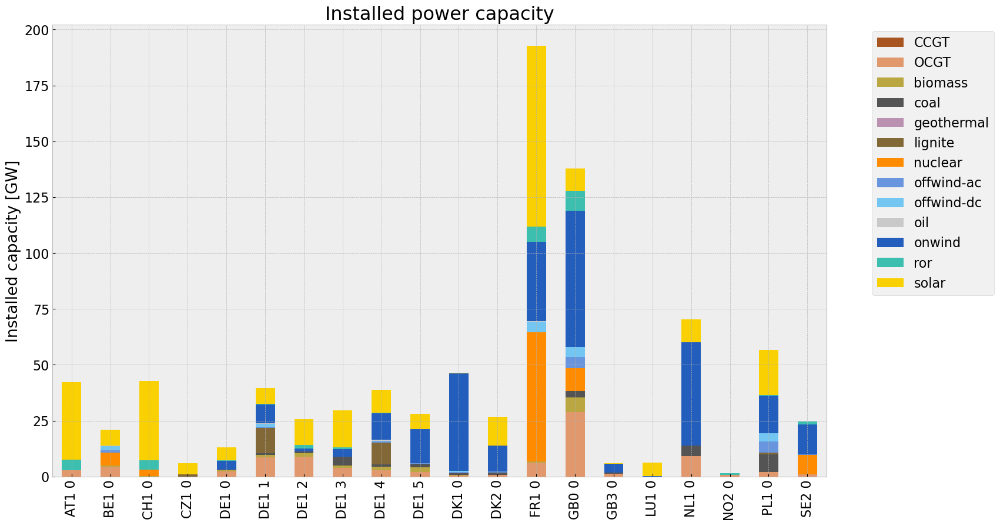

<Figure size 640x480 with 0 Axes>

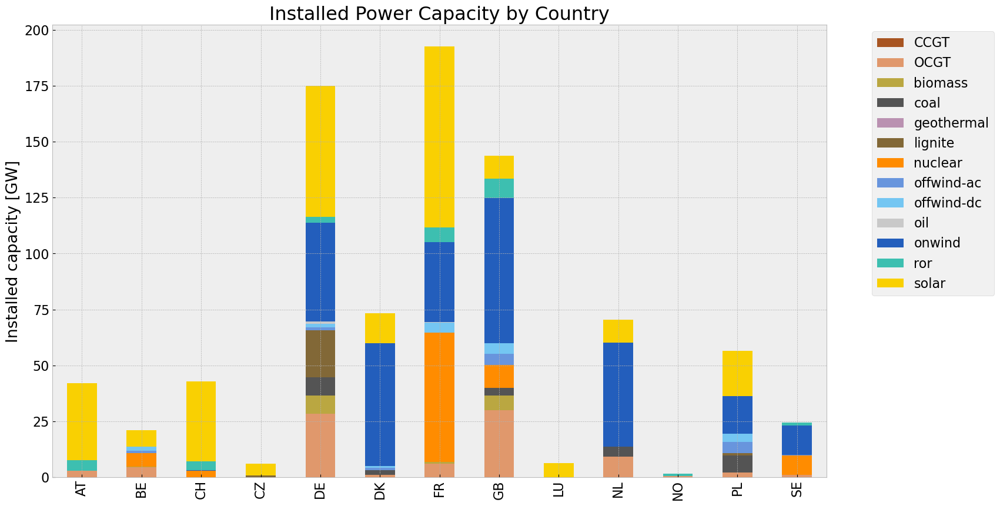

<Figure size 640x480 with 0 Axes>

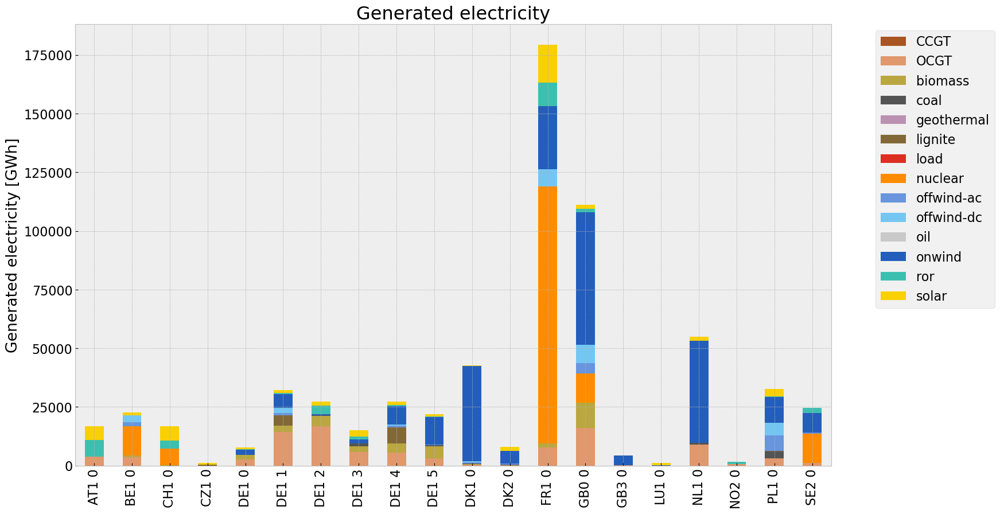

<Figure size 640x480 with 0 Axes>

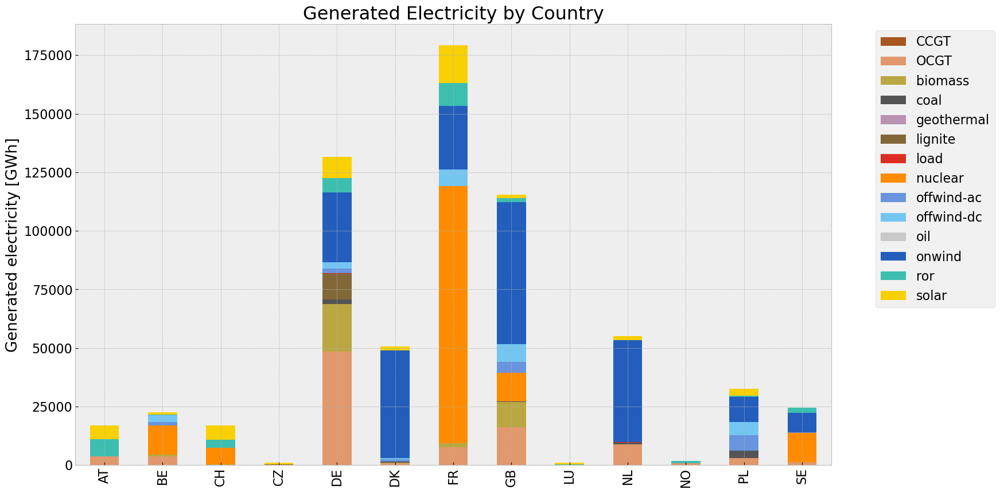

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,9.417437e+07,0.451621,0.1980,4.128801e+07
biomass,3.379979e+07,0.468000,0.0000,0.000000e+00
coal,6.576433e+06,0.329908,0.3361,6.699865e+06
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.140106e+07,0.337285,0.4069,1.375422e+07
load,5.427238e+05,1.000000,0.0000,0.000000e+00
nuclear,1.540888e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.599192e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


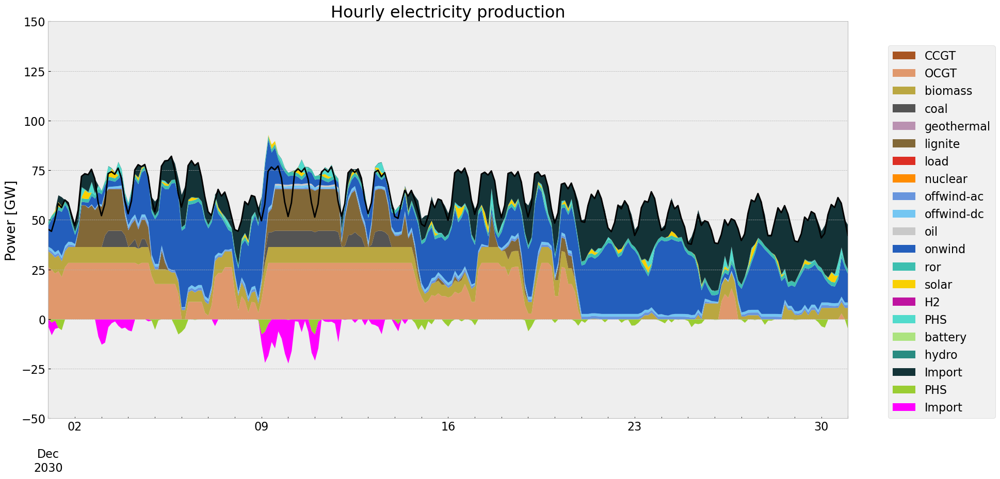

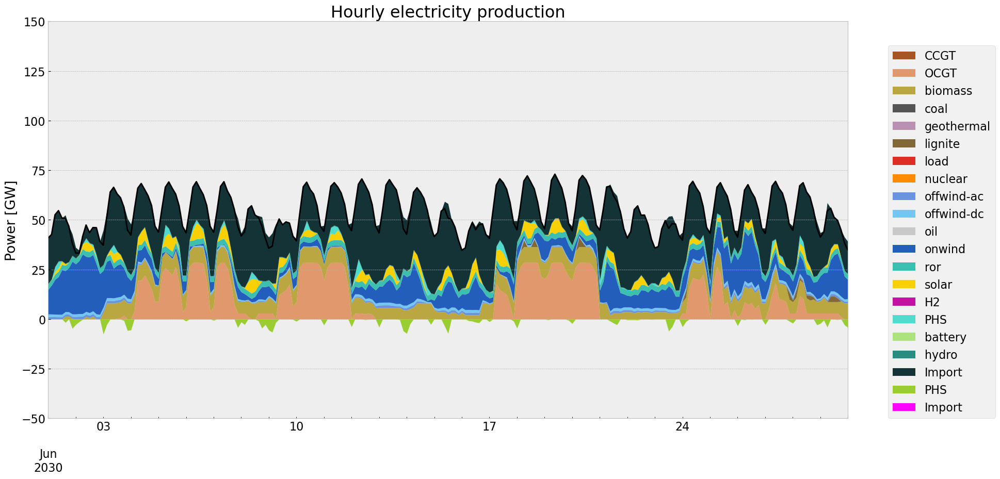

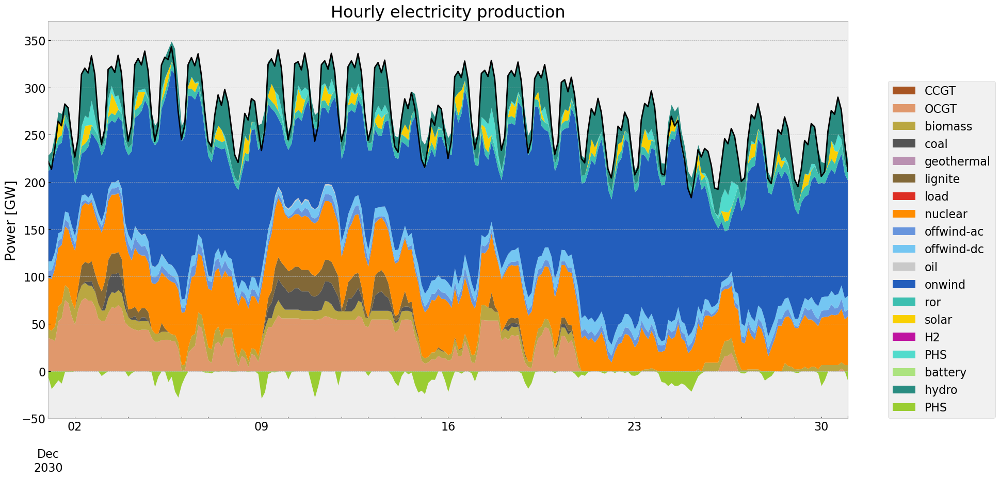

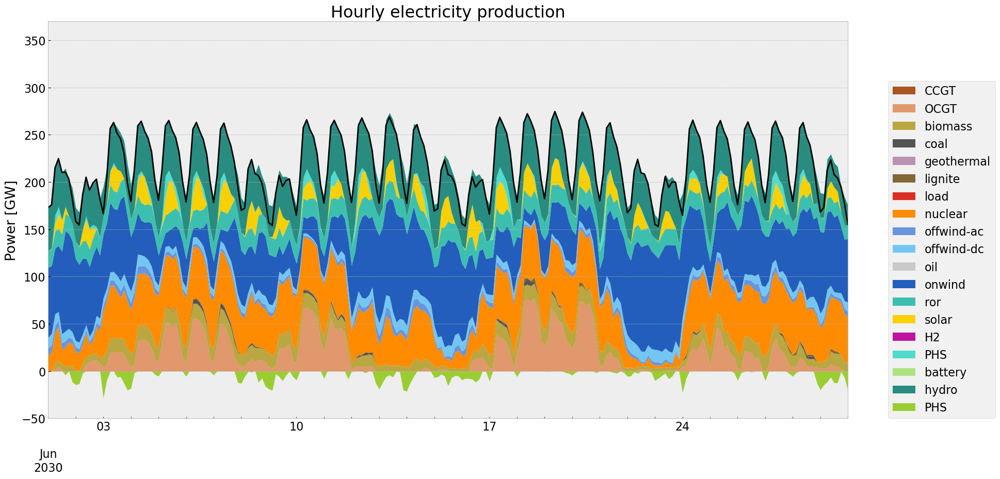

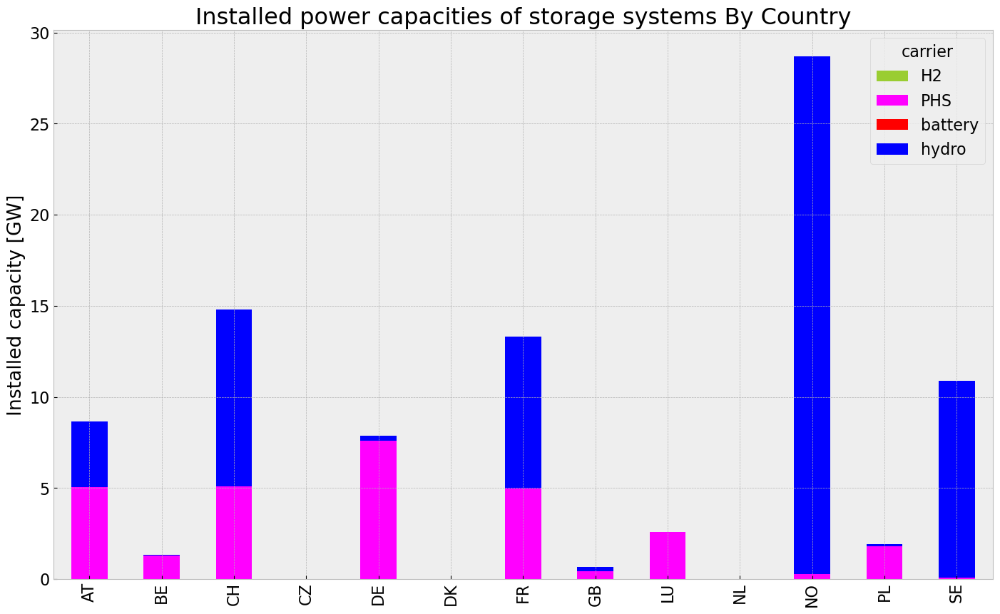

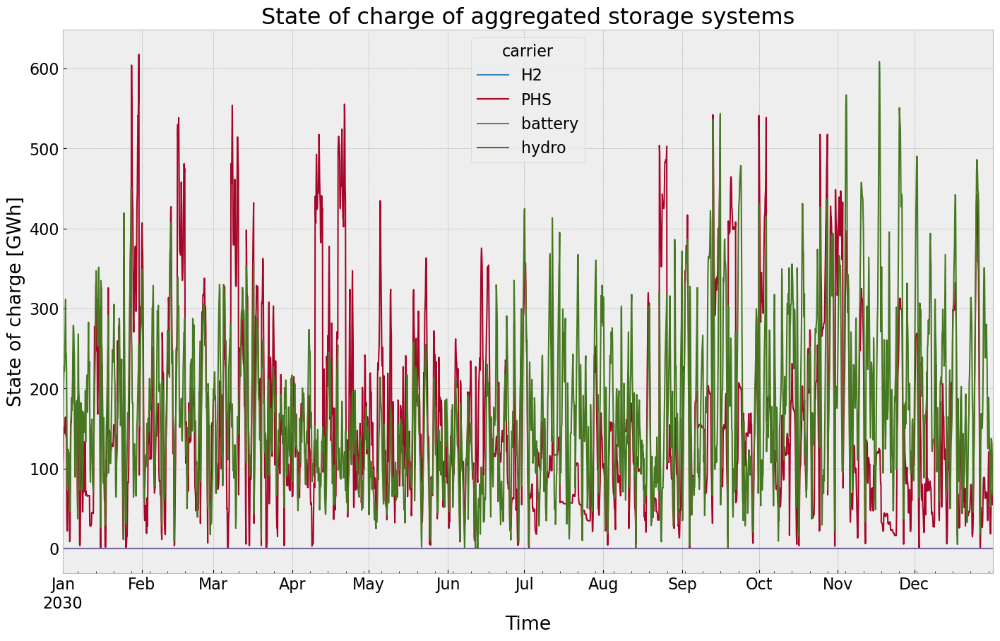

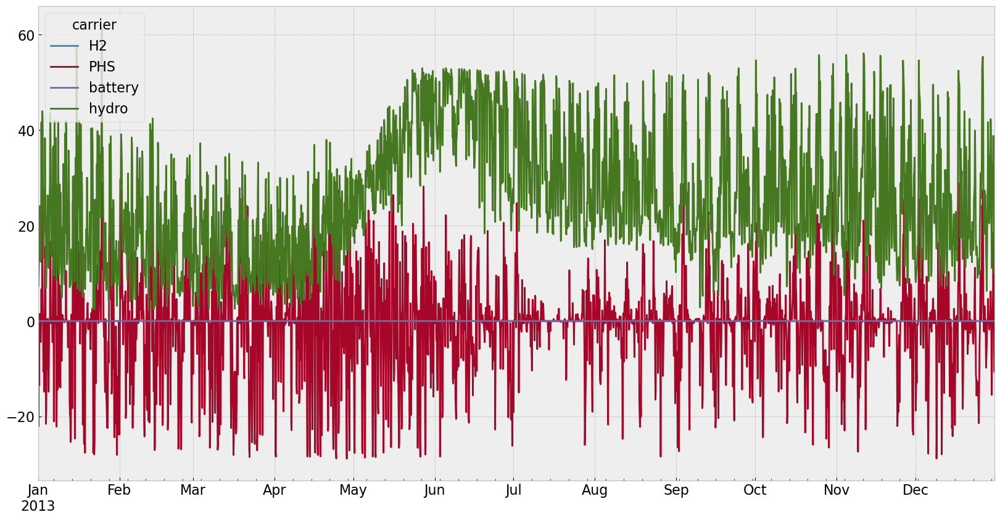

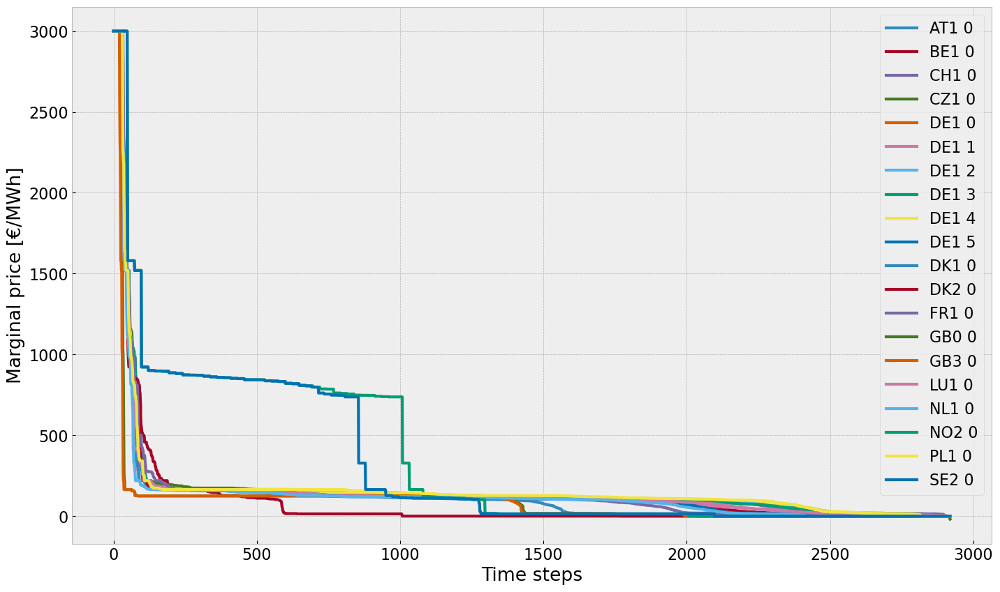

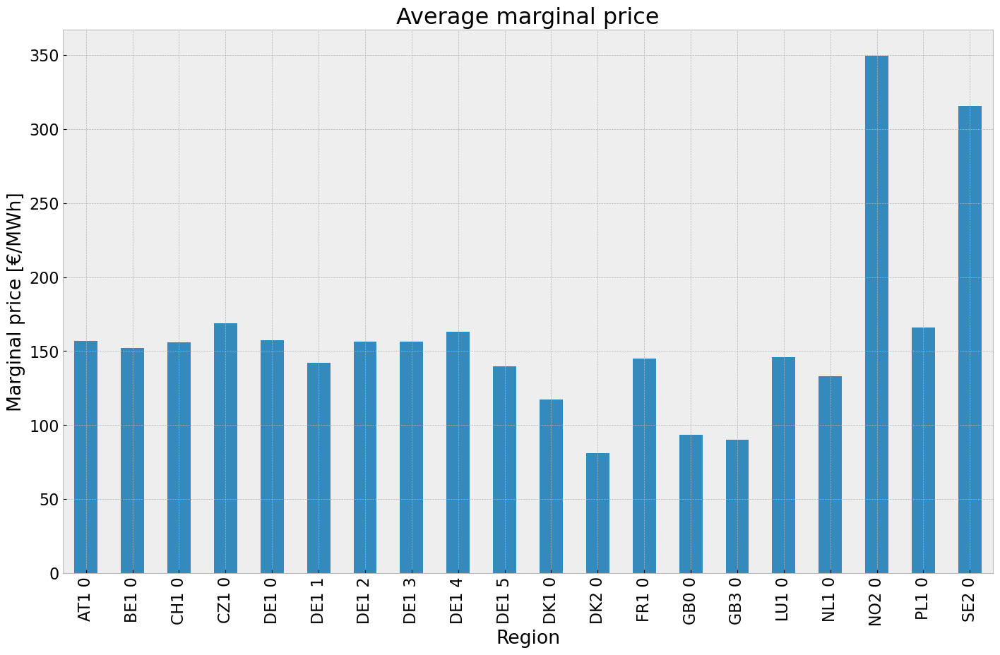

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


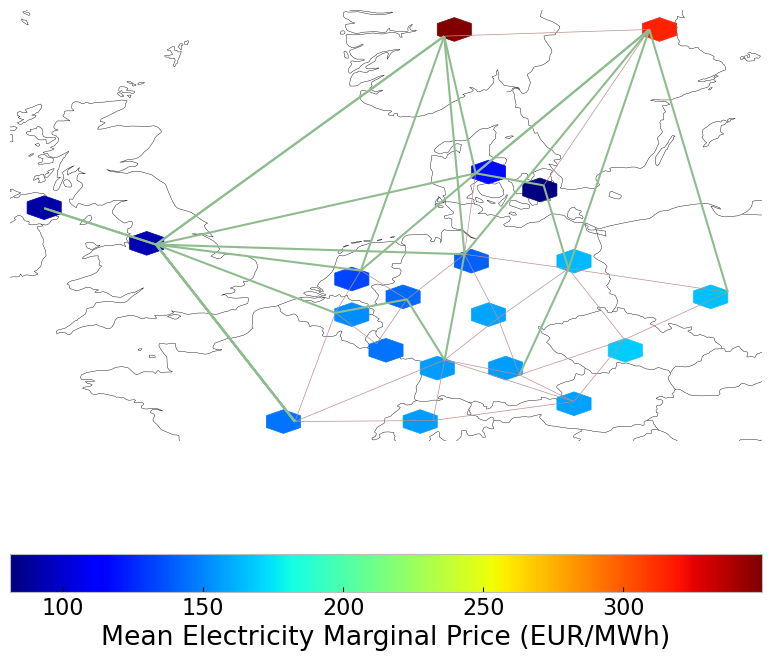

In [ ]:
# Plotting
#installed cap
#capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv_roll.fillna(0, inplace=True)
#gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv_roll = inst_cap_table(n3, color_cap)
cap_noinv_roll_country = inst_cap_table_country(n3, color_cap)

#Generation table
# consolidated generation table
#carrier = n3.generators.carrier.unique()
#df_tot_generation = n3.generators_t.p.sum()

#generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
       # key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')
#generations.fillna(0, inplace=True)

#gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)
gen_noinv_roll_country = gen_power_table_country(n3,colors_gen_table)

#Snapshot Summer and Winter
#p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
#sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen,'DE')
#generation curve all countries
#winter
gen_curve_tot(n3, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
store_noinv_roll = inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

In [ ]:
e_balance = n3.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :]
#e_balance.head()
e_balance.to_csv('energy_balance_DE_offwind.csv', sep=',', index=True, header=True, encoding='utf-8')

# Scenario Analysis

## Installed Capacity

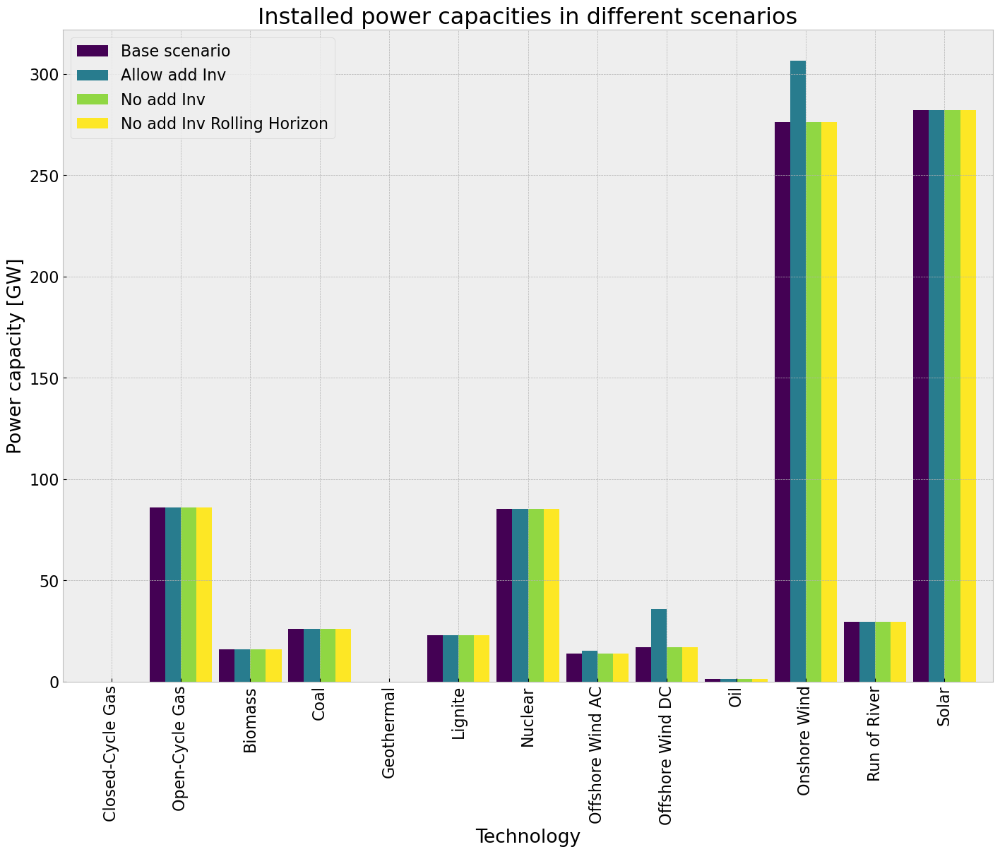

In [ ]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [ ]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,85.854585,85.854585,85.854585,85.854585
Biomass,15.977059,15.977059,15.977059,15.977059
Coal,25.968677,25.968677,25.968677,25.968677
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,22.848983,22.848983,22.848983,22.848983
Nuclear,85.354000,85.354000,85.354000,85.354000
Offshore Wind AC,13.835970,15.364383,13.835970,13.835970
Offshore Wind DC,16.947674,35.881308,16.947674,16.947674


## Power Generation

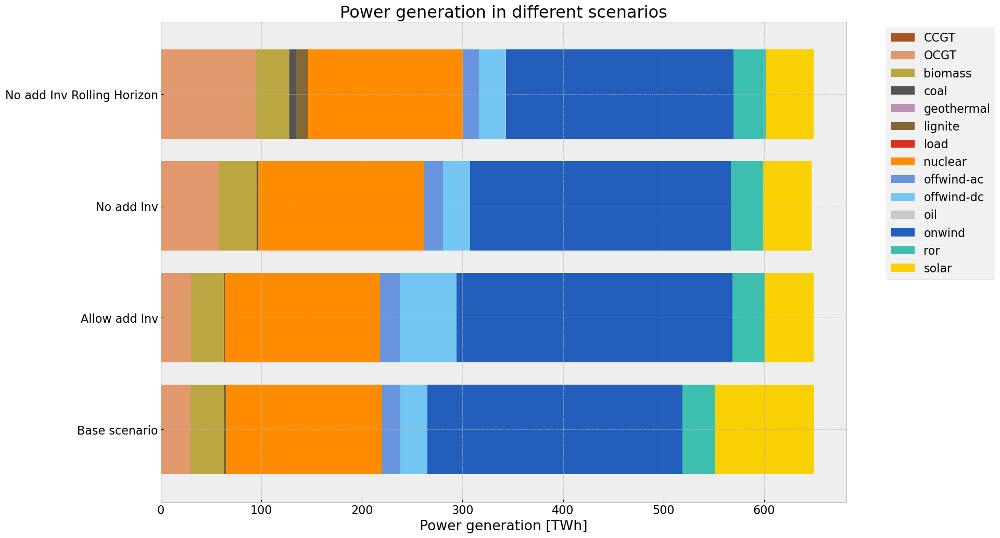

In [ ]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Installed Storage Capacities

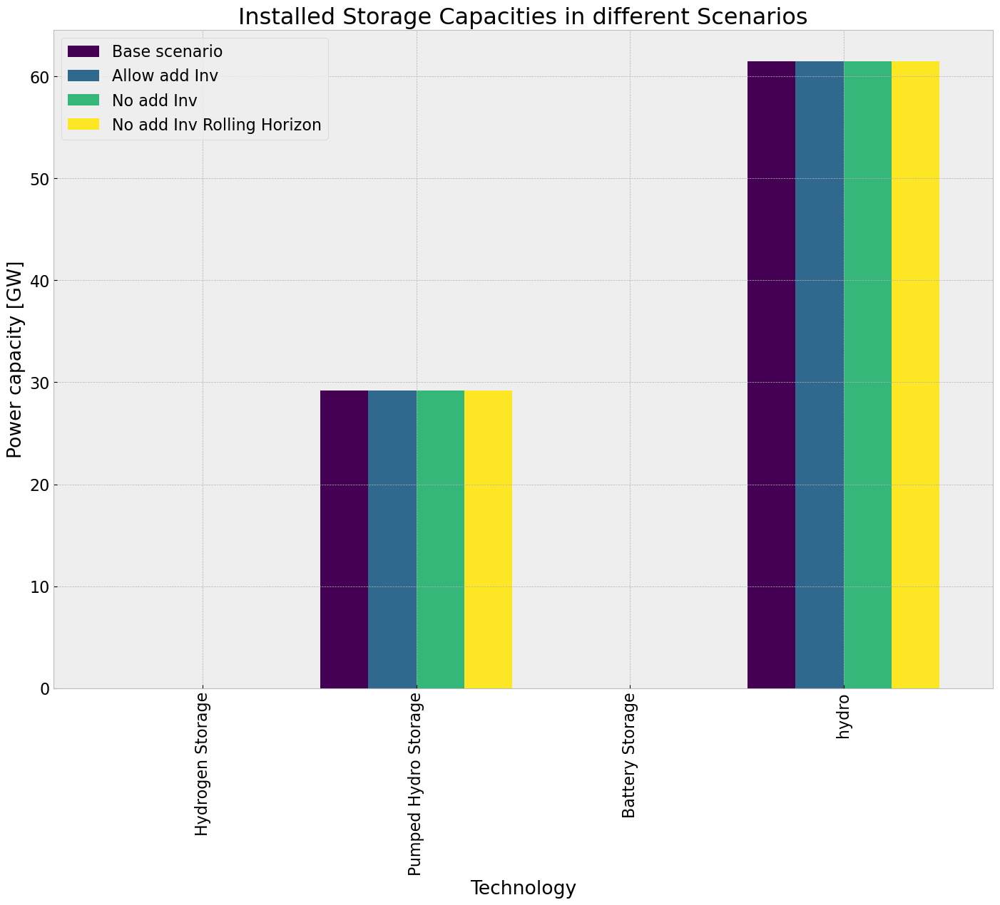

In [ ]:
comp_inst_store = pd.DataFrame(index=store_base.unstack().columns)

comp_inst_store["Base scenario"] = store_base.groupby("carrier").sum()
comp_inst_store["Allow add Inv"] = store_inv.groupby("carrier").sum()
comp_inst_store["No add Inv"] = store_noinv.groupby("carrier").sum()
comp_inst_store["No add Inv Rolling Horizon"] = store_noinv_roll.groupby("carrier").sum()

comp_inst_store.rename(index = {"battery": "Battery Storage"}, inplace=True)
comp_inst_store.rename(index = {"H2": "Hydrogen Storage"}, inplace=True)
comp_inst_store.rename(index = {"Hydro": "Reservoir & Dam"}, inplace=True)
comp_inst_store.rename(index = {"PHS": "Pumped Hydro Storage"}, inplace=True)


comp_inst_store.fillna(0, inplace=True)

comp_inst_store.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 1, len(comp_inst_store))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed Storage Capacities in different Scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

## System Cost

In [ ]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

#comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


#comp_system_cost = comp_system_cost   #Million eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)
comp_system_cost = comp_system_cost.div(1e3) # Billion €

#move load shedding to the last col
# Specify the column name to move
column_to_move = 'Load shedding'

# Create a new list of column names without the column to move
new_columns = [col for col in comp_system_cost.columns if col != column_to_move]

# Append the column to move to the end
new_columns.append(column_to_move)

# Reorder the columns
comp_system_cost = comp_system_cost[new_columns]


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1871120118.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\1871120118.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


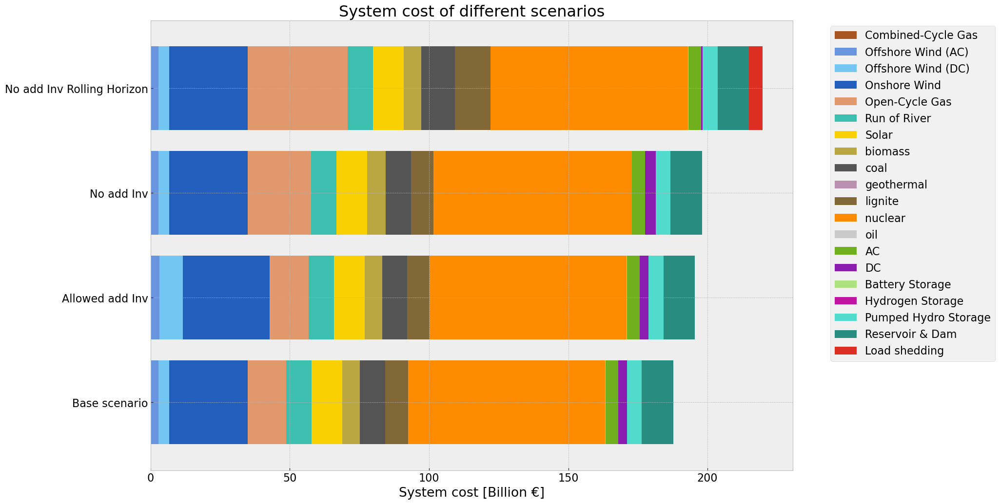

In [ ]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="System cost [Billion €]",
                        title=f"System cost of different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [ ]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [ ]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


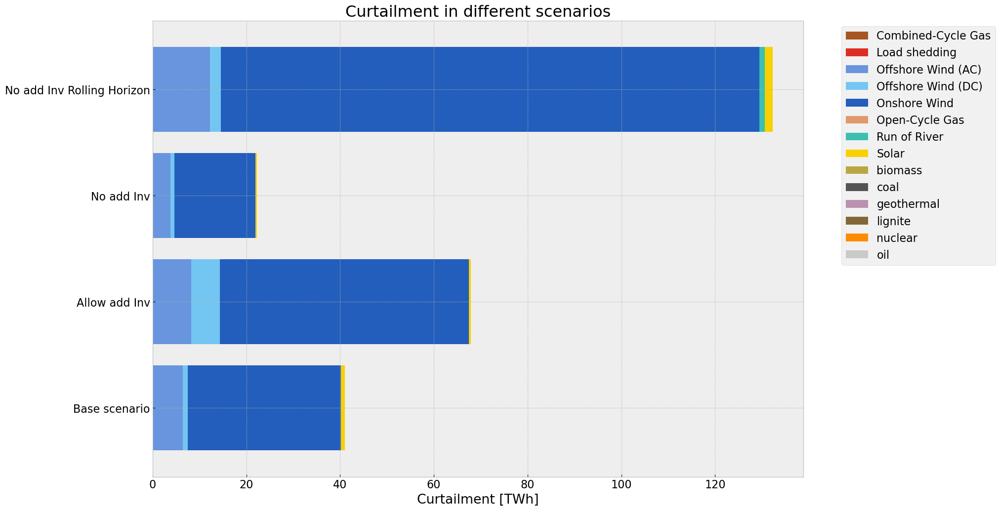

In [ ]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_13144\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


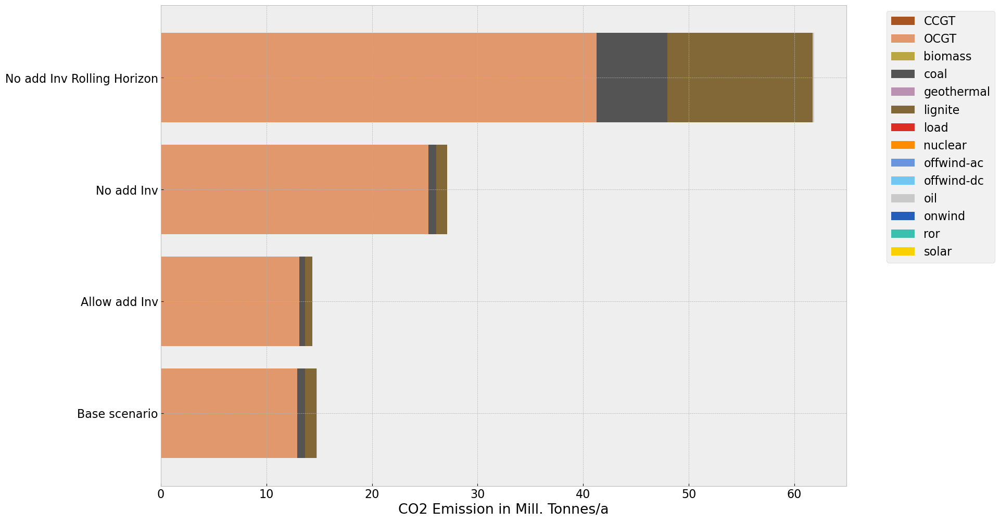

In [ ]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()